<a href="https://colab.research.google.com/github/elangptra/music_classification/blob/main/Klasifikasi_genre_musik.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("andradaolteanu/gtzan-dataset-music-genre-classification")

print("Path to dataset files:", path)

100%|██████████| 1.21G/1.21G [00:16<00:00, 79.9MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1


In [ ]:
import shutil

# Path folder yang ingin dihapus
folder_path = "/content/GTZAN/genres_augmented"

# Hapus folder dan seluruh isinya
try:
    shutil.rmtree(folder_path)
    print(f"Folder {folder_path} berhasil dihapus.")
except FileNotFoundError:
    print(f"Folder {folder_path} tidak ditemukan.")
except Exception as e:
    print(f"Terjadi kesalahan: {e}")

Folder /content/GTZAN/genres_augmented berhasil dihapus.


In [ ]:
import shutil

# Path sumber dari `kagglehub`
source_path = "/content/GTZAN/Data/genres_original"
target_path = "/content/GTZAN"

# Pindahkan semua file
shutil.move(source_path, target_path)

print(f"Dataset berhasil dipindahkan ke {target_path}")

Dataset berhasil dipindahkan ke /content/GTZAN


In [ ]:
import librosa
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import csv
import base64
from IPython.display import HTML
from IPython.display import FileLink

Preprocessing

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
import sklearn.model_selection as skms

In [ ]:
import keras
from keras import models
from keras import layers
from tensorflow import keras
from warnings import filterwarnings

In [ ]:
for dirname, _, filenames in os.walk('/content/drive/MyDrive/dataset'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/content/drive/MyDrive/dataset/hiphop/hiphop.00013.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00007.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00006.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00012.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00004.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00009.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00003.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00011.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00008.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00010.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00005.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00000.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00002.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00001.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00018.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00023.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00016.wav
/content/drive/MyDrive/dataset/hiphop/hiphop.00027.wav
/content/d

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Data Preparation

In [ ]:
general_path = '/content/drive/MyDrive/dataset'
print(list(os.listdir(f'{general_path}')))

['hiphop', 'country', 'classical', 'rock', 'pop', 'jazz', 'reggae', 'disco', 'blues', 'metal', 'genres_augmented']


In [ ]:
import os
import numpy as np
import librosa
from scipy.signal import fftconvolve
import soundfile as sf

# Path ke folder dataset
input_dir = '/content/drive/MyDrive/dataset'
output_dir = '/content/drive/MyDrive/dataset/genres_augmented'

# Validasi folder input dan buat folder output
if not os.path.exists(input_dir):
    raise FileNotFoundError(f"Folder input {input_dir} tidak ditemukan.")
os.makedirs(output_dir, exist_ok=True)

# Fungsi augmentasi
def pitch_shift_positive(data, sr, n_steps=2):
    return librosa.effects.pitch_shift(y=data, sr=sr, n_steps=n_steps)

def pitch_shift_negative(data, sr, n_steps=-2):
    return librosa.effects.pitch_shift(y=data, sr=sr, n_steps=n_steps)

def add_reverb(data, sr, ir_file=None):
    """
    Menambahkan efek reverb ke sinyal audio menggunakan impulse response (IR).
    :param data: Sinyal audio asli.
    :param sr: Sample rate dari audio.
    :param ir_file: Path ke file impulse response (IR). Jika None, gunakan IR default.
    :return: Sinyal audio dengan efek reverb.
    """
    if ir_file is None:
        # Gunakan impulse response default (contoh IR pendek)
        ir = np.zeros(int(sr * 0.5))  # Durasi IR 0.5 detik
        ir[0] = 1.0  # Impuls pertama (direct sound)
        ir[int(sr * 0.1)] = 0.6  # Pantulan pertama setelah 0.1 detik
        ir[int(sr * 0.2)] = 0.3  # Pantulan kedua setelah 0.2 detik
    else:
        # Muat file IR eksternal jika diberikan
        ir, _ = librosa.load(ir_file, sr=sr, mono=True)

    # Normalisasi IR agar tidak menyebabkan clipping
    ir = ir / np.max(np.abs(ir))

    # Convolve audio dengan IR untuk menambahkan reverb
    reverb_data = fftconvolve(data, ir, mode='full')

    # Potong hasil convolution agar sesuai dengan panjang audio asli
    reverb_data = reverb_data[:len(data)]

    # Normalisasi hasil akhir agar tidak overamplifikasi
    reverb_data = reverb_data / np.max(np.abs(reverb_data))

    return reverb_data

# Proses augmentasi
genres = os.listdir(input_dir)
for genre in genres:
    genre_dir = os.path.join(input_dir, genre)
    if os.path.isdir(genre_dir):
        genre_output_dir = os.path.join(output_dir, genre)
        os.makedirs(genre_output_dir, exist_ok=True)

        for filename in os.listdir(genre_dir):
            if filename.endswith('.wav'):
                input_path = os.path.join(genre_dir, filename)
                try:
                    data, sr = librosa.load(input_path, sr=None)
                except Exception as e:
                    print(f"Kesalahan saat memproses {input_path}: {e}")
                    continue

                # Augmentasi
                augmented_data = {
                    'original': data,
                    'pitch_positive': pitch_shift_positive(data, sr),
                    'pitch_negative': pitch_shift_negative(data, sr),
                    'reverb': add_reverb(data, sr),  # Tambahkan efek reverb
                }

                # Simpan hasil augmentasi
                for aug_type, aug_data in augmented_data.items():
                    output_filename = f"{os.path.splitext(filename)[0]}_{aug_type}.wav"
                    output_path = os.path.join(genre_output_dir, output_filename)
                    sf.write(output_path, aug_data, sr)
                    print(f"File {aug_type} disimpan ke {output_path}")

print("Proses augmentasi selesai.")

File original disimpan ke /content/drive/MyDrive/dataset/genres_augmented/hiphop/hiphop.00013_original.wav
File pitch_positive disimpan ke /content/drive/MyDrive/dataset/genres_augmented/hiphop/hiphop.00013_pitch_positive.wav
File pitch_negative disimpan ke /content/drive/MyDrive/dataset/genres_augmented/hiphop/hiphop.00013_pitch_negative.wav
File reverb disimpan ke /content/drive/MyDrive/dataset/genres_augmented/hiphop/hiphop.00013_reverb.wav
File original disimpan ke /content/drive/MyDrive/dataset/genres_augmented/hiphop/hiphop.00007_original.wav
File pitch_positive disimpan ke /content/drive/MyDrive/dataset/genres_augmented/hiphop/hiphop.00007_pitch_positive.wav
File pitch_negative disimpan ke /content/drive/MyDrive/dataset/genres_augmented/hiphop/hiphop.00007_pitch_negative.wav
File reverb disimpan ke /content/drive/MyDrive/dataset/genres_augmented/hiphop/hiphop.00007_reverb.wav
File original disimpan ke /content/drive/MyDrive/dataset/genres_augmented/hiphop/hiphop.00006_original.w

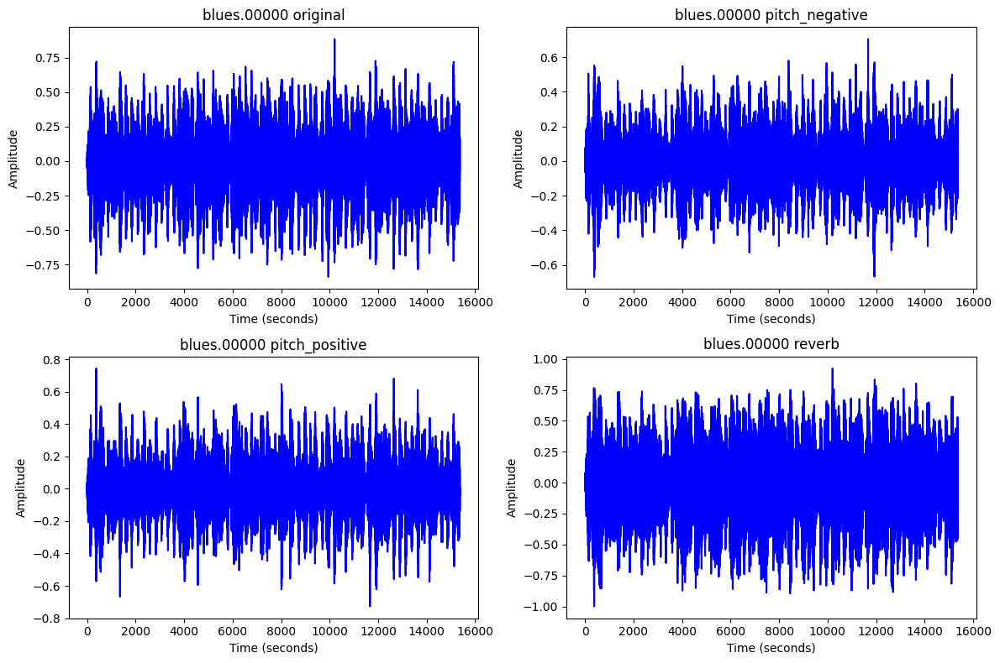

In [ ]:
import librosa
import matplotlib.pyplot as plt
import soundfile as sf

# File audio yang akan divisualisasikan
audio_files = [
    '/content/drive/MyDrive/dataset/genres_augmented/blues/blues.00000_original.wav',
    '/content/drive/MyDrive/dataset/genres_augmented/blues/blues.00000_pitch_negative.wav',
    '/content/drive/MyDrive/dataset/genres_augmented/blues/blues.00000_pitch_positive.wav',
    '/content/drive/MyDrive/dataset/genres_augmented/blues/blues.00000_reverb.wav'
]

# Judul untuk setiap file
titles = [
    "blues.00000 original",
    "blues.00000 pitch_negative",
    "blues.00000 pitch_positive",
    "blues.00000 reverb"
]

# Membuat plot
plt.figure(figsize=(12, 8))
for i, (file, title) in enumerate(zip(audio_files, titles), 1):
    try:
        # Membaca file audio
        data, sr = librosa.load(file, sr=None)
        time = librosa.times_like(data, sr=sr)

        # Subplot untuk waveform
        plt.subplot(2, 2, i)
        plt.plot(time, data, color='blue')
        plt.title(title)
        plt.xlabel('Time (seconds)')
        plt.ylabel('Amplitude')
        plt.tight_layout()
    except Exception as e:
        print(f"Error processing file {file}: {e}")

plt.show()

Dimensi MFCC: (13, 1293)


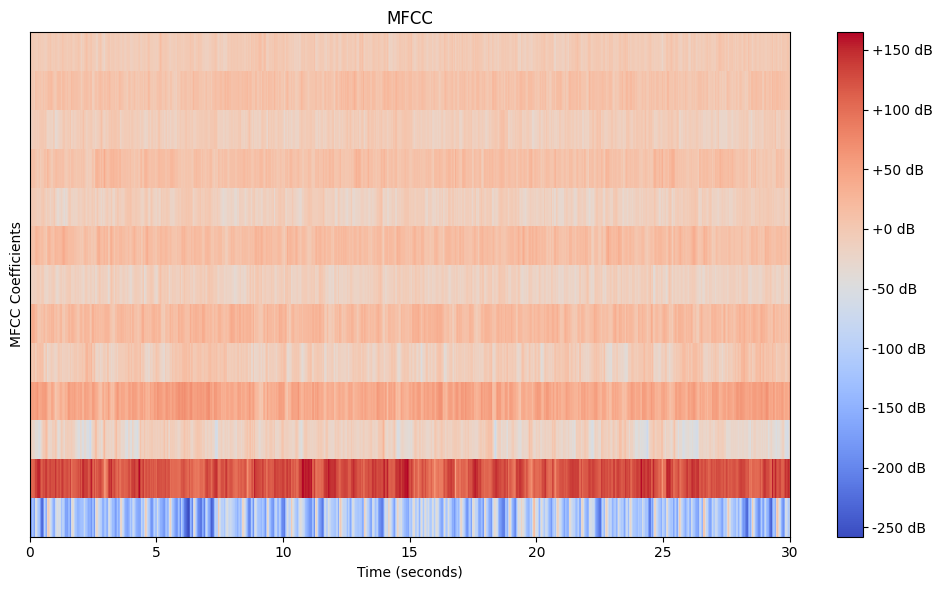

In [ ]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

# Pilih salah satu file audio
audio_file = '/content/drive/MyDrive/dataset/genres_augmented/blues/blues.00000_original.wav'

# Membaca file audio
data, sr = librosa.load(audio_file, sr=None)

# Ekstraksi fitur MFCC
n_mfcc = 13  # Jumlah koefisien MFCC yang akan diekstrak
mfcc = librosa.feature.mfcc(y=data, sr=sr, n_mfcc=n_mfcc)

# Menampilkan dimensi MFCC
print("Dimensi MFCC:", mfcc.shape)

# Visualisasi MFCC
plt.figure(figsize=(10, 6))
librosa.display.specshow(mfcc, x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('MFCC')
plt.xlabel('Time (seconds)')
plt.ylabel('MFCC Coefficients')
plt.tight_layout()
plt.show()

Segmentasi 5 detik menghasilkan 6 segmen penuh
Dimensi MFCC segmen ke-1 (5 detik): (13, 216)


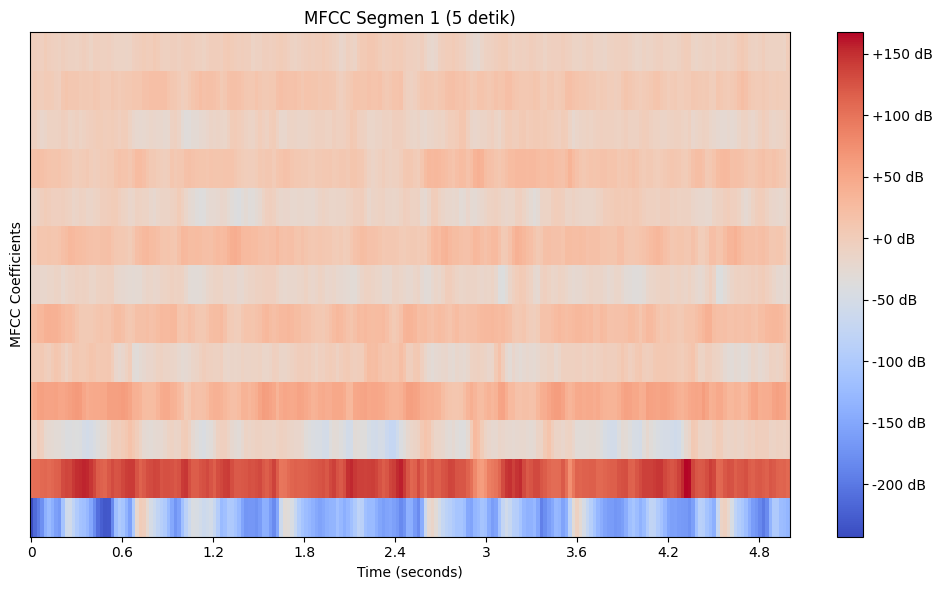

Dimensi MFCC segmen ke-2 (5 detik): (13, 216)


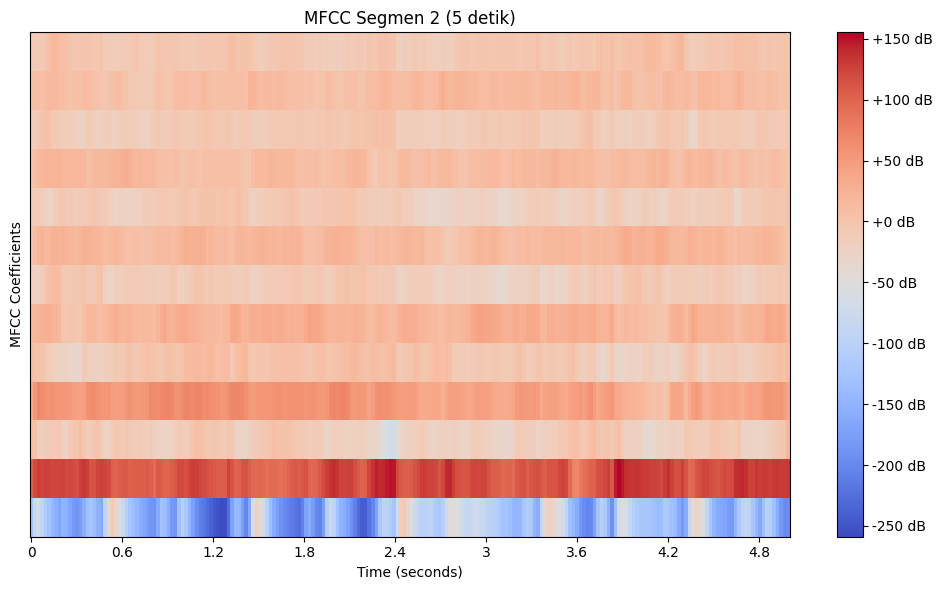

Dimensi MFCC segmen ke-3 (5 detik): (13, 216)


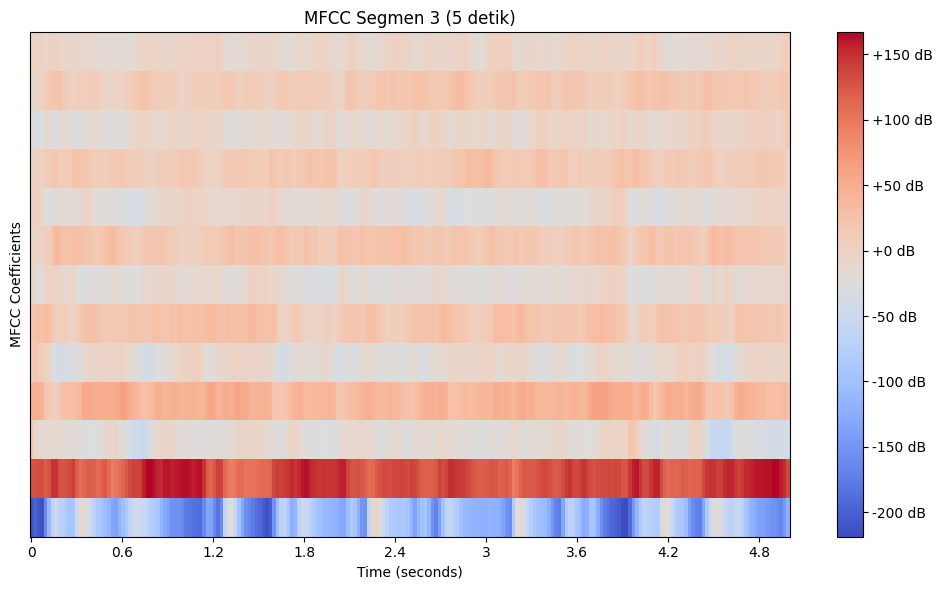

Dimensi MFCC segmen ke-4 (5 detik): (13, 216)


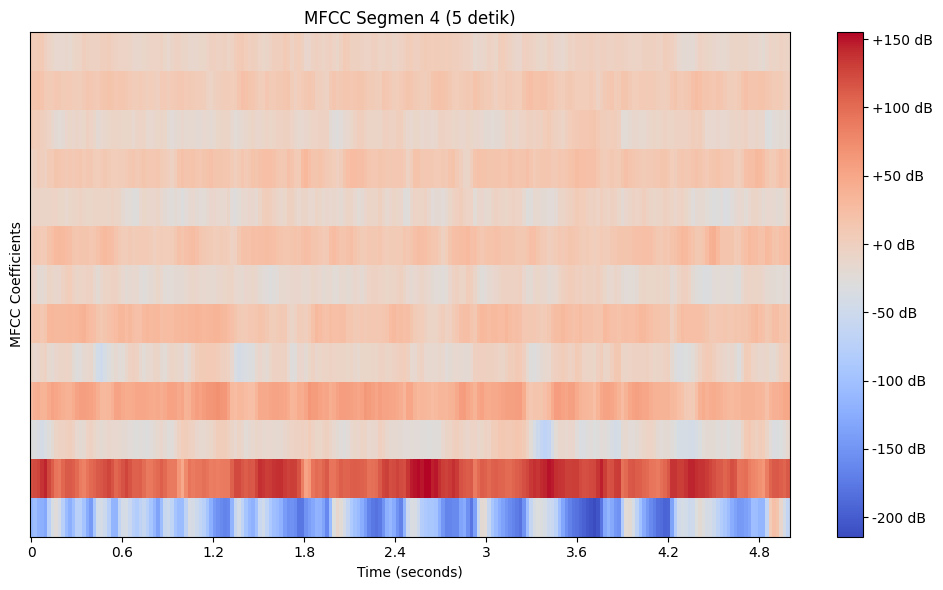

Dimensi MFCC segmen ke-5 (5 detik): (13, 216)


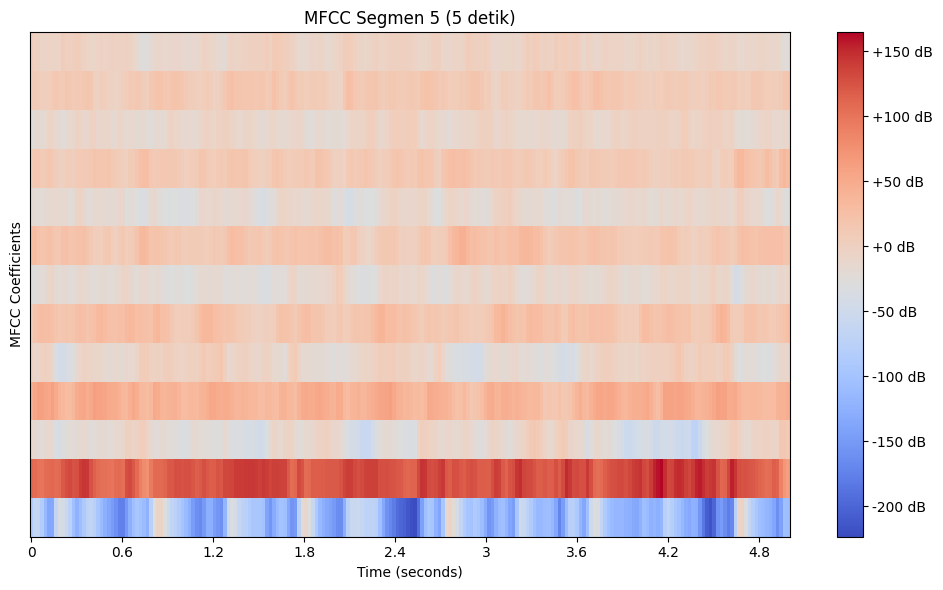

Dimensi MFCC segmen ke-6 (5 detik): (13, 216)


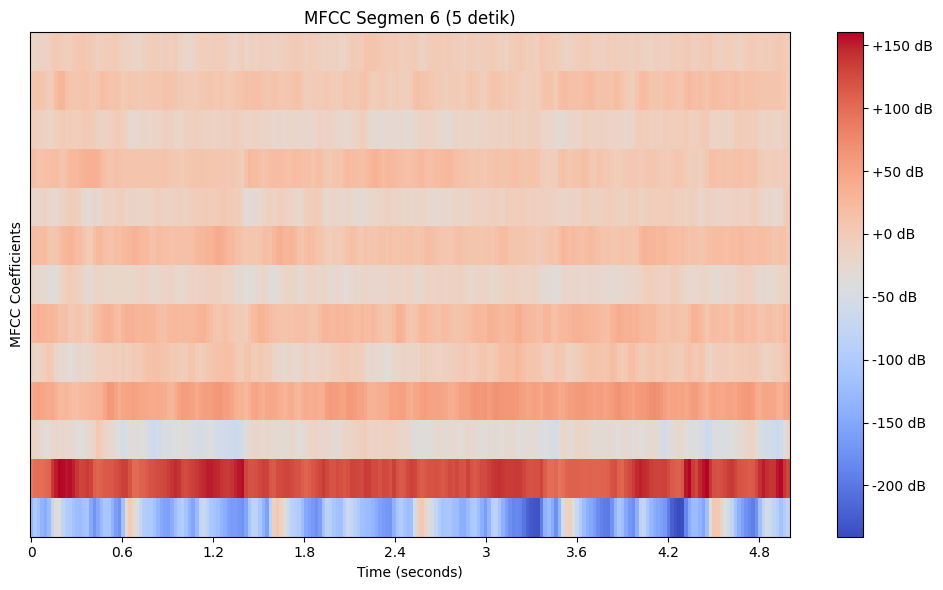

Segmentasi 10 detik menghasilkan 3 segmen penuh
Dimensi MFCC segmen ke-1 (10 detik): (13, 431)


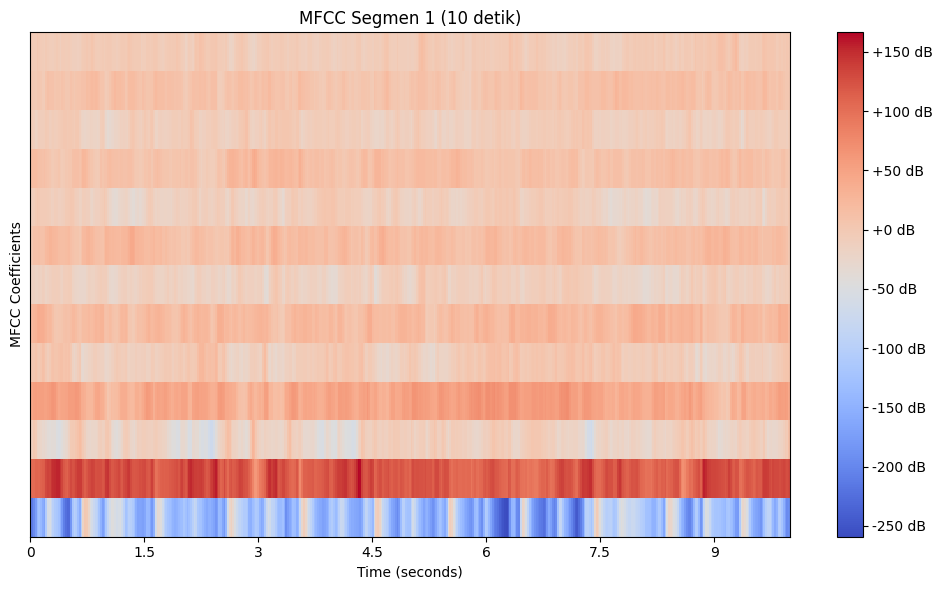

Dimensi MFCC segmen ke-2 (10 detik): (13, 431)


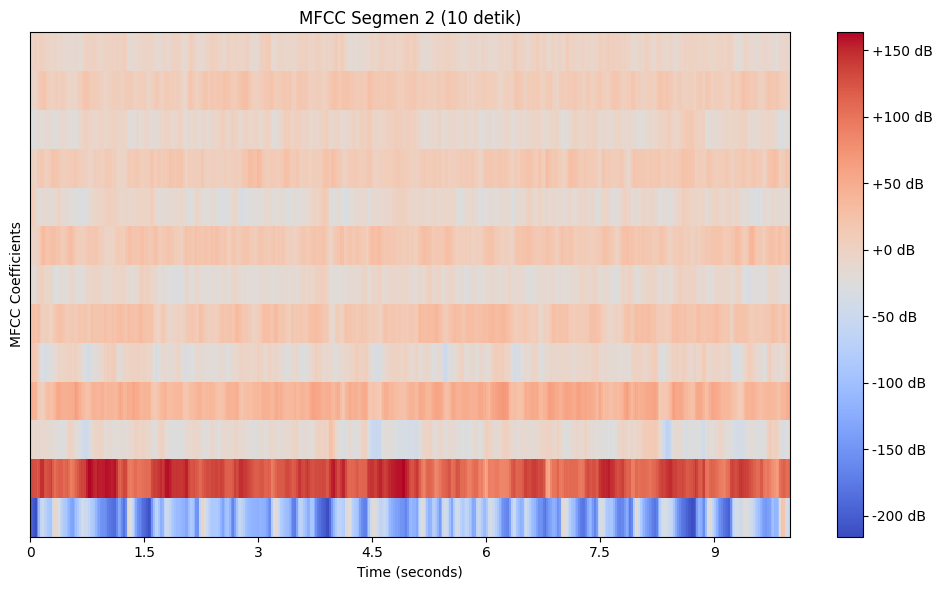

Dimensi MFCC segmen ke-3 (10 detik): (13, 431)


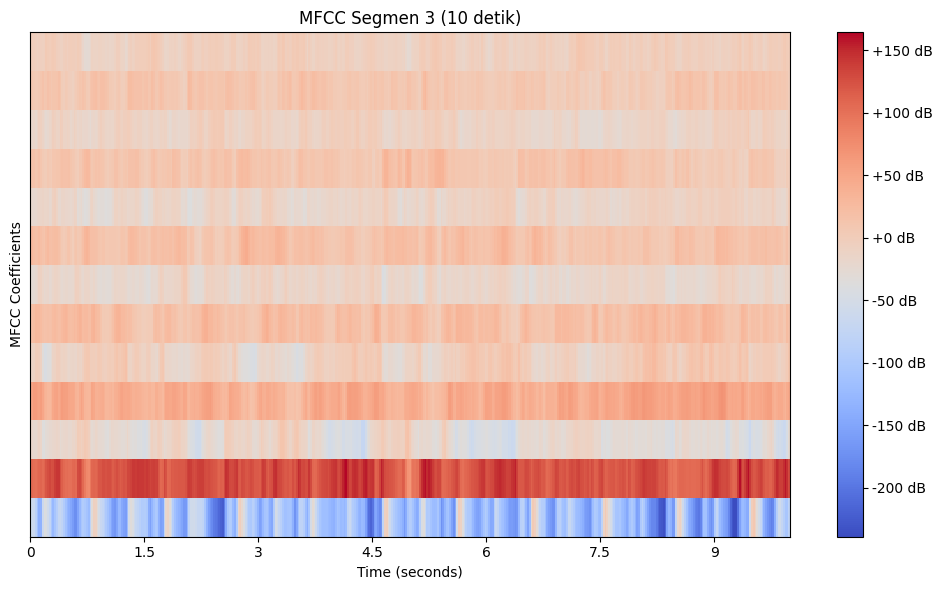

In [ ]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

# Pilih salah satu file audio
audio_file = '/content/drive/MyDrive/dataset/genres_augmented/blues/blues.00000_original.wav'

# Membaca file audio
data, sr = librosa.load(audio_file, sr=None)

# Fungsi untuk membagi audio menjadi segmen
def segment_audio(data, sr, segment_duration):
    segment_length = int(segment_duration * sr)  # Panjang segmen dalam sampel
    return [data[i:i + segment_length] for i in range(0, len(data), segment_length)]

# Segmentasi audio dengan durasi 5 detik
segments_5s = [seg for seg in segment_audio(data, sr, segment_duration=5) if len(seg) == sr * 5]

# Segmentasi audio dengan durasi 10 detik
segments_10s = [seg for seg in segment_audio(data, sr, segment_duration=10) if len(seg) == sr * 10]

# n_fft dan hop_length untuk ekstraksi MFCC
n_fft = 2048
hop_length = 512

# Proses dan visualisasi MFCC untuk setiap segmen 5 detik
print(f"Segmentasi 5 detik menghasilkan {len(segments_5s)} segmen penuh")
for idx, segment in enumerate(segments_5s):
    if len(segment) < sr * 5:  # Jika segmen tidak penuh, abaikan
        continue
    mfcc = librosa.feature.mfcc(y=segment, sr=sr, n_mfcc=13, n_fft=n_fft, hop_length=hop_length)
    print(f"Dimensi MFCC segmen ke-{idx + 1} (5 detik):", mfcc.shape)

    # Visualisasi MFCC
    plt.figure(figsize=(10, 6))
    librosa.display.specshow(mfcc, x_axis='time', sr=sr, hop_length=hop_length)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'MFCC Segmen {idx + 1} (5 detik)')
    plt.xlabel('Time (seconds)')
    plt.ylabel('MFCC Coefficients')
    plt.tight_layout()
    plt.show()

# Proses dan visualisasi MFCC untuk setiap segmen 10 detik
print(f"Segmentasi 10 detik menghasilkan {len(segments_10s)} segmen penuh")
for idx, segment in enumerate(segments_10s):
    if len(segment) < sr * 10:  # Jika segmen tidak penuh, abaikan
        continue
    mfcc = librosa.feature.mfcc(y=segment, sr=sr, n_mfcc=13, n_fft=n_fft, hop_length=hop_length)
    print(f"Dimensi MFCC segmen ke-{idx + 1} (10 detik):", mfcc.shape)

    # Visualisasi MFCC
    plt.figure(figsize=(10, 6))
    librosa.display.specshow(mfcc, x_axis='time', sr=sr, hop_length=hop_length)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'MFCC Segmen {idx + 1} (10 detik)')
    plt.xlabel('Time (seconds)')
    plt.ylabel('MFCC Coefficients')
    plt.tight_layout()
    plt.show()

In [ ]:
general_path = '/content/drive/MyDrive/dataset/genres_augmented'
print(list(os.listdir(f'{general_path}')))

['hiphop', 'country', 'classical', 'rock', 'pop', 'jazz', 'reggae', 'disco', 'blues', 'metal', '.ipynb_checkpoints']


# Testing 1, Failed (Segmentation to drive > 1 MFCC = 1 npy, load 1 tahun pun tak selesai)

## Ekstraksi Fitur

In [ ]:
import os
import librosa
import numpy as np
import pandas as pd
import json
from tqdm import tqdm

# Path ke folder dataset
general_path = '/content/drive/MyDrive/dataset/genres_augmented'
output_csv = '/content/drive/MyDrive/dataset/segmented_audio.csv'
output_json = '/content/drive/MyDrive/dataset/segmented_audio.json'
output_npy_dir = '/content/drive/MyDrive/dataset/mfcc_npy'  # Direktori untuk menyimpan MFCC sebagai .npy

# Parameter segmentasi dan ekstraksi fitur
segment_duration = 5  # Durasi segmentasi dalam detik
n_mfcc = 13  # Jumlah MFCC yang diekstrak
n_fft = 2048
hop_length = 512

# Pastikan folder output ada
os.makedirs(output_npy_dir, exist_ok=True)

# Menampung hasil segmentasi
data_segments = []

# Loop melalui setiap genre
genres = os.listdir(general_path)
for genre in genres:
    genre_dir = os.path.join(general_path, genre)
    if os.path.isdir(genre_dir):
        print(f"Memproses genre: {genre}")

        # Loop melalui setiap file dalam genre
        for filename in tqdm(os.listdir(genre_dir)):
            if filename.endswith('.wav'):
                file_path = os.path.join(genre_dir, filename)

                try:
                    # Load audio file
                    data, sr = librosa.load(file_path, sr=None)

                    # Segmentasi audio
                    segment_length = int(segment_duration * sr)
                    num_segments = len(data) // segment_length

                    # Proses setiap segmen
                    for idx in range(num_segments):
                        start_sample = idx * segment_length
                        finish_sample = start_sample + segment_length
                        segment = data[start_sample:finish_sample]

                        if len(segment) == segment_length:  # Pastikan panjang segmen sesuai
                            # Ekstraksi MFCC (format 2D)
                            mfcc = librosa.feature.mfcc(y=segment, sr=sr, n_mfcc=n_mfcc,
                                                        n_fft=n_fft, hop_length=hop_length)
                            mfcc = mfcc.T  # Transpose agar bentuknya (time_steps, n_mfcc)

                            # Simpan sebagai file .npy untuk CNN
                            npy_filename = f"{genre}_{filename}_segment{idx+1}.npy"
                            npy_path = os.path.join(output_npy_dir, npy_filename)
                            np.save(npy_path, mfcc)

                            # Simpan informasi segmen
                            segment_info = {
                                'genre': genre,
                                'filename': filename,
                                'segment_index': idx + 1,
                                'mfcc_shape': mfcc.shape,  # (time_steps, n_mfcc)
                                'npy_path': npy_path
                            }
                            data_segments.append(segment_info)

                except Exception as e:
                    print(f"Kesalahan saat memproses {file_path}: {e}")

# Simpan hasil ke CSV
csv_data = pd.DataFrame(data_segments)
csv_data.to_csv(output_csv, index=False)
print(f"Hasil segmentasi disimpan ke: {output_csv}")

# Simpan hasil ke JSON
with open(output_json, 'w') as json_file:
    json.dump(data_segments, json_file, indent=4)
print(f"Hasil segmentasi disimpan ke: {output_json}")

Memproses genre: hiphop


100%|██████████| 400/400 [02:02<00:00,  3.27it/s]


Memproses genre: country


100%|██████████| 400/400 [01:35<00:00,  4.20it/s]


Memproses genre: classical


100%|██████████| 400/400 [01:35<00:00,  4.17it/s]


Memproses genre: rock


100%|██████████| 400/400 [01:41<00:00,  3.93it/s]


Memproses genre: pop


100%|██████████| 400/400 [01:39<00:00,  4.03it/s]


Memproses genre: jazz


100%|██████████| 396/396 [01:34<00:00,  4.19it/s]


Memproses genre: reggae


100%|██████████| 400/400 [01:37<00:00,  4.11it/s]


Memproses genre: disco


100%|██████████| 400/400 [01:35<00:00,  4.17it/s]


Memproses genre: blues


100%|██████████| 400/400 [01:44<00:00,  3.83it/s]


Memproses genre: metal


100%|██████████| 400/400 [02:02<00:00,  3.27it/s]


Memproses genre: .ipynb_checkpoints


0it [00:00, ?it/s]


Hasil segmentasi disimpan ke: /content/drive/MyDrive/dataset/segmented_audio.csv
Hasil segmentasi disimpan ke: /content/drive/MyDrive/dataset/segmented_audio.json


In [ ]:
import numpy as np

# Load file .npy
data = np.load("/content/drive/MyDrive/dataset/mfcc_npy/blues_blues.00000_original.wav_segment1.npy")

# Cetak isi file
print(data)

[[-2.42435989e+02  1.02184860e+02 -9.91323280e+00 ... -3.95323420e+00
  -2.40564513e+00 -2.38090849e+00]
 [-2.12989746e+02  1.03544777e+02 -1.08341694e+01 ... -5.81353331e+00
   2.64356709e+00 -2.80662322e+00]
 [-1.95409332e+02  1.04360657e+02 -1.85501933e-01 ... -1.08171616e+01
  -5.88806272e-01 -5.28410625e+00]
 ...
 [-1.21300163e+02  1.12146225e+02 -9.27587128e+00 ... -1.12282028e+01
  -3.73891771e-01 -9.43664360e+00]
 [-1.24160522e+02  1.13861908e+02 -1.07572060e+01 ... -9.30096626e+00
  -1.10059679e+00 -1.05013084e+01]
 [-1.31217209e+02  1.09123535e+02 -8.16503239e+00 ... -3.78529596e+00
  -8.62030447e-01 -6.89443171e-01]]


In [ ]:
print(data.shape)  # Melihat bentuk array
print(data.ndim)   # Melihat jumlah dimensi array
print(data.dtype)  # Melihat tipe data array

(216, 13)
2
float32


Shape dari MFCC: (216, 13)


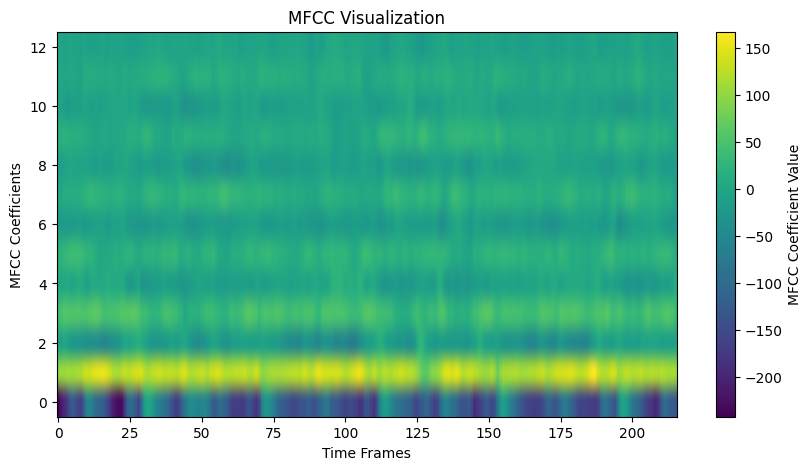

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Load file MFCC .npy
mfcc = np.load("/content/drive/MyDrive/dataset/mfcc_npy/blues_blues.00000_original.wav_segment1.npy")

print("Shape dari MFCC:", mfcc.shape)

# Transpose agar sumbu sesuai (Time Frames di X, MFCC Coefficients di Y)
mfcc = mfcc.T

# Plot MFCC sebagai heatmap
plt.figure(figsize=(10, 5))
plt.imshow(mfcc, aspect='auto', origin='lower', cmap='viridis')

# Tambahkan label dan judul yang benar
plt.colorbar(label="MFCC Coefficient Value")
plt.xlabel("Time Frames")  # Waktu di sumbu X
plt.ylabel("MFCC Coefficients")  # MFCC di sumbu Y
plt.title("MFCC Visualization")

# Tampilkan plot
plt.show()

In [ ]:
import os

file_path = "/content/drive/MyDrive/dataset/mfcc_npy/blues_blues.00000_original.wav_segment1.npy"

# Cek ukuran file dalam byte
file_size = os.path.getsize(file_path)

# Konversi ke KB atau MB untuk lebih mudah dibaca
file_size_kb = file_size / 1024  # dalam KB
file_size_mb = file_size_kb / 1024  # dalam MB

print(f"Ukuran file: {file_size} bytes ({file_size_kb:.2f} KB / {file_size_mb:.2f} MB)")


Ukuran file: 11360 bytes (11.09 KB / 0.01 MB)


## Processing Data

In [ ]:
import os
import json
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report

# === LOAD DATA ===
json_path = "/content/drive/MyDrive/dataset/segmented_audio.json"

# Muat file JSON
with open(json_path, "r") as f:
    data_segments = json.load(f)

# === PREPARE DATASET ===
X, y = [], []
genre_to_label = {}  # Untuk mapping genre ke angka

for segment in data_segments:
    npy_path = segment["npy_path"]
    genre = segment["genre"]

    # Mapping genre ke angka
    if genre not in genre_to_label:
        genre_to_label[genre] = len(genre_to_label)

    try:
        # Load MFCC dari .npy
        mfcc = np.load(npy_path)
        X.append(mfcc)
        y.append(genre_to_label[genre])
    except Exception as e:
        print(f"Error loading {npy_path}: {e}")

# Konversi ke array numpy
X = np.array(X)  # Shape: (num_samples, time_steps, n_mfcc)
y = np.array(y)  # Shape: (num_samples,)

# Pastikan input memiliki dimensi yang benar untuk CNN (tambah 1 channel)
X = X[..., np.newaxis]  # Shape: (num_samples, time_steps, n_mfcc, 1)

# One-hot encoding untuk label genre
num_classes = len(genre_to_label)
y_categorical = to_categorical(y, num_classes)

print("Dataset siap digunakan!")

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-1-1b902a4a9266>", line 30, in <cell line: 0>
    mfcc = np.load(npy_path)
           ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/numpy/lib/npyio.py", line 434, in load
    magic = fid.read(N)
            ^^^^^^^^^^^
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 2099, in showtraceback
    stb = value._render_traceback_()
          ^^^^^^^^^^^^^^^^^^^^^^^^
AttributeError: 'KeyboardInterrupt' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPyt

TypeError: object of type 'NoneType' has no len()

# Testing 2 (Segmentation to drive in 1 npz file > faster data load)

## Audio 5s Segmentation with Data Augmentation


### Feature Extraction (Single File npy)

In [ ]:
import os
import librosa
import numpy as np
import pandas as pd
import json
from tqdm import tqdm

# Path ke folder dataset
general_path = '/content/drive/MyDrive/dataset/genres_augmented'
output_csv = '/content/drive/MyDrive/dataset/segmented_audio_5s.csv'
output_json = '/content/drive/MyDrive/dataset/segmented_audio_5s.json'
output_npy = '/content/drive/MyDrive/dataset/mfcc_dataset.npz'  # File npz untuk menyimpan semua data MFCC

# Parameter segmentasi dan ekstraksi fitur
segment_duration = 5  # Durasi segmentasi dalam detik
n_mfcc = 13  # Jumlah MFCC yang diekstrak
n_fft = 2048
hop_length = 512

# Menampung hasil segmentasi
X, y = [], []
data_segments = []
genre_to_label = {}

# Loop melalui setiap genre
genres = os.listdir(general_path)
for genre in genres:
    genre_dir = os.path.join(general_path, genre)
    if os.path.isdir(genre_dir):
        print(f"Memproses genre: {genre}")

        # Mapping genre ke angka
        if genre not in genre_to_label:
            genre_to_label[genre] = len(genre_to_label)

        # Loop melalui setiap file dalam genre
        for filename in tqdm(os.listdir(genre_dir)):
            if filename.endswith('.wav'):
                file_path = os.path.join(genre_dir, filename)

                try:
                    # Load audio file
                    data, sr = librosa.load(file_path, sr=None)

                    # Segmentasi audio
                    segment_length = int(segment_duration * sr)
                    num_segments = len(data) // segment_length

                    # Proses setiap segmen
                    for idx in range(num_segments):
                        start_sample = idx * segment_length
                        finish_sample = start_sample + segment_length
                        segment = data[start_sample:finish_sample]

                        if len(segment) == segment_length:
                            # Ekstraksi MFCC (format 2D)
                            mfcc = librosa.feature.mfcc(y=segment, sr=sr, n_mfcc=n_mfcc,
                                                        n_fft=n_fft, hop_length=hop_length)
                            mfcc = mfcc.T  # Transpose agar (time_steps, n_mfcc)

                            # Simpan ke array
                            X.append(mfcc)
                            y.append(genre_to_label[genre])

                            # Simpan informasi segmen
                            segment_info = {
                                'genre': genre,
                                'filename': filename,
                                'segment_index': idx + 1,
                                'mfcc_shape': mfcc.shape,  # (time_steps, n_mfcc)
                                'genre_label': genre_to_label[genre]
                            }
                            data_segments.append(segment_info)

                except Exception as e:
                    print(f"Kesalahan saat memproses {file_path}: {e}")

# Konversi ke array numpy
X = np.array(X)[..., np.newaxis]  # Shape: (num_samples, time_steps, n_mfcc, 1)
y = np.array(y)  # Label dalam bentuk angka

# Simpan dataset dalam satu file .npz
np.savez(output_npy, X=X, y=y)
print(f"Dataset MFCC disimpan dalam satu file: {output_npy}")

# Simpan hasil ke CSV
csv_data = pd.DataFrame(data_segments)
csv_data.to_csv(output_csv, index=False)
print(f"Hasil segmentasi disimpan ke: {output_csv}")

# Simpan hasil ke JSON
with open(output_json, 'w') as json_file:
    json.dump(data_segments, json_file, indent=4)
print(f"Hasil segmentasi disimpan ke: {output_json}")

Memproses genre: hiphop


100%|██████████| 400/400 [01:36<00:00,  4.12it/s]


Memproses genre: country


100%|██████████| 400/400 [01:02<00:00,  6.35it/s]


Memproses genre: classical


100%|██████████| 400/400 [00:55<00:00,  7.16it/s]


Memproses genre: rock


100%|██████████| 400/400 [01:02<00:00,  6.42it/s]


Memproses genre: pop


100%|██████████| 400/400 [00:57<00:00,  6.93it/s]


Memproses genre: jazz


100%|██████████| 396/396 [01:03<00:00,  6.19it/s]


Memproses genre: reggae


100%|██████████| 400/400 [01:01<00:00,  6.54it/s]


Memproses genre: disco


100%|██████████| 400/400 [00:56<00:00,  7.11it/s]


Memproses genre: blues


100%|██████████| 400/400 [01:08<00:00,  5.88it/s]


Memproses genre: metal


100%|██████████| 400/400 [00:56<00:00,  7.12it/s]


Memproses genre: .ipynb_checkpoints


0it [00:00, ?it/s]


Dataset MFCC disimpan dalam satu file: /content/drive/MyDrive/dataset/mfcc_dataset.npz
Hasil segmentasi disimpan ke: /content/drive/MyDrive/dataset/segmented_audio_5s.csv
Hasil segmentasi disimpan ke: /content/drive/MyDrive/dataset/segmented_audio_5s.json


### Processing Data

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report

# === LOAD DATA ===
npz_path = "/content/drive/MyDrive/dataset/mfcc_dataset.npz"

# Muat dataset dari file .npz
data = np.load(npz_path)
X = data["X"]  # Shape: (num_samples, time_steps, n_mfcc, 1)
y = data["y"]  # Shape: (num_samples,)

# One-hot encoding untuk label genre
num_classes = len(np.unique(y))  # Hitung jumlah kelas unik dalam y
y_categorical = to_categorical(y, num_classes)

print("Dataset berhasil dimuat!")
print(f"Shape X: {X.shape}, Shape y: {y_categorical.shape}")

Dataset berhasil dimuat!
Shape X: (23940, 216, 13, 1), Shape y: (23940, 10)


In [ ]:
import json
import numpy as np
from tensorflow.keras.utils import to_categorical

# Path ke file JSON yang menyimpan informasi segmentasi
json_path = "/content/drive/MyDrive/dataset/segmented_audio_5s.json"

# Muat informasi segmentasi
with open(json_path, "r") as json_file:
    data_segments = json.load(json_file)

# Buat kembali genre_to_label dari data segmentasi
genre_to_label = {segment["genre"]: segment["genre_label"] for segment in data_segments}

# Tampilkan isi genre_to_label
print("Mapping Genre ke Label:")
for genre, label in genre_to_label.items():
    print(f"{genre}: {label}")

# === LOAD DATA ===
npz_path = "/content/drive/MyDrive/dataset/mfcc_dataset.npz"

# Muat dataset dari file .npz
data = np.load(npz_path)
X = data["X"]  # Shape: (num_samples, time_steps, n_mfcc, 1)
y = data["y"]  # Shape: (num_samples,)

# One-hot encoding untuk label genre
num_classes = len(np.unique(y))  # Hitung jumlah kelas unik dalam y
y_categorical = to_categorical(y, num_classes)

print("\nDataset berhasil dimuat!")
print(f"Shape X: {X.shape}, Shape y: {y_categorical.shape}")

Mapping Genre ke Label:
hiphop: 0
country: 1
classical: 2
rock: 3
pop: 4
jazz: 5
reggae: 6
disco: 7
blues: 8
metal: 9

Dataset berhasil dimuat!
Shape X: (23940, 216, 13, 1), Shape y: (23940, 10)


# Testing 3 (Model Configuration for prevent overfit > Best Model Configuration)

### CRNN Model (30% Dropout)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

def build_crnn_model(input_shape, num_classes):
    model = Sequential()

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same', input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same'))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu'))  # Dense pertama dengan 64 unit dan ReLU
    model.add(Dropout(0.3))  # Dropout 30% untuk regularisasi
    model.add(Dense(num_classes, activation='softmax'))  # Dense kedua untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


#### K-Fold Cross Validation (Training & Evaluasi)

##### Gagal

In [ ]:
import shutil
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report

kf = KFold(n_splits=10, shuffle=True, random_state=42)

fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
model_paths = []

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    # Split data berdasarkan indeks
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    # Buat model
    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)

    # Train model
    epochs = 50
    batch_size = 32
    model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epochs, batch_size=batch_size, verbose=1)

    # Evaluasi
    val_loss, val_acc = model.evaluate(X_val, y_val)
    print(f"Fold {fold+1} Accuracy: {val_acc:.4f}")

    # Prediksi data validasi
    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)  # Ambil kelas dengan probabilitas tertinggi
    y_true_classes = np.argmax(y_val, axis=1)  # Konversi one-hot ke label asli

    # Hitung Precision, Recall, dan F1-Score
    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Simpan metrik fold ini
    fold_accuracies.append(val_acc)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Simpan model setiap fold
    model_path = f"/content/drive/MyDrive/dataset/crnn_model_fold{fold+1}.h5"
    model.save(model_path)
    model_paths.append(model_path)
    print(f"Model untuk Fold {fold+1} telah disimpan!")

# Pilih model terbaik berdasarkan akurasi tertinggi
best_fold = np.argmax(fold_accuracies) + 1  # Fold dengan akurasi tertinggi
best_model_path = f"/content/drive/MyDrive/dataset/crnn_model_fold{best_fold}.h5"

# Simpan sebagai model akhir
final_model_path = "/content/drive/MyDrive/dataset/crnn_model_best.h5"
shutil.copy(best_model_path, final_model_path)
print(f"\nModel terbaik dari Fold {best_fold} telah disimpan sebagai {final_model_path}")

print("Training selesai!")


===== Fold 1/10 =====
Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - accuracy: 0.2900 - loss: 1.9891 - val_accuracy: 0.4887 - val_loss: 1.4699
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - accuracy: 0.4653 - loss: 1.5046 - val_accuracy: 0.5426 - val_loss: 1.3104
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - accuracy: 0.5194 - loss: 1.3507 - val_accuracy: 0.5723 - val_loss: 1.2160
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - accuracy: 0.5554 - loss: 1.2597 - val_accuracy: 0.5902 - val_loss: 1.1520
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - accuracy: 0.5864 - loss: 1.1758 - val_accuracy: 0.6186 - val_loss: 1.1018
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - accuracy: 0.6022 - loss: 1.1266 - val_accuracy: 0.6249 - val_loss: 1.0899
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - accuracy: 0.6205 - loss: 1.0849 - val_accuracy: 0.6282 - val_loss: 1.0531
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - accuracy: 0

Fold 1 Precision: 0.8213
Fold 1 Recall: 0.8197
Fold 1 F1-Score: 0.8185
Model untuk Fold 1 telah disimpan!

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - accuracy: 0.2767 - loss: 2.0164 - val_accuracy: 0.4674 - val_loss: 1.4803
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - accuracy: 0.4569 - loss: 1.5032 - val_accuracy: 0.5242 - val_loss: 1.3134
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - accuracy: 0.5111 - loss: 1.3453 - val_accuracy: 0.5806 - val_loss: 1.1659
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - accuracy: 0.5630 - loss: 1.2458 - val_accuracy: 0.5973 - val_loss: 1.1343
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - accuracy: 0.5861 - loss: 1.1745 - val_accuracy: 0.6153 - val_loss: 1.0670
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - accuracy: 0.6113 - loss: 1.1164 - val_accuracy: 0.6491 - val_loss: 1.0115
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - accuracy: 0.6305 - loss: 1.0648 - val_accuracy: 0.6416 - val_loss: 0.9959
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - accuracy: 0.6539 - loss: 1.0185 - 

Fold 2 Precision: 0.8124
Fold 2 Recall: 0.8064
Fold 2 F1-Score: 0.8065
Model untuk Fold 2 telah disimpan!

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - accuracy: 0.2793 - loss: 2.0193 - val_accuracy: 0.4699 - val_loss: 1.4940
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - accuracy: 0.4614 - loss: 1.5005 - val_accuracy: 0.5242 - val_loss: 1.3401
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - accuracy: 0.5181 - loss: 1.3554 - val_accuracy: 0.5714 - val_loss: 1.2214
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - accuracy: 0.5612 - loss: 1.2519 - val_accuracy: 0.5898 - val_loss: 1.1746
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - accuracy: 0.5896 - loss: 1.1868 - val_accuracy: 0.5927 - val_loss: 1.1364
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - accuracy: 0.6006 - loss: 1.1316 - val_accuracy: 0.6320 - val_loss: 1.0511
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - accuracy: 0.6229 - loss: 1.0685 - val_accuracy: 0.6378 - val_loss: 1.0257
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - accuracy: 0.6293 - loss: 1.0439 - 

Fold 3 Precision: 0.8070
Fold 3 Recall: 0.8061
Fold 3 F1-Score: 0.8054
Model untuk Fold 3 telah disimpan!

===== Fold 4/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - accuracy: 0.2836 - loss: 2.0089 - val_accuracy: 0.4850 - val_loss: 1.4596
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 24s 35ms/step - accuracy: 0.4658 - loss: 1.5054 - val_accuracy: 0.5054 - val_loss: 1.3332
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - accuracy: 0.5103 - loss: 1.3578 - val_accuracy: 0.5309 - val_loss: 1.2658
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - accuracy: 0.5483 - loss: 1.2737 - val_accuracy: 0.5794 - val_loss: 1.1516
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - accuracy: 0.5713 - loss: 1.2053 - val_accuracy: 0.6115 - val_loss: 1.0817
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - accuracy: 0.5984 - loss: 1.1204 - val_accuracy: 0.6007 - val_loss: 1.0979
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - accuracy: 0.6260 - loss: 1.0757 - val_accuracy: 0.6404 - val_loss: 1.0060
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - accuracy: 0.6325 - loss: 1.0426 - 

Fold 4 Precision: 0.8195
Fold 4 Recall: 0.8154
Fold 4 F1-Score: 0.8150
Model untuk Fold 4 telah disimpan!

===== Fold 5/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 29s 35ms/step - accuracy: 0.2638 - loss: 2.0096 - val_accuracy: 0.4495 - val_loss: 1.5177
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - accuracy: 0.4617 - loss: 1.5101 - val_accuracy: 0.5259 - val_loss: 1.3104
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - accuracy: 0.5293 - loss: 1.3240 - val_accuracy: 0.5647 - val_loss: 1.2285
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - accuracy: 0.5622 - loss: 1.2333 - val_accuracy: 0.5827 - val_loss: 1.1558
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - accuracy: 0.5899 - loss: 1.1688 - val_accuracy: 0.6115 - val_loss: 1.0746
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - accuracy: 0.6041 - loss: 1.1118 - val_accuracy: 0.6303 - val_loss: 1.0347
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - accuracy: 0.6266 - loss: 1.0701 - val_accuracy: 0.6353 - val_loss: 1.0079
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - accuracy: 0.6408 - loss: 1.0360 - 

KeyboardInterrupt: 

##### Tidak diketahui overfitting atau tidak

In [ ]:
import numpy as np
import shutil
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []

best_accuracy = 0.0
best_model_path = ""

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    # Split data berdasarkan indeks
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    # Buat model
    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)

    # Train model
    epochs = 50
    batch_size = 32
    model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=epochs, batch_size=batch_size, verbose=1)

    # Evaluasi
    val_loss, val_acc = model.evaluate(X_val, y_val)
    print(f"Fold {fold+1} Accuracy: {val_acc:.4f}")

    # Prediksi data validasi
    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    # Hitung Precision, Recall, dan F1-Score
    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Simpan metrik fold ini
    fold_accuracies.append(val_acc)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Simpan model jika akurasi lebih baik
    if val_acc > best_accuracy:
        best_accuracy = val_acc
        best_model_path = f"/content/drive/MyDrive/dataset/crnn_model_best.h5"
        model.save(best_model_path)
        print(f"Model terbaik saat ini disimpan dari Fold {fold+1} dengan akurasi {val_acc:.4f}")

print("Training selesai!")


===== Fold 1/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - accuracy: 0.2758 - loss: 2.0075 - val_accuracy: 0.4557 - val_loss: 1.5098
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - accuracy: 0.4573 - loss: 1.5193 - val_accuracy: 0.5046 - val_loss: 1.3569
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.4991 - loss: 1.3992 - val_accuracy: 0.5451 - val_loss: 1.2746
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 40ms/step - accuracy: 0.5347 - loss: 1.2929 - val_accuracy: 0.5706 - val_loss: 1.2059
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 37ms/step - accuracy: 0.5593 - loss: 1.2295 - val_accuracy: 0.5794 - val_loss: 1.1663
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - accuracy: 0.5795 - loss: 1.1712 - val_accuracy: 0.6032 - val_loss: 1.1102
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - accuracy: 0.6000 - loss: 1.1220 - val_accuracy: 0.6103 - val_loss: 1.0747
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - accuracy: 0.6124 - loss: 1.0797 - 

Fold 1 Precision: 0.8092
Fold 1 Recall: 0.8094
Fold 1 F1-Score: 0.8064
Model terbaik saat ini disimpan dari Fold 1 dengan akurasi 0.8074

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - accuracy: 0.2585 - loss: 2.0105 - val_accuracy: 0.4662 - val_loss: 1.5009
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - accuracy: 0.4620 - loss: 1.4998 - val_accuracy: 0.5301 - val_loss: 1.3063
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - accuracy: 0.5177 - loss: 1.3425 - val_accuracy: 0.5781 - val_loss: 1.1944
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - accuracy: 0.5439 - loss: 1.2681 - val_accuracy: 0.6040 - val_loss: 1.1185
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - accuracy: 0.5871 - loss: 1.1663 - val_accuracy: 0.6053 - val_loss: 1.1053
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - accuracy: 0.5993 - loss: 1.1305 - val_accuracy: 0.6153 - val_loss: 1.0497
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - accuracy: 0.6249 - loss: 1.0717 - val_accuracy: 0.6366 - val_loss: 1.0282
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - accuracy: 0.6315 - loss: 1.0446 - 

Fold 2 Precision: 0.8222
Fold 2 Recall: 0.8142
Fold 2 F1-Score: 0.8148
Model terbaik saat ini disimpan dari Fold 2 dengan akurasi 0.8150

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - accuracy: 0.2730 - loss: 2.0391 - val_accuracy: 0.4683 - val_loss: 1.5325
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - accuracy: 0.4647 - loss: 1.4960 - val_accuracy: 0.5409 - val_loss: 1.3179
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - accuracy: 0.5106 - loss: 1.3818 - val_accuracy: 0.5614 - val_loss: 1.2436
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - accuracy: 0.5483 - loss: 1.2794 - val_accuracy: 0.5823 - val_loss: 1.1808
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 38ms/step - accuracy: 0.5684 - loss: 1.2158 - val_accuracy: 0.5957 - val_loss: 1.1286
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - accuracy: 0.5854 - loss: 1.1653 - val_accuracy: 0.6174 - val_loss: 1.0861
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - accuracy: 0.6071 - loss: 1.1140 - val_accuracy: 0.6345 - val_loss: 1.0541
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - accuracy: 0.6264 - loss: 1.0652 - 

Fold 3 Precision: 0.8200
Fold 3 Recall: 0.8176
Fold 3 F1-Score: 0.8180
Model terbaik saat ini disimpan dari Fold 3 dengan akurasi 0.8154

===== Fold 4/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step - accuracy: 0.2686 - loss: 2.0207 - val_accuracy: 0.4574 - val_loss: 1.4897
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - accuracy: 0.4461 - loss: 1.5372 - val_accuracy: 0.4595 - val_loss: 1.4312
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - accuracy: 0.4895 - loss: 1.4113 - val_accuracy: 0.5343 - val_loss: 1.2682
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - accuracy: 0.5310 - loss: 1.3062 - val_accuracy: 0.5702 - val_loss: 1.1998
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 38ms/step - accuracy: 0.5527 - loss: 1.2406 - val_accuracy: 0.5977 - val_loss: 1.1329
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 38ms/step - accuracy: 0.5809 - loss: 1.1700 - val_accuracy: 0.6099 - val_loss: 1.0853
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 38ms/step - accuracy: 0.6034 - loss: 1.1184 - val_accuracy: 0.6211 - val_loss: 1.0682
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 38ms/step - accuracy: 0.6297 - loss: 1.0541 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - accuracy: 0.2790 - loss: 2.0359 - val_accuracy: 0.4520 - val_loss: 1.5052
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - accuracy: 0.4676 - loss: 1.5014 - val_accuracy: 0.5159 - val_loss: 1.3409
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - accuracy: 0.5216 - loss: 1.3417 - val_accuracy: 0.5505 - val_loss: 1.2236
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - accuracy: 0.5607 - loss: 1.2402 - val_accuracy: 0.5831 - val_loss: 1.1634
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - accuracy: 0.5853 - loss: 1.1747 - val_accuracy: 0.6053 - val_loss: 1.1101
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 38ms/step - accuracy: 0.6083 - loss: 1.1197 - val_accuracy: 0.5957 - val_loss: 1.1364
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - accuracy: 0.6163 - loss: 1.0958 - val_accuracy: 0.6245 - val_loss: 1.0523
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 37ms/step - accuracy: 0.6402 - loss: 1.0360 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - accuracy: 0.2985 - loss: 1.9764 - val_accuracy: 0.4557 - val_loss: 1.5181
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - accuracy: 0.4609 - loss: 1.5003 - val_accuracy: 0.5234 - val_loss: 1.3025
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - accuracy: 0.5173 - loss: 1.3426 - val_accuracy: 0.5773 - val_loss: 1.2020
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - accuracy: 0.5600 - loss: 1.2343 - val_accuracy: 0.5911 - val_loss: 1.1275
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 38ms/step - accuracy: 0.5834 - loss: 1.1820 - val_accuracy: 0.6086 - val_loss: 1.0859
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.6058 - loss: 1.1266 - val_accuracy: 0.6253 - val_loss: 1.0535
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.6292 - loss: 1.0638 - val_accuracy: 0.6491 - val_loss: 0.9888
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 39ms/step - accuracy: 0.6392 - loss: 1.0266 - 

Fold 6 Precision: 0.8232
Fold 6 Recall: 0.8228
Fold 6 F1-Score: 0.8226
Model terbaik saat ini disimpan dari Fold 6 dengan akurasi 0.8233

===== Fold 7/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - accuracy: 0.2637 - loss: 2.0342 - val_accuracy: 0.4942 - val_loss: 1.4215
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 39ms/step - accuracy: 0.4586 - loss: 1.4926 - val_accuracy: 0.5451 - val_loss: 1.2635
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 38ms/step - accuracy: 0.5231 - loss: 1.3311 - val_accuracy: 0.5789 - val_loss: 1.1905
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - accuracy: 0.5505 - loss: 1.2585 - val_accuracy: 0.6048 - val_loss: 1.1094
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 38ms/step - accuracy: 0.5759 - loss: 1.1927 - val_accuracy: 0.6103 - val_loss: 1.0799
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 39ms/step - accuracy: 0.5968 - loss: 1.1420 - val_accuracy: 0.6391 - val_loss: 1.0317
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 38ms/step - accuracy: 0.6119 - loss: 1.1006 - val_accuracy: 0.6362 - val_loss: 0.9969
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 40ms/step - accuracy: 0.6214 - loss: 1.0681 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step - accuracy: 0.2973 - loss: 1.9532 - val_accuracy: 0.4678 - val_loss: 1.4820
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 41ms/step - accuracy: 0.4656 - loss: 1.4994 - val_accuracy: 0.5134 - val_loss: 1.3541
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 38ms/step - accuracy: 0.5058 - loss: 1.3884 - val_accuracy: 0.5480 - val_loss: 1.2723
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 38ms/step - accuracy: 0.5441 - loss: 1.3003 - val_accuracy: 0.5698 - val_loss: 1.1954
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 39ms/step - accuracy: 0.5585 - loss: 1.2516 - val_accuracy: 0.5585 - val_loss: 1.2250
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.5766 - loss: 1.2001 - val_accuracy: 0.5948 - val_loss: 1.1329
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - accuracy: 0.5949 - loss: 1.1413 - val_accuracy: 0.5756 - val_loss: 1.1896
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 39ms/step - accuracy: 0.6074 - loss: 1.1058 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step - accuracy: 0.2757 - loss: 2.0070 - val_accuracy: 0.4816 - val_loss: 1.4669
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - accuracy: 0.4532 - loss: 1.5296 - val_accuracy: 0.5238 - val_loss: 1.3417
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - accuracy: 0.4874 - loss: 1.4226 - val_accuracy: 0.5476 - val_loss: 1.2756
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 38ms/step - accuracy: 0.5221 - loss: 1.3329 - val_accuracy: 0.5685 - val_loss: 1.1961
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - accuracy: 0.5492 - loss: 1.2659 - val_accuracy: 0.5911 - val_loss: 1.1507
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 39ms/step - accuracy: 0.5663 - loss: 1.2210 - val_accuracy: 0.6149 - val_loss: 1.0858
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 38ms/step - accuracy: 0.5866 - loss: 1.1596 - val_accuracy: 0.6287 - val_loss: 1.0559
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 38ms/step - accuracy: 0.6005 - loss: 1.1276 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - accuracy: 0.2971 - loss: 1.9651 - val_accuracy: 0.4896 - val_loss: 1.4455
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 37ms/step - accuracy: 0.4710 - loss: 1.4580 - val_accuracy: 0.5305 - val_loss: 1.2744
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - accuracy: 0.5293 - loss: 1.3105 - val_accuracy: 0.5656 - val_loss: 1.2092
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 38ms/step - accuracy: 0.5578 - loss: 1.2354 - val_accuracy: 0.6086 - val_loss: 1.1117
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 38ms/step - accuracy: 0.5939 - loss: 1.1600 - val_accuracy: 0.6099 - val_loss: 1.1024
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 38ms/step - accuracy: 0.6135 - loss: 1.1008 - val_accuracy: 0.6332 - val_loss: 1.0284
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - accuracy: 0.6284 - loss: 1.0601 - val_accuracy: 0.6216 - val_loss: 1.0552
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 40ms/step - accuracy: 0.6525 - loss: 1.0056 - 

##### Kode dasar testing k-fold

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shutil
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Menyimpan metrik setiap fold
fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []

best_model_path = ""
best_generalization_score = float('-inf')  # Skor terbaik untuk keseimbangan

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    # Split data berdasarkan indeks
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    # Buat model
    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)

    # Train model
    epochs = 50
    batch_size = 32
    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    # Simpan history loss & accuracy
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Evaluasi
    val_loss_final, val_acc_final = model.evaluate(X_val, y_val)
    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")

    # Prediksi data validasi
    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    # Hitung Precision, Recall, dan F1-Score
    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Simpan metrik fold ini
    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Cek apakah overfitting, underfitting, atau tidak
    train_acc_final = train_acc[-1]  # Akurasi training di epoch terakhir
    acc_gap = train_acc_final - val_acc_final  # Selisih akurasi training & validasi

    if acc_gap > 0.15:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **OVERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena overfitting
    elif train_acc_final < 0.7 and val_acc_final < 0.7:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **UNDERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena underfitting
    else:
        print(f"✅ Fold {fold+1} memiliki generalisasi yang **baik** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = val_acc_final  # Gunakan akurasi validasi sebagai skor jika model tidak overfitting/underfitting

    # Simpan model jika memiliki generalisasi terbaik
    if generalization_score > best_generalization_score:
        best_generalization_score = generalization_score
        best_model_path = f"/content/drive/MyDrive/dataset/best_crnn_model_5seg_augmented.h5"
        model.save(best_model_path)
        print(f"✅ Model terbaik disimpan dari Fold {fold+1} dengan akurasi {val_acc_final:.4f} dan generalisasi yang baik")

print("\n🎉 Training selesai!")


===== Fold 1/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - accuracy: 0.2602 - loss: 2.0272 - val_accuracy: 0.4741 - val_loss: 1.4678
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - accuracy: 0.4581 - loss: 1.5123 - val_accuracy: 0.5163 - val_loss: 1.3410
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 40ms/step - accuracy: 0.5102 - loss: 1.3729 - val_accuracy: 0.5405 - val_loss: 1.2778
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 39ms/step - accuracy: 0.5460 - loss: 1.2717 - val_accuracy: 0.5606 - val_loss: 1.2443
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 40ms/step - accuracy: 0.5730 - loss: 1.2121 - val_accuracy: 0.5936 - val_loss: 1.1500
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.5934 - loss: 1.1521 - val_accuracy: 0.6061 - val_loss: 1.1287
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 40ms/step - accuracy: 0.6095 - loss: 1.1129 - val_accuracy: 0.6232 - val_loss: 1.0618
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.6228 - loss: 1.0551 - 

Fold 1 Precision: 0.8227
Fold 1 Recall: 0.8136
Fold 1 F1-Score: 0.8145
✅ Fold 1 memiliki generalisasi yang **baik** (Train Acc: 0.8907, Val Acc: 0.8112)
✅ Model terbaik disimpan dari Fold 1 dengan akurasi 0.8112 dan generalisasi yang baik

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 47ms/step - accuracy: 0.2789 - loss: 2.0057 - val_accuracy: 0.4774 - val_loss: 1.4667
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - accuracy: 0.4597 - loss: 1.5048 - val_accuracy: 0.5380 - val_loss: 1.3021
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5144 - loss: 1.3609 - val_accuracy: 0.5723 - val_loss: 1.2072
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - accuracy: 0.5430 - loss: 1.2921 - val_accuracy: 0.5635 - val_loss: 1.2240
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5669 - loss: 1.2343 - val_accuracy: 0.6003 - val_loss: 1.1228
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.5879 - loss: 1.1619 - val_accuracy: 0.6257 - val_loss: 1.0509
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - accuracy: 0.6114 - loss: 1.0972 - val_accuracy: 0.6299 - val_loss: 1.0282
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 40ms/step - accuracy: 0.6289 - loss: 1.0644 - 

Fold 2 Precision: 0.8293
Fold 2 Recall: 0.8266
Fold 2 F1-Score: 0.8270
✅ Fold 2 memiliki generalisasi yang **baik** (Train Acc: 0.8768, Val Acc: 0.8266)
✅ Model terbaik disimpan dari Fold 2 dengan akurasi 0.8266 dan generalisasi yang baik

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step - accuracy: 0.2868 - loss: 1.9956 - val_accuracy: 0.4837 - val_loss: 1.4459
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.4780 - loss: 1.4596 - val_accuracy: 0.5439 - val_loss: 1.3167
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.5230 - loss: 1.3372 - val_accuracy: 0.5677 - val_loss: 1.2275
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 39ms/step - accuracy: 0.5516 - loss: 1.2645 - val_accuracy: 0.5873 - val_loss: 1.1778
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 40ms/step - accuracy: 0.5767 - loss: 1.2074 - val_accuracy: 0.6107 - val_loss: 1.1269
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.5991 - loss: 1.1413 - val_accuracy: 0.6094 - val_loss: 1.1015
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - accuracy: 0.6084 - loss: 1.1105 - val_accuracy: 0.6153 - val_loss: 1.0576
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.6386 - loss: 1.0595 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step - accuracy: 0.2712 - loss: 2.0225 - val_accuracy: 0.4428 - val_loss: 1.5342
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 40ms/step - accuracy: 0.4499 - loss: 1.5383 - val_accuracy: 0.4975 - val_loss: 1.3785
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - accuracy: 0.5013 - loss: 1.3920 - val_accuracy: 0.5430 - val_loss: 1.2762
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5449 - loss: 1.2940 - val_accuracy: 0.5497 - val_loss: 1.2501
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - accuracy: 0.5644 - loss: 1.2447 - val_accuracy: 0.5827 - val_loss: 1.1557
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - accuracy: 0.5847 - loss: 1.1871 - val_accuracy: 0.5961 - val_loss: 1.1211
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - accuracy: 0.6040 - loss: 1.1352 - val_accuracy: 0.6061 - val_loss: 1.0769
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.6169 - loss: 1.0887 - 

Fold 4 Precision: 0.8323
Fold 4 Recall: 0.8292
Fold 4 F1-Score: 0.8296
✅ Fold 4 memiliki generalisasi yang **baik** (Train Acc: 0.8796, Val Acc: 0.8296)
✅ Model terbaik disimpan dari Fold 4 dengan akurasi 0.8296 dan generalisasi yang baik

===== Fold 5/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 43ms/step - accuracy: 0.2829 - loss: 1.9960 - val_accuracy: 0.4599 - val_loss: 1.4775
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 41ms/step - accuracy: 0.4630 - loss: 1.4806 - val_accuracy: 0.5138 - val_loss: 1.3302
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5065 - loss: 1.3637 - val_accuracy: 0.5251 - val_loss: 1.2839
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5468 - loss: 1.2803 - val_accuracy: 0.5426 - val_loss: 1.2223
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 40ms/step - accuracy: 0.5666 - loss: 1.2294 - val_accuracy: 0.5593 - val_loss: 1.1957
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - accuracy: 0.5906 - loss: 1.1540 - val_accuracy: 0.5789 - val_loss: 1.1665
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.6052 - loss: 1.1126 - val_accuracy: 0.6028 - val_loss: 1.0965
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - accuracy: 0.6252 - loss: 1.0682 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 41ms/step - accuracy: 0.2616 - loss: 1.9972 - val_accuracy: 0.4678 - val_loss: 1.4615
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.4625 - loss: 1.4820 - val_accuracy: 0.5180 - val_loss: 1.3364
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - accuracy: 0.5120 - loss: 1.3498 - val_accuracy: 0.5610 - val_loss: 1.2115
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5494 - loss: 1.2675 - val_accuracy: 0.5748 - val_loss: 1.1632
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.5739 - loss: 1.1898 - val_accuracy: 0.6048 - val_loss: 1.0912
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5857 - loss: 1.1517 - val_accuracy: 0.6165 - val_loss: 1.0502
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.6109 - loss: 1.0895 - val_accuracy: 0.6128 - val_loss: 1.0438
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.6266 - loss: 1.0540 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step - accuracy: 0.2825 - loss: 1.9697 - val_accuracy: 0.4871 - val_loss: 1.4296
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - accuracy: 0.4656 - loss: 1.4768 - val_accuracy: 0.5359 - val_loss: 1.2992
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - accuracy: 0.5232 - loss: 1.3400 - val_accuracy: 0.5714 - val_loss: 1.2016
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5421 - loss: 1.2754 - val_accuracy: 0.6019 - val_loss: 1.1138
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5672 - loss: 1.1966 - val_accuracy: 0.6136 - val_loss: 1.0804
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5867 - loss: 1.1558 - val_accuracy: 0.6220 - val_loss: 1.0659
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.6073 - loss: 1.1055 - val_accuracy: 0.6312 - val_loss: 1.0199
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.6321 - loss: 1.0509 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step - accuracy: 0.2871 - loss: 1.9881 - val_accuracy: 0.4520 - val_loss: 1.4925
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - accuracy: 0.4685 - loss: 1.4679 - val_accuracy: 0.5334 - val_loss: 1.2953
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - accuracy: 0.5285 - loss: 1.3267 - val_accuracy: 0.5802 - val_loss: 1.1731
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.5655 - loss: 1.2324 - val_accuracy: 0.5890 - val_loss: 1.1498
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - accuracy: 0.5879 - loss: 1.1730 - val_accuracy: 0.6069 - val_loss: 1.0865
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.6069 - loss: 1.1112 - val_accuracy: 0.6366 - val_loss: 1.0353
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - accuracy: 0.6225 - loss: 1.0725 - val_accuracy: 0.6437 - val_loss: 0.9834
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - accuracy: 0.6405 - loss: 1.0242 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 41ms/step - accuracy: 0.2819 - loss: 2.0062 - val_accuracy: 0.4670 - val_loss: 1.4627
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - accuracy: 0.4429 - loss: 1.5363 - val_accuracy: 0.5363 - val_loss: 1.3054
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - accuracy: 0.4885 - loss: 1.4154 - val_accuracy: 0.5510 - val_loss: 1.2616
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 40ms/step - accuracy: 0.5266 - loss: 1.3151 - val_accuracy: 0.5860 - val_loss: 1.1635
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.5555 - loss: 1.2425 - val_accuracy: 0.5936 - val_loss: 1.1503
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.5786 - loss: 1.1841 - val_accuracy: 0.6207 - val_loss: 1.0747
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.5880 - loss: 1.1626 - val_accuracy: 0.6249 - val_loss: 1.0564
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - accuracy: 0.6107 - loss: 1.1128 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step - accuracy: 0.2803 - loss: 1.9987 - val_accuracy: 0.4812 - val_loss: 1.4604
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - accuracy: 0.4607 - loss: 1.5009 - val_accuracy: 0.5180 - val_loss: 1.3231
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5089 - loss: 1.3756 - val_accuracy: 0.5610 - val_loss: 1.2246
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5574 - loss: 1.2526 - val_accuracy: 0.5931 - val_loss: 1.1311
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 40ms/step - accuracy: 0.5694 - loss: 1.2036 - val_accuracy: 0.6028 - val_loss: 1.1106
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5986 - loss: 1.1274 - val_accuracy: 0.6186 - val_loss: 1.0465
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.6100 - loss: 1.0948 - val_accuracy: 0.6266 - val_loss: 1.0137
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.6309 - loss: 1.0423 - 

In [ ]:
print("\n===== Rata-rata hasil Cross-Validation =====")
print(f"Accuracy: {np.mean(fold_accuracies):.4f} ± {np.std(fold_accuracies):.4f}")
print(f"Precision: {np.mean(fold_precisions):.4f} ± {np.std(fold_precisions):.4f}")
print(f"Recall: {np.mean(fold_recalls):.4f} ± {np.std(fold_recalls):.4f}")
print(f"F1-Score: {np.mean(fold_f1_scores):.4f} ± {np.std(fold_f1_scores):.4f}")


===== Rata-rata hasil Cross-Validation =====
Accuracy: 0.8081 ± 0.0190
Precision: 0.8152 ± 0.0146
Recall: 0.8079 ± 0.0205
F1-Score: 0.8080 ± 0.0209


In [ ]:
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8779
Rata-rata Akurasi Validasi Terakhir: 0.8081
Gap Akurasi: 0.0698
✅ Model memiliki generalisasi yang **baik**.


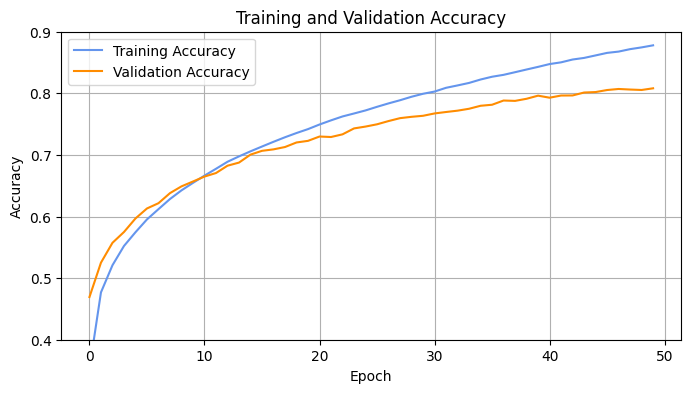

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

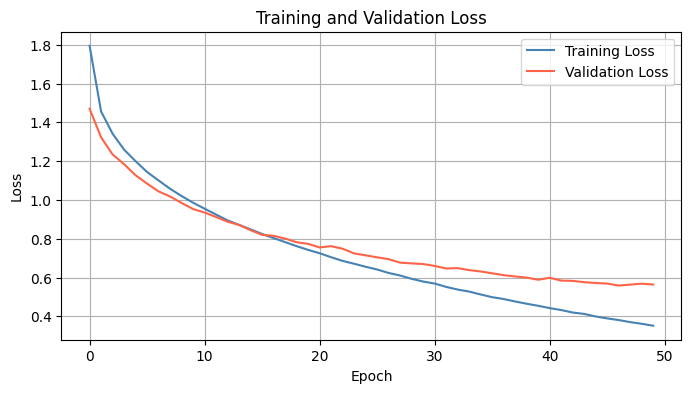

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

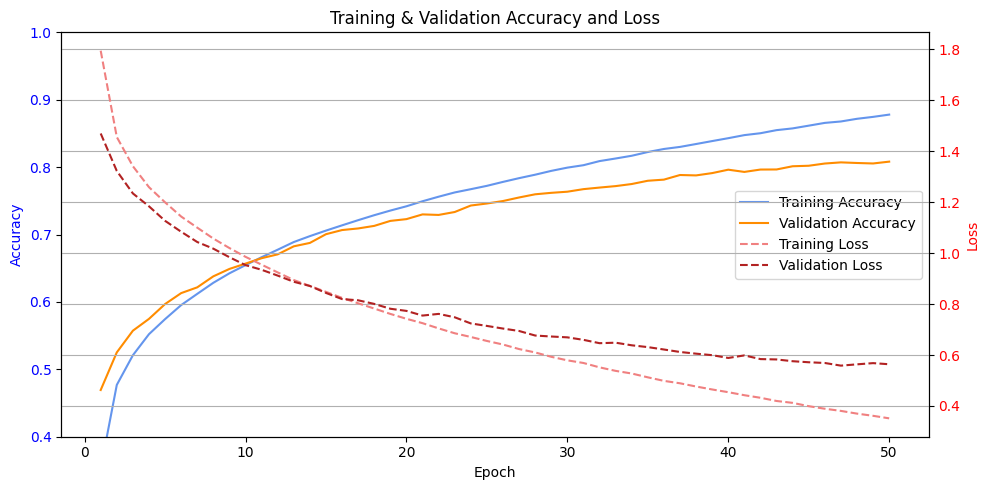

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

epochs = range(1, len(avg_train_acc) + 1)

fig, ax1 = plt.subplots(figsize=(10, 5))

# Plot Accuracy (sumbu kiri)
ax1.set_title('Training & Validation Accuracy and Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy', color='blue')
ax1.plot(epochs, avg_train_acc, label='Training Accuracy', color='cornflowerblue')
ax1.plot(epochs, avg_val_acc, label='Validation Accuracy', color='darkorange')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim(0.4, 1.0)

# Tambahkan sumbu kedua (Loss di sisi kanan)
ax2 = ax1.twinx()
ax2.set_ylabel('Loss', color='red')
ax2.plot(epochs, avg_train_loss, label='Training Loss', linestyle='--', color='lightcoral')
ax2.plot(epochs, avg_val_loss, label='Validation Loss', linestyle='--', color='firebrick')
ax2.tick_params(axis='y', labelcolor='red')

# Gabungkan legend dari kedua sumbu
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='center right')

plt.grid(True)
plt.tight_layout()
plt.show()

### CRNN Model (30% Dropout, Batch Normalization)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam

def build_crnn_model(input_shape, num_classes):
    model = Sequential()

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.3))  # Dropout 30% untuk regularisasi
    model.add(Dense(num_classes, activation='softmax'))  # Dense untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


#### K-Fold Cross Validation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shutil
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Menyimpan metrik setiap fold
fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []

best_model_path = ""
best_generalization_score = float('-inf')  # Skor terbaik untuk keseimbangan

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    # Split data berdasarkan indeks
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    # Buat model
    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)

    # Train model
    epochs = 50
    batch_size = 32
    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    # Simpan history loss & accuracy
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Evaluasi
    val_loss_final, val_acc_final = model.evaluate(X_val, y_val)
    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")

    # Prediksi data validasi
    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    # Hitung Precision, Recall, dan F1-Score
    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Simpan metrik fold ini
    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Cek apakah overfitting, underfitting, atau tidak
    train_acc_final = train_acc[-1]  # Akurasi training di epoch terakhir
    acc_gap = train_acc_final - val_acc_final  # Selisih akurasi training & validasi

    if acc_gap > 0.15:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **OVERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena overfitting
    elif train_acc_final < 0.7 and val_acc_final < 0.7:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **UNDERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena underfitting
    else:
        print(f"✅ Fold {fold+1} memiliki generalisasi yang **baik** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = val_acc_final  # Gunakan akurasi validasi sebagai skor jika model tidak overfitting/underfitting

    # Simpan model jika memiliki generalisasi terbaik
    if generalization_score > best_generalization_score:
        best_generalization_score = generalization_score
        best_model_path = f"/content/drive/MyDrive/dataset/best_crnn_model_5seg_augmented.h5"
        model.save(best_model_path)
        print(f"✅ Model terbaik disimpan dari Fold {fold+1} dengan akurasi {val_acc_final:.4f} dan generalisasi yang baik")

print("\n🎉 Training selesai!")


===== Fold 1/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.2562 - loss: 2.0860 - val_accuracy: 0.4791 - val_loss: 1.4869
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.4597 - loss: 1.5302 - val_accuracy: 0.5134 - val_loss: 1.3435
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step - accuracy: 0.5161 - loss: 1.3840 - val_accuracy: 0.5647 - val_loss: 1.2152
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - accuracy: 0.5603 - loss: 1.2768 - val_accuracy: 0.6090 - val_loss: 1.1112
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step - accuracy: 0.5955 - loss: 1.1953 - val_accuracy: 0.6295 - val_loss: 1.0654
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.6123 - loss: 1.1321 - val_accuracy: 0.6391 - val_loss: 1.0187
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 46s 57ms/step - accuracy: 0.6354 - loss: 1.0819 - val_accuracy: 0.6466 - val_loss: 1.0192
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step - accuracy: 0.6508 - loss: 1.0219 - 

Fold 1 Precision: 0.8335
Fold 1 Recall: 0.8290
Fold 1 F1-Score: 0.8301
✅ Fold 1 memiliki generalisasi yang **baik** (Train Acc: 0.8874, Val Acc: 0.8292)
✅ Model terbaik disimpan dari Fold 1 dengan akurasi 0.8292 dan generalisasi yang baik

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step - accuracy: 0.2510 - loss: 2.0860 - val_accuracy: 0.4269 - val_loss: 1.5232
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.4416 - loss: 1.5518 - val_accuracy: 0.5104 - val_loss: 1.3744
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.5199 - loss: 1.3915 - val_accuracy: 0.5689 - val_loss: 1.2096
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.5472 - loss: 1.2988 - val_accuracy: 0.6057 - val_loss: 1.1284
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.5739 - loss: 1.2285 - val_accuracy: 0.6220 - val_loss: 1.0629
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.5916 - loss: 1.1662 - val_accuracy: 0.6470 - val_loss: 0.9921
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.6244 - loss: 1.0950 - val_accuracy: 0.6424 - val_loss: 1.0113
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.6429 - loss: 1.0450 - 

Fold 2 Precision: 0.8418
Fold 2 Recall: 0.8427
Fold 2 F1-Score: 0.8411
✅ Fold 2 memiliki generalisasi yang **baik** (Train Acc: 0.8862, Val Acc: 0.8413)
✅ Model terbaik disimpan dari Fold 2 dengan akurasi 0.8413 dan generalisasi yang baik

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.2536 - loss: 2.0899 - val_accuracy: 0.4574 - val_loss: 1.5268
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - accuracy: 0.4470 - loss: 1.5659 - val_accuracy: 0.5150 - val_loss: 1.3329
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step - accuracy: 0.4967 - loss: 1.4041 - val_accuracy: 0.5631 - val_loss: 1.2055
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step - accuracy: 0.5494 - loss: 1.2868 - val_accuracy: 0.6036 - val_loss: 1.1157
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5870 - loss: 1.2043 - val_accuracy: 0.6199 - val_loss: 1.0648
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.6111 - loss: 1.1407 - val_accuracy: 0.6399 - val_loss: 1.0232
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.6262 - loss: 1.0941 - val_accuracy: 0.6617 - val_loss: 0.9649
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.6497 - loss: 1.0513 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 52ms/step - accuracy: 0.2558 - loss: 2.0565 - val_accuracy: 0.4779 - val_loss: 1.4503
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.4564 - loss: 1.5201 - val_accuracy: 0.5255 - val_loss: 1.3002
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step - accuracy: 0.5113 - loss: 1.3802 - val_accuracy: 0.5873 - val_loss: 1.1799
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - accuracy: 0.5578 - loss: 1.2806 - val_accuracy: 0.6044 - val_loss: 1.0989
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step - accuracy: 0.5920 - loss: 1.1884 - val_accuracy: 0.6274 - val_loss: 1.0470
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step - accuracy: 0.6177 - loss: 1.1240 - val_accuracy: 0.6571 - val_loss: 0.9875
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - accuracy: 0.6325 - loss: 1.0798 - val_accuracy: 0.6704 - val_loss: 0.9539
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.6534 - loss: 1.0346 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.2361 - loss: 2.1298 - val_accuracy: 0.4616 - val_loss: 1.4953
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.4520 - loss: 1.5487 - val_accuracy: 0.5196 - val_loss: 1.3079
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.5055 - loss: 1.3998 - val_accuracy: 0.5643 - val_loss: 1.2072
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step - accuracy: 0.5468 - loss: 1.2880 - val_accuracy: 0.5856 - val_loss: 1.1489
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step - accuracy: 0.5847 - loss: 1.2090 - val_accuracy: 0.6224 - val_loss: 1.0758
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step - accuracy: 0.5969 - loss: 1.1588 - val_accuracy: 0.6291 - val_loss: 1.0421
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.6205 - loss: 1.1020 - val_accuracy: 0.6550 - val_loss: 1.0025
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.6376 - loss: 1.0644 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - accuracy: 0.2714 - loss: 2.0764 - val_accuracy: 0.4574 - val_loss: 1.4957
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step - accuracy: 0.4413 - loss: 1.5622 - val_accuracy: 0.5326 - val_loss: 1.3073
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.5079 - loss: 1.3932 - val_accuracy: 0.5894 - val_loss: 1.1872
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step - accuracy: 0.5565 - loss: 1.2690 - val_accuracy: 0.6216 - val_loss: 1.0968
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step - accuracy: 0.5860 - loss: 1.1957 - val_accuracy: 0.6387 - val_loss: 1.0560
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - accuracy: 0.6075 - loss: 1.1454 - val_accuracy: 0.6454 - val_loss: 1.0191
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.6278 - loss: 1.0824 - val_accuracy: 0.6600 - val_loss: 0.9669
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step - accuracy: 0.6459 - loss: 1.0429 - 

Fold 6 Precision: 0.8490
Fold 6 Recall: 0.8473
Fold 6 F1-Score: 0.8475
✅ Fold 6 memiliki generalisasi yang **baik** (Train Acc: 0.8836, Val Acc: 0.8484)
✅ Model terbaik disimpan dari Fold 6 dengan akurasi 0.8484 dan generalisasi yang baik

===== Fold 7/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step - accuracy: 0.2517 - loss: 2.0810 - val_accuracy: 0.4653 - val_loss: 1.5342
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - accuracy: 0.4332 - loss: 1.6088 - val_accuracy: 0.5226 - val_loss: 1.3529
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step - accuracy: 0.4831 - loss: 1.4525 - val_accuracy: 0.5668 - val_loss: 1.2177
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - accuracy: 0.5287 - loss: 1.3441 - val_accuracy: 0.5944 - val_loss: 1.1620
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - accuracy: 0.5524 - loss: 1.2722 - val_accuracy: 0.6249 - val_loss: 1.0536
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step - accuracy: 0.5871 - loss: 1.1930 - val_accuracy: 0.6324 - val_loss: 1.0353
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.6058 - loss: 1.1456 - val_accuracy: 0.6529 - val_loss: 0.9799
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.6226 - loss: 1.1017 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step - accuracy: 0.2665 - loss: 2.0685 - val_accuracy: 0.4378 - val_loss: 1.5306
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.4367 - loss: 1.5733 - val_accuracy: 0.4749 - val_loss: 1.3953
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step - accuracy: 0.5118 - loss: 1.3854 - val_accuracy: 0.5489 - val_loss: 1.2474
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - accuracy: 0.5553 - loss: 1.2864 - val_accuracy: 0.6124 - val_loss: 1.1245
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.5851 - loss: 1.2004 - val_accuracy: 0.6161 - val_loss: 1.0610
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - accuracy: 0.6122 - loss: 1.1345 - val_accuracy: 0.6512 - val_loss: 1.0215
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - accuracy: 0.6262 - loss: 1.0887 - val_accuracy: 0.6541 - val_loss: 0.9946
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.6430 - loss: 1.0503 - 

Fold 8 Precision: 0.8540
Fold 8 Recall: 0.8518
Fold 8 F1-Score: 0.8516
✅ Fold 8 memiliki generalisasi yang **baik** (Train Acc: 0.8791, Val Acc: 0.8509)
✅ Model terbaik disimpan dari Fold 8 dengan akurasi 0.8509 dan generalisasi yang baik

===== Fold 9/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - accuracy: 0.2565 - loss: 2.0618 - val_accuracy: 0.5029 - val_loss: 1.4477
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.4326 - loss: 1.5474 - val_accuracy: 0.5677 - val_loss: 1.2356
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - accuracy: 0.5004 - loss: 1.3832 - val_accuracy: 0.5982 - val_loss: 1.1442
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5348 - loss: 1.2953 - val_accuracy: 0.6211 - val_loss: 1.0872
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5703 - loss: 1.2221 - val_accuracy: 0.6454 - val_loss: 1.0235
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5922 - loss: 1.1588 - val_accuracy: 0.6520 - val_loss: 1.0092
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.6293 - loss: 1.0876 - val_accuracy: 0.6667 - val_loss: 0.9530
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.6382 - loss: 1.0402 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step - accuracy: 0.2598 - loss: 2.0723 - val_accuracy: 0.4641 - val_loss: 1.4910
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step - accuracy: 0.4360 - loss: 1.5673 - val_accuracy: 0.5155 - val_loss: 1.3378
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step - accuracy: 0.5102 - loss: 1.4002 - val_accuracy: 0.5551 - val_loss: 1.2477
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step - accuracy: 0.5582 - loss: 1.2790 - val_accuracy: 0.6149 - val_loss: 1.1113
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.5786 - loss: 1.2209 - val_accuracy: 0.6274 - val_loss: 1.0646
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - accuracy: 0.6000 - loss: 1.1650 - val_accuracy: 0.6387 - val_loss: 1.0323
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step - accuracy: 0.6279 - loss: 1.0997 - val_accuracy: 0.6583 - val_loss: 0.9783
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.6441 - loss: 1.0585 - 

In [ ]:
print("\n===== Rata-rata hasil Cross-Validation =====")
print(f"Accuracy: {np.mean(fold_accuracies):.4f} ± {np.std(fold_accuracies):.4f}")
print(f"Precision: {np.mean(fold_precisions):.4f} ± {np.std(fold_precisions):.4f}")
print(f"Recall: {np.mean(fold_recalls):.4f} ± {np.std(fold_recalls):.4f}")
print(f"F1-Score: {np.mean(fold_f1_scores):.4f} ± {np.std(fold_f1_scores):.4f}")


===== Rata-rata hasil Cross-Validation =====
Accuracy: 0.8317 ± 0.0163
Precision: 0.8344 ± 0.0145
Recall: 0.8316 ± 0.0154
F1-Score: 0.8307 ± 0.0172


In [ ]:
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8791
Rata-rata Akurasi Validasi Terakhir: 0.8317
Gap Akurasi: 0.0474
✅ Model memiliki generalisasi yang **baik**.


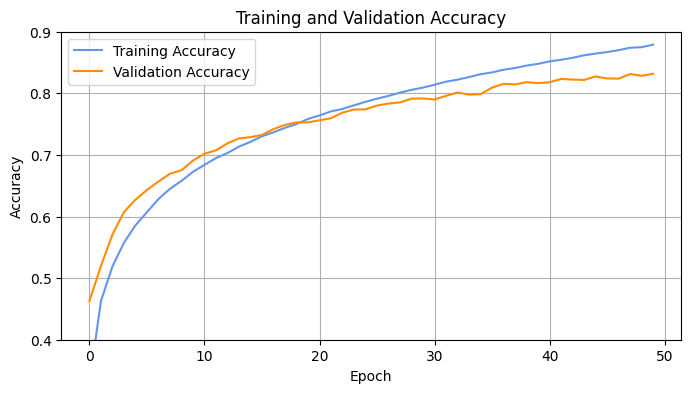

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

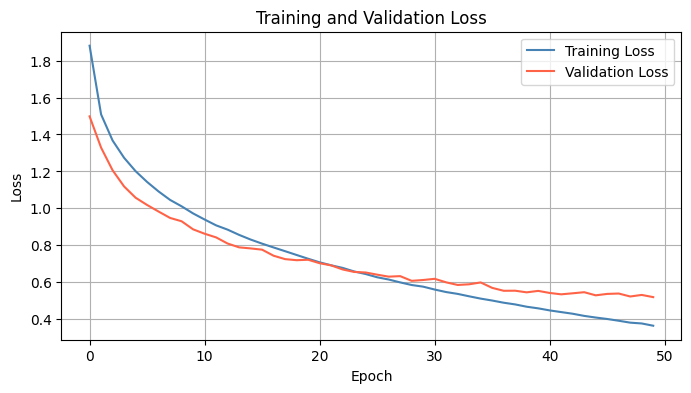

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

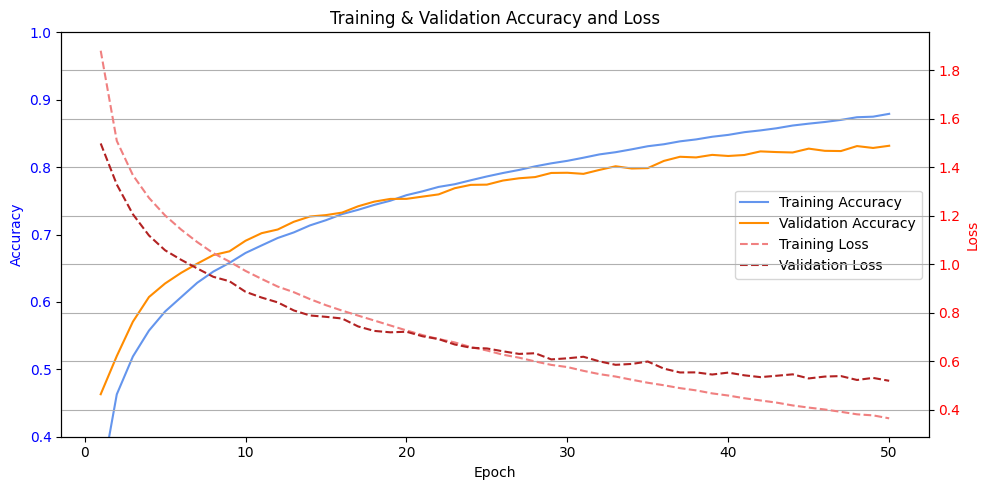

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

epochs = range(1, len(avg_train_acc) + 1)

fig, ax1 = plt.subplots(figsize=(10, 5))

# Plot Accuracy (sumbu kiri)
ax1.set_title('Training & Validation Accuracy and Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy', color='blue')
ax1.plot(epochs, avg_train_acc, label='Training Accuracy', color='cornflowerblue')
ax1.plot(epochs, avg_val_acc, label='Validation Accuracy', color='darkorange')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim(0.4, 1.0)

# Tambahkan sumbu kedua (Loss di sisi kanan)
ax2 = ax1.twinx()
ax2.set_ylabel('Loss', color='red')
ax2.plot(epochs, avg_train_loss, label='Training Loss', linestyle='--', color='lightcoral')
ax2.plot(epochs, avg_val_loss, label='Validation Loss', linestyle='--', color='firebrick')
ax2.tick_params(axis='y', labelcolor='red')

# Gabungkan legend dari kedua sumbu
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='center right')

plt.grid(True)
plt.tight_layout()
plt.show()

### CRNN Model (25% Dropout)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

def build_crnn_model(input_shape, num_classes):
    model = Sequential()

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same', input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same'))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu'))  # Dense pertama dengan 64 unit dan ReLU
    model.add(Dropout(0.25))  # Dropout 25% untuk regularisasi
    model.add(Dense(num_classes, activation='softmax'))  # Dense kedua untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


#### K-Fold Cross Validation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shutil
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Menyimpan metrik setiap fold
fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []

best_model_path = ""
best_generalization_score = float('-inf')  # Skor terbaik untuk keseimbangan

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    # Split data berdasarkan indeks
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    # Buat model
    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)

    # Train model
    epochs = 50
    batch_size = 32
    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    # Simpan history loss & accuracy
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Evaluasi
    val_loss_final, val_acc_final = model.evaluate(X_val, y_val)
    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")

    # Prediksi data validasi
    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    # Hitung Precision, Recall, dan F1-Score
    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Simpan metrik fold ini
    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Cek apakah overfitting, underfitting, atau tidak
    train_acc_final = train_acc[-1]  # Akurasi training di epoch terakhir
    acc_gap = train_acc_final - val_acc_final  # Selisih akurasi training & validasi

    if acc_gap > 0.15:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **OVERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena overfitting
    elif train_acc_final < 0.7 and val_acc_final < 0.7:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **UNDERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena underfitting
    else:
        print(f"✅ Fold {fold+1} memiliki generalisasi yang **baik** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = val_acc_final  # Gunakan akurasi validasi sebagai skor jika model tidak overfitting/underfitting

    # Simpan model jika memiliki generalisasi terbaik
    if generalization_score > best_generalization_score:
        best_generalization_score = generalization_score
        best_model_path = f"/content/drive/MyDrive/dataset/best_crnn_model_25drop_5seg_augmented.h5"
        model.save(best_model_path)
        print(f"✅ Model terbaik disimpan dari Fold {fold+1} dengan akurasi {val_acc_final:.4f} dan generalisasi yang baik")

print("\n🎉 Training selesai!")


===== Fold 1/10 =====
Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - accuracy: 0.2705 - loss: 2.0237 - val_accuracy: 0.4666 - val_loss: 1.4681
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - accuracy: 0.4637 - loss: 1.4905 - val_accuracy: 0.5288 - val_loss: 1.3233
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.5122 - loss: 1.3552 - val_accuracy: 0.5581 - val_loss: 1.2410
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - accuracy: 0.5468 - loss: 1.2703 - val_accuracy: 0.5802 - val_loss: 1.1949
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 39ms/step - accuracy: 0.5733 - loss: 1.2025 - val_accuracy: 0.5844 - val_loss: 1.1802
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.5977 - loss: 1.1430 - val_accuracy: 0.6174 - val_loss: 1.0679
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.6159 - loss: 1.0940 - val_accuracy: 0.6228 - val_loss: 1.0522
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step - accuracy: 0

Fold 1 Precision: 0.7972
Fold 1 Recall: 0.7885
Fold 1 F1-Score: 0.7910
✅ Fold 1 memiliki generalisasi yang **baik** (Train Acc: 0.8837, Val Acc: 0.7882)
✅ Model terbaik disimpan dari Fold 1 dengan akurasi 0.7882 dan generalisasi yang baik

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - accuracy: 0.2837 - loss: 1.9973 - val_accuracy: 0.4841 - val_loss: 1.4505
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.4724 - loss: 1.4809 - val_accuracy: 0.5280 - val_loss: 1.2989
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.5164 - loss: 1.3630 - val_accuracy: 0.5376 - val_loss: 1.2415
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.5433 - loss: 1.2687 - val_accuracy: 0.5802 - val_loss: 1.1901
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - accuracy: 0.5783 - loss: 1.1988 - val_accuracy: 0.5957 - val_loss: 1.1294
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.5982 - loss: 1.1365 - val_accuracy: 0.6366 - val_loss: 1.0358
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.6210 - loss: 1.0824 - val_accuracy: 0.6274 - val_loss: 1.0330
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 39ms/step - accuracy: 0.6324 - loss: 1.0492 - 

Fold 2 Precision: 0.8154
Fold 2 Recall: 0.8142
Fold 2 F1-Score: 0.8110
✅ Fold 2 memiliki generalisasi yang **baik** (Train Acc: 0.8839, Val Acc: 0.8124)
✅ Model terbaik disimpan dari Fold 2 dengan akurasi 0.8124 dan generalisasi yang baik

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step - accuracy: 0.2905 - loss: 1.9969 - val_accuracy: 0.4829 - val_loss: 1.4365
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 40ms/step - accuracy: 0.4781 - loss: 1.4512 - val_accuracy: 0.5317 - val_loss: 1.2814
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.5371 - loss: 1.2891 - val_accuracy: 0.5735 - val_loss: 1.1994
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - accuracy: 0.5638 - loss: 1.2289 - val_accuracy: 0.5923 - val_loss: 1.1574
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - accuracy: 0.5894 - loss: 1.1487 - val_accuracy: 0.6149 - val_loss: 1.0928
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.6088 - loss: 1.0872 - val_accuracy: 0.6253 - val_loss: 1.0769
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 39ms/step - accuracy: 0.6333 - loss: 1.0470 - val_accuracy: 0.6299 - val_loss: 1.0252
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 40ms/step - accuracy: 0.6495 - loss: 0.9993 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - accuracy: 0.2964 - loss: 1.9721 - val_accuracy: 0.4820 - val_loss: 1.4325
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.4782 - loss: 1.4423 - val_accuracy: 0.5317 - val_loss: 1.2821
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5386 - loss: 1.3051 - val_accuracy: 0.5723 - val_loss: 1.1766
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.5667 - loss: 1.2138 - val_accuracy: 0.6032 - val_loss: 1.1090
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.6012 - loss: 1.1337 - val_accuracy: 0.5986 - val_loss: 1.0950
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.6310 - loss: 1.0674 - val_accuracy: 0.6328 - val_loss: 1.0280
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - accuracy: 0.6358 - loss: 1.0372 - val_accuracy: 0.6466 - val_loss: 0.9790
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.6511 - loss: 0.9969 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step - accuracy: 0.2790 - loss: 2.0142 - val_accuracy: 0.4499 - val_loss: 1.5095
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 39ms/step - accuracy: 0.4626 - loss: 1.4991 - val_accuracy: 0.4883 - val_loss: 1.3871
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.5142 - loss: 1.3639 - val_accuracy: 0.5292 - val_loss: 1.2621
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5486 - loss: 1.2651 - val_accuracy: 0.5693 - val_loss: 1.1962
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.5819 - loss: 1.1807 - val_accuracy: 0.5819 - val_loss: 1.1360
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - accuracy: 0.5968 - loss: 1.1375 - val_accuracy: 0.6074 - val_loss: 1.0838
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.6193 - loss: 1.0720 - val_accuracy: 0.6157 - val_loss: 1.0549
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.6409 - loss: 1.0205 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step - accuracy: 0.2728 - loss: 2.0081 - val_accuracy: 0.4599 - val_loss: 1.5524
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 37ms/step - accuracy: 0.4714 - loss: 1.4687 - val_accuracy: 0.5388 - val_loss: 1.3083
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 39ms/step - accuracy: 0.5300 - loss: 1.3125 - val_accuracy: 0.5581 - val_loss: 1.2055
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.5522 - loss: 1.2514 - val_accuracy: 0.5906 - val_loss: 1.1324
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.5737 - loss: 1.1819 - val_accuracy: 0.6099 - val_loss: 1.0570
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 40ms/step - accuracy: 0.6054 - loss: 1.1111 - val_accuracy: 0.6195 - val_loss: 1.0280
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.6241 - loss: 1.0595 - val_accuracy: 0.6370 - val_loss: 0.9967
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.6318 - loss: 1.0434 - 

Fold 6 Precision: 0.8197
Fold 6 Recall: 0.8139
Fold 6 F1-Score: 0.8131
✅ Fold 6 memiliki generalisasi yang **baik** (Train Acc: 0.8837, Val Acc: 0.8145)
✅ Model terbaik disimpan dari Fold 6 dengan akurasi 0.8145 dan generalisasi yang baik

===== Fold 7/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 40ms/step - accuracy: 0.2838 - loss: 1.9953 - val_accuracy: 0.4825 - val_loss: 1.4705
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.4604 - loss: 1.5085 - val_accuracy: 0.5363 - val_loss: 1.3017
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step - accuracy: 0.5102 - loss: 1.3663 - val_accuracy: 0.5798 - val_loss: 1.1848
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 40ms/step - accuracy: 0.5475 - loss: 1.2585 - val_accuracy: 0.5936 - val_loss: 1.1269
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.5822 - loss: 1.1819 - val_accuracy: 0.6236 - val_loss: 1.0620
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.6078 - loss: 1.1094 - val_accuracy: 0.6145 - val_loss: 1.0584
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.6247 - loss: 1.0729 - val_accuracy: 0.6546 - val_loss: 0.9846
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.6399 - loss: 1.0281 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step - accuracy: 0.2941 - loss: 1.9911 - val_accuracy: 0.4591 - val_loss: 1.4915
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - accuracy: 0.4767 - loss: 1.4615 - val_accuracy: 0.5267 - val_loss: 1.2979
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - accuracy: 0.5357 - loss: 1.3156 - val_accuracy: 0.5522 - val_loss: 1.2370
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.5677 - loss: 1.2297 - val_accuracy: 0.5940 - val_loss: 1.1364
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.5929 - loss: 1.1524 - val_accuracy: 0.5923 - val_loss: 1.1562
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - accuracy: 0.6123 - loss: 1.1113 - val_accuracy: 0.6245 - val_loss: 1.0595
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.6292 - loss: 1.0582 - val_accuracy: 0.6516 - val_loss: 0.9944
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.6430 - loss: 1.0154 - 

Fold 8 Precision: 0.8199
Fold 8 Recall: 0.8185
Fold 8 F1-Score: 0.8185
✅ Fold 8 memiliki generalisasi yang **baik** (Train Acc: 0.8881, Val Acc: 0.8170)
✅ Model terbaik disimpan dari Fold 8 dengan akurasi 0.8170 dan generalisasi yang baik

===== Fold 9/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 42ms/step - accuracy: 0.2735 - loss: 1.9982 - val_accuracy: 0.4925 - val_loss: 1.4291
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.4754 - loss: 1.4606 - val_accuracy: 0.5547 - val_loss: 1.2542
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.5296 - loss: 1.3162 - val_accuracy: 0.5965 - val_loss: 1.1575
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step - accuracy: 0.5557 - loss: 1.2395 - val_accuracy: 0.6048 - val_loss: 1.1137
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.5880 - loss: 1.1606 - val_accuracy: 0.6353 - val_loss: 1.0586
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.5896 - loss: 1.1425 - val_accuracy: 0.6445 - val_loss: 1.0013
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 40ms/step - accuracy: 0.6216 - loss: 1.0728 - val_accuracy: 0.6475 - val_loss: 1.0207
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 39ms/step - accuracy: 0.6254 - loss: 1.0477 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 41ms/step - accuracy: 0.2965 - loss: 1.9679 - val_accuracy: 0.4716 - val_loss: 1.4766
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.4701 - loss: 1.4703 - val_accuracy: 0.5497 - val_loss: 1.2788
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5208 - loss: 1.3430 - val_accuracy: 0.5292 - val_loss: 1.2726
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5566 - loss: 1.2363 - val_accuracy: 0.5957 - val_loss: 1.1312
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 40ms/step - accuracy: 0.5815 - loss: 1.1856 - val_accuracy: 0.5998 - val_loss: 1.1000
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 41ms/step - accuracy: 0.5955 - loss: 1.1352 - val_accuracy: 0.6245 - val_loss: 1.0346
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.6130 - loss: 1.0846 - val_accuracy: 0.6391 - val_loss: 1.0108
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.6362 - loss: 1.0421 - 

In [ ]:
print("\n===== Rata-rata hasil Cross-Validation =====")
print(f"Accuracy: {np.mean(fold_accuracies):.4f} ± {np.std(fold_accuracies):.4f}")
print(f"Precision: {np.mean(fold_precisions):.4f} ± {np.std(fold_precisions):.4f}")
print(f"Recall: {np.mean(fold_recalls):.4f} ± {np.std(fold_recalls):.4f}")
print(f"F1-Score: {np.mean(fold_f1_scores):.4f} ± {np.std(fold_f1_scores):.4f}")


===== Rata-rata hasil Cross-Validation =====
Accuracy: 0.8036 ± 0.0096
Precision: 0.8074 ± 0.0101
Recall: 0.8039 ± 0.0100
F1-Score: 0.8030 ± 0.0102


In [ ]:
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8860
Rata-rata Akurasi Validasi Terakhir: 0.8036
Gap Akurasi: 0.0825
✅ Model memiliki generalisasi yang **baik**.


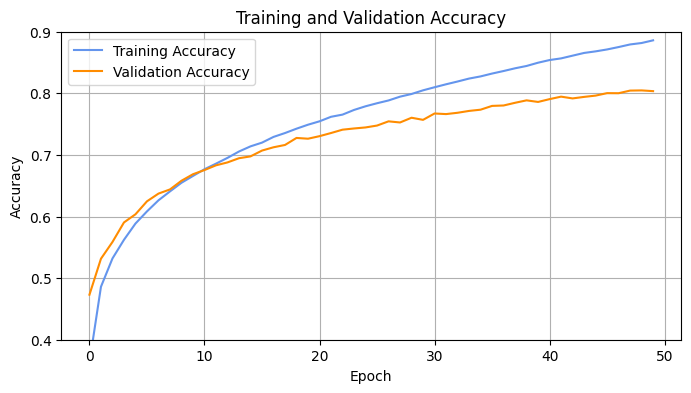

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

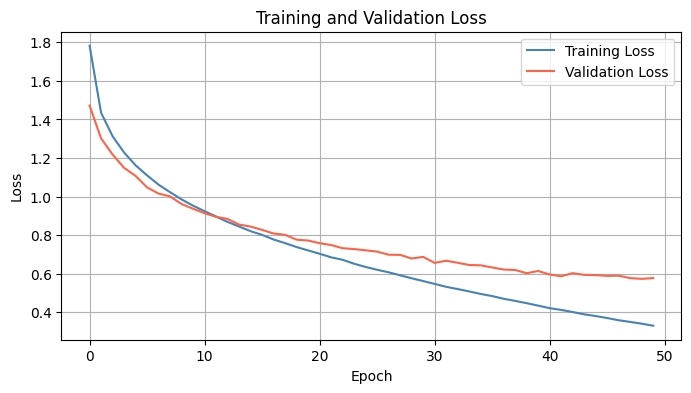

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

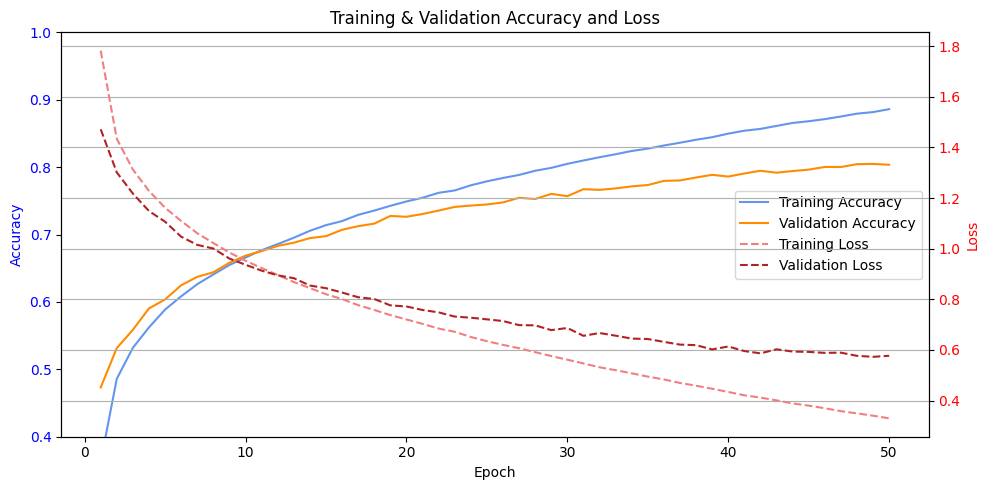

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

epochs = range(1, len(avg_train_acc) + 1)

fig, ax1 = plt.subplots(figsize=(10, 5))

# Plot Accuracy (sumbu kiri)
ax1.set_title('Training & Validation Accuracy and Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy', color='blue')
ax1.plot(epochs, avg_train_acc, label='Training Accuracy', color='cornflowerblue')
ax1.plot(epochs, avg_val_acc, label='Validation Accuracy', color='darkorange')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim(0.4, 1.0)

# Tambahkan sumbu kedua (Loss di sisi kanan)
ax2 = ax1.twinx()
ax2.set_ylabel('Loss', color='red')
ax2.plot(epochs, avg_train_loss, label='Training Loss', linestyle='--', color='lightcoral')
ax2.plot(epochs, avg_val_loss, label='Validation Loss', linestyle='--', color='firebrick')
ax2.tick_params(axis='y', labelcolor='red')

# Gabungkan legend dari kedua sumbu
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='center right')

plt.grid(True)
plt.tight_layout()
plt.show()

### CRNN Model (25% Dropout Dense Layer, Batch Normalization)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam

def build_crnn_model(input_shape, num_classes):
    model = Sequential()

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))  # Dropout 30% untuk regularisasi
    model.add(Dense(num_classes, activation='softmax'))  # Dense untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


#### K-Fold Cross Validation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shutil
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Menyimpan metrik setiap fold
fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []

best_model_path = ""
best_generalization_score = float('-inf')  # Skor terbaik untuk keseimbangan

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    # Split data berdasarkan indeks
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    # Buat model
    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)

    # Train model
    epochs = 50
    batch_size = 32
    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    # Simpan history loss & accuracy
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Evaluasi
    val_loss_final, val_acc_final = model.evaluate(X_val, y_val)
    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")

    # Prediksi data validasi
    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    # Hitung Precision, Recall, dan F1-Score
    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Simpan metrik fold ini
    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Cek apakah overfitting, underfitting, atau tidak
    train_acc_final = train_acc[-1]  # Akurasi training di epoch terakhir
    acc_gap = train_acc_final - val_acc_final  # Selisih akurasi training & validasi

    if acc_gap > 0.15:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **OVERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena overfitting
    elif train_acc_final < 0.7 and val_acc_final < 0.7:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **UNDERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena underfitting
    else:
        print(f"✅ Fold {fold+1} memiliki generalisasi yang **baik** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = val_acc_final  # Gunakan akurasi validasi sebagai skor jika model tidak overfitting/underfitting

    # Simpan model jika memiliki generalisasi terbaik
    if generalization_score > best_generalization_score:
        best_generalization_score = generalization_score
        best_model_path = f"/content/drive/MyDrive/dataset/best_crnn_model_25drop_5seg_augmented.h5"
        model.save(best_model_path)
        print(f"✅ Model terbaik disimpan dari Fold {fold+1} dengan akurasi {val_acc_final:.4f} dan generalisasi yang baik")

print("\n🎉 Training selesai!")


===== Fold 1/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step - accuracy: 0.2704 - loss: 2.0681 - val_accuracy: 0.4557 - val_loss: 1.4966
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step - accuracy: 0.4547 - loss: 1.5191 - val_accuracy: 0.5363 - val_loss: 1.3013
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.5137 - loss: 1.3697 - val_accuracy: 0.5706 - val_loss: 1.1969
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step - accuracy: 0.5460 - loss: 1.2787 - val_accuracy: 0.5982 - val_loss: 1.1244
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.5723 - loss: 1.2053 - val_accuracy: 0.6028 - val_loss: 1.1394
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.6044 - loss: 1.1341 - val_accuracy: 0.6412 - val_loss: 1.0279
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.6140 - loss: 1.1017 - val_accuracy: 0.6504 - val_loss: 0.9989
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step - accuracy: 0.6396 - loss: 1.0391 - 

Fold 1 Precision: 0.8267
Fold 1 Recall: 0.8265
Fold 1 F1-Score: 0.8247
✅ Fold 1 memiliki generalisasi yang **baik** (Train Acc: 0.8786, Val Acc: 0.8250)
✅ Model terbaik disimpan dari Fold 1 dengan akurasi 0.8250 dan generalisasi yang baik

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 45s 55ms/step - accuracy: 0.2452 - loss: 2.0945 - val_accuracy: 0.4457 - val_loss: 1.5172
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step - accuracy: 0.4476 - loss: 1.5371 - val_accuracy: 0.5155 - val_loss: 1.3477
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.4892 - loss: 1.4156 - val_accuracy: 0.5489 - val_loss: 1.2702
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.5257 - loss: 1.3269 - val_accuracy: 0.5760 - val_loss: 1.1945
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - accuracy: 0.5658 - loss: 1.2252 - val_accuracy: 0.6065 - val_loss: 1.1037
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.5838 - loss: 1.1846 - val_accuracy: 0.6337 - val_loss: 1.0463
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.6049 - loss: 1.1332 - val_accuracy: 0.6416 - val_loss: 1.0267
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - accuracy: 0.6328 - loss: 1.0592 - 

Fold 2 Precision: 0.8397
Fold 2 Recall: 0.8377
Fold 2 F1-Score: 0.8373
✅ Fold 2 memiliki generalisasi yang **baik** (Train Acc: 0.8742, Val Acc: 0.8379)
✅ Model terbaik disimpan dari Fold 2 dengan akurasi 0.8379 dan generalisasi yang baik

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - accuracy: 0.2684 - loss: 2.0493 - val_accuracy: 0.4737 - val_loss: 1.4575
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step - accuracy: 0.4559 - loss: 1.5048 - val_accuracy: 0.5380 - val_loss: 1.2980
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.5110 - loss: 1.3686 - val_accuracy: 0.5769 - val_loss: 1.1864
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5586 - loss: 1.2588 - val_accuracy: 0.5986 - val_loss: 1.1366
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step - accuracy: 0.5894 - loss: 1.1812 - val_accuracy: 0.6124 - val_loss: 1.0938
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - accuracy: 0.6096 - loss: 1.1330 - val_accuracy: 0.6445 - val_loss: 1.0106
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - accuracy: 0.6330 - loss: 1.0605 - val_accuracy: 0.6734 - val_loss: 0.9523
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - accuracy: 0.6465 - loss: 1.0315 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - accuracy: 0.2627 - loss: 2.0678 - val_accuracy: 0.4837 - val_loss: 1.4523
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - accuracy: 0.4555 - loss: 1.4908 - val_accuracy: 0.5401 - val_loss: 1.2825
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.5128 - loss: 1.3644 - val_accuracy: 0.5727 - val_loss: 1.1841
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.5525 - loss: 1.2748 - val_accuracy: 0.5931 - val_loss: 1.1213
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step - accuracy: 0.5779 - loss: 1.2170 - val_accuracy: 0.6153 - val_loss: 1.0574
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - accuracy: 0.6120 - loss: 1.1346 - val_accuracy: 0.6299 - val_loss: 1.0210
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step - accuracy: 0.6267 - loss: 1.1003 - val_accuracy: 0.6621 - val_loss: 0.9648
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.6390 - loss: 1.0547 - 

Fold 4 Precision: 0.8571
Fold 4 Recall: 0.8553
Fold 4 F1-Score: 0.8555
✅ Fold 4 memiliki generalisasi yang **baik** (Train Acc: 0.8757, Val Acc: 0.8559)
✅ Model terbaik disimpan dari Fold 4 dengan akurasi 0.8559 dan generalisasi yang baik

===== Fold 5/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - accuracy: 0.2468 - loss: 2.0656 - val_accuracy: 0.4662 - val_loss: 1.4763
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - accuracy: 0.4550 - loss: 1.5082 - val_accuracy: 0.5167 - val_loss: 1.3009
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - accuracy: 0.5157 - loss: 1.3612 - val_accuracy: 0.5727 - val_loss: 1.1844
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step - accuracy: 0.5530 - loss: 1.2662 - val_accuracy: 0.6153 - val_loss: 1.0934
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - accuracy: 0.5910 - loss: 1.1776 - val_accuracy: 0.6220 - val_loss: 1.0634
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.6237 - loss: 1.0878 - val_accuracy: 0.6495 - val_loss: 0.9774
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.6443 - loss: 1.0395 - val_accuracy: 0.6667 - val_loss: 0.9432
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.6632 - loss: 0.9916 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - accuracy: 0.2461 - loss: 2.0635 - val_accuracy: 0.4465 - val_loss: 1.5273
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step - accuracy: 0.4354 - loss: 1.5546 - val_accuracy: 0.5305 - val_loss: 1.3219
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step - accuracy: 0.4931 - loss: 1.4092 - val_accuracy: 0.5668 - val_loss: 1.2187
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step - accuracy: 0.5313 - loss: 1.2997 - val_accuracy: 0.5911 - val_loss: 1.1459
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step - accuracy: 0.5672 - loss: 1.2389 - val_accuracy: 0.6211 - val_loss: 1.0743
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5935 - loss: 1.1612 - val_accuracy: 0.6349 - val_loss: 1.0311
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.6165 - loss: 1.1093 - val_accuracy: 0.6571 - val_loss: 0.9848
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.6326 - loss: 1.0742 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step - accuracy: 0.2645 - loss: 2.0670 - val_accuracy: 0.5008 - val_loss: 1.3867
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - accuracy: 0.4675 - loss: 1.4810 - val_accuracy: 0.5493 - val_loss: 1.2488
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.5217 - loss: 1.3577 - val_accuracy: 0.5890 - val_loss: 1.1455
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step - accuracy: 0.5598 - loss: 1.2544 - val_accuracy: 0.6241 - val_loss: 1.0745
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.5916 - loss: 1.1773 - val_accuracy: 0.6307 - val_loss: 1.0211
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step - accuracy: 0.6091 - loss: 1.1334 - val_accuracy: 0.6562 - val_loss: 0.9638
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step - accuracy: 0.6273 - loss: 1.0672 - val_accuracy: 0.6579 - val_loss: 0.9638
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - accuracy: 0.6428 - loss: 1.0376 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step - accuracy: 0.2369 - loss: 2.1040 - val_accuracy: 0.4261 - val_loss: 1.5436
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - accuracy: 0.4445 - loss: 1.5572 - val_accuracy: 0.5301 - val_loss: 1.3033
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step - accuracy: 0.5165 - loss: 1.3714 - val_accuracy: 0.5472 - val_loss: 1.2381
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step - accuracy: 0.5582 - loss: 1.2560 - val_accuracy: 0.6003 - val_loss: 1.1319
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.5936 - loss: 1.1869 - val_accuracy: 0.6274 - val_loss: 1.0458
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.6208 - loss: 1.1177 - val_accuracy: 0.6629 - val_loss: 0.9811
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.6398 - loss: 1.0628 - val_accuracy: 0.6800 - val_loss: 0.9314
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step - accuracy: 0.6634 - loss: 1.0086 - 

Fold 8 Precision: 0.8624
Fold 8 Recall: 0.8625
Fold 8 F1-Score: 0.8621
✅ Fold 8 memiliki generalisasi yang **baik** (Train Acc: 0.8972, Val Acc: 0.8622)
✅ Model terbaik disimpan dari Fold 8 dengan akurasi 0.8622 dan generalisasi yang baik

===== Fold 9/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 52ms/step - accuracy: 0.2520 - loss: 2.0641 - val_accuracy: 0.4866 - val_loss: 1.4331
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step - accuracy: 0.4385 - loss: 1.5328 - val_accuracy: 0.5576 - val_loss: 1.2747
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.5132 - loss: 1.3753 - val_accuracy: 0.5957 - val_loss: 1.1540
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.5644 - loss: 1.2586 - val_accuracy: 0.6249 - val_loss: 1.0809
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.5878 - loss: 1.1928 - val_accuracy: 0.6429 - val_loss: 1.0121
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step - accuracy: 0.6141 - loss: 1.1295 - val_accuracy: 0.6654 - val_loss: 0.9709
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - accuracy: 0.6393 - loss: 1.0687 - val_accuracy: 0.6850 - val_loss: 0.9346
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - accuracy: 0.6561 - loss: 1.0112 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step - accuracy: 0.2561 - loss: 2.0764 - val_accuracy: 0.4958 - val_loss: 1.4201
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step - accuracy: 0.4659 - loss: 1.4828 - val_accuracy: 0.5510 - val_loss: 1.2610
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.5237 - loss: 1.3428 - val_accuracy: 0.5865 - val_loss: 1.1551
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.5582 - loss: 1.2595 - val_accuracy: 0.6086 - val_loss: 1.1000
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.5872 - loss: 1.1821 - val_accuracy: 0.6282 - val_loss: 1.0490
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.6051 - loss: 1.1456 - val_accuracy: 0.6529 - val_loss: 0.9983
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.6249 - loss: 1.0867 - val_accuracy: 0.6596 - val_loss: 0.9808
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.6485 - loss: 1.0302 - 

In [ ]:
print("\n===== Rata-rata hasil Cross-Validation =====")
print(f"Accuracy: {np.mean(fold_accuracies):.4f} ± {np.std(fold_accuracies):.4f}")
print(f"Precision: {np.mean(fold_precisions):.4f} ± {np.std(fold_precisions):.4f}")
print(f"Recall: {np.mean(fold_recalls):.4f} ± {np.std(fold_recalls):.4f}")
print(f"F1-Score: {np.mean(fold_f1_scores):.4f} ± {np.std(fold_f1_scores):.4f}")


===== Rata-rata hasil Cross-Validation =====
Accuracy: 0.8348 ± 0.0143
Precision: 0.8369 ± 0.0125
Recall: 0.8346 ± 0.0140
F1-Score: 0.8337 ± 0.0141


In [ ]:
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8824
Rata-rata Akurasi Validasi Terakhir: 0.8348
Gap Akurasi: 0.0476
✅ Model memiliki generalisasi yang **baik**.


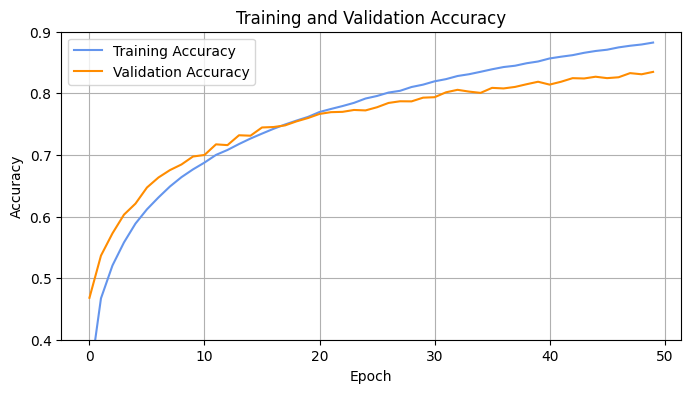

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

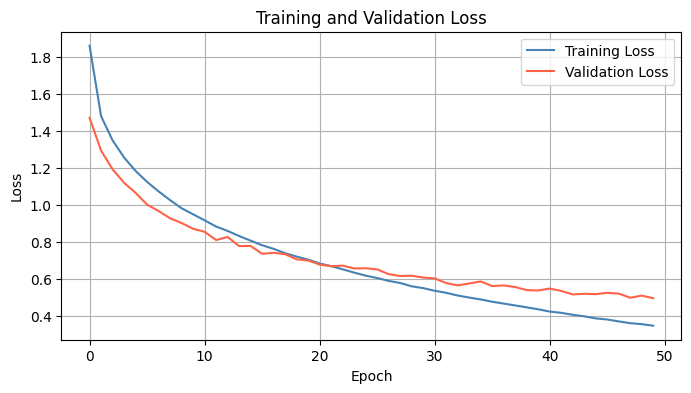

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

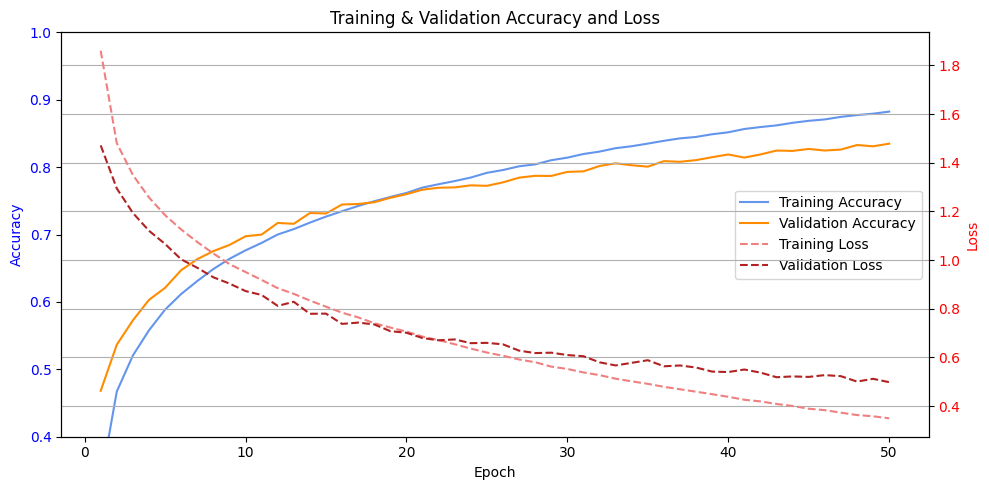

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

epochs = range(1, len(avg_train_acc) + 1)

fig, ax1 = plt.subplots(figsize=(10, 5))

# Plot Accuracy (sumbu kiri)
ax1.set_title('Training & Validation Accuracy and Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy', color='blue')
ax1.plot(epochs, avg_train_acc, label='Training Accuracy', color='cornflowerblue')
ax1.plot(epochs, avg_val_acc, label='Validation Accuracy', color='darkorange')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim(0.4, 1.0)

# Tambahkan sumbu kedua (Loss di sisi kanan)
ax2 = ax1.twinx()
ax2.set_ylabel('Loss', color='red')
ax2.plot(epochs, avg_train_loss, label='Training Loss', linestyle='--', color='lightcoral')
ax2.plot(epochs, avg_val_loss, label='Validation Loss', linestyle='--', color='firebrick')
ax2.tick_params(axis='y', labelcolor='red')

# Gabungkan legend dari kedua sumbu
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='center right')

plt.grid(True)
plt.tight_layout()
plt.show()

### CRNN Model (25% Dropout LSTM & Dense Layer, Batch Normalization)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam

def build_crnn_model(input_shape, num_classes):
    model = Sequential()

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same', input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same'))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(Dropout(0.25))
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer
    model.add(Dropout(0.25))

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))  # Dropout 30% untuk regularisasi
    model.add(Dense(num_classes, activation='softmax'))  # Dense untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


#### K-Fold Cross Validation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shutil
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Menyimpan metrik setiap fold
fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []

best_model_path = ""
best_generalization_score = float('-inf')  # Skor terbaik untuk keseimbangan

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    # Split data berdasarkan indeks
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    # Buat model
    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)

    # Train model
    epochs = 50
    batch_size = 32
    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    # Simpan history loss & accuracy
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Evaluasi
    val_loss_final, val_acc_final = model.evaluate(X_val, y_val)
    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")

    # Prediksi data validasi
    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    # Hitung Precision, Recall, dan F1-Score
    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Simpan metrik fold ini
    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Cek apakah overfitting, underfitting, atau tidak
    train_acc_final = train_acc[-1]  # Akurasi training di epoch terakhir
    acc_gap = train_acc_final - val_acc_final  # Selisih akurasi training & validasi

    if acc_gap > 0.15:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **OVERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena overfitting
    elif train_acc_final < 0.7 and val_acc_final < 0.7:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **UNDERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena underfitting
    else:
        print(f"✅ Fold {fold+1} memiliki generalisasi yang **baik** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = val_acc_final  # Gunakan akurasi validasi sebagai skor jika model tidak overfitting/underfitting

    # Simpan model jika memiliki generalisasi terbaik
    if generalization_score > best_generalization_score:
        best_generalization_score = generalization_score
        best_model_path = f"/content/drive/MyDrive/dataset/best_crnn_model_25drop_5seg_augmented_end.h5"
        model.save(best_model_path)
        print(f"✅ Model terbaik disimpan dari Fold {fold+1} dengan akurasi {val_acc_final:.4f} dan generalisasi yang baik")

print("\n🎉 Training selesai!")


===== Fold 1/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step - accuracy: 0.2232 - loss: 2.1371 - val_accuracy: 0.4185 - val_loss: 1.5842
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - accuracy: 0.4315 - loss: 1.5907 - val_accuracy: 0.4891 - val_loss: 1.3956
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 44ms/step - accuracy: 0.4778 - loss: 1.4412 - val_accuracy: 0.5430 - val_loss: 1.2505
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 44ms/step - accuracy: 0.5124 - loss: 1.3710 - val_accuracy: 0.5752 - val_loss: 1.1890
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 44ms/step - accuracy: 0.5477 - loss: 1.2916 - val_accuracy: 0.5936 - val_loss: 1.1524
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 44ms/step - accuracy: 0.5722 - loss: 1.2291 - val_accuracy: 0.6274 - val_loss: 1.0709
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - accuracy: 0.5951 - loss: 1.1748 - val_accuracy: 0.6324 - val_loss: 1.0338
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 45ms/step - accuracy: 0.6020 - loss: 1.1412 - 

Fold 1 Precision: 0.8120
Fold 1 Recall: 0.8108
Fold 1 F1-Score: 0.8101
✅ Fold 1 memiliki generalisasi yang **baik** (Train Acc: 0.8270, Val Acc: 0.8099)
✅ Model terbaik disimpan dari Fold 1 dengan akurasi 0.8099 dan generalisasi yang baik

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - accuracy: 0.2238 - loss: 2.1231 - val_accuracy: 0.4198 - val_loss: 1.5458
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 45ms/step - accuracy: 0.4088 - loss: 1.6102 - val_accuracy: 0.5025 - val_loss: 1.3642
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.4723 - loss: 1.4601 - val_accuracy: 0.5518 - val_loss: 1.2317
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5118 - loss: 1.3603 - val_accuracy: 0.5931 - val_loss: 1.1519
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - accuracy: 0.5509 - loss: 1.2871 - val_accuracy: 0.6132 - val_loss: 1.1032
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - accuracy: 0.5724 - loss: 1.2339 - val_accuracy: 0.6253 - val_loss: 1.0777
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 45ms/step - accuracy: 0.6011 - loss: 1.1641 - val_accuracy: 0.6479 - val_loss: 1.0018
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.6129 - loss: 1.1284 - 

Fold 2 Precision: 0.8297
Fold 2 Recall: 0.8285
Fold 2 F1-Score: 0.8276
✅ Fold 2 memiliki generalisasi yang **baik** (Train Acc: 0.8382, Val Acc: 0.8279)
✅ Model terbaik disimpan dari Fold 2 dengan akurasi 0.8279 dan generalisasi yang baik

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step - accuracy: 0.2257 - loss: 2.1372 - val_accuracy: 0.4127 - val_loss: 1.5474
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 45ms/step - accuracy: 0.4251 - loss: 1.5905 - val_accuracy: 0.5272 - val_loss: 1.3373
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step - accuracy: 0.4843 - loss: 1.4203 - val_accuracy: 0.5664 - val_loss: 1.2258
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - accuracy: 0.5243 - loss: 1.3262 - val_accuracy: 0.5957 - val_loss: 1.1582
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 45ms/step - accuracy: 0.5594 - loss: 1.2540 - val_accuracy: 0.6132 - val_loss: 1.1202
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 45ms/step - accuracy: 0.5811 - loss: 1.2082 - val_accuracy: 0.6412 - val_loss: 1.0391
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.6071 - loss: 1.1462 - val_accuracy: 0.6470 - val_loss: 1.0136
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 45ms/step - accuracy: 0.6199 - loss: 1.1048 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - accuracy: 0.2087 - loss: 2.1566 - val_accuracy: 0.4215 - val_loss: 1.5792
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - accuracy: 0.4139 - loss: 1.6374 - val_accuracy: 0.5084 - val_loss: 1.3748
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.4661 - loss: 1.4841 - val_accuracy: 0.5518 - val_loss: 1.2545
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - accuracy: 0.5095 - loss: 1.3686 - val_accuracy: 0.5848 - val_loss: 1.1703
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step - accuracy: 0.5470 - loss: 1.2838 - val_accuracy: 0.6186 - val_loss: 1.0824
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - accuracy: 0.5812 - loss: 1.2103 - val_accuracy: 0.6412 - val_loss: 1.0302
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.6054 - loss: 1.1628 - val_accuracy: 0.6441 - val_loss: 1.0102
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.6284 - loss: 1.1028 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - accuracy: 0.2086 - loss: 2.1511 - val_accuracy: 0.4490 - val_loss: 1.5407
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - accuracy: 0.4323 - loss: 1.5866 - val_accuracy: 0.5217 - val_loss: 1.3455
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - accuracy: 0.4865 - loss: 1.4456 - val_accuracy: 0.5606 - val_loss: 1.2534
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - accuracy: 0.5351 - loss: 1.3414 - val_accuracy: 0.5998 - val_loss: 1.1630
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 43ms/step - accuracy: 0.5609 - loss: 1.2813 - val_accuracy: 0.6170 - val_loss: 1.0891
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - accuracy: 0.6004 - loss: 1.1937 - val_accuracy: 0.6462 - val_loss: 1.0333
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - accuracy: 0.6104 - loss: 1.1418 - val_accuracy: 0.6650 - val_loss: 1.0002
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 44ms/step - accuracy: 0.6370 - loss: 1.0927 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step - accuracy: 0.2483 - loss: 2.0922 - val_accuracy: 0.4574 - val_loss: 1.4939
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - accuracy: 0.4325 - loss: 1.5591 - val_accuracy: 0.5075 - val_loss: 1.3354
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.4825 - loss: 1.4226 - val_accuracy: 0.5744 - val_loss: 1.2005
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step - accuracy: 0.5292 - loss: 1.3187 - val_accuracy: 0.6048 - val_loss: 1.1239
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - accuracy: 0.5566 - loss: 1.2600 - val_accuracy: 0.6299 - val_loss: 1.0777
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - accuracy: 0.5882 - loss: 1.2017 - val_accuracy: 0.6491 - val_loss: 0.9968
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.6084 - loss: 1.1380 - val_accuracy: 0.6708 - val_loss: 0.9598
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - accuracy: 0.6286 - loss: 1.0978 - 

Fold 6 Precision: 0.8335
Fold 6 Recall: 0.8328
Fold 6 F1-Score: 0.8311
✅ Fold 6 memiliki generalisasi yang **baik** (Train Acc: 0.8453, Val Acc: 0.8346)
✅ Model terbaik disimpan dari Fold 6 dengan akurasi 0.8346 dan generalisasi yang baik

===== Fold 7/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.2254 - loss: 2.1170 - val_accuracy: 0.4407 - val_loss: 1.5574
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - accuracy: 0.4199 - loss: 1.6087 - val_accuracy: 0.5543 - val_loss: 1.2809
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - accuracy: 0.4970 - loss: 1.4035 - val_accuracy: 0.6065 - val_loss: 1.1556
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 45ms/step - accuracy: 0.5446 - loss: 1.3025 - val_accuracy: 0.6287 - val_loss: 1.0642
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step - accuracy: 0.5773 - loss: 1.2313 - val_accuracy: 0.6412 - val_loss: 1.0325
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - accuracy: 0.6035 - loss: 1.1684 - val_accuracy: 0.6629 - val_loss: 0.9600
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.6126 - loss: 1.1249 - val_accuracy: 0.6888 - val_loss: 0.9292
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - accuracy: 0.6400 - loss: 1.0717 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - accuracy: 0.2344 - loss: 2.1229 - val_accuracy: 0.4461 - val_loss: 1.5796
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - accuracy: 0.4301 - loss: 1.5937 - val_accuracy: 0.5255 - val_loss: 1.3186
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - accuracy: 0.4893 - loss: 1.4246 - val_accuracy: 0.5593 - val_loss: 1.2039
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step - accuracy: 0.5318 - loss: 1.3369 - val_accuracy: 0.5852 - val_loss: 1.1523
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step - accuracy: 0.5582 - loss: 1.2539 - val_accuracy: 0.6195 - val_loss: 1.0819
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - accuracy: 0.5857 - loss: 1.1914 - val_accuracy: 0.6416 - val_loss: 1.0174
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.6071 - loss: 1.1369 - val_accuracy: 0.6378 - val_loss: 0.9916
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.6313 - loss: 1.0894 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step - accuracy: 0.2352 - loss: 2.1430 - val_accuracy: 0.3860 - val_loss: 1.6446
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - accuracy: 0.4042 - loss: 1.6511 - val_accuracy: 0.5175 - val_loss: 1.3339
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 45ms/step - accuracy: 0.4689 - loss: 1.4680 - val_accuracy: 0.5710 - val_loss: 1.2222
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 45ms/step - accuracy: 0.5210 - loss: 1.3497 - val_accuracy: 0.6040 - val_loss: 1.1322
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 45ms/step - accuracy: 0.5478 - loss: 1.2792 - val_accuracy: 0.6341 - val_loss: 1.0696
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 45ms/step - accuracy: 0.5696 - loss: 1.2263 - val_accuracy: 0.6399 - val_loss: 1.0331
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 47ms/step - accuracy: 0.5894 - loss: 1.1807 - val_accuracy: 0.6688 - val_loss: 0.9965
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - accuracy: 0.6060 - loss: 1.1297 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - accuracy: 0.2167 - loss: 2.1468 - val_accuracy: 0.4211 - val_loss: 1.5943
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - accuracy: 0.4166 - loss: 1.6348 - val_accuracy: 0.5351 - val_loss: 1.3377
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - accuracy: 0.4857 - loss: 1.4672 - val_accuracy: 0.5731 - val_loss: 1.1994
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5322 - loss: 1.3357 - val_accuracy: 0.5844 - val_loss: 1.1629
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step - accuracy: 0.5586 - loss: 1.2766 - val_accuracy: 0.6053 - val_loss: 1.1128
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - accuracy: 0.5852 - loss: 1.2050 - val_accuracy: 0.6140 - val_loss: 1.0874
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - accuracy: 0.6193 - loss: 1.1373 - val_accuracy: 0.6420 - val_loss: 1.0170
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.6342 - loss: 1.0952 - 

In [ ]:
print("\n===== Rata-rata hasil Cross-Validation =====")
print(f"Accuracy: {np.mean(fold_accuracies):.4f} ± {np.std(fold_accuracies):.4f}")
print(f"Precision: {np.mean(fold_precisions):.4f} ± {np.std(fold_precisions):.4f}")
print(f"Recall: {np.mean(fold_recalls):.4f} ± {np.std(fold_recalls):.4f}")
print(f"F1-Score: {np.mean(fold_f1_scores):.4f} ± {np.std(fold_f1_scores):.4f}")


===== Rata-rata hasil Cross-Validation =====
Accuracy: 0.8180 ± 0.0084
Precision: 0.8196 ± 0.0080
Recall: 0.8181 ± 0.0091
F1-Score: 0.8169 ± 0.0084


In [ ]:
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8378
Rata-rata Akurasi Validasi Terakhir: 0.8180
Gap Akurasi: 0.0198
✅ Model memiliki generalisasi yang **baik**.


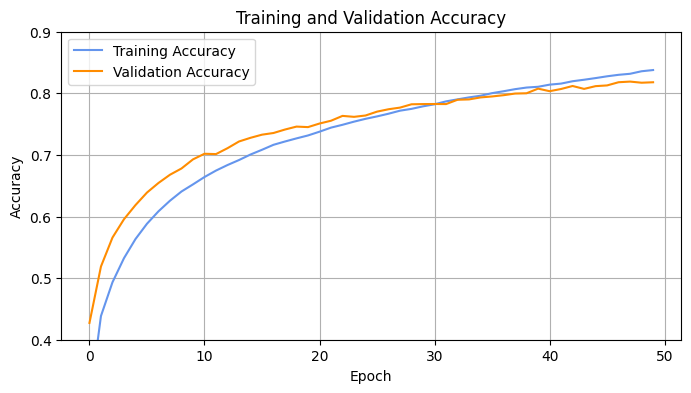

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

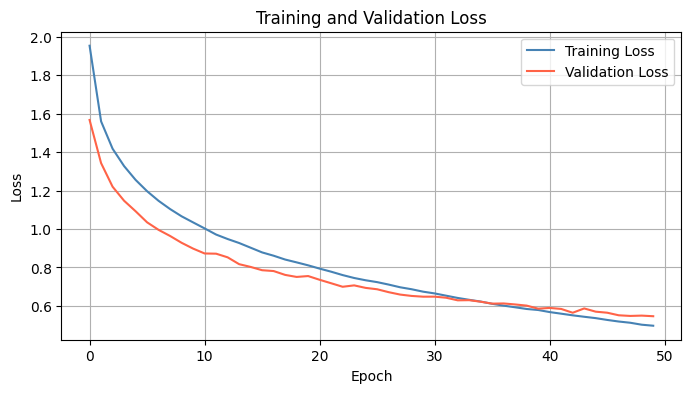

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

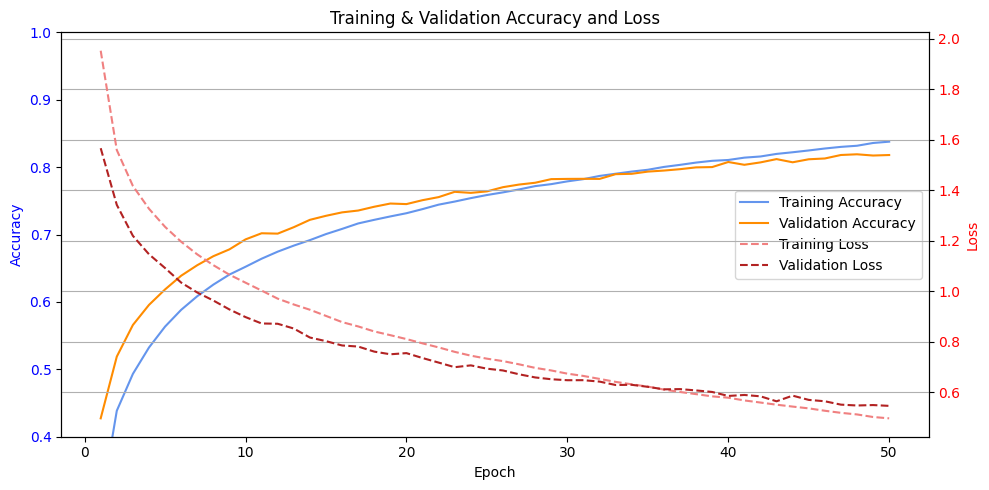

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

epochs = range(1, len(avg_train_acc) + 1)

fig, ax1 = plt.subplots(figsize=(10, 5))

# Plot Accuracy (sumbu kiri)
ax1.set_title('Training & Validation Accuracy and Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy', color='blue')
ax1.plot(epochs, avg_train_acc, label='Training Accuracy', color='cornflowerblue')
ax1.plot(epochs, avg_val_acc, label='Validation Accuracy', color='darkorange')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim(0.4, 1.0)

# Tambahkan sumbu kedua (Loss di sisi kanan)
ax2 = ax1.twinx()
ax2.set_ylabel('Loss', color='red')
ax2.plot(epochs, avg_train_loss, label='Training Loss', linestyle='--', color='lightcoral')
ax2.plot(epochs, avg_val_loss, label='Validation Loss', linestyle='--', color='firebrick')
ax2.tick_params(axis='y', labelcolor='red')

# Gabungkan legend dari kedua sumbu
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='center right')

plt.grid(True)
plt.tight_layout()
plt.show()

### CRNN Model (25% Dropout LSTM & Dense Layer, Batch Normalization, Regulation)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def build_crnn_model(input_shape, num_classes):
    model = Sequential()
    weight_decay = 1e-4  # Nilai regulasi L2

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay), input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(Dropout(0.25))
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer
    model.add(Dropout(0.25))

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))  # Dropout 30% untuk regularisasi
    model.add(Dense(num_classes, activation='softmax'))  # Dense untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


#### K-Fold Cross Validation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shutil
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Menyimpan metrik setiap fold
fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []

best_model_path = ""
best_generalization_score = float('-inf')  # Skor terbaik untuk keseimbangan

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    # Split data berdasarkan indeks
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    # Buat model
    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)

    # Train model
    epochs = 50
    batch_size = 32
    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    # Simpan history loss & accuracy
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Evaluasi
    val_loss_final, val_acc_final = model.evaluate(X_val, y_val)
    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")

    # Prediksi data validasi
    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    # Hitung Precision, Recall, dan F1-Score
    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Simpan metrik fold ini
    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Cek apakah overfitting, underfitting, atau tidak
    train_acc_final = train_acc[-1]  # Akurasi training di epoch terakhir
    acc_gap = train_acc_final - val_acc_final  # Selisih akurasi training & validasi

    if acc_gap > 0.15:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **OVERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena overfitting
    elif train_acc_final < 0.7 and val_acc_final < 0.7:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **UNDERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena underfitting
    else:
        print(f"✅ Fold {fold+1} memiliki generalisasi yang **baik** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = val_acc_final  # Gunakan akurasi validasi sebagai skor jika model tidak overfitting/underfitting

    # Simpan model jika memiliki generalisasi terbaik
    if generalization_score > best_generalization_score:
        best_generalization_score = generalization_score
        best_model_path = f"/content/drive/MyDrive/dataset/best_crnn_model_25drop_5seg_augmented_end.h5"
        model.save(best_model_path)
        print(f"✅ Model terbaik disimpan dari Fold {fold+1} dengan akurasi {val_acc_final:.4f} dan generalisasi yang baik")

print("\n🎉 Training selesai!")


===== Fold 1/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - accuracy: 0.2382 - loss: 2.1010 - val_accuracy: 0.4223 - val_loss: 1.6003
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - accuracy: 0.4152 - loss: 1.6254 - val_accuracy: 0.5129 - val_loss: 1.3657
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.4880 - loss: 1.4421 - val_accuracy: 0.5443 - val_loss: 1.2722
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 45ms/step - accuracy: 0.5319 - loss: 1.3435 - val_accuracy: 0.5877 - val_loss: 1.1643
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.5703 - loss: 1.2534 - val_accuracy: 0.5986 - val_loss: 1.1280
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 45ms/step - accuracy: 0.5841 - loss: 1.2177 - val_accuracy: 0.6174 - val_loss: 1.1049
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 45ms/step - accuracy: 0.6078 - loss: 1.1613 - val_accuracy: 0.6433 - val_loss: 1.0516
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 46ms/step - accuracy: 0.6134 - loss: 1.1224 - 

Fold 1 Precision: 0.8235
Fold 1 Recall: 0.8214
Fold 1 F1-Score: 0.8218
✅ Fold 1 memiliki generalisasi yang **baik** (Train Acc: 0.8330, Val Acc: 0.8216)
✅ Model terbaik disimpan dari Fold 1 dengan akurasi 0.8216 dan generalisasi yang baik

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.2308 - loss: 2.1154 - val_accuracy: 0.4198 - val_loss: 1.5686
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step - accuracy: 0.4089 - loss: 1.6092 - val_accuracy: 0.4992 - val_loss: 1.3530
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - accuracy: 0.4683 - loss: 1.4550 - val_accuracy: 0.5334 - val_loss: 1.2770
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step - accuracy: 0.5062 - loss: 1.3805 - val_accuracy: 0.5748 - val_loss: 1.1792
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - accuracy: 0.5336 - loss: 1.3140 - val_accuracy: 0.6007 - val_loss: 1.1032
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - accuracy: 0.5641 - loss: 1.2371 - val_accuracy: 0.6278 - val_loss: 1.0573
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.5910 - loss: 1.1833 - val_accuracy: 0.6362 - val_loss: 1.0353
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - accuracy: 0.6171 - loss: 1.1165 - 

Fold 2 Precision: 0.8247
Fold 2 Recall: 0.8265
Fold 2 F1-Score: 0.8228
✅ Fold 2 memiliki generalisasi yang **baik** (Train Acc: 0.8395, Val Acc: 0.8250)
✅ Model terbaik disimpan dari Fold 2 dengan akurasi 0.8250 dan generalisasi yang baik

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - accuracy: 0.2256 - loss: 2.1488 - val_accuracy: 0.4240 - val_loss: 1.6045
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.4147 - loss: 1.6391 - val_accuracy: 0.5117 - val_loss: 1.3793
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step - accuracy: 0.4859 - loss: 1.4446 - val_accuracy: 0.5380 - val_loss: 1.2870
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - accuracy: 0.5262 - loss: 1.3498 - val_accuracy: 0.5873 - val_loss: 1.1841
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - accuracy: 0.5620 - loss: 1.2664 - val_accuracy: 0.6023 - val_loss: 1.1341
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5834 - loss: 1.2140 - val_accuracy: 0.6253 - val_loss: 1.0746
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - accuracy: 0.6042 - loss: 1.1585 - val_accuracy: 0.6374 - val_loss: 1.0396
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step - accuracy: 0.6252 - loss: 1.1159 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step - accuracy: 0.2245 - loss: 2.1315 - val_accuracy: 0.4336 - val_loss: 1.5721
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step - accuracy: 0.4114 - loss: 1.6162 - val_accuracy: 0.5188 - val_loss: 1.3576
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - accuracy: 0.4806 - loss: 1.4465 - val_accuracy: 0.5581 - val_loss: 1.2339
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5285 - loss: 1.3291 - val_accuracy: 0.5961 - val_loss: 1.1429
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5562 - loss: 1.2672 - val_accuracy: 0.6182 - val_loss: 1.0818
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - accuracy: 0.5971 - loss: 1.1807 - val_accuracy: 0.6395 - val_loss: 1.0374
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - accuracy: 0.6135 - loss: 1.1499 - val_accuracy: 0.6504 - val_loss: 1.0002
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.6293 - loss: 1.0966 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.2512 - loss: 2.1298 - val_accuracy: 0.4357 - val_loss: 1.5536
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - accuracy: 0.4303 - loss: 1.5917 - val_accuracy: 0.5013 - val_loss: 1.3712
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.4810 - loss: 1.4512 - val_accuracy: 0.5455 - val_loss: 1.2691
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - accuracy: 0.5097 - loss: 1.3743 - val_accuracy: 0.5785 - val_loss: 1.1992
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5477 - loss: 1.2955 - val_accuracy: 0.6011 - val_loss: 1.1405
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5731 - loss: 1.2424 - val_accuracy: 0.6157 - val_loss: 1.0842
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - accuracy: 0.5871 - loss: 1.2053 - val_accuracy: 0.6266 - val_loss: 1.0705
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - accuracy: 0.6086 - loss: 1.1562 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step - accuracy: 0.2393 - loss: 2.1196 - val_accuracy: 0.4252 - val_loss: 1.5693
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step - accuracy: 0.4012 - loss: 1.6363 - val_accuracy: 0.4992 - val_loss: 1.3915
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - accuracy: 0.4606 - loss: 1.4786 - val_accuracy: 0.5606 - val_loss: 1.2376
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.5164 - loss: 1.3634 - val_accuracy: 0.5789 - val_loss: 1.1957
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step - accuracy: 0.5427 - loss: 1.2981 - val_accuracy: 0.6128 - val_loss: 1.0972
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5678 - loss: 1.2406 - val_accuracy: 0.6332 - val_loss: 1.0458
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.5878 - loss: 1.1938 - val_accuracy: 0.6520 - val_loss: 1.0112
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step - accuracy: 0.6139 - loss: 1.1356 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step - accuracy: 0.2117 - loss: 2.1602 - val_accuracy: 0.4190 - val_loss: 1.6263
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.4197 - loss: 1.6106 - val_accuracy: 0.5088 - val_loss: 1.3645
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step - accuracy: 0.4800 - loss: 1.4536 - val_accuracy: 0.5576 - val_loss: 1.2306
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5140 - loss: 1.3608 - val_accuracy: 0.5982 - val_loss: 1.1248
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5502 - loss: 1.2684 - val_accuracy: 0.6241 - val_loss: 1.0616
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5740 - loss: 1.2364 - val_accuracy: 0.6420 - val_loss: 1.0132
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.6017 - loss: 1.1760 - val_accuracy: 0.6404 - val_loss: 1.0125
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step - accuracy: 0.6116 - loss: 1.1357 - 

Fold 7 Precision: 0.8314
Fold 7 Recall: 0.8325
Fold 7 F1-Score: 0.8316
✅ Fold 7 memiliki generalisasi yang **baik** (Train Acc: 0.8347, Val Acc: 0.8317)
✅ Model terbaik disimpan dari Fold 7 dengan akurasi 0.8317 dan generalisasi yang baik

===== Fold 8/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.2366 - loss: 2.1288 - val_accuracy: 0.4482 - val_loss: 1.5594
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - accuracy: 0.4249 - loss: 1.6112 - val_accuracy: 0.4912 - val_loss: 1.4075
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.4867 - loss: 1.4512 - val_accuracy: 0.5535 - val_loss: 1.2478
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5287 - loss: 1.3628 - val_accuracy: 0.5748 - val_loss: 1.2099
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5634 - loss: 1.2753 - val_accuracy: 0.5994 - val_loss: 1.1293
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5916 - loss: 1.2064 - val_accuracy: 0.6362 - val_loss: 1.0571
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.6039 - loss: 1.1710 - val_accuracy: 0.6550 - val_loss: 0.9930
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.6254 - loss: 1.1206 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step - accuracy: 0.2317 - loss: 2.1446 - val_accuracy: 0.4486 - val_loss: 1.5644
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step - accuracy: 0.4060 - loss: 1.6229 - val_accuracy: 0.5159 - val_loss: 1.3478
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.4578 - loss: 1.4845 - val_accuracy: 0.5606 - val_loss: 1.2295
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.4925 - loss: 1.3784 - val_accuracy: 0.5877 - val_loss: 1.1681
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5256 - loss: 1.3292 - val_accuracy: 0.6107 - val_loss: 1.1019
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - accuracy: 0.5528 - loss: 1.2740 - val_accuracy: 0.6203 - val_loss: 1.0807
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.5817 - loss: 1.2065 - val_accuracy: 0.6399 - val_loss: 1.0199
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.5990 - loss: 1.1643 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - accuracy: 0.2226 - loss: 2.1415 - val_accuracy: 0.4553 - val_loss: 1.5216
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step - accuracy: 0.4239 - loss: 1.6042 - val_accuracy: 0.5330 - val_loss: 1.3230
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - accuracy: 0.4875 - loss: 1.4377 - val_accuracy: 0.5764 - val_loss: 1.2207
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.5312 - loss: 1.3443 - val_accuracy: 0.5940 - val_loss: 1.1497
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5452 - loss: 1.2837 - val_accuracy: 0.5990 - val_loss: 1.1509
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5742 - loss: 1.2346 - val_accuracy: 0.6341 - val_loss: 1.0475
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.6047 - loss: 1.1687 - val_accuracy: 0.6495 - val_loss: 1.0157
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step - accuracy: 0.6216 - loss: 1.1224 - 

In [ ]:
print("\n===== Rata-rata hasil Cross-Validation =====")
print(f"Accuracy: {np.mean(fold_accuracies):.4f} ± {np.std(fold_accuracies):.4f}")
print(f"Precision: {np.mean(fold_precisions):.4f} ± {np.std(fold_precisions):.4f}")
print(f"Recall: {np.mean(fold_recalls):.4f} ± {np.std(fold_recalls):.4f}")
print(f"F1-Score: {np.mean(fold_f1_scores):.4f} ± {np.std(fold_f1_scores):.4f}")


===== Rata-rata hasil Cross-Validation =====
Accuracy: 0.8216 ± 0.0070
Precision: 0.8249 ± 0.0054
Recall: 0.8219 ± 0.0071
F1-Score: 0.8211 ± 0.0068


In [ ]:
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8340
Rata-rata Akurasi Validasi Terakhir: 0.8216
Gap Akurasi: 0.0124
✅ Model memiliki generalisasi yang **baik**.


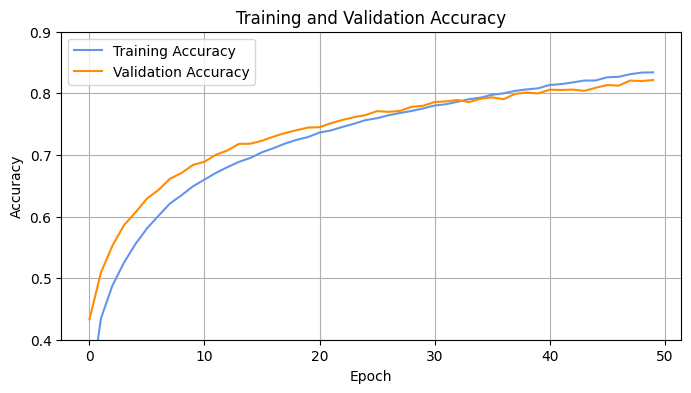

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

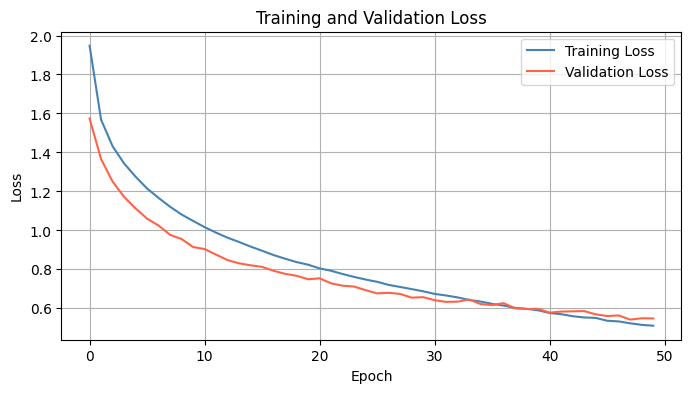

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

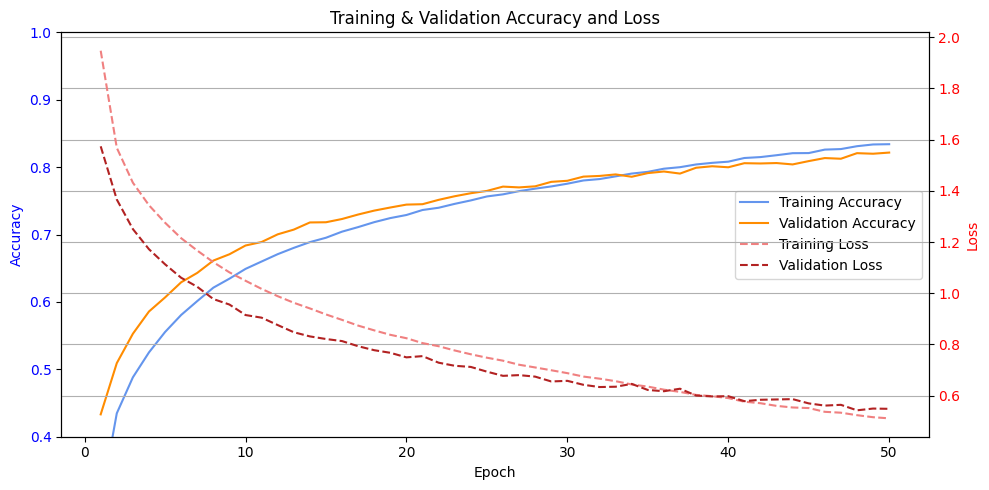

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

epochs = range(1, len(avg_train_acc) + 1)

fig, ax1 = plt.subplots(figsize=(10, 5))

# Plot Accuracy (sumbu kiri)
ax1.set_title('Training & Validation Accuracy and Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy', color='blue')
ax1.plot(epochs, avg_train_acc, label='Training Accuracy', color='cornflowerblue')
ax1.plot(epochs, avg_val_acc, label='Validation Accuracy', color='darkorange')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim(0.4, 1.0)

# Tambahkan sumbu kedua (Loss di sisi kanan)
ax2 = ax1.twinx()
ax2.set_ylabel('Loss', color='red')
ax2.plot(epochs, avg_train_loss, label='Training Loss', linestyle='--', color='lightcoral')
ax2.plot(epochs, avg_val_loss, label='Validation Loss', linestyle='--', color='firebrick')
ax2.tick_params(axis='y', labelcolor='red')

# Gabungkan legend dari kedua sumbu
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='center right')

plt.grid(True)
plt.tight_layout()
plt.show()

### CRNN Model (25% Droout LSTM & Dese Layer, Batch Normalization, Regulation CNN & Dense Layer)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def build_crnn_model(input_shape, num_classes):
    model = Sequential()
    weight_decay = 1e-4  # Nilai regulasi L2

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay), input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(Dropout(0.25))
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer
    model.add(Dropout(0.25))

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu', kernel_regularizer=l2(weight_decay)))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu', kernel_regularizer=l2(weight_decay)))
    model.add(Dropout(0.25))
    model.add(Dense(num_classes, activation='softmax'))  # Dense untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


#### K-Fold Cross Validation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shutil
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Menyimpan metrik setiap fold
fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []

best_model_path = ""
best_generalization_score = float('-inf')  # Skor terbaik untuk keseimbangan

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    # Split data berdasarkan indeks
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    # Buat model
    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)

    # Train model
    epochs = 50
    batch_size = 32
    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    # Simpan history loss & accuracy
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Evaluasi
    val_loss_final, val_acc_final = model.evaluate(X_val, y_val)
    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")

    # Prediksi data validasi
    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    # Hitung Precision, Recall, dan F1-Score
    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Simpan metrik fold ini
    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Cek apakah overfitting, underfitting, atau tidak
    train_acc_final = train_acc[-1]  # Akurasi training di epoch terakhir
    acc_gap = train_acc_final - val_acc_final  # Selisih akurasi training & validasi

    if acc_gap > 0.15:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **OVERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena overfitting
    elif train_acc_final < 0.7 and val_acc_final < 0.7:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **UNDERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena underfitting
    else:
        print(f"✅ Fold {fold+1} memiliki generalisasi yang **baik** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = val_acc_final  # Gunakan akurasi validasi sebagai skor jika model tidak overfitting/underfitting

    # Simpan model jika memiliki generalisasi terbaik
    if generalization_score > best_generalization_score:
        best_generalization_score = generalization_score
        best_model_path = f"/content/drive/MyDrive/dataset/best_crnn_model_25drop_5seg_augmented_cnndensereg.h5"
        model.save(best_model_path)
        print(f"✅ Model terbaik disimpan dari Fold {fold+1} dengan akurasi {val_acc_final:.4f} dan generalisasi yang baik")

print("\n🎉 Training selesai!")


===== Fold 1/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step - accuracy: 0.2256 - loss: 2.1498 - val_accuracy: 0.3910 - val_loss: 1.6440
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step - accuracy: 0.3864 - loss: 1.6778 - val_accuracy: 0.4858 - val_loss: 1.3991
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step - accuracy: 0.4629 - loss: 1.5071 - val_accuracy: 0.5522 - val_loss: 1.2829
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.5038 - loss: 1.3974 - val_accuracy: 0.5593 - val_loss: 1.2146
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step - accuracy: 0.5335 - loss: 1.3273 - val_accuracy: 0.5911 - val_loss: 1.1553
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.5758 - loss: 1.2382 - val_accuracy: 0.6145 - val_loss: 1.1031
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step - accuracy: 0.5877 - loss: 1.2118 - val_accuracy: 0.6253 - val_loss: 1.0708
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - accuracy: 0.6098 - loss: 1.1532 - 

Fold 1 Precision: 0.8035
Fold 1 Recall: 0.8013
Fold 1 F1-Score: 0.8006
✅ Fold 1 memiliki generalisasi yang **baik** (Train Acc: 0.8235, Val Acc: 0.8012)
✅ Model terbaik disimpan dari Fold 1 dengan akurasi 0.8012 dan generalisasi yang baik

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 46s 56ms/step - accuracy: 0.2086 - loss: 2.1735 - val_accuracy: 0.4290 - val_loss: 1.6342
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.4326 - loss: 1.6387 - val_accuracy: 0.4967 - val_loss: 1.4195
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step - accuracy: 0.4869 - loss: 1.4775 - val_accuracy: 0.5468 - val_loss: 1.2735
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5161 - loss: 1.3748 - val_accuracy: 0.5756 - val_loss: 1.2334
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - accuracy: 0.5501 - loss: 1.2958 - val_accuracy: 0.6048 - val_loss: 1.1325
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step - accuracy: 0.5758 - loss: 1.2443 - val_accuracy: 0.6253 - val_loss: 1.0803
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.6046 - loss: 1.1815 - val_accuracy: 0.6124 - val_loss: 1.0991
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step - accuracy: 0.6143 - loss: 1.1437 - 

Fold 2 Precision: 0.8356
Fold 2 Recall: 0.8301
Fold 2 F1-Score: 0.8291
✅ Fold 2 memiliki generalisasi yang **baik** (Train Acc: 0.8417, Val Acc: 0.8292)
✅ Model terbaik disimpan dari Fold 2 dengan akurasi 0.8292 dan generalisasi yang baik

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step - accuracy: 0.2365 - loss: 2.1593 - val_accuracy: 0.4185 - val_loss: 1.5779
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.4231 - loss: 1.6116 - val_accuracy: 0.5284 - val_loss: 1.3934
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.4893 - loss: 1.4517 - val_accuracy: 0.5489 - val_loss: 1.2928
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.5176 - loss: 1.3697 - val_accuracy: 0.5702 - val_loss: 1.2339
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5483 - loss: 1.3118 - val_accuracy: 0.5869 - val_loss: 1.1602
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5736 - loss: 1.2423 - val_accuracy: 0.6178 - val_loss: 1.1067
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - accuracy: 0.5846 - loss: 1.1978 - val_accuracy: 0.6312 - val_loss: 1.0924
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step - accuracy: 0.6011 - loss: 1.1672 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step - accuracy: 0.2143 - loss: 2.1771 - val_accuracy: 0.4282 - val_loss: 1.6468
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step - accuracy: 0.4029 - loss: 1.6729 - val_accuracy: 0.5121 - val_loss: 1.3893
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.4640 - loss: 1.5048 - val_accuracy: 0.5459 - val_loss: 1.2724
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.4990 - loss: 1.4206 - val_accuracy: 0.5764 - val_loss: 1.2010
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.5371 - loss: 1.3224 - val_accuracy: 0.6023 - val_loss: 1.1389
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step - accuracy: 0.5673 - loss: 1.2644 - val_accuracy: 0.6303 - val_loss: 1.0786
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step - accuracy: 0.5924 - loss: 1.2158 - val_accuracy: 0.6399 - val_loss: 1.0442
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.6105 - loss: 1.1757 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step - accuracy: 0.2596 - loss: 2.1398 - val_accuracy: 0.4344 - val_loss: 1.5840
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step - accuracy: 0.4334 - loss: 1.6109 - val_accuracy: 0.5401 - val_loss: 1.3466
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.5052 - loss: 1.4390 - val_accuracy: 0.5702 - val_loss: 1.2411
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step - accuracy: 0.5486 - loss: 1.3231 - val_accuracy: 0.5990 - val_loss: 1.1585
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.5757 - loss: 1.2579 - val_accuracy: 0.6216 - val_loss: 1.1052
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.5914 - loss: 1.2013 - val_accuracy: 0.6307 - val_loss: 1.0691
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.6137 - loss: 1.1603 - val_accuracy: 0.6596 - val_loss: 1.0150
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.6296 - loss: 1.1221 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step - accuracy: 0.2357 - loss: 2.1289 - val_accuracy: 0.4231 - val_loss: 1.5845
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - accuracy: 0.4181 - loss: 1.6109 - val_accuracy: 0.5188 - val_loss: 1.3582
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step - accuracy: 0.4856 - loss: 1.4569 - val_accuracy: 0.5664 - val_loss: 1.2396
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.5248 - loss: 1.3690 - val_accuracy: 0.6023 - val_loss: 1.1632
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5599 - loss: 1.2879 - val_accuracy: 0.6211 - val_loss: 1.1114
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5827 - loss: 1.2314 - val_accuracy: 0.6307 - val_loss: 1.0638
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step - accuracy: 0.5987 - loss: 1.1907 - val_accuracy: 0.6508 - val_loss: 1.0152
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - accuracy: 0.6129 - loss: 1.1467 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step - accuracy: 0.2138 - loss: 2.1787 - val_accuracy: 0.4570 - val_loss: 1.5365
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step - accuracy: 0.4281 - loss: 1.6052 - val_accuracy: 0.5263 - val_loss: 1.3413
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.4839 - loss: 1.4615 - val_accuracy: 0.5702 - val_loss: 1.2278
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step - accuracy: 0.5305 - loss: 1.3470 - val_accuracy: 0.6019 - val_loss: 1.1529
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.5561 - loss: 1.2804 - val_accuracy: 0.6161 - val_loss: 1.1240
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - accuracy: 0.5811 - loss: 1.2235 - val_accuracy: 0.6449 - val_loss: 1.0326
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step - accuracy: 0.6008 - loss: 1.1840 - val_accuracy: 0.6458 - val_loss: 1.0261
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step - accuracy: 0.6089 - loss: 1.1538 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - accuracy: 0.2379 - loss: 2.1596 - val_accuracy: 0.3872 - val_loss: 1.6606
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step - accuracy: 0.4204 - loss: 1.6328 - val_accuracy: 0.5142 - val_loss: 1.3704
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.4851 - loss: 1.4655 - val_accuracy: 0.5693 - val_loss: 1.2378
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 52ms/step - accuracy: 0.5280 - loss: 1.3541 - val_accuracy: 0.6003 - val_loss: 1.1558
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.5651 - loss: 1.2818 - val_accuracy: 0.6341 - val_loss: 1.1210
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step - accuracy: 0.5965 - loss: 1.2070 - val_accuracy: 0.6537 - val_loss: 1.0451
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.6088 - loss: 1.1644 - val_accuracy: 0.6671 - val_loss: 0.9901
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step - accuracy: 0.6326 - loss: 1.1118 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step - accuracy: 0.2190 - loss: 2.1546 - val_accuracy: 0.4741 - val_loss: 1.4976
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - accuracy: 0.4372 - loss: 1.6099 - val_accuracy: 0.5363 - val_loss: 1.3198
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.4780 - loss: 1.4618 - val_accuracy: 0.5744 - val_loss: 1.2257
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5149 - loss: 1.3782 - val_accuracy: 0.5944 - val_loss: 1.1724
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step - accuracy: 0.5451 - loss: 1.3151 - val_accuracy: 0.6216 - val_loss: 1.1184
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step - accuracy: 0.5773 - loss: 1.2427 - val_accuracy: 0.6529 - val_loss: 1.0592
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step - accuracy: 0.5978 - loss: 1.1893 - val_accuracy: 0.6642 - val_loss: 0.9991
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step - accuracy: 0.6242 - loss: 1.1530 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 52ms/step - accuracy: 0.2362 - loss: 2.1479 - val_accuracy: 0.4495 - val_loss: 1.5891
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.4235 - loss: 1.6321 - val_accuracy: 0.5439 - val_loss: 1.3097
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - accuracy: 0.5006 - loss: 1.4314 - val_accuracy: 0.5764 - val_loss: 1.2076
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - accuracy: 0.5343 - loss: 1.3424 - val_accuracy: 0.5890 - val_loss: 1.1744
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - accuracy: 0.5605 - loss: 1.2830 - val_accuracy: 0.6128 - val_loss: 1.1259
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - accuracy: 0.5960 - loss: 1.2099 - val_accuracy: 0.6424 - val_loss: 1.0408
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 50ms/step - accuracy: 0.6257 - loss: 1.1341 - val_accuracy: 0.6583 - val_loss: 0.9893
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.6355 - loss: 1.0987 - 

In [ ]:
print("\n===== Rata-rata hasil Cross-Validation =====")
print(f"Accuracy: {np.mean(fold_accuracies):.4f} ± {np.std(fold_accuracies):.4f}")
print(f"Precision: {np.mean(fold_precisions):.4f} ± {np.std(fold_precisions):.4f}")
print(f"Recall: {np.mean(fold_recalls):.4f} ± {np.std(fold_recalls):.4f}")
print(f"F1-Score: {np.mean(fold_f1_scores):.4f} ± {np.std(fold_f1_scores):.4f}")


===== Rata-rata hasil Cross-Validation =====
Accuracy: 0.8186 ± 0.0085
Precision: 0.8200 ± 0.0084
Recall: 0.8190 ± 0.0085
F1-Score: 0.8176 ± 0.0082


In [ ]:
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8352
Rata-rata Akurasi Validasi Terakhir: 0.8186
Gap Akurasi: 0.0165
✅ Model memiliki generalisasi yang **baik**.


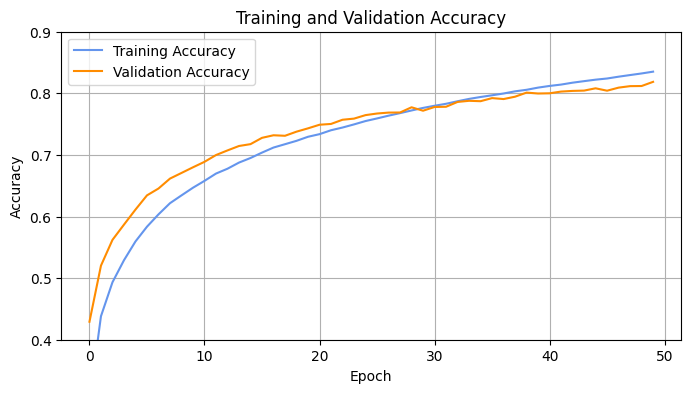

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

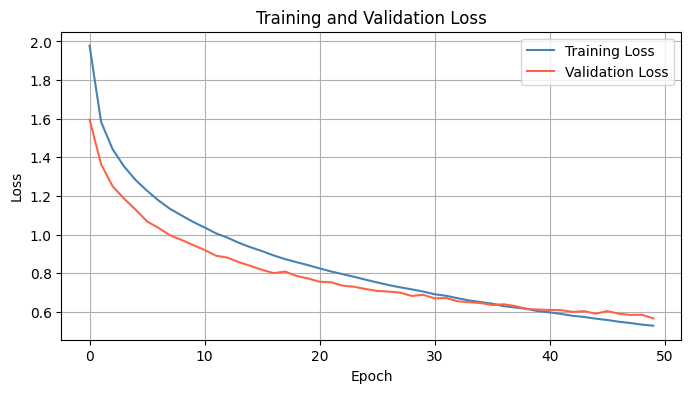

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

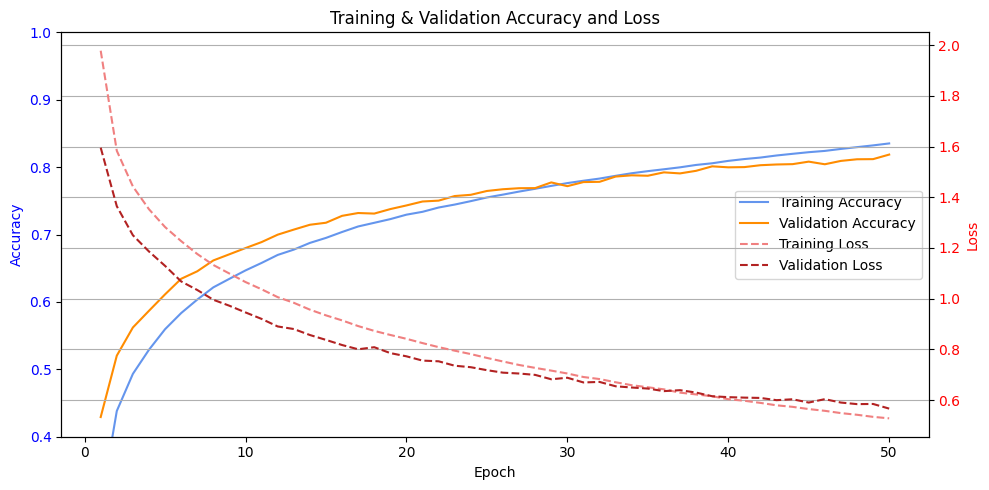

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

epochs = range(1, len(avg_train_acc) + 1)

fig, ax1 = plt.subplots(figsize=(10, 5))

# Plot Accuracy (sumbu kiri)
ax1.set_title('Training & Validation Accuracy and Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy', color='blue')
ax1.plot(epochs, avg_train_acc, label='Training Accuracy', color='cornflowerblue')
ax1.plot(epochs, avg_val_acc, label='Validation Accuracy', color='darkorange')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim(0.4, 1.0)

# Tambahkan sumbu kedua (Loss di sisi kanan)
ax2 = ax1.twinx()
ax2.set_ylabel('Loss', color='red')
ax2.plot(epochs, avg_train_loss, label='Training Loss', linestyle='--', color='lightcoral')
ax2.plot(epochs, avg_val_loss, label='Validation Loss', linestyle='--', color='firebrick')
ax2.tick_params(axis='y', labelcolor='red')

# Gabungkan legend dari kedua sumbu
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='center right')

plt.grid(True)
plt.tight_layout()
plt.show()

### CRNN Model (25% Dropout LSTM & Dense Layer, Batch Normalization, Regulation, LSTM 64 filter)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def build_crnn_model(input_shape, num_classes):
    model = Sequential()
    weight_decay = 1e-4  # Nilai regulasi L2

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay), input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (64 units)
    model.add(LSTM(64, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(Dropout(0.25))
    model.add(LSTM(64))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer
    model.add(Dropout(0.25))

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))  # Dropout 30% untuk regularisasi
    model.add(Dense(num_classes, activation='softmax'))  # Dense untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


#### K-Fold Cross Validation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shutil
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Menyimpan metrik setiap fold
fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []

best_model_path = ""
best_generalization_score = float('-inf')  # Skor terbaik untuk keseimbangan

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    # Split data berdasarkan indeks
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    # Buat model
    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)

    # Train model
    epochs = 50
    batch_size = 32
    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    # Simpan history loss & accuracy
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Evaluasi
    val_loss_final, val_acc_final = model.evaluate(X_val, y_val)
    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")

    # Prediksi data validasi
    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    # Hitung Precision, Recall, dan F1-Score
    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Simpan metrik fold ini
    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Cek apakah overfitting, underfitting, atau tidak
    train_acc_final = train_acc[-1]  # Akurasi training di epoch terakhir
    acc_gap = train_acc_final - val_acc_final  # Selisih akurasi training & validasi

    if acc_gap > 0.15:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **OVERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena overfitting
    elif train_acc_final < 0.7 and val_acc_final < 0.7:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **UNDERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena underfitting
    else:
        print(f"✅ Fold {fold+1} memiliki generalisasi yang **baik** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = val_acc_final  # Gunakan akurasi validasi sebagai skor jika model tidak overfitting/underfitting

    # Simpan model jika memiliki generalisasi terbaik
    if generalization_score > best_generalization_score:
        best_generalization_score = generalization_score
        best_model_path = f"/content/drive/MyDrive/dataset/best_crnn_model_25drop_5seg_augmented_cnnreg_global.h5"
        model.save(best_model_path)
        print(f"✅ Model terbaik disimpan dari Fold {fold+1} dengan akurasi {val_acc_final:.4f} dan generalisasi yang baik")

print("\n🎉 Training selesai!")


===== Fold 1/10 =====
Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 42ms/step - accuracy: 0.2016 - loss: 2.1801 - val_accuracy: 0.3275 - val_loss: 1.7343
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.3675 - loss: 1.7147 - val_accuracy: 0.4578 - val_loss: 1.4692
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.4433 - loss: 1.5287 - val_accuracy: 0.5213 - val_loss: 1.3315
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - accuracy: 0.4790 - loss: 1.4493 - val_accuracy: 0.5505 - val_loss: 1.2692
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 43ms/step - accuracy: 0.5229 - loss: 1.3392 - val_accuracy: 0.5702 - val_loss: 1.1910
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 42ms/step - accuracy: 0.5417 - loss: 1.2998 - val_accuracy: 0.5819 - val_loss: 1.1826
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.5539 - loss: 1.2614 - val_accuracy: 0.6048 - val_loss: 1.1245
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - accuracy: 0

Fold 1 Precision: 0.7915
Fold 1 Recall: 0.7929
Fold 1 F1-Score: 0.7899
✅ Fold 1 memiliki generalisasi yang **baik** (Train Acc: 0.8064, Val Acc: 0.7911)
✅ Model terbaik disimpan dari Fold 1 dengan akurasi 0.7911 dan generalisasi yang baik

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 45ms/step - accuracy: 0.2051 - loss: 2.2034 - val_accuracy: 0.3872 - val_loss: 1.6964
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 45ms/step - accuracy: 0.3979 - loss: 1.6887 - val_accuracy: 0.4858 - val_loss: 1.4227
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 43ms/step - accuracy: 0.4548 - loss: 1.4926 - val_accuracy: 0.5142 - val_loss: 1.3357
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - accuracy: 0.4935 - loss: 1.3965 - val_accuracy: 0.5493 - val_loss: 1.2631
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - accuracy: 0.5252 - loss: 1.3290 - val_accuracy: 0.5785 - val_loss: 1.2055
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.5451 - loss: 1.2874 - val_accuracy: 0.6140 - val_loss: 1.1143
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.5696 - loss: 1.2290 - val_accuracy: 0.6228 - val_loss: 1.0922
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - accuracy: 0.5900 - loss: 1.1940 - 

Fold 2 Precision: 0.7994
Fold 2 Recall: 0.8014
Fold 2 F1-Score: 0.7982
✅ Fold 2 memiliki generalisasi yang **baik** (Train Acc: 0.8069, Val Acc: 0.8003)
✅ Model terbaik disimpan dari Fold 2 dengan akurasi 0.8003 dan generalisasi yang baik

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 42ms/step - accuracy: 0.2251 - loss: 2.1594 - val_accuracy: 0.3538 - val_loss: 1.7101
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.3726 - loss: 1.6993 - val_accuracy: 0.4653 - val_loss: 1.4509
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.4518 - loss: 1.5245 - val_accuracy: 0.5363 - val_loss: 1.3113
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5042 - loss: 1.4075 - val_accuracy: 0.5610 - val_loss: 1.2528
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5226 - loss: 1.3357 - val_accuracy: 0.5919 - val_loss: 1.1722
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 42ms/step - accuracy: 0.5578 - loss: 1.2790 - val_accuracy: 0.5931 - val_loss: 1.1335
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.5695 - loss: 1.2542 - val_accuracy: 0.6086 - val_loss: 1.1075
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5919 - loss: 1.2045 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - accuracy: 0.1773 - loss: 2.2355 - val_accuracy: 0.4002 - val_loss: 1.7073
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.3789 - loss: 1.7328 - val_accuracy: 0.5167 - val_loss: 1.3807
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.4726 - loss: 1.5019 - val_accuracy: 0.5526 - val_loss: 1.2646
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.5080 - loss: 1.3880 - val_accuracy: 0.5773 - val_loss: 1.2004
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.5309 - loss: 1.3338 - val_accuracy: 0.6011 - val_loss: 1.1399
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5493 - loss: 1.2884 - val_accuracy: 0.6094 - val_loss: 1.1075
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5675 - loss: 1.2391 - val_accuracy: 0.6186 - val_loss: 1.0736
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5791 - loss: 1.2075 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 42ms/step - accuracy: 0.1900 - loss: 2.2288 - val_accuracy: 0.3596 - val_loss: 1.7433
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - accuracy: 0.3748 - loss: 1.7244 - val_accuracy: 0.4774 - val_loss: 1.4568
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.4569 - loss: 1.5134 - val_accuracy: 0.5443 - val_loss: 1.2944
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5039 - loss: 1.3921 - val_accuracy: 0.5660 - val_loss: 1.2209
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5372 - loss: 1.3197 - val_accuracy: 0.5744 - val_loss: 1.1800
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.5490 - loss: 1.2882 - val_accuracy: 0.6044 - val_loss: 1.1199
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5734 - loss: 1.2352 - val_accuracy: 0.6003 - val_loss: 1.1173
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5903 - loss: 1.1945 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - accuracy: 0.1997 - loss: 2.2006 - val_accuracy: 0.4524 - val_loss: 1.5652
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 29s 43ms/step - accuracy: 0.4249 - loss: 1.6146 - val_accuracy: 0.5109 - val_loss: 1.3563
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - accuracy: 0.4759 - loss: 1.4605 - val_accuracy: 0.5815 - val_loss: 1.2213
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 43ms/step - accuracy: 0.5211 - loss: 1.3633 - val_accuracy: 0.5969 - val_loss: 1.1866
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step - accuracy: 0.5449 - loss: 1.3023 - val_accuracy: 0.6048 - val_loss: 1.1344
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step - accuracy: 0.5663 - loss: 1.2524 - val_accuracy: 0.6190 - val_loss: 1.0887
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - accuracy: 0.5876 - loss: 1.2199 - val_accuracy: 0.6441 - val_loss: 1.0320
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 42ms/step - accuracy: 0.6031 - loss: 1.1639 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - accuracy: 0.1960 - loss: 2.2103 - val_accuracy: 0.3613 - val_loss: 1.7798
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 39ms/step - accuracy: 0.3641 - loss: 1.7589 - val_accuracy: 0.4992 - val_loss: 1.4436
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.4394 - loss: 1.5471 - val_accuracy: 0.5180 - val_loss: 1.3409
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - accuracy: 0.4780 - loss: 1.4500 - val_accuracy: 0.5718 - val_loss: 1.2162
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5141 - loss: 1.3749 - val_accuracy: 0.6015 - val_loss: 1.1426
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5391 - loss: 1.3149 - val_accuracy: 0.6236 - val_loss: 1.0924
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.5533 - loss: 1.2812 - val_accuracy: 0.6195 - val_loss: 1.0992
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - accuracy: 0.5721 - loss: 1.2434 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 42ms/step - accuracy: 0.1879 - loss: 2.2065 - val_accuracy: 0.3693 - val_loss: 1.6792
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step - accuracy: 0.3816 - loss: 1.6852 - val_accuracy: 0.4937 - val_loss: 1.4063
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.4614 - loss: 1.4795 - val_accuracy: 0.5188 - val_loss: 1.3036
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 42ms/step - accuracy: 0.4897 - loss: 1.4101 - val_accuracy: 0.5405 - val_loss: 1.2660
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - accuracy: 0.5317 - loss: 1.3302 - val_accuracy: 0.5744 - val_loss: 1.1768
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 43ms/step - accuracy: 0.5495 - loss: 1.2778 - val_accuracy: 0.5777 - val_loss: 1.1552
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - accuracy: 0.5659 - loss: 1.2487 - val_accuracy: 0.6019 - val_loss: 1.1025
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - accuracy: 0.5817 - loss: 1.2114 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 42ms/step - accuracy: 0.2145 - loss: 2.1822 - val_accuracy: 0.4549 - val_loss: 1.5404
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 40ms/step - accuracy: 0.4092 - loss: 1.6290 - val_accuracy: 0.5155 - val_loss: 1.3301
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - accuracy: 0.4624 - loss: 1.4824 - val_accuracy: 0.5581 - val_loss: 1.2329
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.4975 - loss: 1.3961 - val_accuracy: 0.5869 - val_loss: 1.1682
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - accuracy: 0.5232 - loss: 1.3390 - val_accuracy: 0.6178 - val_loss: 1.1125
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 42ms/step - accuracy: 0.5521 - loss: 1.2595 - val_accuracy: 0.6278 - val_loss: 1.0505
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 40ms/step - accuracy: 0.5704 - loss: 1.2224 - val_accuracy: 0.6420 - val_loss: 1.0270
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5880 - loss: 1.1871 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 44ms/step - accuracy: 0.2093 - loss: 2.1893 - val_accuracy: 0.3751 - val_loss: 1.6821
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - accuracy: 0.3893 - loss: 1.6978 - val_accuracy: 0.4958 - val_loss: 1.4140
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - accuracy: 0.4508 - loss: 1.5196 - val_accuracy: 0.5292 - val_loss: 1.3036
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step - accuracy: 0.4783 - loss: 1.4375 - val_accuracy: 0.5530 - val_loss: 1.2490
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - accuracy: 0.5110 - loss: 1.3785 - val_accuracy: 0.5773 - val_loss: 1.2002
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.5331 - loss: 1.3250 - val_accuracy: 0.5944 - val_loss: 1.1613
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - accuracy: 0.5550 - loss: 1.2792 - val_accuracy: 0.6044 - val_loss: 1.1165
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 28s 41ms/step - accuracy: 0.5642 - loss: 1.2537 - 

In [ ]:
print("\n===== Rata-rata hasil Cross-Validation =====")
print(f"Accuracy: {np.mean(fold_accuracies):.4f} ± {np.std(fold_accuracies):.4f}")
print(f"Precision: {np.mean(fold_precisions):.4f} ± {np.std(fold_precisions):.4f}")
print(f"Recall: {np.mean(fold_recalls):.4f} ± {np.std(fold_recalls):.4f}")
print(f"F1-Score: {np.mean(fold_f1_scores):.4f} ± {np.std(fold_f1_scores):.4f}")


===== Rata-rata hasil Cross-Validation =====
Accuracy: 0.7863 ± 0.0129
Precision: 0.7880 ± 0.0126
Recall: 0.7868 ± 0.0127
F1-Score: 0.7841 ± 0.0144


In [ ]:
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8013
Rata-rata Akurasi Validasi Terakhir: 0.7863
Gap Akurasi: 0.0150
✅ Model memiliki generalisasi yang **baik**.


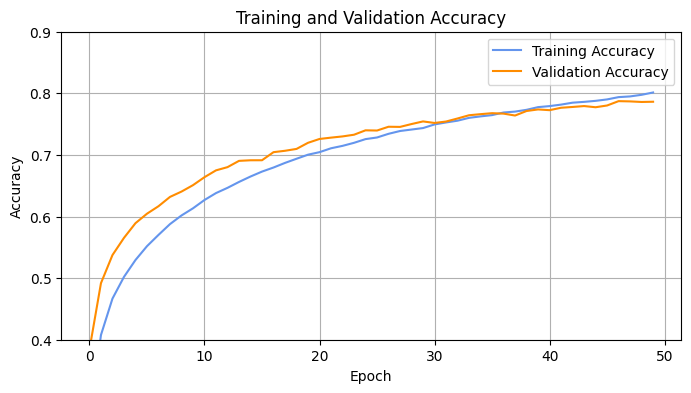

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

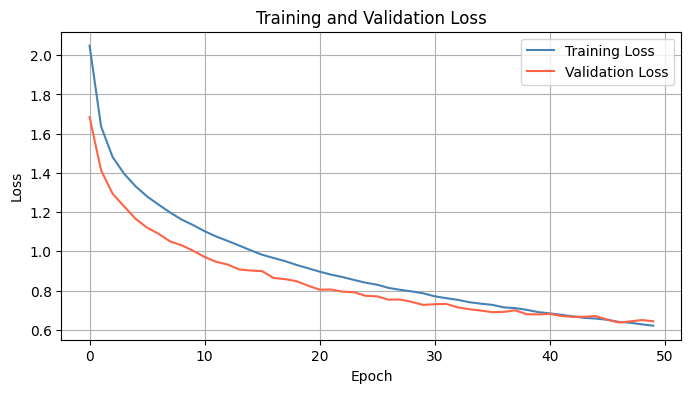

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

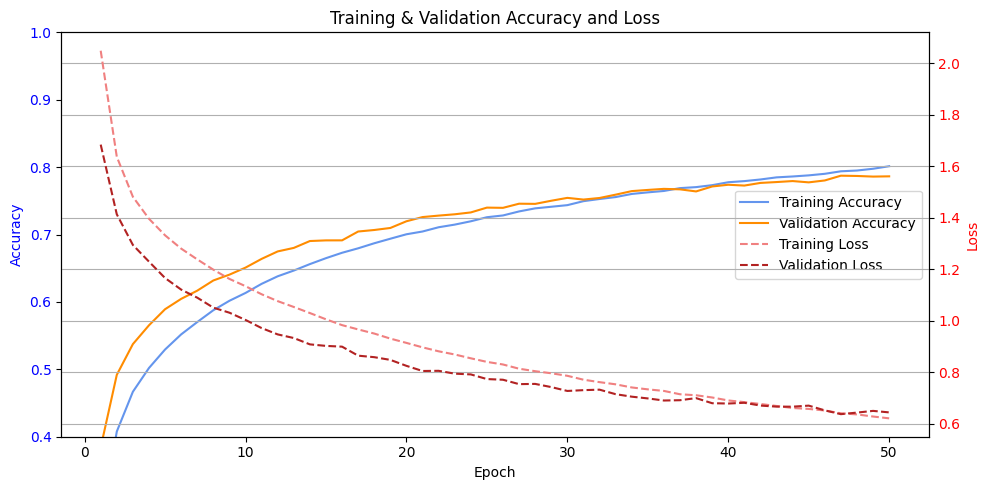

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

epochs = range(1, len(avg_train_acc) + 1)

fig, ax1 = plt.subplots(figsize=(10, 5))

# Plot Accuracy (sumbu kiri)
ax1.set_title('Training & Validation Accuracy and Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy', color='blue')
ax1.plot(epochs, avg_train_acc, label='Training Accuracy', color='cornflowerblue')
ax1.plot(epochs, avg_val_acc, label='Validation Accuracy', color='darkorange')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim(0.4, 1.0)

# Tambahkan sumbu kedua (Loss di sisi kanan)
ax2 = ax1.twinx()
ax2.set_ylabel('Loss', color='red')
ax2.plot(epochs, avg_train_loss, label='Training Loss', linestyle='--', color='lightcoral')
ax2.plot(epochs, avg_val_loss, label='Validation Loss', linestyle='--', color='firebrick')
ax2.tick_params(axis='y', labelcolor='red')

# Gabungkan legend dari kedua sumbu
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='center right')

plt.grid(True)
plt.tight_layout()
plt.show()

### CRNN Model (25% Dropout, BiLSTM, Batch Normalization, Regulation)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization, Bidirectional  # Tambahkan Bidirectional
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def build_crnn_model(input_shape, num_classes):
    model = Sequential()
    weight_decay = 1e-4  # Nilai regulasi L2

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay), input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # BiLSTM Layers
    model.add(Bidirectional(LSTM(128, return_sequences=True)))  # BiLSTM pertama
    model.add(Dropout(0.25))
    model.add(Bidirectional(LSTM(128)))  # BiLSTM kedua (tanpa return_sequences)
    model.add(Dropout(0.25))

    # Flatten Layer
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(num_classes, activation='softmax'))

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model BiLSTM siap digunakan!")


#### K-Fold Cross Validation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shutil
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Menyimpan metrik setiap fold
fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []

best_model_path = ""
best_generalization_score = float('-inf')  # Skor terbaik untuk keseimbangan

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    # Split data berdasarkan indeks
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    # Buat model
    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)

    # Train model
    epochs = 50
    batch_size = 32
    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    # Simpan history loss & accuracy
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Evaluasi
    val_loss_final, val_acc_final = model.evaluate(X_val, y_val)
    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")

    # Prediksi data validasi
    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    # Hitung Precision, Recall, dan F1-Score
    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Simpan metrik fold ini
    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Cek apakah overfitting, underfitting, atau tidak
    train_acc_final = train_acc[-1]  # Akurasi training di epoch terakhir
    acc_gap = train_acc_final - val_acc_final  # Selisih akurasi training & validasi

    if acc_gap > 0.15:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **OVERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena overfitting
    elif train_acc_final < 0.7 and val_acc_final < 0.7:
        print(f"⚠️ Fold {fold+1} kemungkinan mengalami **UNDERFITTING** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = -1  # Beri skor rendah karena underfitting
    else:
        print(f"✅ Fold {fold+1} memiliki generalisasi yang **baik** (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f})")
        generalization_score = val_acc_final  # Gunakan akurasi validasi sebagai skor jika model tidak overfitting/underfitting

    # Simpan model jika memiliki generalisasi terbaik
    if generalization_score > best_generalization_score:
        best_generalization_score = generalization_score
        best_model_path = f"/content/drive/MyDrive/dataset/best_crnn_model_25drop_5seg_augmented_end.h5"
        model.save(best_model_path)
        print(f"✅ Model terbaik disimpan dari Fold {fold+1} dengan akurasi {val_acc_final:.4f} dan generalisasi yang baik")

print("\n🎉 Training selesai!")

In [ ]:
print("\n===== Rata-rata hasil Cross-Validation =====")
print(f"Accuracy: {np.mean(fold_accuracies):.4f} ± {np.std(fold_accuracies):.4f}")
print(f"Precision: {np.mean(fold_precisions):.4f} ± {np.std(fold_precisions):.4f}")
print(f"Recall: {np.mean(fold_recalls):.4f} ± {np.std(fold_recalls):.4f}")
print(f"F1-Score: {np.mean(fold_f1_scores):.4f} ± {np.std(fold_f1_scores):.4f}")

In [ ]:
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

epochs = range(1, len(avg_train_acc) + 1)

fig, ax1 = plt.subplots(figsize=(10, 5))

# Plot Accuracy (sumbu kiri)
ax1.set_title('Training & Validation Accuracy and Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy', color='blue')
ax1.plot(epochs, avg_train_acc, label='Training Accuracy', color='cornflowerblue')
ax1.plot(epochs, avg_val_acc, label='Validation Accuracy', color='darkorange')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim(0.4, 1.0)

# Tambahkan sumbu kedua (Loss di sisi kanan)
ax2 = ax1.twinx()
ax2.set_ylabel('Loss', color='red')
ax2.plot(epochs, avg_train_loss, label='Training Loss', linestyle='--', color='lightcoral')
ax2.plot(epochs, avg_val_loss, label='Validation Loss', linestyle='--', color='firebrick')
ax2.tick_params(axis='y', labelcolor='red')

# Gabungkan legend dari kedua sumbu
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='center right')

plt.grid(True)
plt.tight_layout()
plt.show()

### Feature Extraction Delta-Delta

#### untuk training model terlalu lama

In [ ]:
import os
import librosa
import numpy as np
import pandas as pd
import json
from tqdm import tqdm

# Path ke folder dataset
general_path = '/content/drive/MyDrive/dataset/genres_augmented'
output_csv = '/content/drive/MyDrive/dataset/segmented_audio_5s.csv'
output_json = '/content/drive/MyDrive/dataset/segmented_audio_5s.json'
output_npy = '/content/drive/MyDrive/dataset/mfcc_dataset_augmented_5seg.npz'  # File npz untuk menyimpan semua data MFCC

# Parameter segmentasi dan ekstraksi fitur
segment_duration = 5  # Durasi segmentasi dalam detik
n_mfcc = 13  # Jumlah MFCC yang diekstrak
n_fft = 2048
hop_length = 512

# Menampung hasil segmentasi
X, y = [], []
data_segments = []
genre_to_label = {}

# Loop melalui setiap genre
genres = os.listdir(general_path)
for genre in genres:
    genre_dir = os.path.join(general_path, genre)
    if os.path.isdir(genre_dir):
        print(f"Memproses genre: {genre}")

        # Mapping genre ke angka
        if genre not in genre_to_label:
            genre_to_label[genre] = len(genre_to_label)

        # Loop melalui setiap file dalam genre
        for filename in tqdm(os.listdir(genre_dir)):
            if filename.endswith('.wav'):
                file_path = os.path.join(genre_dir, filename)

                try:
                    # Load audio file
                    data, sr = librosa.load(file_path, sr=None)

                    # Segmentasi audio
                    segment_length = int(segment_duration * sr)
                    num_segments = len(data) // segment_length

                    # Proses setiap segmen
                    for idx in range(num_segments):
                        start_sample = idx * segment_length
                        finish_sample = start_sample + segment_length
                        segment = data[start_sample:finish_sample]

                        if len(segment) == segment_length:
                            # Ekstraksi MFCC
                            mfcc = librosa.feature.mfcc(y=segment, sr=sr, n_mfcc=n_mfcc,
                                                        n_fft=n_fft, hop_length=hop_length)
                            delta = librosa.feature.delta(mfcc)
                            delta2 = librosa.feature.delta(mfcc, order=2)

                            # Gabungkan MFCC + delta + delta-delta
                            mfcc_combined = np.concatenate((mfcc, delta, delta2), axis=0)
                            mfcc_combined = mfcc_combined.T  # Transpose agar (time_steps, 39)

                            # Simpan ke array
                            X.append(mfcc_combined)
                            y.append(genre_to_label[genre])

                            # Simpan informasi segmen
                            segment_info = {
                                'genre': genre,
                                'filename': filename,
                                'segment_index': idx + 1,
                                'mfcc_shape': mfcc_combined.shape,  # (time_steps, 39)
                                'genre_label': genre_to_label[genre]
                            }
                            data_segments.append(segment_info)

                except Exception as e:
                    print(f"Kesalahan saat memproses {file_path}: {e}")

# Konversi ke array numpy
X = np.array(X)[..., np.newaxis]  # Shape: (num_samples, time_steps, 39, 1)
y = np.array(y)

# Simpan dataset dalam satu file .npz
np.savez(output_npy, X=X, y=y)
print(f"Dataset MFCC disimpan dalam satu file: {output_npy}")

# Simpan hasil ke CSV
csv_data = pd.DataFrame(data_segments)
csv_data.to_csv(output_csv, index=False)
print(f"Hasil segmentasi disimpan ke: {output_csv}")

# Simpan hasil ke JSON
with open(output_json, 'w') as json_file:
    json.dump(data_segments, json_file, indent=4)
print(f"Hasil segmentasi disimpan ke: {output_json}")

Memproses genre: hiphop


100%|██████████| 400/400 [02:11<00:00,  3.05it/s]


Memproses genre: country


100%|██████████| 400/400 [01:33<00:00,  4.28it/s]


Memproses genre: classical


100%|██████████| 400/400 [01:05<00:00,  6.14it/s]


Memproses genre: rock


100%|██████████| 400/400 [01:01<00:00,  6.52it/s]


Memproses genre: pop


100%|██████████| 400/400 [01:09<00:00,  5.79it/s]


Memproses genre: jazz


100%|██████████| 396/396 [01:01<00:00,  6.45it/s]


Memproses genre: reggae


100%|██████████| 400/400 [01:18<00:00,  5.10it/s]


Memproses genre: disco


100%|██████████| 400/400 [01:05<00:00,  6.07it/s]


Memproses genre: blues


100%|██████████| 400/400 [01:03<00:00,  6.27it/s]


Memproses genre: metal


100%|██████████| 400/400 [01:08<00:00,  5.83it/s]


Memproses genre: .ipynb_checkpoints


0it [00:00, ?it/s]


Dataset MFCC disimpan dalam satu file: /content/drive/MyDrive/dataset/mfcc_dataset_augmented_5seg.npz
Hasil segmentasi disimpan ke: /content/drive/MyDrive/dataset/segmented_audio_5s.csv
Hasil segmentasi disimpan ke: /content/drive/MyDrive/dataset/segmented_audio_5s.json


#### test delta-delta 3 channel

In [ ]:
import os
import librosa
import numpy as np
import pandas as pd
import json
from tqdm import tqdm

# Path ke folder dataset
general_path = '/content/drive/MyDrive/dataset/genres_augmented'
output_csv = '/content/drive/MyDrive/dataset/segmented_audio_5s.csv'
output_json = '/content/drive/MyDrive/dataset/segmented_audio_5s.json'
output_npy = '/content/drive/MyDrive/dataset/mfcc_dataset_augmented_5seg.npz'  # File npz untuk menyimpan semua data MFCC

# Parameter segmentasi dan ekstraksi fitur
segment_duration = 5  # Durasi segmentasi dalam detik
n_mfcc = 13  # Jumlah MFCC yang diekstrak
n_fft = 2048
hop_length = 512

# Menampung hasil segmentasi
X, y = [], []
data_segments = []
genre_to_label = {}

# Loop melalui setiap genre
genres = os.listdir(general_path)
for genre in genres:
    genre_dir = os.path.join(general_path, genre)
    if os.path.isdir(genre_dir):
        print(f"Memproses genre: {genre}")

        # Mapping genre ke angka
        if genre not in genre_to_label:
            genre_to_label[genre] = len(genre_to_label)

        # Loop melalui setiap file dalam genre
        for filename in tqdm(os.listdir(genre_dir)):
            if filename.endswith('.wav'):
                file_path = os.path.join(genre_dir, filename)

                try:
                    # Load audio file
                    data, sr = librosa.load(file_path, sr=None)

                    # Segmentasi audio
                    segment_length = int(segment_duration * sr)
                    num_segments = len(data) // segment_length

                    # Proses setiap segmen
                    for idx in range(num_segments):
                        start_sample = idx * segment_length
                        finish_sample = start_sample + segment_length
                        segment = data[start_sample:finish_sample]

                        if len(segment) == segment_length:
                            # Ekstraksi MFCC
                            mfcc = librosa.feature.mfcc(y=segment, sr=sr, n_mfcc=n_mfcc,
                                                        n_fft=n_fft, hop_length=hop_length)
                            delta = librosa.feature.delta(mfcc)
                            delta2 = librosa.feature.delta(mfcc, order=2)

                            # Gabungkan MFCC + delta + delta-delta sebagai 3 channel
                            mfcc_stack = np.stack([mfcc, delta, delta2], axis=0)  # Shape: (3, 13, time_steps)
                            mfcc_combined = mfcc_stack.transpose(2, 1, 0)  # Shape: (time_steps, 13, 3)

                            # Simpan ke array
                            X.append(mfcc_combined)
                            y.append(genre_to_label[genre])

                            # Simpan informasi segmen
                            segment_info = {
                                'genre': genre,
                                'filename': filename,
                                'segment_index': idx + 1,
                                'mfcc_shape': mfcc_combined.shape,  # (time_steps, 13, 3)
                                'genre_label': genre_to_label[genre]
                            }
                            data_segments.append(segment_info)

                except Exception as e:
                    print(f"Kesalahan saat memproses {file_path}: {e}")

# Konversi ke array numpy
X = np.array(X)  # Shape: (num_samples, time_steps, 13, 3)
y = np.array(y)

# Simpan dataset dalam satu file .npz
np.savez(output_npy, X=X, y=y)
print(f"Dataset MFCC disimpan dalam satu file: {output_npy}")

# Simpan hasil ke CSV
csv_data = pd.DataFrame(data_segments)
csv_data.to_csv(output_csv, index=False)
print(f"Hasil segmentasi disimpan ke: {output_csv}")

# Simpan hasil ke JSON
with open(output_json, 'w') as json_file:
    json.dump(data_segments, json_file, indent=4)
print(f"Hasil segmentasi disimpan ke: {output_json}")

Memproses genre: hiphop


100%|██████████| 400/400 [01:42<00:00,  3.90it/s]


Memproses genre: country


100%|██████████| 400/400 [01:05<00:00,  6.08it/s]


Memproses genre: classical


100%|██████████| 400/400 [00:56<00:00,  7.07it/s]


Memproses genre: rock


100%|██████████| 400/400 [00:56<00:00,  7.13it/s]


Memproses genre: pop


100%|██████████| 400/400 [00:51<00:00,  7.71it/s]


Memproses genre: jazz


100%|██████████| 396/396 [00:53<00:00,  7.46it/s]


Memproses genre: reggae


100%|██████████| 400/400 [00:52<00:00,  7.69it/s]


Memproses genre: disco


100%|██████████| 400/400 [00:51<00:00,  7.74it/s]


Memproses genre: blues


100%|██████████| 400/400 [00:53<00:00,  7.45it/s]


Memproses genre: metal


100%|██████████| 400/400 [00:50<00:00,  7.87it/s]


Memproses genre: .ipynb_checkpoints


0it [00:00, ?it/s]


Dataset MFCC disimpan dalam satu file: /content/drive/MyDrive/dataset/mfcc_dataset_augmented_5seg.npz
Hasil segmentasi disimpan ke: /content/drive/MyDrive/dataset/segmented_audio_5s.csv
Hasil segmentasi disimpan ke: /content/drive/MyDrive/dataset/segmented_audio_5s.json


#### Load Data

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report

# === LOAD DATA ===
npz_path = "/content/drive/MyDrive/dataset/mfcc_dataset_augmented_5seg_norm.npz"

# Muat dataset dari file .npz
data = np.load(npz_path)
X = data["X"]  # Shape: (num_samples, time_steps, n_mfcc, 3)
y = data["y"]  # Shape: (num_samples,)

# One-hot encoding untuk label genre
num_classes = len(np.unique(y))  # Hitung jumlah kelas unik dalam y
y_categorical = to_categorical(y, num_classes)

print("Dataset berhasil dimuat!")
print(f"Shape X: {X.shape}, Shape y: {y_categorical.shape}")

Dataset berhasil dimuat!
Shape X: (23940, 216, 13, 3), Shape y: (23940, 10)


In [ ]:
import json
import numpy as np
from tensorflow.keras.utils import to_categorical

# Path ke file JSON yang menyimpan informasi segmentasi
json_path = "/content/drive/MyDrive/dataset/segmented_audio_5s.json"

# Muat informasi segmentasi
with open(json_path, "r") as json_file:
    data_segments = json.load(json_file)

# Buat kembali genre_to_label dari data segmentasi
genre_to_label = {segment["genre"]: segment["genre_label"] for segment in data_segments}

# Tampilkan isi genre_to_label
print("Mapping Genre ke Label:")
for genre, label in genre_to_label.items():
    print(f"{genre}: {label}")

# === LOAD DATA ===
npz_path = "/content/drive/MyDrive/dataset/mfcc_dataset_augmented_5seg_norm.npz"

# Muat dataset dari file .npz
data = np.load(npz_path)
X = data["X"]  # Shape: (num_samples, time_steps, n_mfcc, 3)
y = data["y"]  # Shape: (num_samples,)

# One-hot encoding untuk label genre
num_classes = len(np.unique(y))  # Hitung jumlah kelas unik dalam y
y_categorical = to_categorical(y, num_classes)

print("\nDataset berhasil dimuat!")
print(f"Shape X: {X.shape}, Shape y: {y_categorical.shape}")

Mapping Genre ke Label:
hiphop: 0
country: 1
classical: 2
rock: 3
pop: 4
jazz: 5
reggae: 6
disco: 7
blues: 8
metal: 9

Dataset berhasil dimuat!
Shape X: (23940, 216, 13, 3), Shape y: (23940, 10)


### CRNN Model

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def build_crnn_model(input_shape, num_classes):
    model = Sequential()
    weight_decay = 1e-4  # Nilai regulasi L2

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay), input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(Dropout(0.25))
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer
    model.add(Dropout(0.25))

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))  # Dropout 30% untuk regularisasi
    model.add(Dense(num_classes, activation='softmax'))  # Dense untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


#### K-Fold Cross Validation

##### training terlalu lama

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shutil
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []
confusion_matrices = []

best_model_path = ""
best_val_acc = float('-inf')
best_acc_gap = float('inf')

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)
    epochs = 50
    batch_size = 32

    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    val_loss_final, val_acc_final = model.evaluate(X_val, y_val)
    train_acc_final = train_acc[-1]
    acc_gap = abs(train_acc_final - val_acc_final)

    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    confusion_matrices.append(cm)

    # Plot Accuracy, Loss, Confusion Matrix side-by-side
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    # Accuracy plot
    axs[0].plot(train_acc, label='Train Acc')
    axs[0].plot(val_acc, label='Val Acc')
    axs[0].set_title(f'Fold {fold+1} - Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Accuracy')
    axs[0].legend()
    axs[0].grid(True)

    # Loss plot
    axs[1].plot(train_loss, label='Train Loss')
    axs[1].plot(val_loss, label='Val Loss')
    axs[1].set_title(f'Fold {fold+1} - Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].legend()
    axs[1].grid(True)

    # Confusion matrix plot
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axs[2])
    axs[2].set_title(f'Fold {fold+1} - Confusion Matrix')
    axs[2].set_xlabel('Predicted Label')
    axs[2].set_ylabel('True Label')

    plt.tight_layout()
    plt.show()

    # Classification metrics
    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")
    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

     # <-- Tambahan: tampilkan ringkasan performa setiap fold
    print(f"Akurasi Fold {fold+1}: (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f}, Gap: {acc_gap:.4f})")

    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Save best model based on val acc and smallest acc gap
    should_save = False
    if val_acc_final > best_val_acc:
        should_save = True
    elif val_acc_final == best_val_acc and acc_gap < best_acc_gap:
        should_save = True

    if should_save:
        best_val_acc = val_acc_final
        best_acc_gap = acc_gap
        best_model_path = "/content/drive/MyDrive/dataset/best_crnn_model_25drop_5seg_augmented.h5"
        model.save(best_model_path)
        print(f"✅ Model terbaik disimpan dari Fold {fold+1} ")

print("\n🎉 Training selesai!")


===== Fold 1/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 75s 90ms/step - accuracy: 0.2391 - loss: 2.1162 - val_accuracy: 0.4336 - val_loss: 1.5630
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 60s 90ms/step - accuracy: 0.4310 - loss: 1.5990 - val_accuracy: 0.5267 - val_loss: 1.3176
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 81s 89ms/step - accuracy: 0.5033 - loss: 1.3963 - val_accuracy: 0.5710 - val_loss: 1.2125
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 81s 87ms/step - accuracy: 0.5521 - loss: 1.2923 - val_accuracy: 0.6199 - val_loss: 1.1097
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - accuracy: 0.5867 - loss: 1.2118 - val_accuracy: 0.6261 - val_loss: 1.0855
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 82s 88ms/step - accuracy: 0.6142 - loss: 1.1522 - val_accuracy: 0.6562 - val_loss: 0.9995
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 81s 86ms/step - accuracy: 0.6382 - loss: 1.0858 - val_accuracy: 0.6617 - val_loss: 0.9881
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 83s 88ms/step - accuracy: 0.6558 - loss: 1.0506 - 

KeyboardInterrupt: 

##### testing dengan 3 channel


===== Fold 1/10 =====
Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step - accuracy: 0.2363 - loss: 2.1146 - val_accuracy: 0.4010 - val_loss: 1.5965
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step - accuracy: 0.4094 - loss: 1.6264 - val_accuracy: 0.4837 - val_loss: 1.3924
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step - accuracy: 0.4866 - loss: 1.4416 - val_accuracy: 0.5505 - val_loss: 1.2533
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 45ms/step - accuracy: 0.5221 - loss: 1.3612 - val_accuracy: 0.5894 - val_loss: 1.1826
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 45ms/step - accuracy: 0.5656 - loss: 1.2555 - val_accuracy: 0.6103 - val_loss: 1.1216
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.5810 - loss: 1.2011 - val_accuracy: 0.6295 - val_loss: 1.0712
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.6094 - loss: 1.1364 - val_accuracy: 0.6491 - val_loss: 1.0057
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0

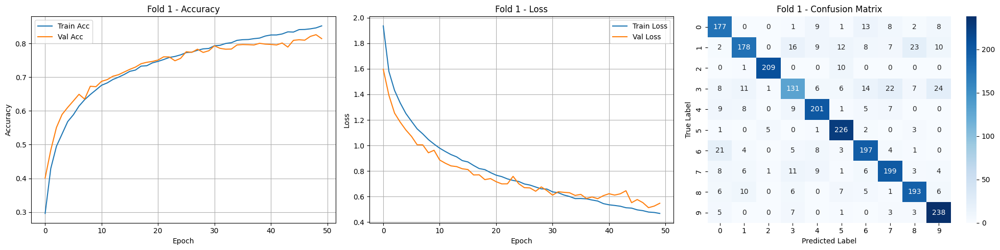

Fold 1 Final Accuracy: 0.8141
Fold 1 Precision: 0.8128
Fold 1 Recall: 0.8151
Fold 1 F1-Score: 0.8117
Akurasi Fold 1: (Train Acc: 0.8519, Val Acc: 0.8141, Gap: 0.0378)
✅ Model terbaik disimpan dari Fold 1 

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - accuracy: 0.2493 - loss: 2.1157 - val_accuracy: 0.4386 - val_loss: 1.5436
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - accuracy: 0.4237 - loss: 1.5964 - val_accuracy: 0.5188 - val_loss: 1.3052
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.4911 - loss: 1.4278 - val_accuracy: 0.5702 - val_loss: 1.1821
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step - accuracy: 0.5283 - loss: 1.3176 - val_accuracy: 0.6040 - val_loss: 1.1324
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.5731 - loss: 1.2383 - val_accuracy: 0.6366 - val_loss: 1.0589
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.6137 - loss: 1.1514 - val_accuracy: 0.6667 - val_loss: 0.9699
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.6336 - loss: 1.0986 - val_accuracy: 0.6846 - val_loss: 0.9396
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step - accuracy: 0.6474 - loss: 1.0622 - 

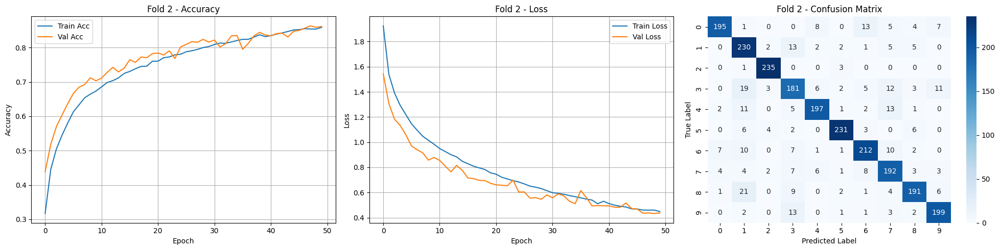

Fold 2 Final Accuracy: 0.8617
Fold 2 Precision: 0.8658
Fold 2 Recall: 0.8615
Fold 2 F1-Score: 0.8625
Akurasi Fold 2: (Train Acc: 0.8593, Val Acc: 0.8617, Gap: 0.0025)
✅ Model terbaik disimpan dari Fold 2 

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step - accuracy: 0.2432 - loss: 2.1159 - val_accuracy: 0.4398 - val_loss: 1.5771
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - accuracy: 0.4321 - loss: 1.5690 - val_accuracy: 0.5347 - val_loss: 1.3200
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.4910 - loss: 1.4180 - val_accuracy: 0.5656 - val_loss: 1.2195
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5276 - loss: 1.3369 - val_accuracy: 0.6036 - val_loss: 1.1396
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step - accuracy: 0.5547 - loss: 1.2725 - val_accuracy: 0.6182 - val_loss: 1.0890
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step - accuracy: 0.5888 - loss: 1.1975 - val_accuracy: 0.6399 - val_loss: 1.0385
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step - accuracy: 0.6085 - loss: 1.1424 - val_accuracy: 0.6583 - val_loss: 0.9921
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step - accuracy: 0.6257 - loss: 1.0983 - 

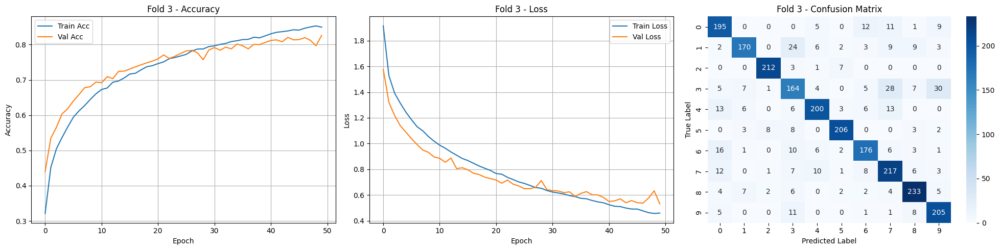

Fold 3 Final Accuracy: 0.8262
Fold 3 Precision: 0.8303
Fold 3 Recall: 0.8274
Fold 3 F1-Score: 0.8276
Akurasi Fold 3: (Train Acc: 0.8493, Val Acc: 0.8262, Gap: 0.0231)

===== Fold 4/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.2501 - loss: 2.1301 - val_accuracy: 0.4378 - val_loss: 1.5667
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.4178 - loss: 1.6174 - val_accuracy: 0.5129 - val_loss: 1.3792
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.4708 - loss: 1.4683 - val_accuracy: 0.5518 - val_loss: 1.2494
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.5192 - loss: 1.3609 - val_accuracy: 0.6023 - val_loss: 1.1455
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step - accuracy: 0.5588 - loss: 1.2789 - val_accuracy: 0.6253 - val_loss: 1.0850
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step - accuracy: 0.5855 - loss: 1.2006 - val_accuracy: 0.6399 - val_loss: 1.0414
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step - accuracy: 0.6158 - loss: 1.1411 - val_accuracy: 0.6500 - val_loss: 1.0065
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step - accuracy: 0.6264 - loss: 1.1099 - 

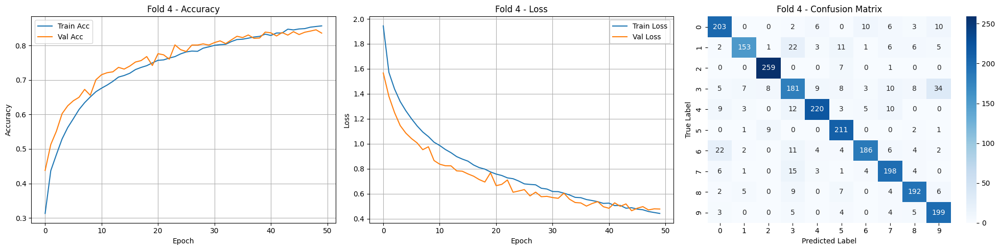

Fold 4 Final Accuracy: 0.8363
Fold 4 Precision: 0.8386
Fold 4 Recall: 0.8372
Fold 4 F1-Score: 0.8355
Akurasi Fold 4: (Train Acc: 0.8572, Val Acc: 0.8363, Gap: 0.0210)

===== Fold 5/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 50ms/step - accuracy: 0.2386 - loss: 2.1201 - val_accuracy: 0.4185 - val_loss: 1.5844
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step - accuracy: 0.4026 - loss: 1.6337 - val_accuracy: 0.4728 - val_loss: 1.4305
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step - accuracy: 0.4615 - loss: 1.4686 - val_accuracy: 0.5556 - val_loss: 1.2753
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step - accuracy: 0.5087 - loss: 1.3656 - val_accuracy: 0.5522 - val_loss: 1.2543
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.5415 - loss: 1.2947 - val_accuracy: 0.5931 - val_loss: 1.1152
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5720 - loss: 1.2186 - val_accuracy: 0.6090 - val_loss: 1.1019
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.6010 - loss: 1.1675 - val_accuracy: 0.6366 - val_loss: 1.0378
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.6178 - loss: 1.1156 - 

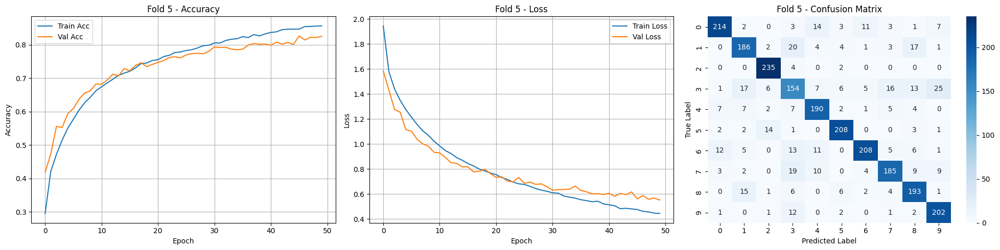

Fold 5 Final Accuracy: 0.8250
Fold 5 Precision: 0.8248
Fold 5 Recall: 0.8272
Fold 5 F1-Score: 0.8248
Akurasi Fold 5: (Train Acc: 0.8564, Val Acc: 0.8250, Gap: 0.0314)

===== Fold 6/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step - accuracy: 0.2266 - loss: 2.1283 - val_accuracy: 0.4282 - val_loss: 1.6032
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.4142 - loss: 1.6396 - val_accuracy: 0.5317 - val_loss: 1.3271
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.4789 - loss: 1.4473 - val_accuracy: 0.5723 - val_loss: 1.2032
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.5232 - loss: 1.3479 - val_accuracy: 0.6090 - val_loss: 1.1342
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5492 - loss: 1.2781 - val_accuracy: 0.6299 - val_loss: 1.0758
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5881 - loss: 1.1943 - val_accuracy: 0.6495 - val_loss: 1.0242
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.6092 - loss: 1.1513 - val_accuracy: 0.6529 - val_loss: 1.0035
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.6243 - loss: 1.1205 - 

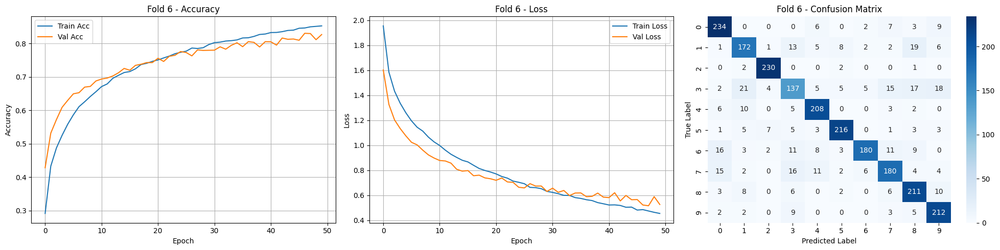

Fold 6 Final Accuracy: 0.8271
Fold 6 Precision: 0.8266
Fold 6 Recall: 0.8257
Fold 6 F1-Score: 0.8241
Akurasi Fold 6: (Train Acc: 0.8530, Val Acc: 0.8271, Gap: 0.0259)

===== Fold 7/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step - accuracy: 0.2267 - loss: 2.1442 - val_accuracy: 0.4373 - val_loss: 1.5535
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step - accuracy: 0.4120 - loss: 1.6225 - val_accuracy: 0.5075 - val_loss: 1.3616
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step - accuracy: 0.4633 - loss: 1.4952 - val_accuracy: 0.5526 - val_loss: 1.2559
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 51ms/step - accuracy: 0.5120 - loss: 1.3671 - val_accuracy: 0.5906 - val_loss: 1.1677
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 50ms/step - accuracy: 0.5515 - loss: 1.2926 - val_accuracy: 0.6249 - val_loss: 1.1214
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.5805 - loss: 1.2261 - val_accuracy: 0.6483 - val_loss: 1.0392
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.6104 - loss: 1.1554 - val_accuracy: 0.6675 - val_loss: 0.9928
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.6308 - loss: 1.1063 - 

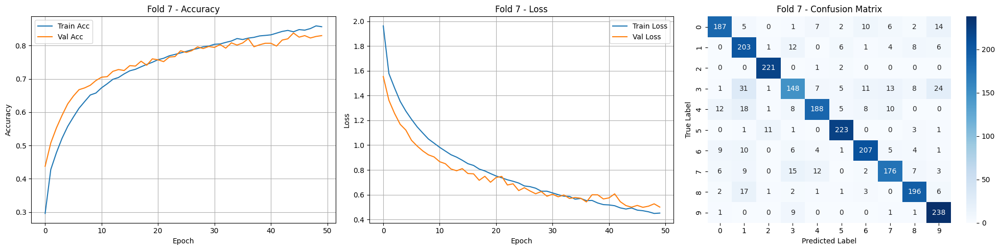

Fold 7 Final Accuracy: 0.8300
Fold 7 Precision: 0.8324
Fold 7 Recall: 0.8315
Fold 7 F1-Score: 0.8293
Akurasi Fold 7: (Train Acc: 0.8568, Val Acc: 0.8300, Gap: 0.0268)

===== Fold 8/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 50s 56ms/step - accuracy: 0.2242 - loss: 2.1294 - val_accuracy: 0.4373 - val_loss: 1.5708
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.4240 - loss: 1.5882 - val_accuracy: 0.5313 - val_loss: 1.3412
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step - accuracy: 0.4969 - loss: 1.4183 - val_accuracy: 0.5785 - val_loss: 1.2062
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - accuracy: 0.5548 - loss: 1.2960 - val_accuracy: 0.6057 - val_loss: 1.1300
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step - accuracy: 0.5796 - loss: 1.2313 - val_accuracy: 0.6211 - val_loss: 1.0821
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step - accuracy: 0.5940 - loss: 1.1940 - val_accuracy: 0.6458 - val_loss: 1.0216
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step - accuracy: 0.6228 - loss: 1.1310 - val_accuracy: 0.6495 - val_loss: 1.0033
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - accuracy: 0.6395 - loss: 1.0761 - 

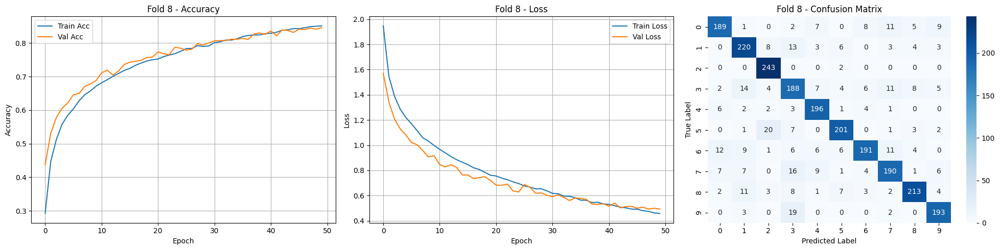

Fold 8 Final Accuracy: 0.8454
Fold 8 Precision: 0.8475
Fold 8 Recall: 0.8467
Fold 8 F1-Score: 0.8460
Akurasi Fold 8: (Train Acc: 0.8510, Val Acc: 0.8454, Gap: 0.0055)

===== Fold 9/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 51ms/step - accuracy: 0.2355 - loss: 2.1202 - val_accuracy: 0.4662 - val_loss: 1.4837
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.4276 - loss: 1.5786 - val_accuracy: 0.5355 - val_loss: 1.2814
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step - accuracy: 0.4986 - loss: 1.4147 - val_accuracy: 0.6124 - val_loss: 1.1596
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.5393 - loss: 1.3171 - val_accuracy: 0.6195 - val_loss: 1.1102
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - accuracy: 0.5675 - loss: 1.2589 - val_accuracy: 0.6512 - val_loss: 1.0404
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.5974 - loss: 1.1882 - val_accuracy: 0.6738 - val_loss: 0.9690
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.6133 - loss: 1.1329 - val_accuracy: 0.6821 - val_loss: 0.9428
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step - accuracy: 0.6313 - loss: 1.0908 - 

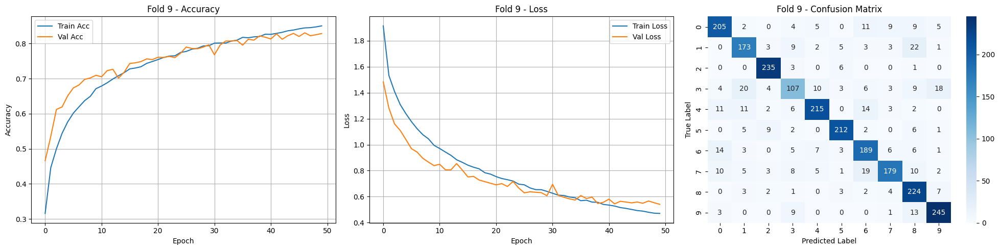

Fold 9 Final Accuracy: 0.8287
Fold 9 Precision: 0.8252
Fold 9 Recall: 0.8214
Fold 9 F1-Score: 0.8212
Akurasi Fold 9: (Train Acc: 0.8506, Val Acc: 0.8287, Gap: 0.0219)

===== Fold 10/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 52ms/step - accuracy: 0.2323 - loss: 2.1391 - val_accuracy: 0.4616 - val_loss: 1.5067
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step - accuracy: 0.4254 - loss: 1.5866 - val_accuracy: 0.5205 - val_loss: 1.3074
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.4944 - loss: 1.4302 - val_accuracy: 0.5610 - val_loss: 1.2406
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.5236 - loss: 1.3467 - val_accuracy: 0.6090 - val_loss: 1.1342
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - accuracy: 0.5630 - loss: 1.2684 - val_accuracy: 0.6261 - val_loss: 1.0823
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step - accuracy: 0.5840 - loss: 1.2110 - val_accuracy: 0.6387 - val_loss: 1.0379
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step - accuracy: 0.5984 - loss: 1.1521 - val_accuracy: 0.6433 - val_loss: 1.0167
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step - accuracy: 0.6177 - loss: 1.1140 - 

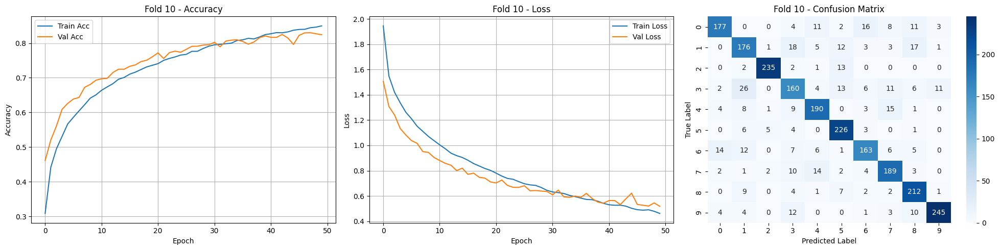

Fold 10 Final Accuracy: 0.8241
Fold 10 Precision: 0.8234
Fold 10 Recall: 0.8215
Fold 10 F1-Score: 0.8212
Akurasi Fold 10: (Train Acc: 0.8498, Val Acc: 0.8241, Gap: 0.0256)

🎉 Training selesai!


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shutil
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []
confusion_matrices = []

best_model_path = ""
best_val_acc = float('-inf')
best_acc_gap = float('inf')

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)
    epochs = 50
    batch_size = 32

    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    val_loss_final, val_acc_final = model.evaluate(X_val, y_val)
    train_acc_final = train_acc[-1]
    acc_gap = abs(train_acc_final - val_acc_final)

    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    confusion_matrices.append(cm)

    # Plot Accuracy, Loss, Confusion Matrix side-by-side
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    # Accuracy plot
    axs[0].plot(train_acc, label='Train Acc')
    axs[0].plot(val_acc, label='Val Acc')
    axs[0].set_title(f'Fold {fold+1} - Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Accuracy')
    axs[0].legend()
    axs[0].grid(True)

    # Loss plot
    axs[1].plot(train_loss, label='Train Loss')
    axs[1].plot(val_loss, label='Val Loss')
    axs[1].set_title(f'Fold {fold+1} - Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].legend()
    axs[1].grid(True)

    # Confusion matrix plot
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axs[2])
    axs[2].set_title(f'Fold {fold+1} - Confusion Matrix')
    axs[2].set_xlabel('Predicted Label')
    axs[2].set_ylabel('True Label')

    plt.tight_layout()
    plt.show()

    # Classification metrics
    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")
    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

     # <-- Tambahan: tampilkan ringkasan performa setiap fold
    print(f"Akurasi Fold {fold+1}: (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f}, Gap: {acc_gap:.4f})")

    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Save best model based on val acc and smallest acc gap
    should_save = False
    if val_acc_final > best_val_acc:
        should_save = True
    elif val_acc_final == best_val_acc and acc_gap < best_acc_gap:
        should_save = True

    if should_save:
        best_val_acc = val_acc_final
        best_acc_gap = acc_gap
        best_model_path = "/content/drive/MyDrive/dataset/best_crnn_model_25drop_5seg_augmented.h5"
        model.save(best_model_path)
        print(f"✅ Model terbaik disimpan dari Fold {fold+1} ")

print("\n🎉 Training selesai!")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8535
Rata-rata Akurasi Validasi Terakhir: 0.8319
Gap Akurasi: 0.0217
✅ Model memiliki generalisasi yang **baik**.

===== Statistik Hasil K-Fold =====
Mean Val Accuracy: 0.8319
Std Dev Val Accuracy: 0.0126
Mean F1-Score: 0.8304
Std Dev F1-Score: 0.0138


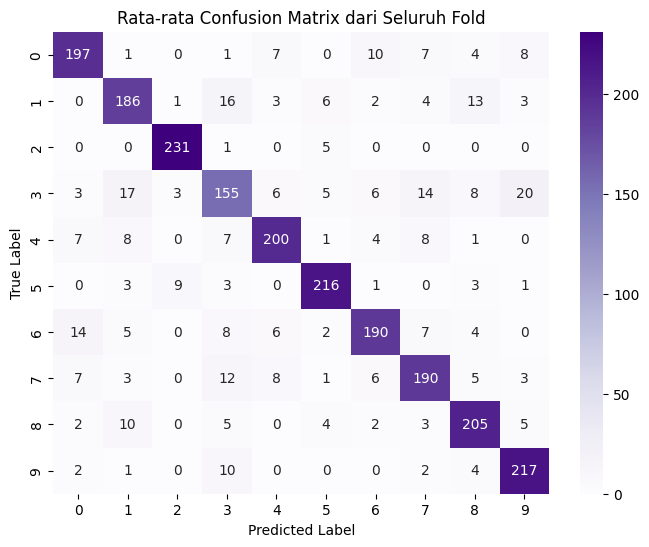

In [ ]:
# ====== Evaluasi Akhir ======
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")

# ====== Statistik Tambahan ======
print("\n===== Statistik Hasil K-Fold =====")
print(f"Mean Val Accuracy: {np.mean(fold_accuracies):.4f}")
print(f"Std Dev Val Accuracy: {np.std(fold_accuracies):.4f}")
print(f"Mean F1-Score: {np.mean(fold_f1_scores):.4f}")
print(f"Std Dev F1-Score: {np.std(fold_f1_scores):.4f}")

# ====== Rata-rata Confusion Matrix ======
mean_cm = np.mean(confusion_matrices, axis=0).astype(int)

plt.figure(figsize=(8, 6))
sns.heatmap(mean_cm, annot=True, fmt='d', cmap='Purples')
plt.title('Rata-rata Confusion Matrix dari Seluruh Fold')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

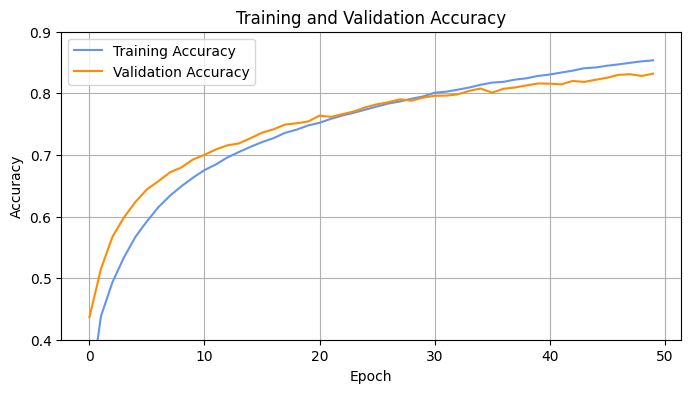

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

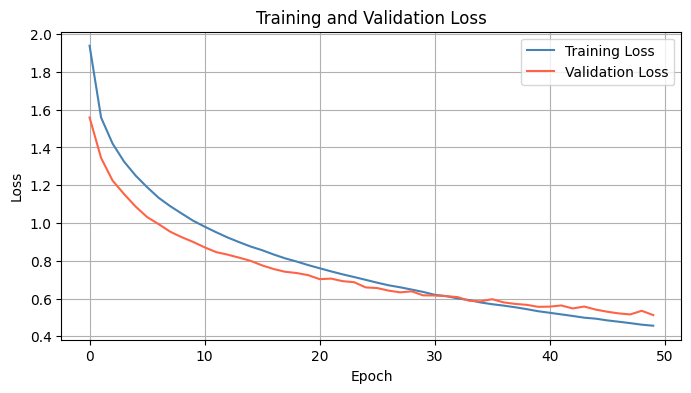

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

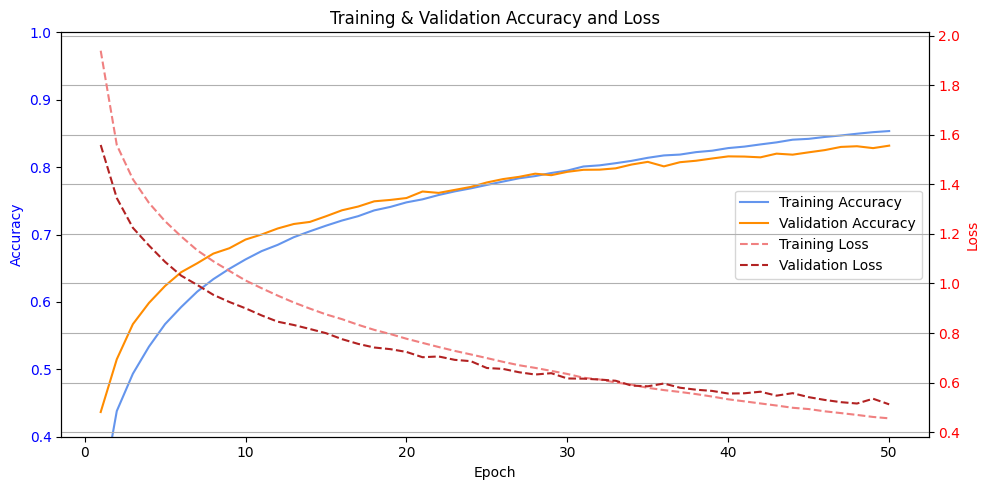

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

epochs = range(1, len(avg_train_acc) + 1)

fig, ax1 = plt.subplots(figsize=(10, 5))

# Plot Accuracy (sumbu kiri)
ax1.set_title('Training & Validation Accuracy and Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy', color='blue')
ax1.plot(epochs, avg_train_acc, label='Training Accuracy', color='cornflowerblue')
ax1.plot(epochs, avg_val_acc, label='Validation Accuracy', color='darkorange')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_ylim(0.4, 1.0)

# Tambahkan sumbu kedua (Loss di sisi kanan)
ax2 = ax1.twinx()
ax2.set_ylabel('Loss', color='red')
ax2.plot(epochs, avg_train_loss, label='Training Loss', linestyle='--', color='lightcoral')
ax2.plot(epochs, avg_val_loss, label='Validation Loss', linestyle='--', color='firebrick')
ax2.tick_params(axis='y', labelcolor='red')

# Gabungkan legend dari kedua sumbu
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='center right')

plt.grid(True)
plt.tight_layout()
plt.show()

# Pencarian Model Terbaik Dari Hasil Testing 3

## Feature Exctraction with MFCC, delta-delta, augmentation, and 5 Sec Segmentation

In [ ]:
import os
import librosa
import numpy as np
import pandas as pd
import json
from tqdm import tqdm

# Path ke folder dataset
general_path = '/content/drive/MyDrive/dataset/genres_augmented'
output_csv = '/content/drive/MyDrive/dataset/segmented_audio_5s.csv'
output_json = '/content/drive/MyDrive/dataset/segmented_audio_5s.json'
output_npy = '/content/drive/MyDrive/dataset/mfcc_dataset_augmented_5seg.npz'  # File npz untuk menyimpan semua data MFCC

# Parameter segmentasi dan ekstraksi fitur
segment_duration = 5  # Durasi segmentasi dalam detik
n_mfcc = 13  # Jumlah MFCC yang diekstrak
n_fft = 2048
hop_length = 512

# Menampung hasil segmentasi
X, y = [], []
data_segments = []
genre_to_label = {}

# Loop melalui setiap genre
genres = os.listdir(general_path)
for genre in genres:
    genre_dir = os.path.join(general_path, genre)
    if os.path.isdir(genre_dir):
        print(f"Memproses genre: {genre}")

        # Mapping genre ke angka
        if genre not in genre_to_label:
            genre_to_label[genre] = len(genre_to_label)

        # Loop melalui setiap file dalam genre
        for filename in tqdm(os.listdir(genre_dir)):
            if filename.endswith('.wav'):
                file_path = os.path.join(genre_dir, filename)

                try:
                    # Load audio file
                    data, sr = librosa.load(file_path, sr=None)

                    # Segmentasi audio
                    segment_length = int(segment_duration * sr)
                    num_segments = len(data) // segment_length

                    # Proses setiap segmen
                    for idx in range(num_segments):
                        start_sample = idx * segment_length
                        finish_sample = start_sample + segment_length
                        segment = data[start_sample:finish_sample]

                        if len(segment) == segment_length:
                            # Ekstraksi MFCC
                            mfcc = librosa.feature.mfcc(y=segment, sr=sr, n_mfcc=n_mfcc,
                                                        n_fft=n_fft, hop_length=hop_length)
                            delta = librosa.feature.delta(mfcc)
                            delta2 = librosa.feature.delta(mfcc, order=2)

                            mfcc_stack = np.stack([mfcc, delta, delta2], axis=0)  # Shape: (3, 13, time_steps)
                            mfcc_combined = mfcc_stack.transpose(2, 1, 0)  # Shape: (time_steps, 13, 3)

                            # Simpan ke array
                            X.append(mfcc_combined)
                            y.append(genre_to_label[genre])

                            # Simpan informasi segmen
                            segment_info = {
                                'genre': genre,
                                'filename': filename,
                                'segment_index': idx + 1,
                                'mfcc_shape': mfcc_combined.shape,  # (time_steps, 13, 3)
                                'genre_label': genre_to_label[genre]
                            }
                            data_segments.append(segment_info)

                except Exception as e:
                    print(f"Kesalahan saat memproses {file_path}: {e}")

# Konversi ke array numpy
X = np.array(X)  # Shape: (num_samples, time_steps, 13, 3)
y = np.array(y)

# Simpan dataset dalam satu file .npz
np.savez(output_npy, X=X, y=y)
print(f"Dataset MFCC disimpan dalam satu file: {output_npy}")

# Simpan hasil ke CSV
csv_data = pd.DataFrame(data_segments)
csv_data.to_csv(output_csv, index=False)
print(f"Hasil segmentasi disimpan ke: {output_csv}")

# Simpan hasil ke JSON
with open(output_json, 'w') as json_file:
    json.dump(data_segments, json_file, indent=4)
print(f"Hasil segmentasi disimpan ke: {output_json}")

### Load Data

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report

# === LOAD DATA ===
npz_path = "/content/drive/MyDrive/dataset/mfcc_dataset_augmented_5seg.npz"

# Muat dataset dari file .npz
data = np.load(npz_path)
X = data["X"]  # Shape: (num_samples, time_steps, n_mfcc, 3)
y = data["y"]  # Shape: (num_samples,)

# One-hot encoding untuk label genre
num_classes = len(np.unique(y))  # Hitung jumlah kelas unik dalam y
y_categorical = to_categorical(y, num_classes)

print("Dataset berhasil dimuat!")
print(f"Shape X: {X.shape}, Shape y: {y_categorical.shape}")

Dataset berhasil dimuat!
Shape X: (23940, 216, 13, 3), Shape y: (23940, 10)


In [ ]:
import json
import numpy as np
from tensorflow.keras.utils import to_categorical

# Path ke file JSON yang menyimpan informasi segmentasi
json_path = "/content/drive/MyDrive/dataset/segmented_audio_5s.json"

# Muat informasi segmentasi
with open(json_path, "r") as json_file:
    data_segments = json.load(json_file)

# Buat kembali genre_to_label dari data segmentasi
genre_to_label = {segment["genre"]: segment["genre_label"] for segment in data_segments}

# Tampilkan isi genre_to_label
print("Mapping Genre ke Label:")
for genre, label in genre_to_label.items():
    print(f"{genre}: {label}")

# === LOAD DATA ===
npz_path = "/content/drive/MyDrive/dataset/mfcc_dataset_augmented_5seg.npz"

# Muat dataset dari file .npz
data = np.load(npz_path)
X = data["X"]  # Shape: (num_samples, time_steps, n_mfcc, 1)
y = data["y"]  # Shape: (num_samples,)

# One-hot encoding untuk label genre
num_classes = len(np.unique(y))  # Hitung jumlah kelas unik dalam y
y_categorical = to_categorical(y, num_classes)

print("\nDataset berhasil dimuat!")
print(f"Shape X: {X.shape}, Shape y: {y_categorical.shape}")

Mapping Genre ke Label:
hiphop: 0
country: 1
classical: 2
rock: 3
pop: 4
jazz: 5
reggae: 6
disco: 7
blues: 8
metal: 9

Dataset berhasil dimuat!
Shape X: (23940, 216, 13, 3), Shape y: (23940, 10)


#### CRNN 25% Dropout, Augmented, 5s Segmentation



In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def build_crnn_model(input_shape, num_classes):
    model = Sequential()
    weight_decay = 1e-4  # Nilai regulasi L2

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay), input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(Dropout(0.25))
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer
    model.add(Dropout(0.25))

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(num_classes, activation='softmax'))  # Dense untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


##### Model Summary

In [ ]:
input_shape = X.shape[1:]  # Ambil shape: (time_steps, n_mfcc, 3)
print("Input shape untuk model:", input_shape)

num_classes = y_categorical.shape[1]

model = build_crnn_model(input_shape, num_classes)

# Tampilkan summary model
model.summary()

Input shape untuk model: (216, 13, 3)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 108, 7, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 54, 4, 32)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 54, 4, 32)      │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 27, 2, 32)      │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 14, 1, 32)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 14, 1, 32)      │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 7, 1, 32)       │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 1, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 4, 1, 32)       │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 4, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 4, 128)         │        82,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 4, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 128)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 241,738 (944.29 KB)

 Trainable params: 241,546 (943.54 KB)

 Non-trainable params: 192 (768.00 B)

##### K-Fold Cross Validation, 10 Fold


===== Fold 1/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 45s 50ms/step - accuracy: 0.2395 - loss: 2.1264 - val_accuracy: 0.4482 - val_loss: 1.5094
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.4360 - loss: 1.5595 - val_accuracy: 0.5263 - val_loss: 1.3117
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step - accuracy: 0.5049 - loss: 1.3968 - val_accuracy: 0.5827 - val_loss: 1.1750
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step - accuracy: 0.5554 - loss: 1.2822 - val_accuracy: 0.6015 - val_loss: 1.1240
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.5756 - loss: 1.2287 - val_accuracy: 0.6416 - val_loss: 1.0419
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step - accuracy: 0.6074 - loss: 1.1646 - val_accuracy: 0.6541 - val_loss: 0.9837
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.6248 - loss: 1.1265 - val_accuracy: 0.6625 - val_loss: 0.9794
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step - accuracy: 0.6405 - loss: 1.0701 - 

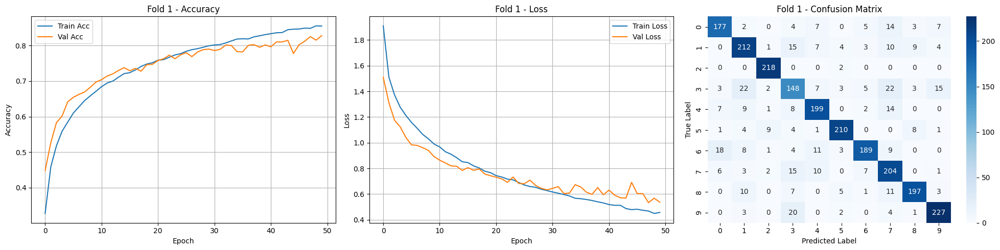

Fold 1 Final Accuracy: 0.8275
Fold 1 Precision: 0.8311
Fold 1 Recall: 0.8280
Fold 1 F1-Score: 0.8285
Akurasi Fold 1: (Train Acc: 0.8546, Val Acc: 0.8275, Gap: 0.0272)
📁 Model Fold 1 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_25drop_models/crnn_model_fold1.h5

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 45s 56ms/step - accuracy: 0.2237 - loss: 2.1357 - val_accuracy: 0.4223 - val_loss: 1.6076
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.4322 - loss: 1.5983 - val_accuracy: 0.5476 - val_loss: 1.2908
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.4966 - loss: 1.4187 - val_accuracy: 0.5773 - val_loss: 1.1962
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.5529 - loss: 1.2872 - val_accuracy: 0.6249 - val_loss: 1.1070
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.5853 - loss: 1.2182 - val_accuracy: 0.6491 - val_loss: 1.0288
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.6014 - loss: 1.1687 - val_accuracy: 0.6612 - val_loss: 0.9988
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.6202 - loss: 1.1262 - val_accuracy: 0.6692 - val_loss: 0.9577
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step - accuracy: 0.6453 - loss: 1.0657 - 

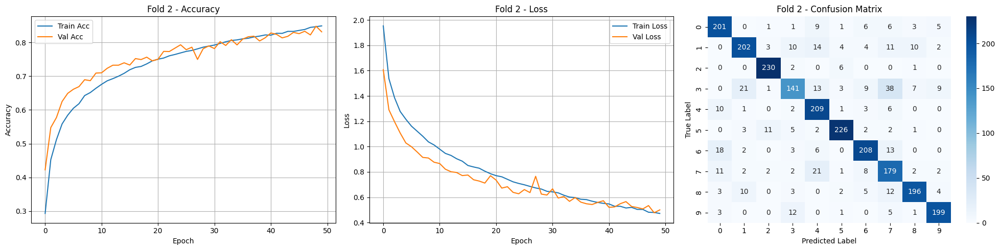

Fold 2 Final Accuracy: 0.8317
Fold 2 Precision: 0.8341
Fold 2 Recall: 0.8327
Fold 2 F1-Score: 0.8306
Akurasi Fold 2: (Train Acc: 0.8493, Val Acc: 0.8317, Gap: 0.0176)
📁 Model Fold 2 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_25drop_models/crnn_model_fold2.h5

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step - accuracy: 0.2239 - loss: 2.1327 - val_accuracy: 0.4140 - val_loss: 1.5981
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - accuracy: 0.4162 - loss: 1.6170 - val_accuracy: 0.5159 - val_loss: 1.3883
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step - accuracy: 0.4994 - loss: 1.4363 - val_accuracy: 0.5769 - val_loss: 1.2424
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.5303 - loss: 1.3393 - val_accuracy: 0.5902 - val_loss: 1.1730
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.5721 - loss: 1.2531 - val_accuracy: 0.6207 - val_loss: 1.1041
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step - accuracy: 0.5940 - loss: 1.1974 - val_accuracy: 0.6216 - val_loss: 1.0650
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.6178 - loss: 1.1550 - val_accuracy: 0.6537 - val_loss: 1.0295
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step - accuracy: 0.6248 - loss: 1.1232 - 

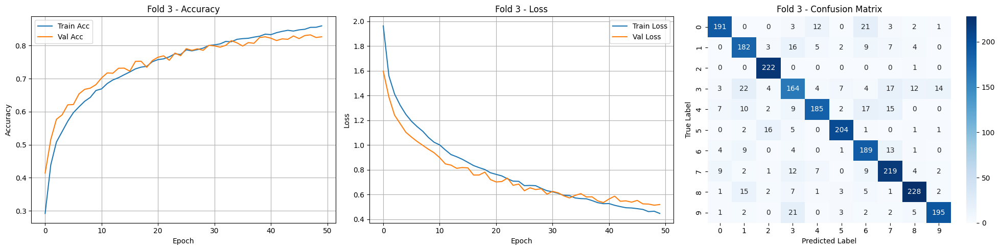

Fold 3 Final Accuracy: 0.8266
Fold 3 Precision: 0.8299
Fold 3 Recall: 0.8289
Fold 3 F1-Score: 0.8278
Akurasi Fold 3: (Train Acc: 0.8597, Val Acc: 0.8266, Gap: 0.0331)
📁 Model Fold 3 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_25drop_models/crnn_model_fold3.h5

===== Fold 4/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step - accuracy: 0.2159 - loss: 2.1475 - val_accuracy: 0.4269 - val_loss: 1.5581
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step - accuracy: 0.4131 - loss: 1.6282 - val_accuracy: 0.5397 - val_loss: 1.3187
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step - accuracy: 0.5007 - loss: 1.4272 - val_accuracy: 0.5526 - val_loss: 1.2206
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step - accuracy: 0.5320 - loss: 1.3232 - val_accuracy: 0.6048 - val_loss: 1.1115
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step - accuracy: 0.5663 - loss: 1.2532 - val_accuracy: 0.6228 - val_loss: 1.0561
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step - accuracy: 0.5909 - loss: 1.1853 - val_accuracy: 0.6395 - val_loss: 1.0079
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step - accuracy: 0.6170 - loss: 1.1287 - val_accuracy: 0.6529 - val_loss: 0.9890
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 35s 51ms/step - accuracy: 0.6366 - loss: 1.0756 - 

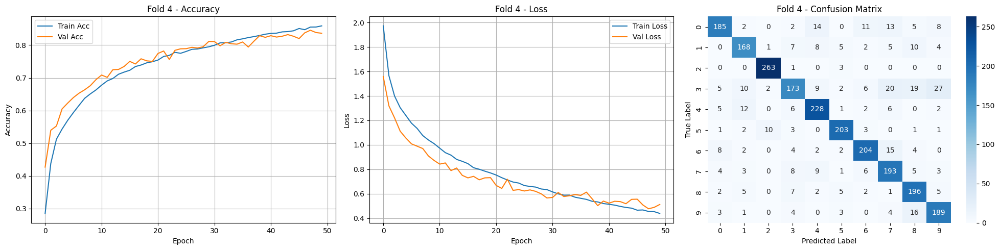

Fold 4 Final Accuracy: 0.8363
Fold 4 Precision: 0.8358
Fold 4 Recall: 0.8375
Fold 4 F1-Score: 0.8345
Akurasi Fold 4: (Train Acc: 0.8588, Val Acc: 0.8363, Gap: 0.0225)
📁 Model Fold 4 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_25drop_models/crnn_model_fold4.h5

===== Fold 5/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 46s 55ms/step - accuracy: 0.2159 - loss: 2.1385 - val_accuracy: 0.4069 - val_loss: 1.6158
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - accuracy: 0.4252 - loss: 1.6073 - val_accuracy: 0.5146 - val_loss: 1.3668
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step - accuracy: 0.4803 - loss: 1.4554 - val_accuracy: 0.5530 - val_loss: 1.2623
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step - accuracy: 0.5274 - loss: 1.3560 - val_accuracy: 0.5823 - val_loss: 1.1775
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - accuracy: 0.5552 - loss: 1.2819 - val_accuracy: 0.6086 - val_loss: 1.1110
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.5791 - loss: 1.2217 - val_accuracy: 0.6337 - val_loss: 1.0475
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - accuracy: 0.6053 - loss: 1.1611 - val_accuracy: 0.6404 - val_loss: 1.0189
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.6306 - loss: 1.1155 - 

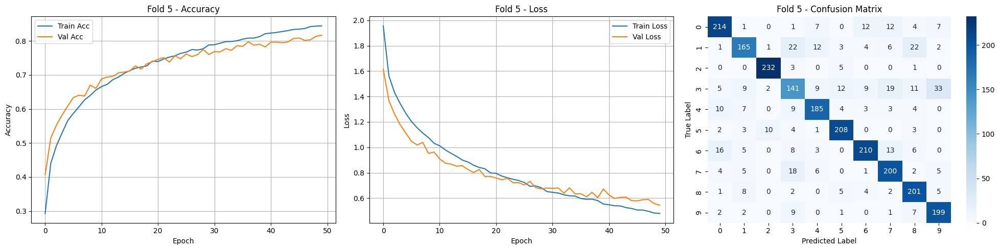

Fold 5 Final Accuracy: 0.8166
Fold 5 Precision: 0.8153
Fold 5 Recall: 0.8189
Fold 5 F1-Score: 0.8154
Akurasi Fold 5: (Train Acc: 0.8442, Val Acc: 0.8166, Gap: 0.0276)
📁 Model Fold 5 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_25drop_models/crnn_model_fold5.h5

===== Fold 6/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 46s 57ms/step - accuracy: 0.2224 - loss: 2.1444 - val_accuracy: 0.3989 - val_loss: 1.5861
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step - accuracy: 0.4218 - loss: 1.5981 - val_accuracy: 0.5493 - val_loss: 1.2971
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step - accuracy: 0.5015 - loss: 1.3966 - val_accuracy: 0.5944 - val_loss: 1.1673
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step - accuracy: 0.5496 - loss: 1.2820 - val_accuracy: 0.6299 - val_loss: 1.0859
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 53ms/step - accuracy: 0.5940 - loss: 1.2020 - val_accuracy: 0.6449 - val_loss: 1.0493
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step - accuracy: 0.6115 - loss: 1.1486 - val_accuracy: 0.6771 - val_loss: 0.9748
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step - accuracy: 0.6360 - loss: 1.0915 - val_accuracy: 0.6813 - val_loss: 0.9414
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 36s 54ms/step - accuracy: 0.6582 - loss: 1.0277 - 

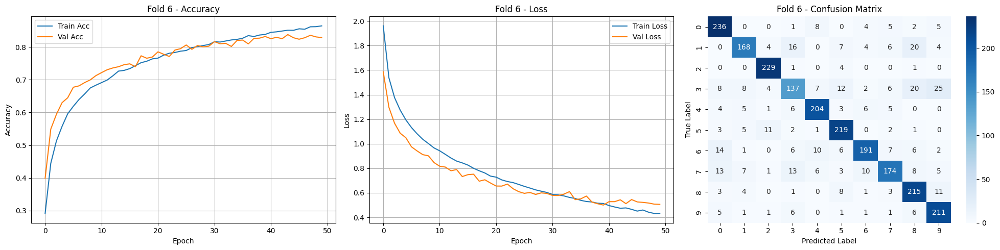

Fold 6 Final Accuracy: 0.8287
Fold 6 Precision: 0.8281
Fold 6 Recall: 0.8270
Fold 6 F1-Score: 0.8250
Akurasi Fold 6: (Train Acc: 0.8645, Val Acc: 0.8287, Gap: 0.0358)
📁 Model Fold 6 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_25drop_models/crnn_model_fold6.h5

===== Fold 7/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 52s 61ms/step - accuracy: 0.2258 - loss: 2.1559 - val_accuracy: 0.4515 - val_loss: 1.5345
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - accuracy: 0.4328 - loss: 1.5911 - val_accuracy: 0.5338 - val_loss: 1.3004
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - accuracy: 0.4929 - loss: 1.4194 - val_accuracy: 0.5806 - val_loss: 1.1903
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step - accuracy: 0.5329 - loss: 1.3295 - val_accuracy: 0.5890 - val_loss: 1.1268
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step - accuracy: 0.5515 - loss: 1.2751 - val_accuracy: 0.6341 - val_loss: 1.0535
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step - accuracy: 0.5820 - loss: 1.2053 - val_accuracy: 0.6604 - val_loss: 1.0044
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step - accuracy: 0.6044 - loss: 1.1551 - val_accuracy: 0.6566 - val_loss: 0.9909
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step - accuracy: 0.6198 - loss: 1.1163 - 

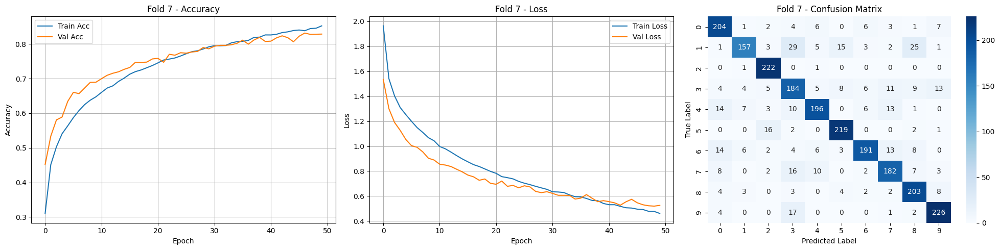

Fold 7 Final Accuracy: 0.8287
Fold 7 Precision: 0.8319
Fold 7 Recall: 0.8305
Fold 7 F1-Score: 0.8280
Akurasi Fold 7: (Train Acc: 0.8525, Val Acc: 0.8287, Gap: 0.0237)
📁 Model Fold 7 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_25drop_models/crnn_model_fold7.h5

===== Fold 8/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 47s 58ms/step - accuracy: 0.2389 - loss: 2.1259 - val_accuracy: 0.4386 - val_loss: 1.6061
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step - accuracy: 0.4324 - loss: 1.6142 - val_accuracy: 0.4762 - val_loss: 1.4512
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - accuracy: 0.4885 - loss: 1.4640 - val_accuracy: 0.5551 - val_loss: 1.2451
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - accuracy: 0.5284 - loss: 1.3603 - val_accuracy: 0.6036 - val_loss: 1.1494
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step - accuracy: 0.5621 - loss: 1.2704 - val_accuracy: 0.6320 - val_loss: 1.0731
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step - accuracy: 0.5933 - loss: 1.1808 - val_accuracy: 0.6550 - val_loss: 1.0124
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - accuracy: 0.6240 - loss: 1.1381 - val_accuracy: 0.6646 - val_loss: 0.9787
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step - accuracy: 0.6387 - loss: 1.0856 - 

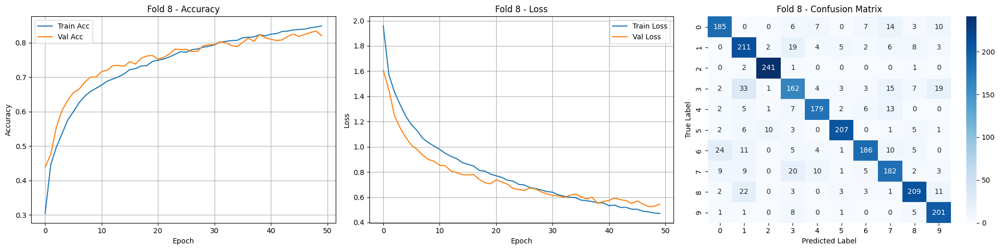

Fold 8 Final Accuracy: 0.8200
Fold 8 Precision: 0.8238
Fold 8 Recall: 0.8217
Fold 8 F1-Score: 0.8213
Akurasi Fold 8: (Train Acc: 0.8486, Val Acc: 0.8200, Gap: 0.0286)
📁 Model Fold 8 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_25drop_models/crnn_model_fold8.h5

===== Fold 9/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step - accuracy: 0.2069 - loss: 2.1506 - val_accuracy: 0.4206 - val_loss: 1.5819
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 58ms/step - accuracy: 0.4090 - loss: 1.6378 - val_accuracy: 0.5627 - val_loss: 1.2776
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - accuracy: 0.5018 - loss: 1.4202 - val_accuracy: 0.6165 - val_loss: 1.1421
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 82s 61ms/step - accuracy: 0.5391 - loss: 1.3292 - val_accuracy: 0.6257 - val_loss: 1.0842
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 81s 60ms/step - accuracy: 0.5676 - loss: 1.2611 - val_accuracy: 0.6437 - val_loss: 1.0560
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - accuracy: 0.5984 - loss: 1.1900 - val_accuracy: 0.6654 - val_loss: 0.9703
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step - accuracy: 0.6110 - loss: 1.1454 - val_accuracy: 0.6775 - val_loss: 0.9607
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 82s 62ms/step - accuracy: 0.6323 - loss: 1.0950 - 

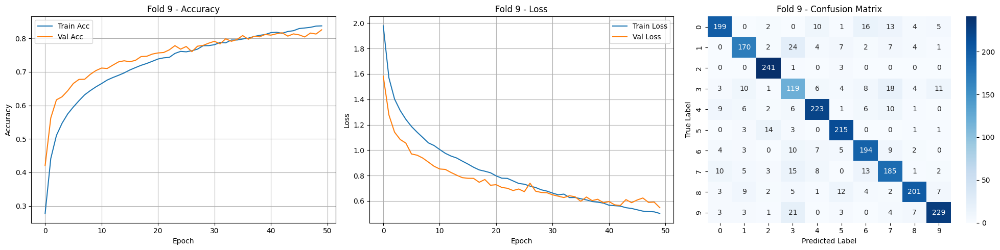

Fold 9 Final Accuracy: 0.8254
Fold 9 Precision: 0.8207
Fold 9 Recall: 0.8203
Fold 9 F1-Score: 0.8196
Akurasi Fold 9: (Train Acc: 0.8372, Val Acc: 0.8254, Gap: 0.0118)
📁 Model Fold 9 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_25drop_models/crnn_model_fold9.h5

===== Fold 10/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - accuracy: 0.2390 - loss: 2.1181 - val_accuracy: 0.4515 - val_loss: 1.5921
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 83s 67ms/step - accuracy: 0.4212 - loss: 1.6121 - val_accuracy: 0.5129 - val_loss: 1.3353
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 80s 64ms/step - accuracy: 0.4854 - loss: 1.4410 - val_accuracy: 0.5589 - val_loss: 1.2260
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - accuracy: 0.5232 - loss: 1.3583 - val_accuracy: 0.5911 - val_loss: 1.1609
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 84s 69ms/step - accuracy: 0.5576 - loss: 1.2718 - val_accuracy: 0.6245 - val_loss: 1.0808
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 80s 66ms/step - accuracy: 0.5830 - loss: 1.2081 - val_accuracy: 0.6345 - val_loss: 1.0295
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 80s 64ms/step - accuracy: 0.6178 - loss: 1.1394 - val_accuracy: 0.6600 - val_loss: 0.9663
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - accuracy: 0.6312 - loss: 1.0998 - 

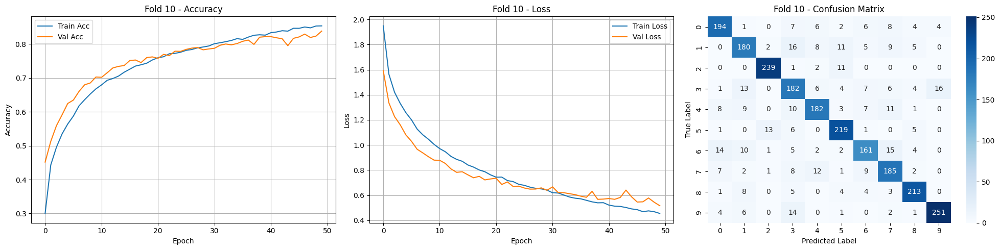

Fold 10 Final Accuracy: 0.8379
Fold 10 Precision: 0.8360
Fold 10 Recall: 0.8349
Fold 10 F1-Score: 0.8350
Akurasi Fold 10: (Train Acc: 0.8534, Val Acc: 0.8379, Gap: 0.0155)
📁 Model Fold 10 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_25drop_models/crnn_model_fold10.h5

🎉 Training selesai!


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []
confusion_matrices = []

# Path folder simpan seluruh model per fold
save_all_models_dir = "/content/drive/MyDrive/dataset/augmented_5seg_25drop_models"
os.makedirs(save_all_models_dir, exist_ok=True)

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)
    epochs = 50
    batch_size = 32

    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Akurasi terakhir
    train_acc_final = train_acc[-1]
    val_acc_final = val_acc[-1]
    acc_gap = abs(train_acc_final - val_acc_final)

    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    confusion_matrices.append(cm)

    # Plot Accuracy, Loss, Confusion Matrix side-by-side
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    axs[0].plot(train_acc, label='Train Acc')
    axs[0].plot(val_acc, label='Val Acc')
    axs[0].set_title(f'Fold {fold+1} - Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Accuracy')
    axs[0].legend()
    axs[0].grid(True)

    axs[1].plot(train_loss, label='Train Loss')
    axs[1].plot(val_loss, label='Val Loss')
    axs[1].set_title(f'Fold {fold+1} - Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].legend()
    axs[1].grid(True)

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axs[2])
    axs[2].set_title(f'Fold {fold+1} - Confusion Matrix')
    axs[2].set_xlabel('Predicted Label')
    axs[2].set_ylabel('True Label')

    plt.tight_layout()
    plt.show()

    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")
    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Tambahan: tampilkan ringkasan performa setiap fold
    print(f"Akurasi Fold {fold+1}: (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f}, Gap: {acc_gap:.4f})")

    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Simpan model untuk setiap fold
    fold_model_path = os.path.join(save_all_models_dir, f"crnn_model_fold{fold+1}.h5")
    model.save(fold_model_path)
    print(f"📁 Model Fold {fold+1} disimpan di: {fold_model_path}")

print("\n🎉 Training selesai!")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8523
Rata-rata Akurasi Validasi Terakhir: 0.8279
Gap Akurasi: 0.0243
✅ Model memiliki generalisasi yang **baik**.

===== Statistik Hasil K-Fold =====
Mean Val Accuracy: 0.8279
Std Dev Val Accuracy: 0.0062
Mean F1-Score: 0.8266
Std Dev F1-Score: 0.0060


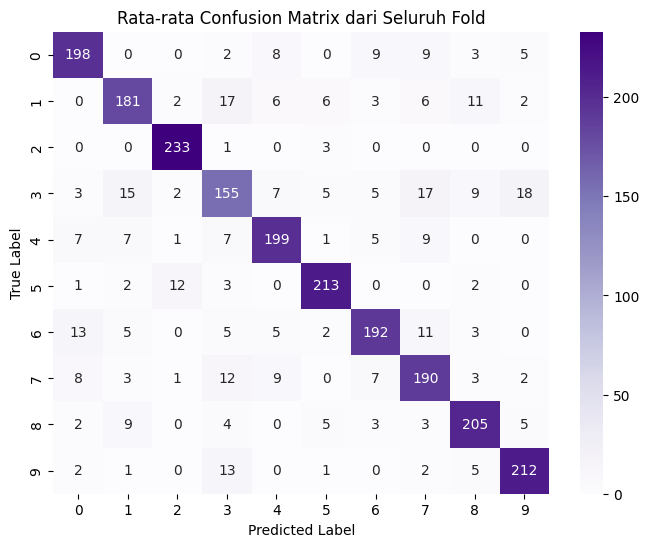

In [ ]:
# ====== Evaluasi Akhir ======
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")

# ====== Statistik Tambahan ======
print("\n===== Statistik Hasil K-Fold =====")
print(f"Mean Val Accuracy: {np.mean(fold_accuracies):.4f}")
print(f"Std Dev Val Accuracy: {np.std(fold_accuracies):.4f}")
print(f"Mean F1-Score: {np.mean(fold_f1_scores):.4f}")
print(f"Std Dev F1-Score: {np.std(fold_f1_scores):.4f}")

# ====== Rata-rata Confusion Matrix ======
mean_cm = np.mean(confusion_matrices, axis=0).astype(int)

plt.figure(figsize=(8, 6))
sns.heatmap(mean_cm, annot=True, fmt='d', cmap='Purples')
plt.title('Rata-rata Confusion Matrix dari Seluruh Fold')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

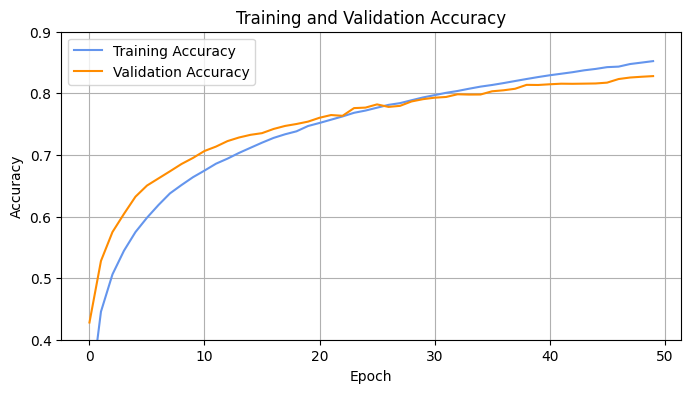

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

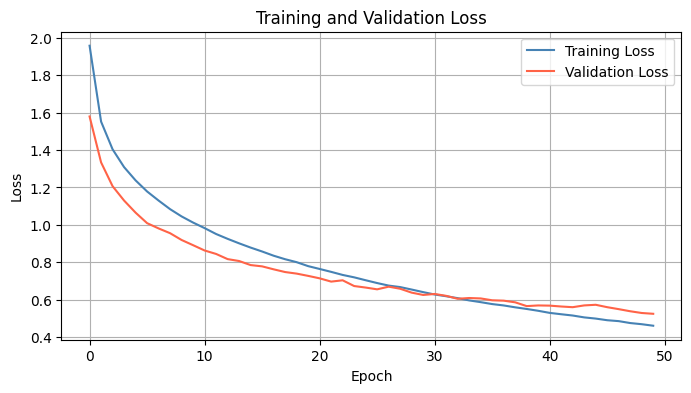

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

#### CRNN 30% Dropout, Augmented, 5s Segmentation

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def build_crnn_model(input_shape, num_classes):
    model = Sequential()
    weight_decay = 1e-4  # Nilai regulasi L2

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay), input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(Dropout(0.3))
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer
    model.add(Dropout(0.3))

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(num_classes, activation='softmax'))  # Dense untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


##### Model Summary

In [ ]:
input_shape = X.shape[1:]  # Ambil shape: (time_steps, n_mfcc, 3)
print("Input shape untuk model:", input_shape)

num_classes = y_categorical.shape[1]

model = build_crnn_model(input_shape, num_classes)

# Tampilkan summary model
model.summary()

Input shape untuk model: (216, 13, 3)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 108, 7, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 54, 4, 32)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 54, 4, 32)      │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 27, 2, 32)      │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 14, 1, 32)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 14, 1, 32)      │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 7, 1, 32)       │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 4, 1, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 4, 1, 32)       │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 4, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 4, 128)         │        82,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 4, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 128)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 241,738 (944.29 KB)

 Trainable params: 241,546 (943.54 KB)

 Non-trainable params: 192 (768.00 B)

##### K-Fold Cross Validation, 10 Fold


===== Fold 1/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - accuracy: 0.2106 - loss: 2.1732 - val_accuracy: 0.4190 - val_loss: 1.5783
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 81s 66ms/step - accuracy: 0.4076 - loss: 1.6404 - val_accuracy: 0.5063 - val_loss: 1.3657
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - accuracy: 0.4682 - loss: 1.4704 - val_accuracy: 0.5376 - val_loss: 1.2702
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 85s 70ms/step - accuracy: 0.5055 - loss: 1.3814 - val_accuracy: 0.5731 - val_loss: 1.1871
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - accuracy: 0.5431 - loss: 1.3037 - val_accuracy: 0.6170 - val_loss: 1.1133
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 85s 71ms/step - accuracy: 0.5680 - loss: 1.2536 - val_accuracy: 0.6307 - val_loss: 1.0592
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 80s 68ms/step - accuracy: 0.5911 - loss: 1.1903 - val_accuracy: 0.6445 - val_loss: 1.0176
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 85s 72ms/step - accuracy: 0.6094 - loss: 1.1561 - 

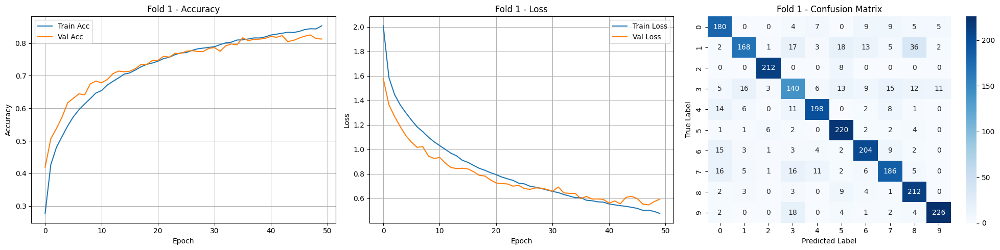

Fold 1 Final Accuracy: 0.8129
Fold 1 Precision: 0.8135
Fold 1 Recall: 0.8152
Fold 1 F1-Score: 0.8115
Akurasi Fold 1: (Train Acc: 0.8533, Val Acc: 0.8129, Gap: 0.0404)
📁 Model Fold 1 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_30drop_models/crnn_model_fold1.h5

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.2243 - loss: 2.1664 - val_accuracy: 0.4419 - val_loss: 1.5340
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - accuracy: 0.4164 - loss: 1.6320 - val_accuracy: 0.4904 - val_loss: 1.4013
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.4665 - loss: 1.4777 - val_accuracy: 0.5572 - val_loss: 1.2447
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 82s 69ms/step - accuracy: 0.5175 - loss: 1.3611 - val_accuracy: 0.5806 - val_loss: 1.1709
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 82s 70ms/step - accuracy: 0.5513 - loss: 1.2825 - val_accuracy: 0.6274 - val_loss: 1.0851
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 84s 73ms/step - accuracy: 0.5853 - loss: 1.2116 - val_accuracy: 0.6449 - val_loss: 1.0337
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.6058 - loss: 1.1704 - val_accuracy: 0.6617 - val_loss: 0.9701
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 78s 66ms/step - accuracy: 0.6174 - loss: 1.1341 - 

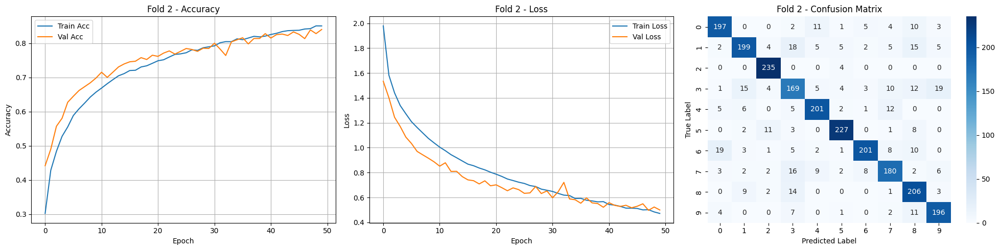

Fold 2 Final Accuracy: 0.8400
Fold 2 Precision: 0.8410
Fold 2 Recall: 0.8410
Fold 2 F1-Score: 0.8397
Akurasi Fold 2: (Train Acc: 0.8505, Val Acc: 0.8400, Gap: 0.0104)
📁 Model Fold 2 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_30drop_models/crnn_model_fold2.h5

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 65s 79ms/step - accuracy: 0.2145 - loss: 2.1712 - val_accuracy: 0.4215 - val_loss: 1.6359
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 79s 75ms/step - accuracy: 0.4177 - loss: 1.6341 - val_accuracy: 0.5075 - val_loss: 1.3753
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 81s 74ms/step - accuracy: 0.4614 - loss: 1.4998 - val_accuracy: 0.5355 - val_loss: 1.2900
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 82s 75ms/step - accuracy: 0.5019 - loss: 1.4075 - val_accuracy: 0.5723 - val_loss: 1.2061
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 81s 73ms/step - accuracy: 0.5342 - loss: 1.3355 - val_accuracy: 0.5948 - val_loss: 1.1463
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - accuracy: 0.5574 - loss: 1.2762 - val_accuracy: 0.6170 - val_loss: 1.0890
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - accuracy: 0.5885 - loss: 1.2202 - val_accuracy: 0.6412 - val_loss: 1.0342
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 82s 74ms/step - accuracy: 0.6158 - loss: 1.1576 - 

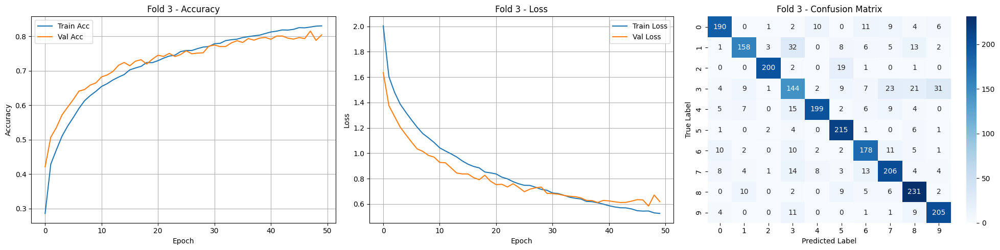

Fold 3 Final Accuracy: 0.8045
Fold 3 Precision: 0.8090
Fold 3 Recall: 0.8061
Fold 3 F1-Score: 0.8055
Akurasi Fold 3: (Train Acc: 0.8305, Val Acc: 0.8045, Gap: 0.0259)
📁 Model Fold 3 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_30drop_models/crnn_model_fold3.h5

===== Fold 4/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 63s 77ms/step - accuracy: 0.2223 - loss: 2.1652 - val_accuracy: 0.4307 - val_loss: 1.5931
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - accuracy: 0.4118 - loss: 1.6464 - val_accuracy: 0.5067 - val_loss: 1.3922
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 79s 76ms/step - accuracy: 0.4655 - loss: 1.5028 - val_accuracy: 0.5451 - val_loss: 1.2689
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 81s 74ms/step - accuracy: 0.5100 - loss: 1.3972 - val_accuracy: 0.5723 - val_loss: 1.2113
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 86s 80ms/step - accuracy: 0.5336 - loss: 1.3382 - val_accuracy: 0.6028 - val_loss: 1.1071
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.5703 - loss: 1.2599 - val_accuracy: 0.6103 - val_loss: 1.0824
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.5927 - loss: 1.2062 - val_accuracy: 0.6316 - val_loss: 1.0361
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - accuracy: 0.6033 - loss: 1.1837 - 

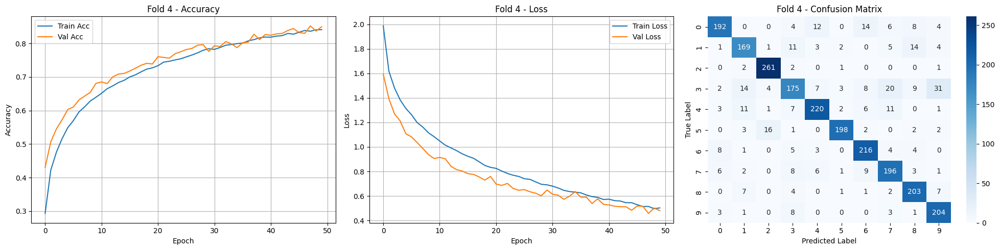

Fold 4 Final Accuracy: 0.8496
Fold 4 Precision: 0.8495
Fold 4 Recall: 0.8518
Fold 4 F1-Score: 0.8487
Akurasi Fold 4: (Train Acc: 0.8409, Val Acc: 0.8496, Gap: 0.0087)
📁 Model Fold 4 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_30drop_models/crnn_model_fold4.h5

===== Fold 5/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 71s 87ms/step - accuracy: 0.1977 - loss: 2.1843 - val_accuracy: 0.4123 - val_loss: 1.6448
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - accuracy: 0.3997 - loss: 1.6559 - val_accuracy: 0.5117 - val_loss: 1.3740
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - accuracy: 0.4786 - loss: 1.4645 - val_accuracy: 0.5551 - val_loss: 1.2614
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - accuracy: 0.5154 - loss: 1.3676 - val_accuracy: 0.5848 - val_loss: 1.1986
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 79s 78ms/step - accuracy: 0.5538 - loss: 1.2953 - val_accuracy: 0.5898 - val_loss: 1.1824
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 83s 80ms/step - accuracy: 0.5780 - loss: 1.2442 - val_accuracy: 0.6132 - val_loss: 1.1206
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - accuracy: 0.6018 - loss: 1.1792 - val_accuracy: 0.6374 - val_loss: 1.0447
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 81s 79ms/step - accuracy: 0.6262 - loss: 1.1135 - 

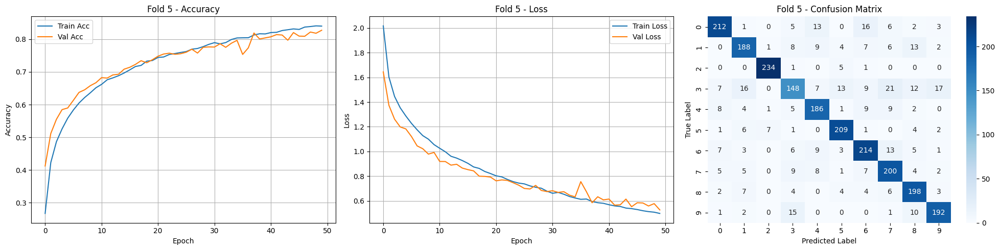

Fold 5 Final Accuracy: 0.8275
Fold 5 Precision: 0.8270
Fold 5 Recall: 0.8293
Fold 5 F1-Score: 0.8269
Akurasi Fold 5: (Train Acc: 0.8402, Val Acc: 0.8275, Gap: 0.0127)
📁 Model Fold 5 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_30drop_models/crnn_model_fold5.h5

===== Fold 6/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 69s 86ms/step - accuracy: 0.2070 - loss: 2.1532 - val_accuracy: 0.4428 - val_loss: 1.6358
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 55s 82ms/step - accuracy: 0.4028 - loss: 1.6640 - val_accuracy: 0.5242 - val_loss: 1.3660
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 86s 88ms/step - accuracy: 0.4787 - loss: 1.4662 - val_accuracy: 0.5877 - val_loss: 1.2157
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 80s 84ms/step - accuracy: 0.5363 - loss: 1.3578 - val_accuracy: 0.6220 - val_loss: 1.1277
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 82s 84ms/step - accuracy: 0.5702 - loss: 1.2753 - val_accuracy: 0.6495 - val_loss: 1.0501
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 56s 83ms/step - accuracy: 0.6022 - loss: 1.2020 - val_accuracy: 0.6692 - val_loss: 0.9885
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 80s 80ms/step - accuracy: 0.6244 - loss: 1.1327 - val_accuracy: 0.6637 - val_loss: 0.9819
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 86s 86ms/step - accuracy: 0.6455 - loss: 1.0765 - 

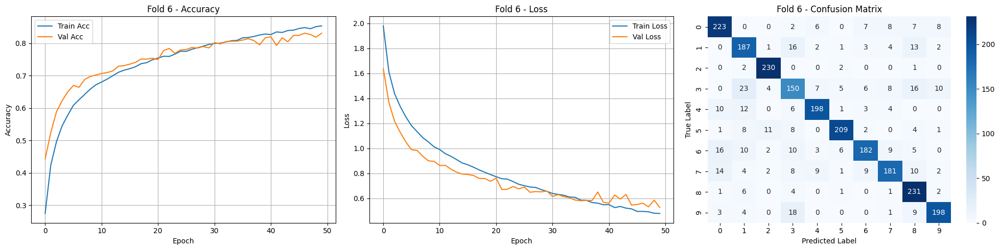

Fold 6 Final Accuracy: 0.8308
Fold 6 Precision: 0.8328
Fold 6 Recall: 0.8299
Fold 6 F1-Score: 0.8295
Akurasi Fold 6: (Train Acc: 0.8533, Val Acc: 0.8308, Gap: 0.0225)
📁 Model Fold 6 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_30drop_models/crnn_model_fold6.h5

===== Fold 7/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 78s 89ms/step - accuracy: 0.2190 - loss: 2.1599 - val_accuracy: 0.4119 - val_loss: 1.6032
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 80s 86ms/step - accuracy: 0.3933 - loss: 1.6510 - val_accuracy: 0.5142 - val_loss: 1.3488
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 81s 85ms/step - accuracy: 0.4644 - loss: 1.4909 - val_accuracy: 0.5618 - val_loss: 1.2221
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 63s 94ms/step - accuracy: 0.5140 - loss: 1.3776 - val_accuracy: 0.5986 - val_loss: 1.1305
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - accuracy: 0.5457 - loss: 1.2994 - val_accuracy: 0.6362 - val_loss: 1.0695
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 87s 91ms/step - accuracy: 0.5715 - loss: 1.2380 - val_accuracy: 0.6566 - val_loss: 1.0105
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - accuracy: 0.5977 - loss: 1.1853 - val_accuracy: 0.6688 - val_loss: 0.9707
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 83s 86ms/step - accuracy: 0.6173 - loss: 1.1448 - 

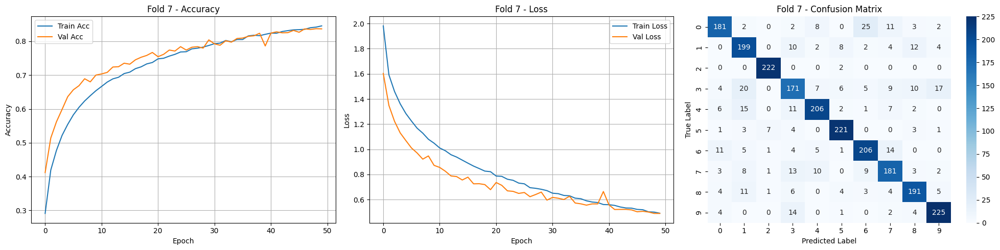

Fold 7 Final Accuracy: 0.8367
Fold 7 Precision: 0.8372
Fold 7 Recall: 0.8377
Fold 7 F1-Score: 0.8370
Akurasi Fold 7: (Train Acc: 0.8455, Val Acc: 0.8367, Gap: 0.0088)
📁 Model Fold 7 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_30drop_models/crnn_model_fold7.h5

===== Fold 8/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 69s 85ms/step - accuracy: 0.2188 - loss: 2.1585 - val_accuracy: 0.4282 - val_loss: 1.5728
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 84s 89ms/step - accuracy: 0.4148 - loss: 1.6422 - val_accuracy: 0.5058 - val_loss: 1.3821
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 78s 83ms/step - accuracy: 0.4825 - loss: 1.4713 - val_accuracy: 0.5489 - val_loss: 1.2600
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 61s 91ms/step - accuracy: 0.5265 - loss: 1.3586 - val_accuracy: 0.5785 - val_loss: 1.1823
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 78s 85ms/step - accuracy: 0.5552 - loss: 1.2967 - val_accuracy: 0.6048 - val_loss: 1.1070
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 85s 89ms/step - accuracy: 0.5754 - loss: 1.2391 - val_accuracy: 0.6186 - val_loss: 1.0948
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 80s 87ms/step - accuracy: 0.6057 - loss: 1.1748 - val_accuracy: 0.6307 - val_loss: 1.0563
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 82s 87ms/step - accuracy: 0.6167 - loss: 1.1331 - 

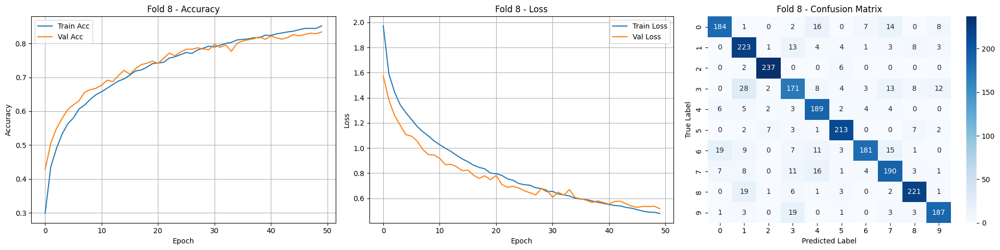

Fold 8 Final Accuracy: 0.8338
Fold 8 Precision: 0.8372
Fold 8 Recall: 0.8346
Fold 8 F1-Score: 0.8341
Akurasi Fold 8: (Train Acc: 0.8517, Val Acc: 0.8338, Gap: 0.0180)
📁 Model Fold 8 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_30drop_models/crnn_model_fold8.h5

===== Fold 9/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 71s 87ms/step - accuracy: 0.2327 - loss: 2.1308 - val_accuracy: 0.4474 - val_loss: 1.5345
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 80s 84ms/step - accuracy: 0.4083 - loss: 1.6262 - val_accuracy: 0.5355 - val_loss: 1.3004
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 82s 84ms/step - accuracy: 0.4809 - loss: 1.4561 - val_accuracy: 0.5835 - val_loss: 1.1861
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 85s 88ms/step - accuracy: 0.5185 - loss: 1.3625 - val_accuracy: 0.6207 - val_loss: 1.1070
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 78s 82ms/step - accuracy: 0.5545 - loss: 1.2911 - val_accuracy: 0.6558 - val_loss: 1.0301
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - accuracy: 0.5862 - loss: 1.2146 - val_accuracy: 0.6637 - val_loss: 0.9987
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - accuracy: 0.6176 - loss: 1.1469 - val_accuracy: 0.6838 - val_loss: 0.9479
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 81s 86ms/step - accuracy: 0.6332 - loss: 1.1045 - 

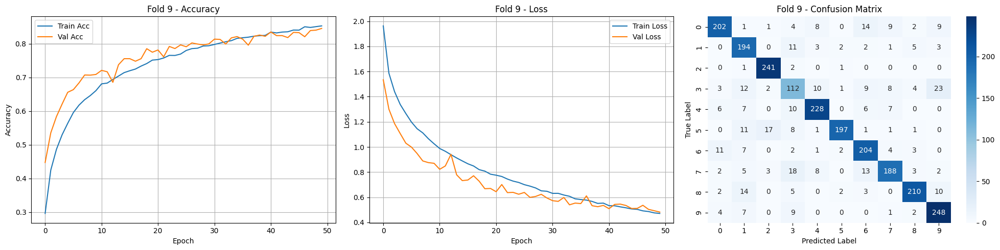

Fold 9 Final Accuracy: 0.8454
Fold 9 Precision: 0.8422
Fold 9 Recall: 0.8390
Fold 9 F1-Score: 0.8388
Akurasi Fold 9: (Train Acc: 0.8531, Val Acc: 0.8454, Gap: 0.0076)
📁 Model Fold 9 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_30drop_models/crnn_model_fold9.h5

===== Fold 10/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 77s 93ms/step - accuracy: 0.2002 - loss: 2.1772 - val_accuracy: 0.4056 - val_loss: 1.6048
Epoch 2/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 60s 89ms/step - accuracy: 0.4054 - loss: 1.6442 - val_accuracy: 0.5259 - val_loss: 1.3446
Epoch 3/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 85s 93ms/step - accuracy: 0.4642 - loss: 1.4705 - val_accuracy: 0.5652 - val_loss: 1.2294
Epoch 4/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 61s 91ms/step - accuracy: 0.5140 - loss: 1.3619 - val_accuracy: 0.5961 - val_loss: 1.1643
Epoch 5/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 82s 91ms/step - accuracy: 0.5519 - loss: 1.2799 - val_accuracy: 0.6353 - val_loss: 1.0703
Epoch 6/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 85s 96ms/step - accuracy: 0.5917 - loss: 1.1993 - val_accuracy: 0.6625 - val_loss: 1.0015
Epoch 7/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 61s 90ms/step - accuracy: 0.6181 - loss: 1.1338 - val_accuracy: 0.6746 - val_loss: 0.9611
Epoch 8/50
674/674 ━━━━━━━━━━━━━━━━━━━━ 82s 91ms/step - accuracy: 0.6317 - loss: 1.1061 - 

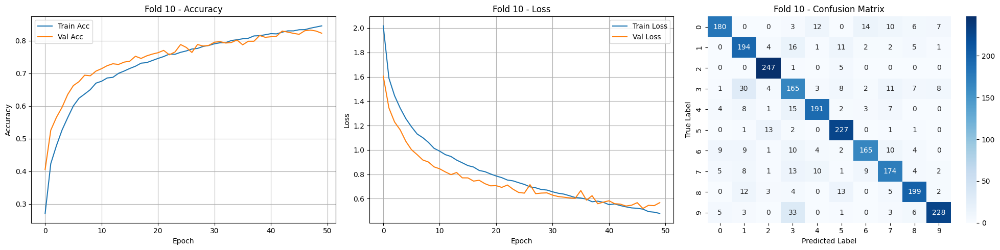

Fold 10 Final Accuracy: 0.8229
Fold 10 Precision: 0.8254
Fold 10 Recall: 0.8209
Fold 10 F1-Score: 0.8215
Akurasi Fold 10: (Train Acc: 0.8454, Val Acc: 0.8229, Gap: 0.0225)
📁 Model Fold 10 disimpan di: /content/drive/MyDrive/dataset/augmented_5seg_30drop_models/crnn_model_fold10.h5

🎉 Training selesai!


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []
confusion_matrices = []

# Path folder simpan seluruh model per fold
save_all_models_dir = "/content/drive/MyDrive/dataset/augmented_5seg_30drop_models"
os.makedirs(save_all_models_dir, exist_ok=True)

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)
    epochs = 50
    batch_size = 32

    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Akurasi terakhir
    train_acc_final = train_acc[-1]
    val_acc_final = val_acc[-1]
    acc_gap = abs(train_acc_final - val_acc_final)

    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    confusion_matrices.append(cm)

    # Plot Accuracy, Loss, Confusion Matrix side-by-side
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    axs[0].plot(train_acc, label='Train Acc')
    axs[0].plot(val_acc, label='Val Acc')
    axs[0].set_title(f'Fold {fold+1} - Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Accuracy')
    axs[0].legend()
    axs[0].grid(True)

    axs[1].plot(train_loss, label='Train Loss')
    axs[1].plot(val_loss, label='Val Loss')
    axs[1].set_title(f'Fold {fold+1} - Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].legend()
    axs[1].grid(True)

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axs[2])
    axs[2].set_title(f'Fold {fold+1} - Confusion Matrix')
    axs[2].set_xlabel('Predicted Label')
    axs[2].set_ylabel('True Label')

    plt.tight_layout()
    plt.show()

    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")
    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Tambahan: tampilkan ringkasan performa setiap fold
    print(f"Akurasi Fold {fold+1}: (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f}, Gap: {acc_gap:.4f})")

    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Simpan model untuk setiap fold
    fold_model_path = os.path.join(save_all_models_dir, f"crnn_model_fold{fold+1}.h5")
    model.save(fold_model_path)
    print(f"📁 Model Fold {fold+1} disimpan di: {fold_model_path}")

print("\n🎉 Training selesai!")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8464
Rata-rata Akurasi Validasi Terakhir: 0.8304
Gap Akurasi: 0.0160
✅ Model memiliki generalisasi yang **baik**.

===== Statistik Hasil K-Fold =====
Mean Val Accuracy: 0.8304
Std Dev Val Accuracy: 0.0133
Mean F1-Score: 0.8293
Std Dev F1-Score: 0.0127


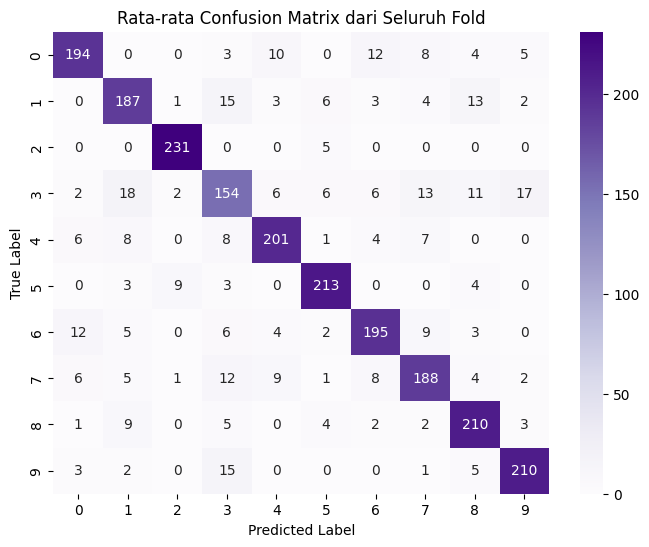

In [ ]:
# ====== Evaluasi Akhir ======
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")

# ====== Statistik Tambahan ======
print("\n===== Statistik Hasil K-Fold =====")
print(f"Mean Val Accuracy: {np.mean(fold_accuracies):.4f}")
print(f"Std Dev Val Accuracy: {np.std(fold_accuracies):.4f}")
print(f"Mean F1-Score: {np.mean(fold_f1_scores):.4f}")
print(f"Std Dev F1-Score: {np.std(fold_f1_scores):.4f}")

# ====== Rata-rata Confusion Matrix ======
mean_cm = np.mean(confusion_matrices, axis=0).astype(int)

plt.figure(figsize=(8, 6))
sns.heatmap(mean_cm, annot=True, fmt='d', cmap='Purples')
plt.title('Rata-rata Confusion Matrix dari Seluruh Fold')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

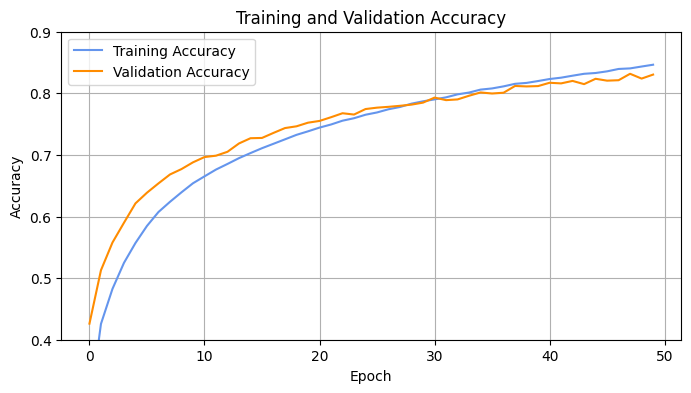

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

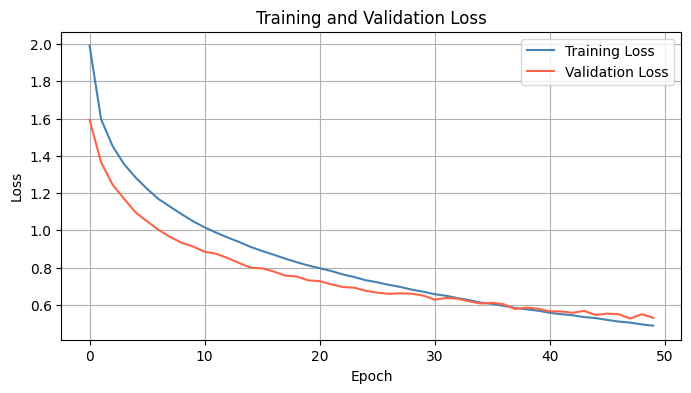

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

## Feature Extraction with MFCC, delta-delta, augmentation, and 10 Sec Segmentation

In [ ]:
import os
import librosa
import numpy as np
import pandas as pd
import json
from tqdm import tqdm

# Path ke folder dataset
general_path = '/content/drive/MyDrive/dataset/genres_augmented'
output_csv = '/content/drive/MyDrive/dataset/segmented_audio_10s.csv'
output_json = '/content/drive/MyDrive/dataset/segmented_audio_10s.json'
output_npy = '/content/drive/MyDrive/dataset/mfcc_dataset_augmented_10seg.npz'  # File npz untuk menyimpan semua data MFCC

# Parameter segmentasi dan ekstraksi fitur
segment_duration = 10  # Durasi segmentasi dalam detik
n_mfcc = 13  # Jumlah MFCC yang diekstrak
n_fft = 2048
hop_length = 512

# Menampung hasil segmentasi
X, y = [], []
data_segments = []
genre_to_label = {}

# Loop melalui setiap genre
genres = os.listdir(general_path)
for genre in genres:
    genre_dir = os.path.join(general_path, genre)
    if os.path.isdir(genre_dir):
        print(f"Memproses genre: {genre}")

        # Mapping genre ke angka
        if genre not in genre_to_label:
            genre_to_label[genre] = len(genre_to_label)

        # Loop melalui setiap file dalam genre
        for filename in tqdm(os.listdir(genre_dir)):
            if filename.endswith('.wav'):
                file_path = os.path.join(genre_dir, filename)

                try:
                    # Load audio file
                    data, sr = librosa.load(file_path, sr=None)

                    # Segmentasi audio
                    segment_length = int(segment_duration * sr)
                    num_segments = len(data) // segment_length

                    # Proses setiap segmen
                    for idx in range(num_segments):
                        start_sample = idx * segment_length
                        finish_sample = start_sample + segment_length
                        segment = data[start_sample:finish_sample]

                        if len(segment) == segment_length:
                            # Ekstraksi MFCC
                            mfcc = librosa.feature.mfcc(y=segment, sr=sr, n_mfcc=n_mfcc,
                                                        n_fft=n_fft, hop_length=hop_length)
                            delta = librosa.feature.delta(mfcc)
                            delta2 = librosa.feature.delta(mfcc, order=2)

                            # Gabungkan MFCC + delta + delta-delta sebagai 3 channel
                            mfcc_stack = np.stack([mfcc, delta, delta2], axis=0)  # Shape: (3, 13, time_steps)
                            mfcc_combined = mfcc_stack.transpose(2, 1, 0)  # Shape: (time_steps, 13, 3)

                            # Simpan ke array
                            X.append(mfcc_combined)
                            y.append(genre_to_label[genre])

                            # Simpan informasi segmen
                            segment_info = {
                                'genre': genre,
                                'filename': filename,
                                'segment_index': idx + 1,
                                'mfcc_shape': mfcc_combined.shape,  # (time_steps, 13, 3)
                                'genre_label': genre_to_label[genre]
                            }
                            data_segments.append(segment_info)

                except Exception as e:
                    print(f"Kesalahan saat memproses {file_path}: {e}")

# Konversi ke array numpy
X = np.array(X)  # Shape: (num_samples, time_steps, 13, 3)
y = np.array(y)

# Simpan dataset dalam satu file .npz
np.savez(output_npy, X=X, y=y)
print(f"Dataset MFCC disimpan dalam satu file: {output_npy}")

# Simpan hasil ke CSV
csv_data = pd.DataFrame(data_segments)
csv_data.to_csv(output_csv, index=False)
print(f"Hasil segmentasi disimpan ke: {output_csv}")

# Simpan hasil ke JSON
with open(output_json, 'w') as json_file:
    json.dump(data_segments, json_file, indent=4)
print(f"Hasil segmentasi disimpan ke: {output_json}")

Memproses genre: hiphop


100%|██████████| 400/400 [00:54<00:00,  7.30it/s]


Memproses genre: country


100%|██████████| 400/400 [00:34<00:00, 11.44it/s]


Memproses genre: classical


100%|██████████| 400/400 [00:32<00:00, 12.45it/s]


Memproses genre: rock


100%|██████████| 400/400 [00:35<00:00, 11.22it/s]


Memproses genre: pop


100%|██████████| 400/400 [00:36<00:00, 10.82it/s]


Memproses genre: jazz


100%|██████████| 396/396 [00:30<00:00, 13.09it/s]


Memproses genre: reggae


100%|██████████| 400/400 [00:32<00:00, 12.32it/s]


Memproses genre: disco


100%|██████████| 400/400 [00:29<00:00, 13.43it/s]


Memproses genre: blues


100%|██████████| 400/400 [00:31<00:00, 12.78it/s]


Memproses genre: metal


100%|██████████| 400/400 [00:37<00:00, 10.73it/s]


Memproses genre: .ipynb_checkpoints


0it [00:00, ?it/s]


Dataset MFCC disimpan dalam satu file: /content/drive/MyDrive/dataset/mfcc_dataset_augmented_10seg.npz
Hasil segmentasi disimpan ke: /content/drive/MyDrive/dataset/segmented_audio_10s.csv
Hasil segmentasi disimpan ke: /content/drive/MyDrive/dataset/segmented_audio_10s.json


### Load Data

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report

# === LOAD DATA ===
npz_path = "/content/drive/MyDrive/dataset/mfcc_dataset_augmented_10seg.npz"

# Muat dataset dari file .npz
data = np.load(npz_path)
X = data["X"]  # Shape: (num_samples, time_steps, n_mfcc, 3)
y = data["y"]  # Shape: (num_samples,)

# One-hot encoding untuk label genre
num_classes = len(np.unique(y))  # Hitung jumlah kelas unik dalam y
y_categorical = to_categorical(y, num_classes)

print("Dataset berhasil dimuat!")
print(f"Shape X: {X.shape}, Shape y: {y_categorical.shape}")

Dataset berhasil dimuat!
Shape X: (11952, 431, 13, 3), Shape y: (11952, 10)


In [ ]:
import json
import numpy as np
from tensorflow.keras.utils import to_categorical

# Path ke file JSON yang menyimpan informasi segmentasi
json_path = "/content/drive/MyDrive/dataset/segmented_audio_10s.json"

# Muat informasi segmentasi
with open(json_path, "r") as json_file:
    data_segments = json.load(json_file)

# Buat kembali genre_to_label dari data segmentasi
genre_to_label = {segment["genre"]: segment["genre_label"] for segment in data_segments}

# Tampilkan isi genre_to_label
print("Mapping Genre ke Label:")
for genre, label in genre_to_label.items():
    print(f"{genre}: {label}")

# === LOAD DATA ===
npz_path = "/content/drive/MyDrive/dataset/mfcc_dataset_augmented_10seg.npz"

# Muat dataset dari file .npz
data = np.load(npz_path)
X = data["X"]  # Shape: (num_samples, time_steps, n_mfcc, 1)
y = data["y"]  # Shape: (num_samples,)

# One-hot encoding untuk label genre
num_classes = len(np.unique(y))  # Hitung jumlah kelas unik dalam y
y_categorical = to_categorical(y, num_classes)

print("\nDataset berhasil dimuat!")
print(f"Shape X: {X.shape}, Shape y: {y_categorical.shape}")

Mapping Genre ke Label:
hiphop: 0
country: 1
classical: 2
rock: 3
pop: 4
jazz: 5
reggae: 6
disco: 7
blues: 8
metal: 9

Dataset berhasil dimuat!
Shape X: (11952, 431, 13, 3), Shape y: (11952, 10)


#### CRNN 25% Dropout, Augmented, 10s Segmentation

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def build_crnn_model(input_shape, num_classes):
    model = Sequential()
    weight_decay = 1e-4  # Nilai regulasi L2

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay), input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(Dropout(0.25))
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer
    model.add(Dropout(0.25))

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(num_classes, activation='softmax'))  # Dense untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


##### Model Summary

In [ ]:
input_shape = X.shape[1:]  # Ambil shape: (time_steps, n_mfcc, 3)
print("Input shape untuk model:", input_shape)

num_classes = y_categorical.shape[1]

model = build_crnn_model(input_shape, num_classes)

# Tampilkan summary model
model.summary()

Input shape untuk model: (431, 13, 3)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 216, 7, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 108, 4, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 108, 4, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 54, 2, 32)      │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 27, 1, 32)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 27, 1, 32)      │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 14, 1, 32)      │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 7, 1, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 7, 1, 32)       │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 7, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 7, 128)         │        82,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 7, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 128)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 241,738 (944.29 KB)

 Trainable params: 241,546 (943.54 KB)

 Non-trainable params: 192 (768.00 B)

##### K-Fold Cross Validation, 10 Fold


===== Fold 1/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.1702 - loss: 2.2180 - val_accuracy: 0.3754 - val_loss: 1.7463
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step - accuracy: 0.3816 - loss: 1.7289 - val_accuracy: 0.4808 - val_loss: 1.4828
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - accuracy: 0.4654 - loss: 1.5004 - val_accuracy: 0.5293 - val_loss: 1.3267
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step - accuracy: 0.5143 - loss: 1.3973 - val_accuracy: 0.5761 - val_loss: 1.2189
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step - accuracy: 0.5525 - loss: 1.2970 - val_accuracy: 0.6162 - val_loss: 1.1328
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step - accuracy: 0.5764 - loss: 1.2391 - val_accuracy: 0.6254 - val_loss: 1.0791
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - accuracy: 0.6024 - loss: 1.1756 - val_accuracy: 0.6455 - val_loss: 1.0293
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - accuracy: 0.6200 - loss: 1.1350 - 

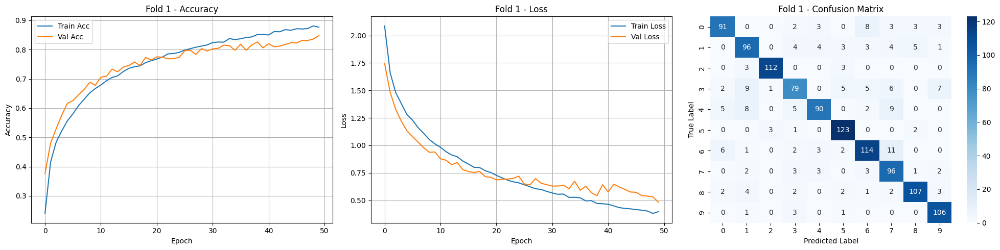

Fold 1 Final Accuracy: 0.8478
Fold 1 Precision: 0.8486
Fold 1 Recall: 0.8475
Fold 1 F1-Score: 0.8462
Akurasi Fold 1: (Train Acc: 0.8765, Val Acc: 0.8478, Gap: 0.0287)
📁 Model Fold 1 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_25drop_models/crnn_model_fold1.h5

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step - accuracy: 0.2056 - loss: 2.1897 - val_accuracy: 0.3946 - val_loss: 1.7141
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step - accuracy: 0.3942 - loss: 1.7107 - val_accuracy: 0.4900 - val_loss: 1.4274
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step - accuracy: 0.4524 - loss: 1.5277 - val_accuracy: 0.5452 - val_loss: 1.2701
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step - accuracy: 0.5061 - loss: 1.4069 - val_accuracy: 0.5995 - val_loss: 1.1934
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - accuracy: 0.5397 - loss: 1.3122 - val_accuracy: 0.5786 - val_loss: 1.1757
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step - accuracy: 0.5774 - loss: 1.2490 - val_accuracy: 0.6363 - val_loss: 1.0498
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step - accuracy: 0.6032 - loss: 1.1686 - val_accuracy: 0.6321 - val_loss: 1.0439
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step - accuracy: 0.6284 - loss: 1.1129 - 

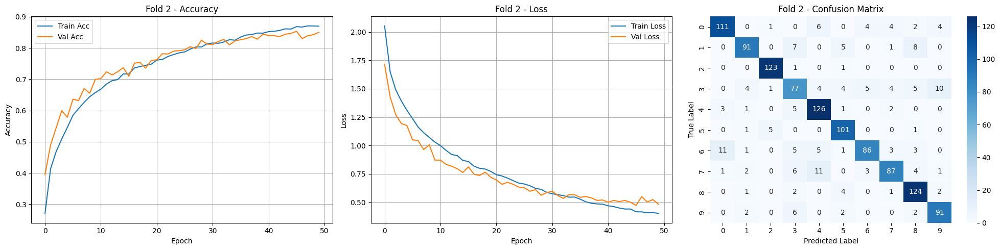

Fold 2 Final Accuracy: 0.8503
Fold 2 Precision: 0.8500
Fold 2 Recall: 0.8474
Fold 2 F1-Score: 0.8469
Akurasi Fold 2: (Train Acc: 0.8702, Val Acc: 0.8503, Gap: 0.0199)
📁 Model Fold 2 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_25drop_models/crnn_model_fold2.h5

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 25s 50ms/step - accuracy: 0.1894 - loss: 2.1964 - val_accuracy: 0.3607 - val_loss: 1.7144
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step - accuracy: 0.3790 - loss: 1.7142 - val_accuracy: 0.5029 - val_loss: 1.4160
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step - accuracy: 0.4573 - loss: 1.5041 - val_accuracy: 0.5431 - val_loss: 1.2870
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - accuracy: 0.4927 - loss: 1.4025 - val_accuracy: 0.5665 - val_loss: 1.1917
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - accuracy: 0.5270 - loss: 1.3267 - val_accuracy: 0.5866 - val_loss: 1.1306
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step - accuracy: 0.5769 - loss: 1.2213 - val_accuracy: 0.6142 - val_loss: 1.0813
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - accuracy: 0.6047 - loss: 1.1619 - val_accuracy: 0.6285 - val_loss: 1.0400
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step - accuracy: 0.6082 - loss: 1.1200 - 

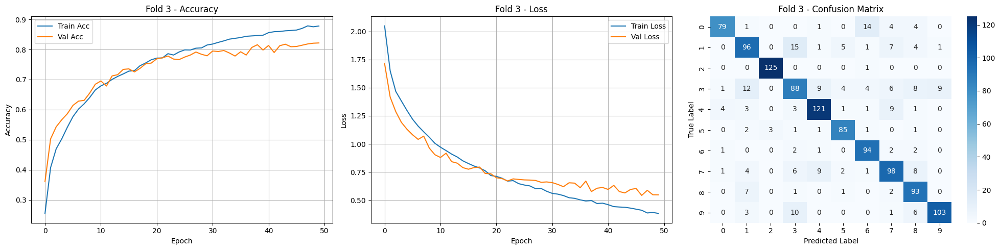

Fold 3 Final Accuracy: 0.8218
Fold 3 Precision: 0.8264
Fold 3 Recall: 0.8285
Fold 3 F1-Score: 0.8251
Akurasi Fold 3: (Train Acc: 0.8780, Val Acc: 0.8218, Gap: 0.0563)
📁 Model Fold 3 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_25drop_models/crnn_model_fold3.h5

===== Fold 4/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step - accuracy: 0.2325 - loss: 2.1867 - val_accuracy: 0.3598 - val_loss: 1.7352
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - accuracy: 0.3894 - loss: 1.7160 - val_accuracy: 0.4929 - val_loss: 1.4587
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step - accuracy: 0.4707 - loss: 1.5092 - val_accuracy: 0.5297 - val_loss: 1.3237
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step - accuracy: 0.5150 - loss: 1.3916 - val_accuracy: 0.5724 - val_loss: 1.2115
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step - accuracy: 0.5522 - loss: 1.3003 - val_accuracy: 0.6126 - val_loss: 1.1173
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step - accuracy: 0.5827 - loss: 1.2295 - val_accuracy: 0.6393 - val_loss: 1.0844
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step - accuracy: 0.6114 - loss: 1.1831 - val_accuracy: 0.6502 - val_loss: 1.0132
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step - accuracy: 0.6356 - loss: 1.0941 - 

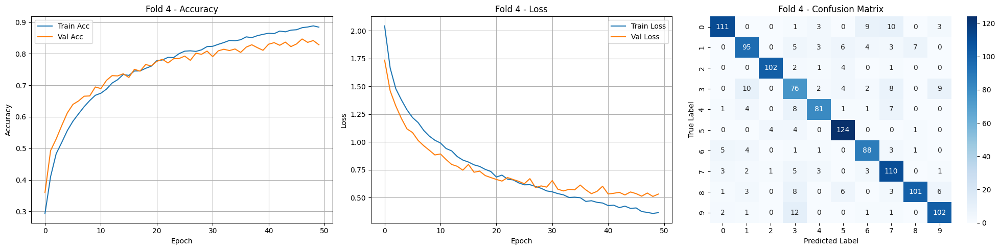

Fold 4 Final Accuracy: 0.8285
Fold 4 Precision: 0.8323
Fold 4 Recall: 0.8273
Fold 4 F1-Score: 0.8282
Akurasi Fold 4: (Train Acc: 0.8844, Val Acc: 0.8285, Gap: 0.0559)
📁 Model Fold 4 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_25drop_models/crnn_model_fold4.h5

===== Fold 5/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - accuracy: 0.1893 - loss: 2.2144 - val_accuracy: 0.3883 - val_loss: 1.7532
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - accuracy: 0.3988 - loss: 1.7396 - val_accuracy: 0.5071 - val_loss: 1.4036
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step - accuracy: 0.4533 - loss: 1.5150 - val_accuracy: 0.5515 - val_loss: 1.2724
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 22s 51ms/step - accuracy: 0.4999 - loss: 1.4014 - val_accuracy: 0.5766 - val_loss: 1.1892
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step - accuracy: 0.5342 - loss: 1.3341 - val_accuracy: 0.6100 - val_loss: 1.1185
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 51ms/step - accuracy: 0.5621 - loss: 1.2369 - val_accuracy: 0.6326 - val_loss: 1.0437
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step - accuracy: 0.5917 - loss: 1.1846 - val_accuracy: 0.6477 - val_loss: 1.0095
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step - accuracy: 0.6133 - loss: 1.1288 - 

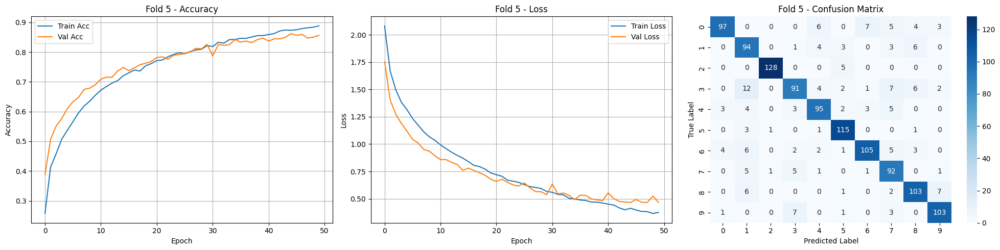

Fold 5 Final Accuracy: 0.8561
Fold 5 Precision: 0.8569
Fold 5 Recall: 0.8558
Fold 5 F1-Score: 0.8543
Akurasi Fold 5: (Train Acc: 0.8880, Val Acc: 0.8561, Gap: 0.0319)
📁 Model Fold 5 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_25drop_models/crnn_model_fold5.h5

===== Fold 6/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 51ms/step - accuracy: 0.1892 - loss: 2.1991 - val_accuracy: 0.4084 - val_loss: 1.7606
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step - accuracy: 0.3910 - loss: 1.7097 - val_accuracy: 0.4946 - val_loss: 1.4545
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step - accuracy: 0.4678 - loss: 1.4972 - val_accuracy: 0.5607 - val_loss: 1.3080
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step - accuracy: 0.5190 - loss: 1.3824 - val_accuracy: 0.5925 - val_loss: 1.2077
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 51ms/step - accuracy: 0.5633 - loss: 1.2744 - val_accuracy: 0.6017 - val_loss: 1.1578
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step - accuracy: 0.5877 - loss: 1.2176 - val_accuracy: 0.6427 - val_loss: 1.0831
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step - accuracy: 0.6280 - loss: 1.1394 - val_accuracy: 0.6444 - val_loss: 1.0578
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6395 - loss: 1.0983 - 

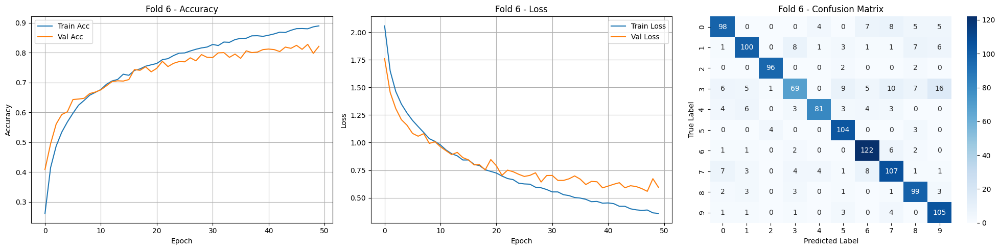

Fold 6 Final Accuracy: 0.8209
Fold 6 Precision: 0.8252
Fold 6 Recall: 0.8262
Fold 6 F1-Score: 0.8216
Akurasi Fold 6: (Train Acc: 0.8895, Val Acc: 0.8209, Gap: 0.0685)
📁 Model Fold 6 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_25drop_models/crnn_model_fold6.h5

===== Fold 7/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 22s 51ms/step - accuracy: 0.2037 - loss: 2.1936 - val_accuracy: 0.4268 - val_loss: 1.6421
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - accuracy: 0.3980 - loss: 1.6858 - val_accuracy: 0.5096 - val_loss: 1.3541
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step - accuracy: 0.4844 - loss: 1.4597 - val_accuracy: 0.5565 - val_loss: 1.2310
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.5070 - loss: 1.3771 - val_accuracy: 0.5933 - val_loss: 1.1251
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step - accuracy: 0.5515 - loss: 1.2833 - val_accuracy: 0.6100 - val_loss: 1.0780
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step - accuracy: 0.5844 - loss: 1.2219 - val_accuracy: 0.6293 - val_loss: 1.0322
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step - accuracy: 0.6153 - loss: 1.1544 - val_accuracy: 0.6377 - val_loss: 1.0127
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - accuracy: 0.6129 - loss: 1.1406 - 

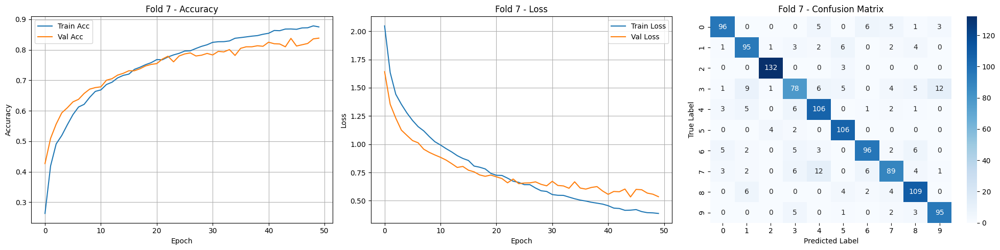

Fold 7 Final Accuracy: 0.8385
Fold 7 Precision: 0.8367
Fold 7 Recall: 0.8383
Fold 7 F1-Score: 0.8362
Akurasi Fold 7: (Train Acc: 0.8753, Val Acc: 0.8385, Gap: 0.0368)
📁 Model Fold 7 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_25drop_models/crnn_model_fold7.h5

===== Fold 8/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.2169 - loss: 2.1849 - val_accuracy: 0.3941 - val_loss: 1.7494
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step - accuracy: 0.3776 - loss: 1.7572 - val_accuracy: 0.4728 - val_loss: 1.4263
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step - accuracy: 0.4407 - loss: 1.5549 - val_accuracy: 0.5389 - val_loss: 1.2634
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.5048 - loss: 1.4243 - val_accuracy: 0.5841 - val_loss: 1.1609
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step - accuracy: 0.5435 - loss: 1.3219 - val_accuracy: 0.6201 - val_loss: 1.0830
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step - accuracy: 0.5823 - loss: 1.2279 - val_accuracy: 0.6519 - val_loss: 1.0078
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 19s 51ms/step - accuracy: 0.5996 - loss: 1.1885 - val_accuracy: 0.6669 - val_loss: 0.9647
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step - accuracy: 0.6211 - loss: 1.1180 - 

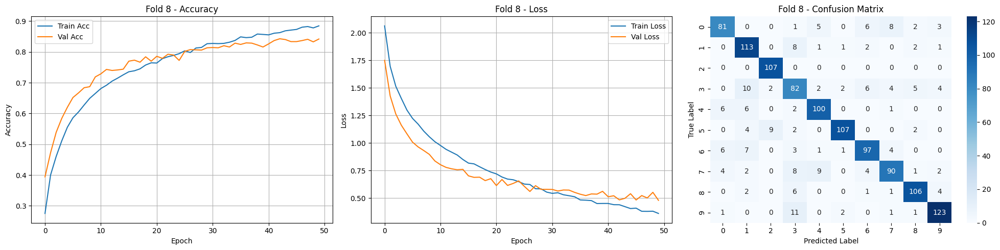

Fold 8 Final Accuracy: 0.8418
Fold 8 Precision: 0.8430
Fold 8 Recall: 0.8414
Fold 8 F1-Score: 0.8411
Akurasi Fold 8: (Train Acc: 0.8845, Val Acc: 0.8418, Gap: 0.0427)
📁 Model Fold 8 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_25drop_models/crnn_model_fold8.h5

===== Fold 9/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.2201 - loss: 2.2062 - val_accuracy: 0.4176 - val_loss: 1.7983
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - accuracy: 0.3902 - loss: 1.7262 - val_accuracy: 0.5130 - val_loss: 1.4112
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step - accuracy: 0.4582 - loss: 1.5151 - val_accuracy: 0.5665 - val_loss: 1.2733
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.5202 - loss: 1.3639 - val_accuracy: 0.6209 - val_loss: 1.1259
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step - accuracy: 0.5673 - loss: 1.2645 - val_accuracy: 0.6427 - val_loss: 1.0819
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6018 - loss: 1.1932 - val_accuracy: 0.6946 - val_loss: 0.9516
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step - accuracy: 0.6318 - loss: 1.1049 - val_accuracy: 0.7096 - val_loss: 0.9196
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6591 - loss: 1.0432 - 

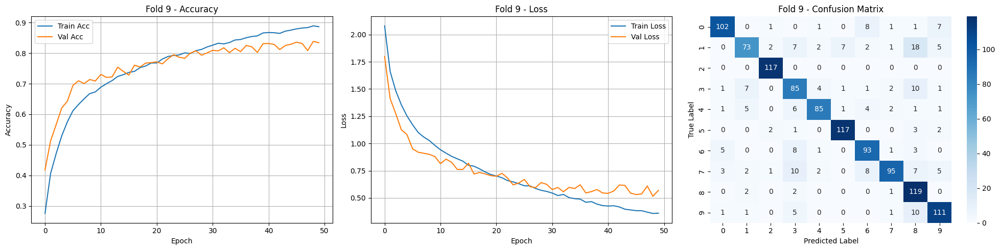

Fold 9 Final Accuracy: 0.8343
Fold 9 Precision: 0.8422
Fold 9 Recall: 0.8336
Fold 9 F1-Score: 0.8326
Akurasi Fold 9: (Train Acc: 0.8867, Val Acc: 0.8343, Gap: 0.0524)
📁 Model Fold 9 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_25drop_models/crnn_model_fold9.h5

===== Fold 10/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step - accuracy: 0.2151 - loss: 2.1766 - val_accuracy: 0.4268 - val_loss: 1.6949
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 55ms/step - accuracy: 0.3759 - loss: 1.7325 - val_accuracy: 0.5188 - val_loss: 1.4489
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 58ms/step - accuracy: 0.4420 - loss: 1.5498 - val_accuracy: 0.5665 - val_loss: 1.2596
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step - accuracy: 0.5062 - loss: 1.4371 - val_accuracy: 0.5682 - val_loss: 1.2102
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.5428 - loss: 1.3179 - val_accuracy: 0.6293 - val_loss: 1.1059
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step - accuracy: 0.5753 - loss: 1.2394 - val_accuracy: 0.6569 - val_loss: 1.0204
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - accuracy: 0.6017 - loss: 1.1700 - val_accuracy: 0.6703 - val_loss: 1.0094
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 21s 59ms/step - accuracy: 0.6322 - loss: 1.1084 - 

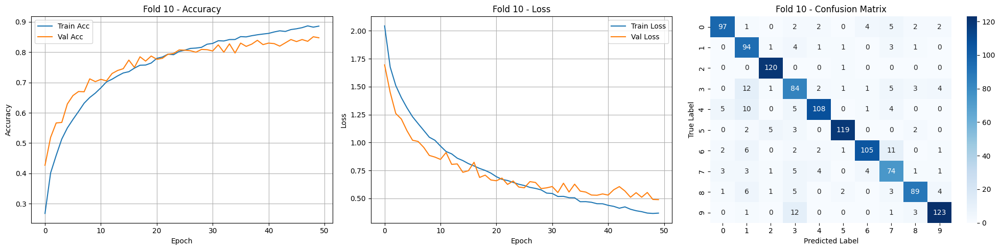

Fold 10 Final Accuracy: 0.8477
Fold 10 Precision: 0.8476
Fold 10 Recall: 0.8453
Fold 10 F1-Score: 0.8439
Akurasi Fold 10: (Train Acc: 0.8861, Val Acc: 0.8477, Gap: 0.0384)
📁 Model Fold 10 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_25drop_models/crnn_model_fold10.h5

🎉 Training selesai!


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []
confusion_matrices = []

# Path folder simpan seluruh model per fold
save_all_models_dir = "/content/drive/MyDrive/dataset/augmented_10seg_25drop_models"
os.makedirs(save_all_models_dir, exist_ok=True)

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)
    epochs = 50
    batch_size = 32

    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Akurasi terakhir
    train_acc_final = train_acc[-1]
    val_acc_final = val_acc[-1]
    acc_gap = abs(train_acc_final - val_acc_final)

    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    confusion_matrices.append(cm)

    # Plot Accuracy, Loss, Confusion Matrix side-by-side
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    axs[0].plot(train_acc, label='Train Acc')
    axs[0].plot(val_acc, label='Val Acc')
    axs[0].set_title(f'Fold {fold+1} - Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Accuracy')
    axs[0].legend()
    axs[0].grid(True)

    axs[1].plot(train_loss, label='Train Loss')
    axs[1].plot(val_loss, label='Val Loss')
    axs[1].set_title(f'Fold {fold+1} - Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].legend()
    axs[1].grid(True)

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axs[2])
    axs[2].set_title(f'Fold {fold+1} - Confusion Matrix')
    axs[2].set_xlabel('Predicted Label')
    axs[2].set_ylabel('True Label')

    plt.tight_layout()
    plt.show()

    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")
    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Tambahan: tampilkan ringkasan performa setiap fold
    print(f"Akurasi Fold {fold+1}: (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f}, Gap: {acc_gap:.4f})")

    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Simpan model untuk setiap fold
    fold_model_path = os.path.join(save_all_models_dir, f"crnn_model_fold{fold+1}.h5")
    model.save(fold_model_path)
    print(f"📁 Model Fold {fold+1} disimpan di: {fold_model_path}")

print("\n🎉 Training selesai!")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8819
Rata-rata Akurasi Validasi Terakhir: 0.8388
Gap Akurasi: 0.0432
✅ Model memiliki generalisasi yang **baik**.

===== Statistik Hasil K-Fold =====
Mean Val Accuracy: 0.8388
Std Dev Val Accuracy: 0.0116
Mean F1-Score: 0.8376
Std Dev F1-Score: 0.0101


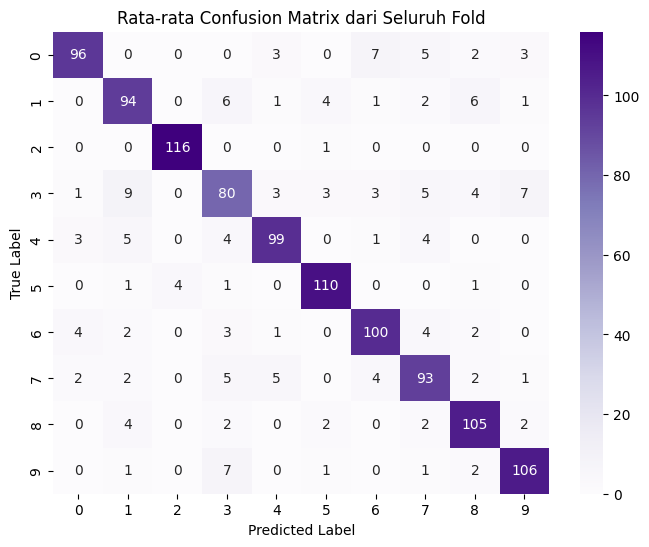

In [ ]:
# ====== Evaluasi Akhir ======
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")

# ====== Statistik Tambahan ======
print("\n===== Statistik Hasil K-Fold =====")
print(f"Mean Val Accuracy: {np.mean(fold_accuracies):.4f}")
print(f"Std Dev Val Accuracy: {np.std(fold_accuracies):.4f}")
print(f"Mean F1-Score: {np.mean(fold_f1_scores):.4f}")
print(f"Std Dev F1-Score: {np.std(fold_f1_scores):.4f}")

# ====== Rata-rata Confusion Matrix ======
mean_cm = np.mean(confusion_matrices, axis=0).astype(int)

plt.figure(figsize=(8, 6))
sns.heatmap(mean_cm, annot=True, fmt='d', cmap='Purples')
plt.title('Rata-rata Confusion Matrix dari Seluruh Fold')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

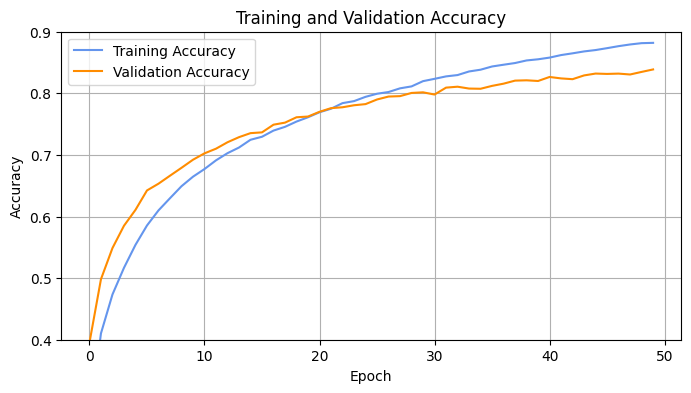

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

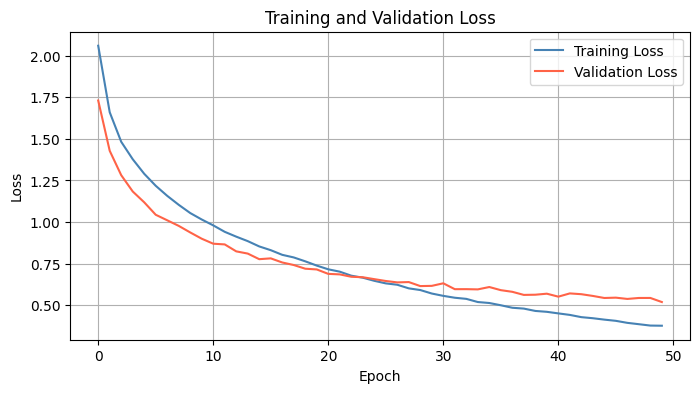

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

#### CRNN 30% Dropout, Augmented, 10s Segmentation

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def build_crnn_model(input_shape, num_classes):
    model = Sequential()
    weight_decay = 1e-4  # Nilai regulasi L2

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay), input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(Dropout(0.3))
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer
    model.add(Dropout(0.3))

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(num_classes, activation='softmax'))  # Dense untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


##### Model Summary

In [ ]:
input_shape = X.shape[1:]  # Ambil shape: (time_steps, n_mfcc, 3)
print("Input shape untuk model:", input_shape)

num_classes = y_categorical.shape[1]

model = build_crnn_model(input_shape, num_classes)

# Tampilkan summary model
model.summary()

Input shape untuk model: (431, 13, 3)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 216, 7, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 108, 4, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 108, 4, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 54, 2, 32)      │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 27, 1, 32)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 27, 1, 32)      │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 14, 1, 32)      │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 7, 1, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 7, 1, 32)       │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 7, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 7, 128)         │        82,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 7, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 128)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 241,738 (944.29 KB)

 Trainable params: 241,546 (943.54 KB)

 Non-trainable params: 192 (768.00 B)

##### K-Fold Cross Validation, 10 Fold


===== Fold 1/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - accuracy: 0.1848 - loss: 2.2093 - val_accuracy: 0.3537 - val_loss: 1.7479
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - accuracy: 0.3573 - loss: 1.7539 - val_accuracy: 0.4314 - val_loss: 1.5289
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 87ms/step - accuracy: 0.4264 - loss: 1.5814 - val_accuracy: 0.5435 - val_loss: 1.3393
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - accuracy: 0.4866 - loss: 1.4527 - val_accuracy: 0.5602 - val_loss: 1.2655
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - accuracy: 0.5187 - loss: 1.3640 - val_accuracy: 0.6045 - val_loss: 1.1609
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 43s 93ms/step - accuracy: 0.5527 - loss: 1.2956 - val_accuracy: 0.6221 - val_loss: 1.1182
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - accuracy: 0.5790 - loss: 1.2284 - val_accuracy: 0.6371 - val_loss: 1.0736
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - accuracy: 0.6002 - loss: 1.1678 - 

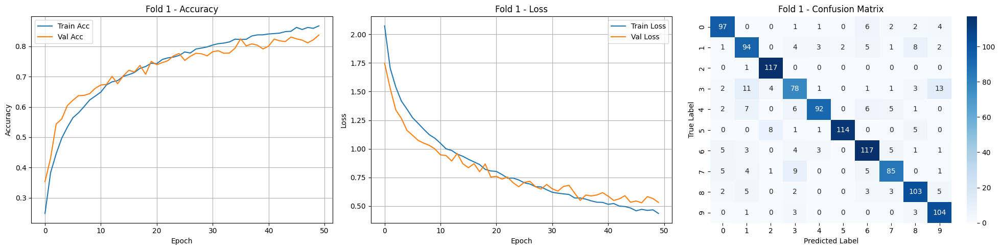

Fold 1 Final Accuracy: 0.8370
Fold 1 Precision: 0.8382
Fold 1 Recall: 0.8363
Fold 1 F1-Score: 0.8354
Akurasi Fold 1: (Train Acc: 0.8671, Val Acc: 0.8370, Gap: 0.0301)
📁 Model Fold 1 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_30drop_models/crnn_model_fold1.h5

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - accuracy: 0.2112 - loss: 2.2138 - val_accuracy: 0.4047 - val_loss: 1.7810
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - accuracy: 0.3612 - loss: 1.7930 - val_accuracy: 0.4783 - val_loss: 1.4509
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - accuracy: 0.4374 - loss: 1.5881 - val_accuracy: 0.5251 - val_loss: 1.3567
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - accuracy: 0.4727 - loss: 1.4703 - val_accuracy: 0.5577 - val_loss: 1.2337
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 43s 93ms/step - accuracy: 0.5175 - loss: 1.3639 - val_accuracy: 0.5987 - val_loss: 1.1625
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - accuracy: 0.5281 - loss: 1.3217 - val_accuracy: 0.6288 - val_loss: 1.0806
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - accuracy: 0.5539 - loss: 1.2602 - val_accuracy: 0.6296 - val_loss: 1.0566
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - accuracy: 0.5929 - loss: 1.1982 - 

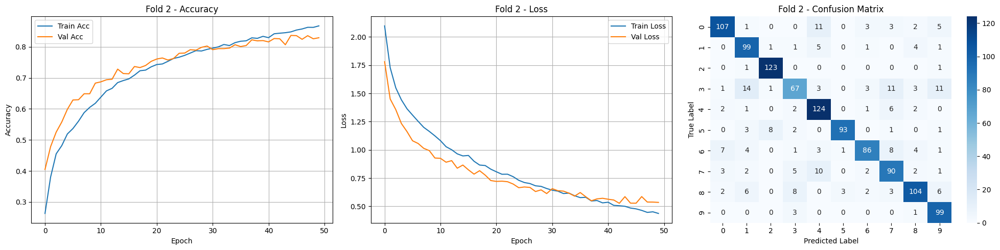

Fold 2 Final Accuracy: 0.8294
Fold 2 Precision: 0.8317
Fold 2 Recall: 0.8294
Fold 2 F1-Score: 0.8266
Akurasi Fold 2: (Train Acc: 0.8677, Val Acc: 0.8294, Gap: 0.0383)
📁 Model Fold 2 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_30drop_models/crnn_model_fold2.h5

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - accuracy: 0.1826 - loss: 2.2275 - val_accuracy: 0.3766 - val_loss: 1.7594
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - accuracy: 0.3624 - loss: 1.7892 - val_accuracy: 0.4519 - val_loss: 1.5289
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - accuracy: 0.4524 - loss: 1.5711 - val_accuracy: 0.5121 - val_loss: 1.3753
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - accuracy: 0.4938 - loss: 1.4385 - val_accuracy: 0.5598 - val_loss: 1.2378
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - accuracy: 0.5205 - loss: 1.3660 - val_accuracy: 0.5883 - val_loss: 1.1634
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - accuracy: 0.5485 - loss: 1.2932 - val_accuracy: 0.5833 - val_loss: 1.1571
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - accuracy: 0.5764 - loss: 1.2347 - val_accuracy: 0.6351 - val_loss: 1.0562
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - accuracy: 0.5931 - loss: 1.1991 - 

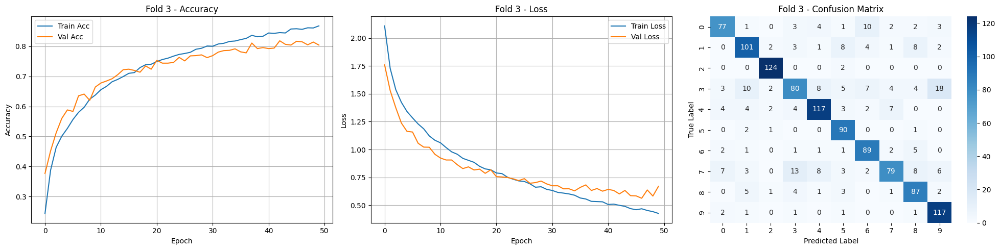

Fold 3 Final Accuracy: 0.8042
Fold 3 Precision: 0.8022
Fold 3 Recall: 0.8124
Fold 3 F1-Score: 0.8023
Akurasi Fold 3: (Train Acc: 0.8681, Val Acc: 0.8042, Gap: 0.0639)
📁 Model Fold 3 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_30drop_models/crnn_model_fold3.h5

===== Fold 4/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - accuracy: 0.1807 - loss: 2.2320 - val_accuracy: 0.3339 - val_loss: 1.8548
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - accuracy: 0.3549 - loss: 1.8151 - val_accuracy: 0.4134 - val_loss: 1.5466
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - accuracy: 0.4273 - loss: 1.5880 - val_accuracy: 0.5146 - val_loss: 1.3401
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - accuracy: 0.4791 - loss: 1.4696 - val_accuracy: 0.5682 - val_loss: 1.2566
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 89ms/step - accuracy: 0.5339 - loss: 1.3617 - val_accuracy: 0.5866 - val_loss: 1.1613
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - accuracy: 0.5547 - loss: 1.2888 - val_accuracy: 0.6159 - val_loss: 1.0840
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - accuracy: 0.5845 - loss: 1.2101 - val_accuracy: 0.6368 - val_loss: 1.0362
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - accuracy: 0.5972 - loss: 1.1948 - 

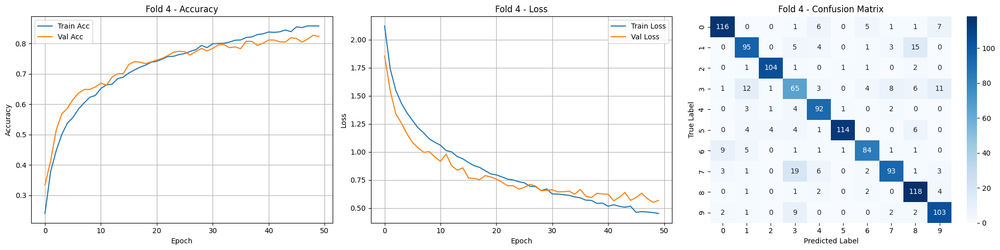

Fold 4 Final Accuracy: 0.8234
Fold 4 Precision: 0.8244
Fold 4 Recall: 0.8230
Fold 4 F1-Score: 0.8218
Akurasi Fold 4: (Train Acc: 0.8583, Val Acc: 0.8234, Gap: 0.0349)
📁 Model Fold 4 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_30drop_models/crnn_model_fold4.h5

===== Fold 5/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 39s 93ms/step - accuracy: 0.1763 - loss: 2.2328 - val_accuracy: 0.3490 - val_loss: 1.8553
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - accuracy: 0.3489 - loss: 1.8583 - val_accuracy: 0.4870 - val_loss: 1.4634
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 93ms/step - accuracy: 0.4369 - loss: 1.5993 - val_accuracy: 0.5456 - val_loss: 1.3167
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - accuracy: 0.4858 - loss: 1.4572 - val_accuracy: 0.5699 - val_loss: 1.2227
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - accuracy: 0.5071 - loss: 1.3998 - val_accuracy: 0.6067 - val_loss: 1.1436
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - accuracy: 0.5316 - loss: 1.3455 - val_accuracy: 0.6209 - val_loss: 1.1121
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - accuracy: 0.5582 - loss: 1.2661 - val_accuracy: 0.6460 - val_loss: 1.0302
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - accuracy: 0.5854 - loss: 1.2153 - 

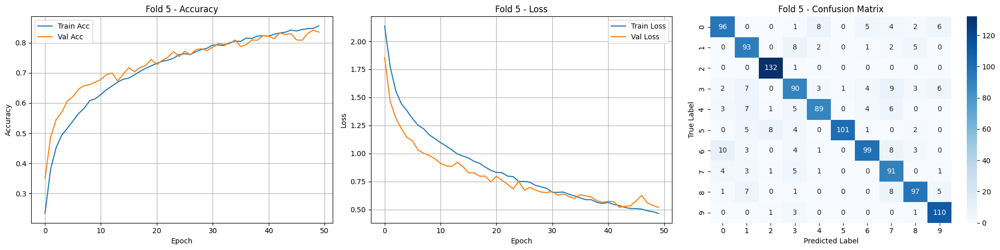

Fold 5 Final Accuracy: 0.8351
Fold 5 Precision: 0.8375
Fold 5 Recall: 0.8349
Fold 5 F1-Score: 0.8336
Akurasi Fold 5: (Train Acc: 0.8559, Val Acc: 0.8351, Gap: 0.0208)
📁 Model Fold 5 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_30drop_models/crnn_model_fold5.h5

===== Fold 6/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - accuracy: 0.1863 - loss: 2.2222 - val_accuracy: 0.3272 - val_loss: 1.8850
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - accuracy: 0.3495 - loss: 1.8236 - val_accuracy: 0.4142 - val_loss: 1.5725
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 32s 94ms/step - accuracy: 0.4139 - loss: 1.6362 - val_accuracy: 0.4837 - val_loss: 1.4256
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - accuracy: 0.4774 - loss: 1.4931 - val_accuracy: 0.5305 - val_loss: 1.3167
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 32s 94ms/step - accuracy: 0.5057 - loss: 1.3961 - val_accuracy: 0.5657 - val_loss: 1.2346
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - accuracy: 0.5494 - loss: 1.3122 - val_accuracy: 0.5858 - val_loss: 1.1666
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - accuracy: 0.5582 - loss: 1.2769 - val_accuracy: 0.6167 - val_loss: 1.1197
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.5999 - loss: 1.1897 -

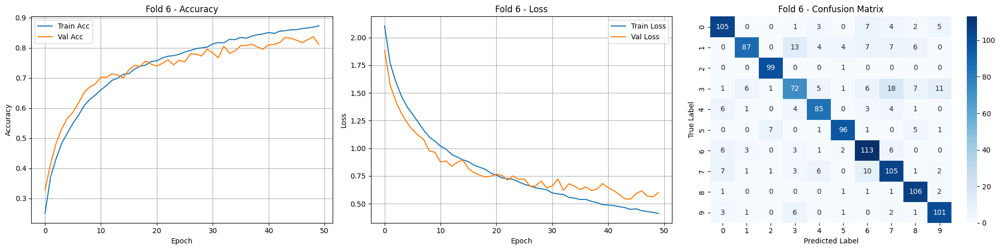

Fold 6 Final Accuracy: 0.8109
Fold 6 Precision: 0.8158
Fold 6 Recall: 0.8181
Fold 6 F1-Score: 0.8138
Akurasi Fold 6: (Train Acc: 0.8725, Val Acc: 0.8109, Gap: 0.0617)
📁 Model Fold 6 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_30drop_models/crnn_model_fold6.h5

===== Fold 7/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - accuracy: 0.2024 - loss: 2.1968 - val_accuracy: 0.3891 - val_loss: 1.6919
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - accuracy: 0.3786 - loss: 1.7119 - val_accuracy: 0.5079 - val_loss: 1.3958
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - accuracy: 0.4518 - loss: 1.5276 - val_accuracy: 0.5381 - val_loss: 1.3037
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - accuracy: 0.4860 - loss: 1.4297 - val_accuracy: 0.5414 - val_loss: 1.2825
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - accuracy: 0.5173 - loss: 1.3736 - val_accuracy: 0.5908 - val_loss: 1.1639
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - accuracy: 0.5433 - loss: 1.3110 - val_accuracy: 0.6151 - val_loss: 1.0901
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - accuracy: 0.5768 - loss: 1.2222 - val_accuracy: 0.6343 - val_loss: 1.0302
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - accuracy: 0.6001 - loss: 1.1758 

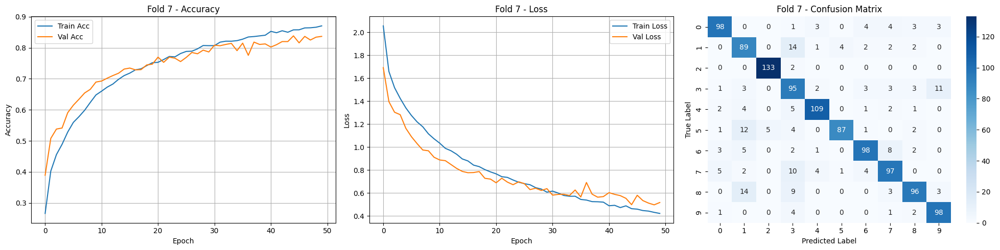

Fold 7 Final Accuracy: 0.8368
Fold 7 Precision: 0.8434
Fold 7 Recall: 0.8356
Fold 7 F1-Score: 0.8372
Akurasi Fold 7: (Train Acc: 0.8707, Val Acc: 0.8368, Gap: 0.0339)
📁 Model Fold 7 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_30drop_models/crnn_model_fold7.h5

===== Fold 8/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - accuracy: 0.1728 - loss: 2.2461 - val_accuracy: 0.3967 - val_loss: 1.8591
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - accuracy: 0.3445 - loss: 1.8679 - val_accuracy: 0.4644 - val_loss: 1.4854
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - accuracy: 0.4421 - loss: 1.6035 - val_accuracy: 0.5397 - val_loss: 1.2665
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - accuracy: 0.4944 - loss: 1.4474 - val_accuracy: 0.5992 - val_loss: 1.1656
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - accuracy: 0.5358 - loss: 1.3353 - val_accuracy: 0.6259 - val_loss: 1.0934
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - accuracy: 0.5604 - loss: 1.2788 - val_accuracy: 0.6603 - val_loss: 1.0212
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - accuracy: 0.5872 - loss: 1.2234 - val_accuracy: 0.6536 - val_loss: 0.9925
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - accuracy: 0.6058 - loss: 1.170

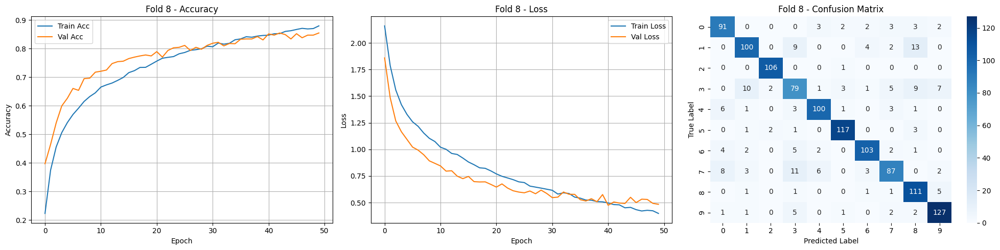

Fold 8 Final Accuracy: 0.8544
Fold 8 Precision: 0.8550
Fold 8 Recall: 0.8548
Fold 8 F1-Score: 0.8536
Akurasi Fold 8: (Train Acc: 0.8792, Val Acc: 0.8544, Gap: 0.0248)
📁 Model Fold 8 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_30drop_models/crnn_model_fold8.h5

===== Fold 9/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - accuracy: 0.1723 - loss: 2.2383 - val_accuracy: 0.3188 - val_loss: 1.8891
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - accuracy: 0.3307 - loss: 1.8756 - val_accuracy: 0.4619 - val_loss: 1.5345
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - accuracy: 0.4305 - loss: 1.6161 - val_accuracy: 0.5247 - val_loss: 1.3436
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - accuracy: 0.4797 - loss: 1.4823 - val_accuracy: 0.5632 - val_loss: 1.2286
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - accuracy: 0.5171 - loss: 1.3890 - val_accuracy: 0.5824 - val_loss: 1.1828
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - accuracy: 0.5356 - loss: 1.3295 - val_accuracy: 0.6109 - val_loss: 1.1327
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - accuracy: 0.5577 - loss: 1.2527 - val_accuracy: 0.6209 - val_loss: 1.1152
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - accuracy: 0.5776 - loss: 1.2361 

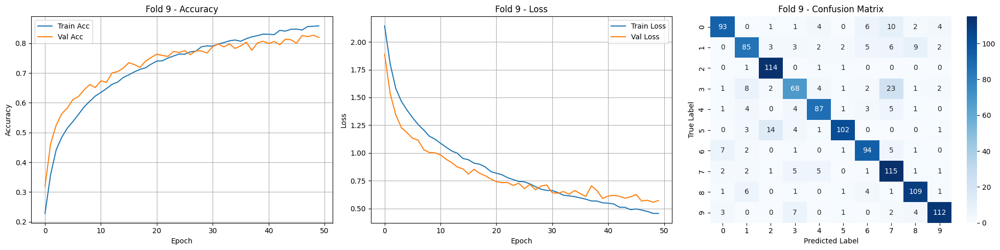

Fold 9 Final Accuracy: 0.8192
Fold 9 Precision: 0.8227
Fold 9 Recall: 0.8172
Fold 9 F1-Score: 0.8172
Akurasi Fold 9: (Train Acc: 0.8583, Val Acc: 0.8192, Gap: 0.0391)
📁 Model Fold 9 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_30drop_models/crnn_model_fold9.h5

===== Fold 10/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - accuracy: 0.1805 - loss: 2.2224 - val_accuracy: 0.3858 - val_loss: 1.7579
Epoch 2/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - accuracy: 0.3541 - loss: 1.7915 - val_accuracy: 0.5021 - val_loss: 1.4657
Epoch 3/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - accuracy: 0.4308 - loss: 1.5844 - val_accuracy: 0.5590 - val_loss: 1.2907
Epoch 4/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - accuracy: 0.4662 - loss: 1.4709 - val_accuracy: 0.5849 - val_loss: 1.2116
Epoch 5/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 42s 106ms/step - accuracy: 0.5092 - loss: 1.3784 - val_accuracy: 0.6167 - val_loss: 1.1267
Epoch 6/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step - accuracy: 0.5475 - loss: 1.3093 - val_accuracy: 0.6502 - val_loss: 1.0538
Epoch 7/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - accuracy: 0.5788 - loss: 1.2331 - val_accuracy: 0.6644 - val_loss: 1.0234
Epoch 8/50
337/337 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step - accuracy: 0.5931 - loss: 1

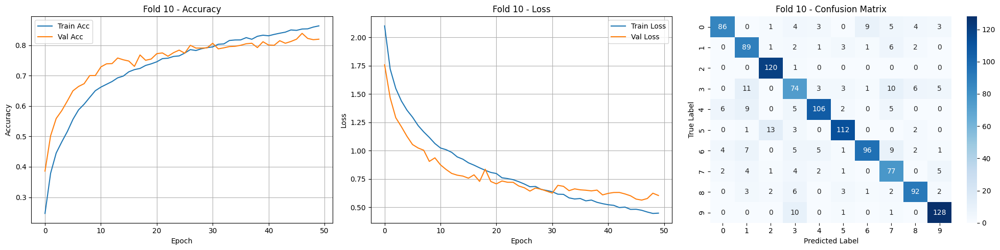

Fold 10 Final Accuracy: 0.8201
Fold 10 Precision: 0.8185
Fold 10 Recall: 0.8178
Fold 10 F1-Score: 0.8151
Akurasi Fold 10: (Train Acc: 0.8639, Val Acc: 0.8201, Gap: 0.0438)
📁 Model Fold 10 disimpan di: /content/drive/MyDrive/dataset/augmented_10seg_30drop_models/crnn_model_fold10.h5

🎉 Training selesai!


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []
confusion_matrices = []

# Path folder simpan seluruh model per fold
save_all_models_dir = "/content/drive/MyDrive/dataset/augmented_10seg_30drop_models"
os.makedirs(save_all_models_dir, exist_ok=True)

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)
    epochs = 50
    batch_size = 32

    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Akurasi terakhir
    train_acc_final = train_acc[-1]
    val_acc_final = val_acc[-1]
    acc_gap = abs(train_acc_final - val_acc_final)

    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    confusion_matrices.append(cm)

    # Plot Accuracy, Loss, Confusion Matrix side-by-side
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    axs[0].plot(train_acc, label='Train Acc')
    axs[0].plot(val_acc, label='Val Acc')
    axs[0].set_title(f'Fold {fold+1} - Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Accuracy')
    axs[0].legend()
    axs[0].grid(True)

    axs[1].plot(train_loss, label='Train Loss')
    axs[1].plot(val_loss, label='Val Loss')
    axs[1].set_title(f'Fold {fold+1} - Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].legend()
    axs[1].grid(True)

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axs[2])
    axs[2].set_title(f'Fold {fold+1} - Confusion Matrix')
    axs[2].set_xlabel('Predicted Label')
    axs[2].set_ylabel('True Label')

    plt.tight_layout()
    plt.show()

    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")
    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Tambahan: tampilkan ringkasan performa setiap fold
    print(f"Akurasi Fold {fold+1}: (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f}, Gap: {acc_gap:.4f})")

    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Simpan model untuk setiap fold
    fold_model_path = os.path.join(save_all_models_dir, f"crnn_model_fold{fold+1}.h5")
    model.save(fold_model_path)
    print(f"📁 Model Fold {fold+1} disimpan di: {fold_model_path}")

print("\n🎉 Training selesai!")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8662
Rata-rata Akurasi Validasi Terakhir: 0.8271
Gap Akurasi: 0.0391
✅ Model memiliki generalisasi yang **baik**.

===== Statistik Hasil K-Fold =====
Mean Val Accuracy: 0.8271
Std Dev Val Accuracy: 0.0139
Mean F1-Score: 0.8257
Std Dev F1-Score: 0.0140


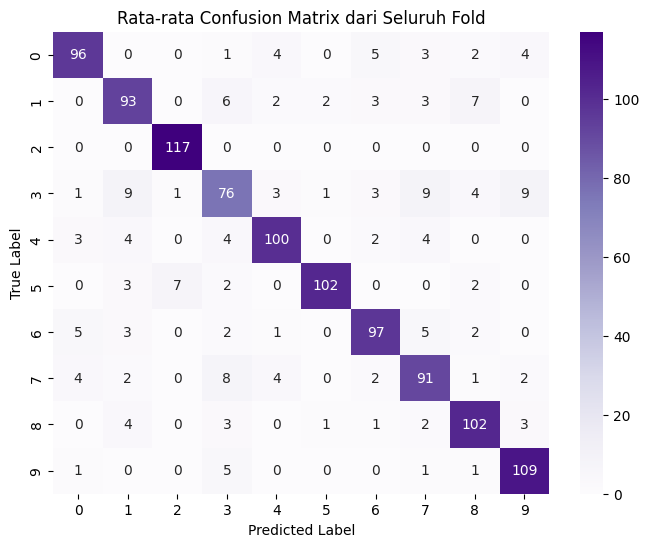

In [ ]:
# ====== Evaluasi Akhir ======
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")

# ====== Statistik Tambahan ======
print("\n===== Statistik Hasil K-Fold =====")
print(f"Mean Val Accuracy: {np.mean(fold_accuracies):.4f}")
print(f"Std Dev Val Accuracy: {np.std(fold_accuracies):.4f}")
print(f"Mean F1-Score: {np.mean(fold_f1_scores):.4f}")
print(f"Std Dev F1-Score: {np.std(fold_f1_scores):.4f}")

# ====== Rata-rata Confusion Matrix ======
mean_cm = np.mean(confusion_matrices, axis=0).astype(int)

plt.figure(figsize=(8, 6))
sns.heatmap(mean_cm, annot=True, fmt='d', cmap='Purples')
plt.title('Rata-rata Confusion Matrix dari Seluruh Fold')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

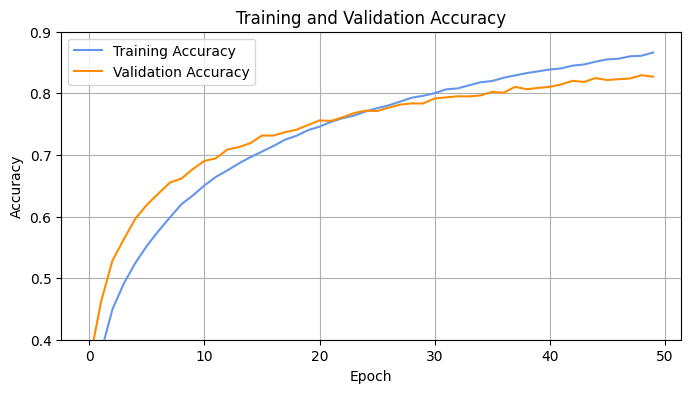

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

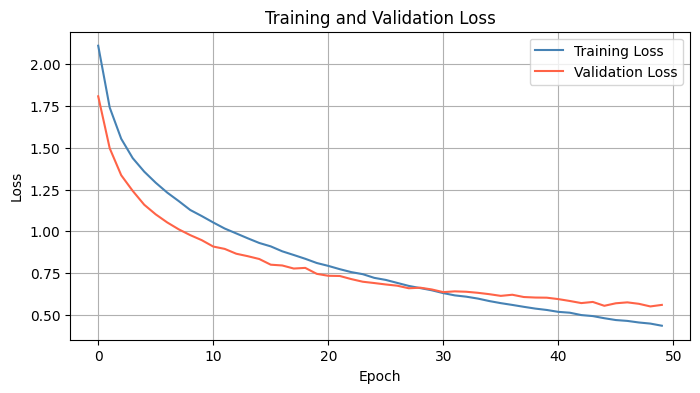

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

## Feaature Extraction with MFCC, delta-delta, and 5 Sec Segmentation

In [ ]:
import os
import librosa
import numpy as np
import pandas as pd
import json
from tqdm import tqdm

# Path ke folder dataset
general_path = '/content/drive/MyDrive/dataset/genres'
output_csv = '/content/drive/MyDrive/dataset/segmented_audio_5s_no-augmentation.csv'
output_json = '/content/drive/MyDrive/dataset/segmented_audio_5s_no-augmentation.json'
output_npy = '/content/drive/MyDrive/dataset/mfcc_dataset_5seg.npz'  # File npz untuk menyimpan semua data MFCC

# Parameter segmentasi dan ekstraksi fitur
segment_duration = 5  # Durasi segmentasi dalam detik
n_mfcc = 13  # Jumlah MFCC yang diekstrak
n_fft = 2048
hop_length = 512

# Menampung hasil segmentasi
X, y = [], []
data_segments = []
genre_to_label = {}

# Loop melalui setiap genre
genres = os.listdir(general_path)
for genre in genres:
    genre_dir = os.path.join(general_path, genre)
    if os.path.isdir(genre_dir):
        print(f"Memproses genre: {genre}")

        # Mapping genre ke angka
        if genre not in genre_to_label:
            genre_to_label[genre] = len(genre_to_label)

        # Loop melalui setiap file dalam genre
        for filename in tqdm(os.listdir(genre_dir)):
            if filename.endswith('.wav'):
                file_path = os.path.join(genre_dir, filename)

                try:
                    # Load audio file
                    data, sr = librosa.load(file_path, sr=None)

                    # Segmentasi audio
                    segment_length = int(segment_duration * sr)
                    num_segments = len(data) // segment_length

                    # Proses setiap segmen
                    for idx in range(num_segments):
                        start_sample = idx * segment_length
                        finish_sample = start_sample + segment_length
                        segment = data[start_sample:finish_sample]

                        if len(segment) == segment_length:
                            # Ekstraksi MFCC
                            mfcc = librosa.feature.mfcc(y=segment, sr=sr, n_mfcc=n_mfcc,
                                                        n_fft=n_fft, hop_length=hop_length)
                            delta = librosa.feature.delta(mfcc)
                            delta2 = librosa.feature.delta(mfcc, order=2)

                            # Gabungkan MFCC + delta + delta-delta sebagai 3 channel
                            mfcc_stack = np.stack([mfcc, delta, delta2], axis=0)  # Shape: (3, 13, time_steps)
                            mfcc_combined = mfcc_stack.transpose(2, 1, 0)  # Shape: (time_steps, 13, 3)

                            # Simpan ke array
                            X.append(mfcc_combined)
                            y.append(genre_to_label[genre])

                            # Simpan informasi segmen
                            segment_info = {
                                'genre': genre,
                                'filename': filename,
                                'segment_index': idx + 1,
                                'mfcc_shape': mfcc_combined.shape,  # (time_steps, 13, 3)
                                'genre_label': genre_to_label[genre]
                            }
                            data_segments.append(segment_info)

                except Exception as e:
                    print(f"Kesalahan saat memproses {file_path}: {e}")

# Konversi ke array numpy
X = np.array(X)  # Shape: (num_samples, time_steps, 13, 3)
y = np.array(y)

# Simpan dataset dalam satu file .npz
np.savez(output_npy, X=X, y=y)
print(f"Dataset MFCC disimpan dalam satu file: {output_npy}")

# Simpan hasil ke CSV
csv_data = pd.DataFrame(data_segments)
csv_data.to_csv(output_csv, index=False)
print(f"Hasil segmentasi disimpan ke: {output_csv}")

# Simpan hasil ke JSON
with open(output_json, 'w') as json_file:
    json.dump(data_segments, json_file, indent=4)
print(f"Hasil segmentasi disimpan ke: {output_json}")

Memproses genre: hiphop


100%|██████████| 100/100 [01:20<00:00,  1.25it/s]


Memproses genre: country


100%|██████████| 100/100 [00:25<00:00,  3.86it/s]


Memproses genre: classical


100%|██████████| 100/100 [00:20<00:00,  4.80it/s]


Memproses genre: rock


100%|██████████| 100/100 [00:17<00:00,  5.73it/s]


Memproses genre: pop


100%|██████████| 100/100 [00:18<00:00,  5.42it/s]


Memproses genre: jazz


100%|██████████| 99/99 [01:32<00:00,  1.07it/s]


Memproses genre: reggae


100%|██████████| 100/100 [00:14<00:00,  6.79it/s]


Memproses genre: disco


100%|██████████| 100/100 [00:18<00:00,  5.27it/s]


Memproses genre: blues


100%|██████████| 100/100 [00:17<00:00,  5.65it/s]


Memproses genre: metal


100%|██████████| 100/100 [00:19<00:00,  5.17it/s]


Memproses genre: mfcc_npy


100%|██████████| 23940/23940 [00:00<00:00, 1293531.00it/s]


Memproses genre: .ipynb_checkpoints


0it [00:00, ?it/s]


Dataset MFCC disimpan dalam satu file: /content/drive/MyDrive/dataset/mfcc_dataset_5seg.npz
Hasil segmentasi disimpan ke: /content/drive/MyDrive/dataset/segmented_audio_5s_no-augmentation.csv
Hasil segmentasi disimpan ke: /content/drive/MyDrive/dataset/segmented_audio_5s_no-augmentation.json


### Load Data

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report

# === LOAD DATA ===
npz_path = "/content/drive/MyDrive/dataset/mfcc_dataset_5seg.npz"

# Muat dataset dari file .npz
data = np.load(npz_path)
X = data["X"]  # Shape: (num_samples, time_steps, n_mfcc, 3)
y = data["y"]  # Shape: (num_samples,)

# One-hot encoding untuk label genre
num_classes = len(np.unique(y))  # Hitung jumlah kelas unik dalam y
y_categorical = to_categorical(y, num_classes)

print("Dataset berhasil dimuat!")
print(f"Shape X: {X.shape}, Shape y: {y_categorical.shape}")

Dataset berhasil dimuat!
Shape X: (5985, 216, 13, 3), Shape y: (5985, 10)


In [ ]:
import json
import numpy as np
from tensorflow.keras.utils import to_categorical

# Path ke file JSON yang menyimpan informasi segmentasi
json_path = "/content/drive/MyDrive/dataset/segmented_audio_5s_no-augmentation.json"

# Muat informasi segmentasi
with open(json_path, "r") as json_file:
    data_segments = json.load(json_file)

# Buat kembali genre_to_label dari data segmentasi
genre_to_label = {segment["genre"]: segment["genre_label"] for segment in data_segments}

# Tampilkan isi genre_to_label
print("Mapping Genre ke Label:")
for genre, label in genre_to_label.items():
    print(f"{genre}: {label}")

# === LOAD DATA ===
npz_path = "/content/drive/MyDrive/dataset/mfcc_dataset_5seg.npz"

# Muat dataset dari file .npz
data = np.load(npz_path)
X = data["X"]  # Shape: (num_samples, time_steps, n_mfcc, 1)
y = data["y"]  # Shape: (num_samples,)

# One-hot encoding untuk label genre
num_classes = len(np.unique(y))  # Hitung jumlah kelas unik dalam y
y_categorical = to_categorical(y, num_classes)

print("\nDataset berhasil dimuat!")
print(f"Shape X: {X.shape}, Shape y: {y_categorical.shape}")

Mapping Genre ke Label:
hiphop: 0
country: 1
classical: 2
rock: 3
pop: 4
jazz: 5
reggae: 6
disco: 7
blues: 8
metal: 9

Dataset berhasil dimuat!
Shape X: (5985, 216, 13, 3), Shape y: (5985, 10)


#### CRNN 25% Dropout and 5s Segmentation

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def build_crnn_model(input_shape, num_classes):
    model = Sequential()
    weight_decay = 1e-4  # Nilai regulasi L2

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay), input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(Dropout(0.25))
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer
    model.add(Dropout(0.25))

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(num_classes, activation='softmax'))  # Dense untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


##### Model Summary

In [ ]:
input_shape = X.shape[1:]  # Ambil shape: (time_steps, n_mfcc, 3)
print("Input shape untuk model:", input_shape)

num_classes = y_categorical.shape[1]

model = build_crnn_model(input_shape, num_classes)

# Tampilkan summary model
model.summary()

Input shape untuk model: (216, 13, 3)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 108, 7, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 54, 4, 32)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 54, 4, 32)      │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 27, 2, 32)      │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 14, 1, 32)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 14, 1, 32)      │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 7, 1, 32)       │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 1, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 4, 1, 32)       │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 4, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 4, 128)         │        82,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 4, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 128)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 241,738 (944.29 KB)

 Trainable params: 241,546 (943.54 KB)

 Non-trainable params: 192 (768.00 B)

##### K-Fold Cross Validation, 10 Fold


===== Fold 1/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - accuracy: 0.1557 - loss: 2.2761 - val_accuracy: 0.2922 - val_loss: 2.0287
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - accuracy: 0.3123 - loss: 1.9452 - val_accuracy: 0.3506 - val_loss: 1.6952
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.3681 - loss: 1.7292 - val_accuracy: 0.4975 - val_loss: 1.5013
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step - accuracy: 0.4158 - loss: 1.5936 - val_accuracy: 0.5376 - val_loss: 1.3741
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step - accuracy: 0.4698 - loss: 1.4609 - val_accuracy: 0.5392 - val_loss: 1.2937
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - accuracy: 0.4864 - loss: 1.4009 - val_accuracy: 0.5659 - val_loss: 1.2298
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - accuracy: 0.5046 - loss: 1.3401 - val_accuracy: 0.5626 - val_loss: 1.2034
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - accuracy: 0.5039 - loss: 1.3218 - val

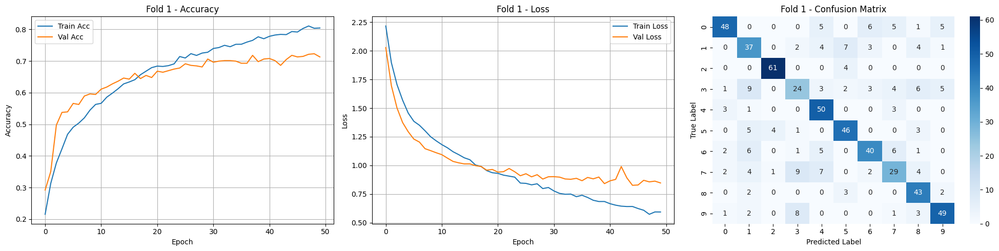

Fold 1 Final Accuracy: 0.7129
Fold 1 Precision: 0.7075
Fold 1 Recall: 0.7121
Fold 1 F1-Score: 0.7047
Akurasi Fold 1: (Train Acc: 0.8043, Val Acc: 0.7129, Gap: 0.0915)
📁 Model Fold 1 disimpan di: /content/drive/MyDrive/dataset/5seg_25drop_models/crnn_model_fold1.h5

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step - accuracy: 0.2026 - loss: 2.2694 - val_accuracy: 0.3289 - val_loss: 2.0604
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - accuracy: 0.3673 - loss: 1.9153 - val_accuracy: 0.4407 - val_loss: 1.6337
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - accuracy: 0.4269 - loss: 1.6672 - val_accuracy: 0.4942 - val_loss: 1.4467
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.4662 - loss: 1.5417 - val_accuracy: 0.4975 - val_loss: 1.3775
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - accuracy: 0.4815 - loss: 1.4488 - val_accuracy: 0.5125 - val_loss: 1.2962
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - accuracy: 0.5106 - loss: 1.3733 - val_accuracy: 0.5526 - val_loss: 1.2377
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step - accuracy: 0.5168 - loss: 1.3472 - val_accuracy: 0.5626 - val_loss: 1.2138
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - accuracy: 0.5562 - loss: 1.2666 - val

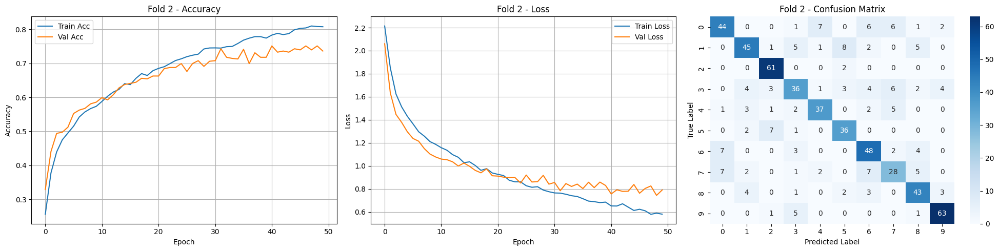

Fold 2 Final Accuracy: 0.7362
Fold 2 Precision: 0.7294
Fold 2 Recall: 0.7332
Fold 2 F1-Score: 0.7291
Akurasi Fold 2: (Train Acc: 0.8076, Val Acc: 0.7362, Gap: 0.0714)
📁 Model Fold 2 disimpan di: /content/drive/MyDrive/dataset/5seg_25drop_models/crnn_model_fold2.h5

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - accuracy: 0.1482 - loss: 2.2775 - val_accuracy: 0.3205 - val_loss: 2.1364
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - accuracy: 0.2913 - loss: 2.0116 - val_accuracy: 0.3523 - val_loss: 1.7355
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - accuracy: 0.3821 - loss: 1.7465 - val_accuracy: 0.4124 - val_loss: 1.5648
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step - accuracy: 0.4234 - loss: 1.6160 - val_accuracy: 0.5025 - val_loss: 1.3807
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - accuracy: 0.4874 - loss: 1.4438 - val_accuracy: 0.5693 - val_loss: 1.2233
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step - accuracy: 0.5244 - loss: 1.3607 - val_accuracy: 0.5693 - val_loss: 1.2181
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step - accuracy: 0.5535 - loss: 1.2710 - val_accuracy: 0.5943 - val_loss: 1.1113
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - accuracy: 0.5573 - loss: 1.2436 - val_

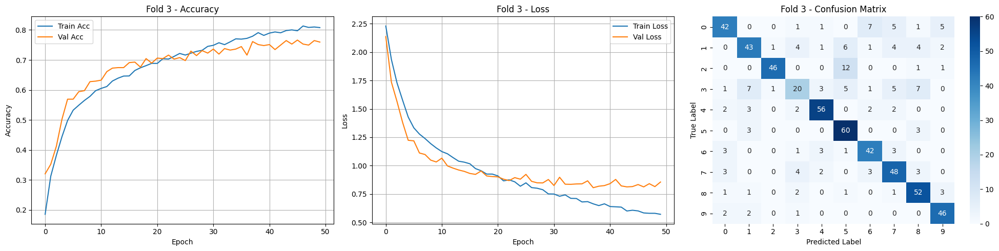

Fold 3 Final Accuracy: 0.7596
Fold 3 Precision: 0.7586
Fold 3 Recall: 0.7549
Fold 3 F1-Score: 0.7515
Akurasi Fold 3: (Train Acc: 0.8078, Val Acc: 0.7596, Gap: 0.0482)
📁 Model Fold 3 disimpan di: /content/drive/MyDrive/dataset/5seg_25drop_models/crnn_model_fold3.h5

===== Fold 4/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - accuracy: 0.1701 - loss: 2.2770 - val_accuracy: 0.2755 - val_loss: 2.1202
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step - accuracy: 0.3060 - loss: 2.0439 - val_accuracy: 0.3656 - val_loss: 1.7750
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step - accuracy: 0.3929 - loss: 1.7770 - val_accuracy: 0.4608 - val_loss: 1.5199
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - accuracy: 0.4343 - loss: 1.6012 - val_accuracy: 0.5008 - val_loss: 1.3866
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.4638 - loss: 1.4921 - val_accuracy: 0.5326 - val_loss: 1.2923
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step - accuracy: 0.4977 - loss: 1.3885 - val_accuracy: 0.5492 - val_loss: 1.2624
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - accuracy: 0.5231 - loss: 1.3366 - val_accuracy: 0.5676 - val_loss: 1.2359
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - accuracy: 0.5481 - loss: 1.2677 - val_

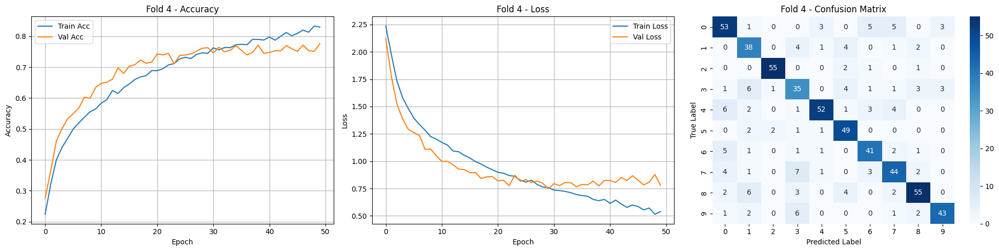

Fold 4 Final Accuracy: 0.7763
Fold 4 Precision: 0.7782
Fold 4 Recall: 0.7774
Fold 4 F1-Score: 0.7758
Akurasi Fold 4: (Train Acc: 0.8296, Val Acc: 0.7763, Gap: 0.0533)
📁 Model Fold 4 disimpan di: /content/drive/MyDrive/dataset/5seg_25drop_models/crnn_model_fold4.h5

===== Fold 5/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 19s 55ms/step - accuracy: 0.1393 - loss: 2.2859 - val_accuracy: 0.3306 - val_loss: 2.1523
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - accuracy: 0.2997 - loss: 2.0111 - val_accuracy: 0.3823 - val_loss: 1.7008
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - accuracy: 0.3640 - loss: 1.7418 - val_accuracy: 0.4858 - val_loss: 1.5009
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - accuracy: 0.4369 - loss: 1.5794 - val_accuracy: 0.5109 - val_loss: 1.3870
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step - accuracy: 0.4688 - loss: 1.4579 - val_accuracy: 0.5442 - val_loss: 1.2919
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step - accuracy: 0.5101 - loss: 1.3680 - val_accuracy: 0.5793 - val_loss: 1.2236
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.5317 - loss: 1.2845 - val_accuracy: 0.5860 - val_loss: 1.1783
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - accuracy: 0.5688 - loss: 1.2301 - va

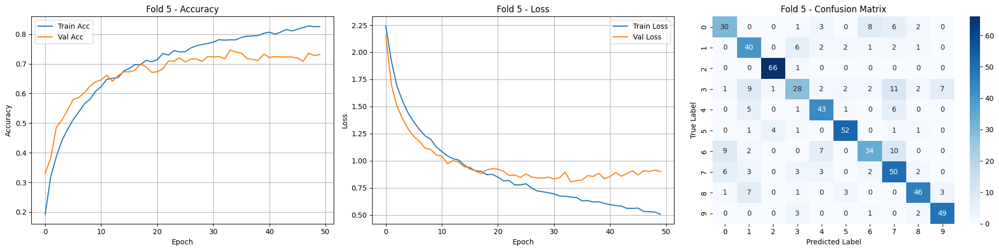

Fold 5 Final Accuracy: 0.7312
Fold 5 Precision: 0.7312
Fold 5 Recall: 0.7309
Fold 5 F1-Score: 0.7263
Akurasi Fold 5: (Train Acc: 0.8255, Val Acc: 0.7312, Gap: 0.0943)
📁 Model Fold 5 disimpan di: /content/drive/MyDrive/dataset/5seg_25drop_models/crnn_model_fold5.h5

===== Fold 6/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.1698 - loss: 2.2768 - val_accuracy: 0.3378 - val_loss: 2.0739
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step - accuracy: 0.3180 - loss: 1.9031 - val_accuracy: 0.3913 - val_loss: 1.6499
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - accuracy: 0.3968 - loss: 1.6617 - val_accuracy: 0.4181 - val_loss: 1.5277
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - accuracy: 0.4469 - loss: 1.5081 - val_accuracy: 0.4967 - val_loss: 1.3805
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step - accuracy: 0.4839 - loss: 1.4199 - val_accuracy: 0.5084 - val_loss: 1.3273
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - accuracy: 0.5049 - loss: 1.3577 - val_accuracy: 0.5217 - val_loss: 1.2846
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.5181 - loss: 1.3273 - val_accuracy: 0.5485 - val_loss: 1.2316
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step - accuracy: 0.5449 - loss: 1.2794 - val

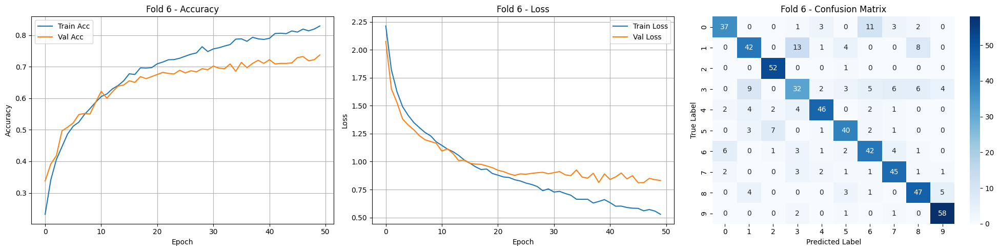

Fold 6 Final Accuracy: 0.7375
Fold 6 Precision: 0.7374
Fold 6 Recall: 0.7443
Fold 6 F1-Score: 0.7385
Akurasi Fold 6: (Train Acc: 0.8294, Val Acc: 0.7375, Gap: 0.0919)
📁 Model Fold 6 disimpan di: /content/drive/MyDrive/dataset/5seg_25drop_models/crnn_model_fold6.h5

===== Fold 7/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - accuracy: 0.1301 - loss: 2.2850 - val_accuracy: 0.3177 - val_loss: 2.1131
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - accuracy: 0.2843 - loss: 1.9938 - val_accuracy: 0.3729 - val_loss: 1.7364
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - accuracy: 0.3672 - loss: 1.7277 - val_accuracy: 0.4599 - val_loss: 1.5171
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - accuracy: 0.4213 - loss: 1.5961 - val_accuracy: 0.5485 - val_loss: 1.3244
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - accuracy: 0.4687 - loss: 1.4549 - val_accuracy: 0.5786 - val_loss: 1.2417
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.4948 - loss: 1.4051 - val_accuracy: 0.6104 - val_loss: 1.1444
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step - accuracy: 0.5314 - loss: 1.3016 - val_accuracy: 0.6003 - val_loss: 1.1139
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step - accuracy: 0.5567 - loss: 1.2794 - va

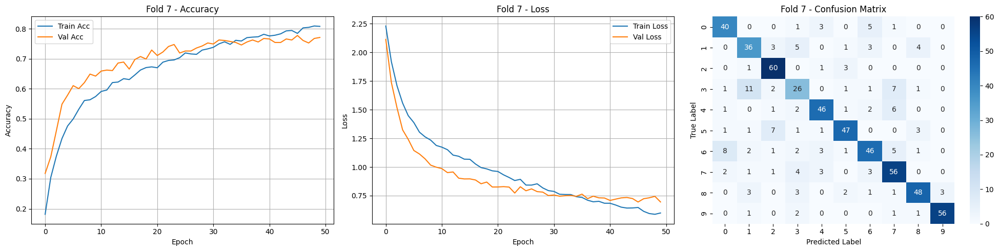

Fold 7 Final Accuracy: 0.7709
Fold 7 Precision: 0.7667
Fold 7 Recall: 0.7657
Fold 7 F1-Score: 0.7648
Akurasi Fold 7: (Train Acc: 0.8079, Val Acc: 0.7709, Gap: 0.0370)
📁 Model Fold 7 disimpan di: /content/drive/MyDrive/dataset/5seg_25drop_models/crnn_model_fold7.h5

===== Fold 8/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - accuracy: 0.1444 - loss: 2.2838 - val_accuracy: 0.2692 - val_loss: 2.0602
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.2830 - loss: 2.0061 - val_accuracy: 0.3679 - val_loss: 1.7291
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.3704 - loss: 1.7355 - val_accuracy: 0.4097 - val_loss: 1.5481
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step - accuracy: 0.4200 - loss: 1.6025 - val_accuracy: 0.4749 - val_loss: 1.4340
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step - accuracy: 0.4648 - loss: 1.4807 - val_accuracy: 0.5184 - val_loss: 1.3427
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step - accuracy: 0.5036 - loss: 1.3839 - val_accuracy: 0.5385 - val_loss: 1.2784
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - accuracy: 0.5119 - loss: 1.3392 - val_accuracy: 0.5502 - val_loss: 1.2629
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - accuracy: 0.5446 - loss: 1.2712 - 

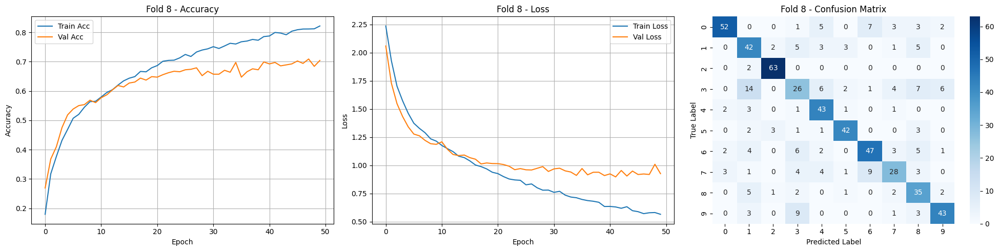

Fold 8 Final Accuracy: 0.7040
Fold 8 Precision: 0.7060
Fold 8 Recall: 0.7073
Fold 8 F1-Score: 0.7013
Akurasi Fold 8: (Train Acc: 0.8216, Val Acc: 0.7040, Gap: 0.1176)
📁 Model Fold 8 disimpan di: /content/drive/MyDrive/dataset/5seg_25drop_models/crnn_model_fold8.h5

===== Fold 9/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - accuracy: 0.1551 - loss: 2.2818 - val_accuracy: 0.2876 - val_loss: 2.1346
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - accuracy: 0.2906 - loss: 2.0401 - val_accuracy: 0.3010 - val_loss: 1.8118
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step - accuracy: 0.3757 - loss: 1.7548 - val_accuracy: 0.4649 - val_loss: 1.5352
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - accuracy: 0.4360 - loss: 1.5588 - val_accuracy: 0.5167 - val_loss: 1.3909
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - accuracy: 0.4669 - loss: 1.4741 - val_accuracy: 0.5117 - val_loss: 1.3301
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - accuracy: 0.4966 - loss: 1.3983 - val_accuracy: 0.5502 - val_loss: 1.2489
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step - accuracy: 0.5152 - loss: 1.3383 - val_accuracy: 0.5635 - val_loss: 1.2182
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step - accuracy: 0.5405 - loss: 1.2878 - v

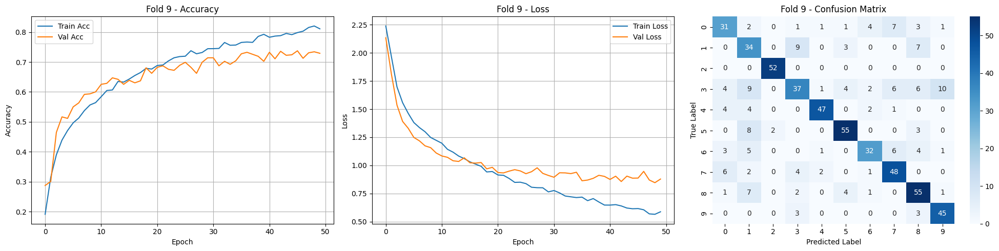

Fold 9 Final Accuracy: 0.7291
Fold 9 Precision: 0.7383
Fold 9 Recall: 0.7371
Fold 9 F1-Score: 0.7330
Akurasi Fold 9: (Train Acc: 0.8108, Val Acc: 0.7291, Gap: 0.0817)
📁 Model Fold 9 disimpan di: /content/drive/MyDrive/dataset/5seg_25drop_models/crnn_model_fold9.h5

===== Fold 10/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - accuracy: 0.1338 - loss: 2.2896 - val_accuracy: 0.2977 - val_loss: 2.1399
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.2911 - loss: 2.0334 - val_accuracy: 0.3896 - val_loss: 1.7301
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - accuracy: 0.3524 - loss: 1.7659 - val_accuracy: 0.4783 - val_loss: 1.5113
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - accuracy: 0.4045 - loss: 1.6339 - val_accuracy: 0.5050 - val_loss: 1.4044
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - accuracy: 0.4468 - loss: 1.5396 - val_accuracy: 0.5084 - val_loss: 1.4587
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step - accuracy: 0.4574 - loss: 1.4737 - val_accuracy: 0.5385 - val_loss: 1.3061
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - accuracy: 0.4982 - loss: 1.4040 - val_accuracy: 0.5669 - val_loss: 1.2268
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - accuracy: 0.4934 - loss: 1.3774 - 

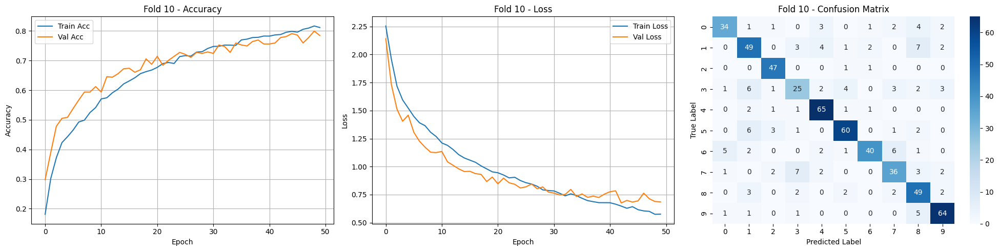

Fold 10 Final Accuracy: 0.7843
Fold 10 Precision: 0.7813
Fold 10 Recall: 0.7744
Fold 10 F1-Score: 0.7747
Akurasi Fold 10: (Train Acc: 0.8114, Val Acc: 0.7843, Gap: 0.0271)
📁 Model Fold 10 disimpan di: /content/drive/MyDrive/dataset/5seg_25drop_models/crnn_model_fold10.h5

🎉 Training selesai!


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []
confusion_matrices = []

# Path folder simpan seluruh model per fold
save_all_models_dir = "/content/drive/MyDrive/dataset/5seg_25drop_models"
os.makedirs(save_all_models_dir, exist_ok=True)

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)
    epochs = 50
    batch_size = 32

    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Akurasi terakhir
    train_acc_final = train_acc[-1]
    val_acc_final = val_acc[-1]
    acc_gap = abs(train_acc_final - val_acc_final)

    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    confusion_matrices.append(cm)

    # Plot Accuracy, Loss, Confusion Matrix side-by-side
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    axs[0].plot(train_acc, label='Train Acc')
    axs[0].plot(val_acc, label='Val Acc')
    axs[0].set_title(f'Fold {fold+1} - Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Accuracy')
    axs[0].legend()
    axs[0].grid(True)

    axs[1].plot(train_loss, label='Train Loss')
    axs[1].plot(val_loss, label='Val Loss')
    axs[1].set_title(f'Fold {fold+1} - Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].legend()
    axs[1].grid(True)

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axs[2])
    axs[2].set_title(f'Fold {fold+1} - Confusion Matrix')
    axs[2].set_xlabel('Predicted Label')
    axs[2].set_ylabel('True Label')

    plt.tight_layout()
    plt.show()

    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")
    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Tambahan: tampilkan ringkasan performa setiap fold
    print(f"Akurasi Fold {fold+1}: (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f}, Gap: {acc_gap:.4f})")

    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Simpan model untuk setiap fold
    fold_model_path = os.path.join(save_all_models_dir, f"crnn_model_fold{fold+1}.h5")
    model.save(fold_model_path)
    print(f"📁 Model Fold {fold+1} disimpan di: {fold_model_path}")

print("\n🎉 Training selesai!")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8156
Rata-rata Akurasi Validasi Terakhir: 0.7442
Gap Akurasi: 0.0714
✅ Model memiliki generalisasi yang **baik**.

===== Statistik Hasil K-Fold =====
Mean Val Accuracy: 0.7442
Std Dev Val Accuracy: 0.0259
Mean F1-Score: 0.7400
Std Dev F1-Score: 0.0252


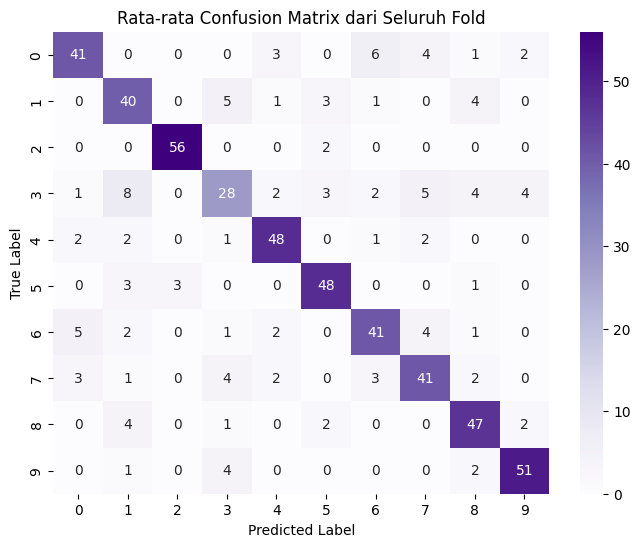

In [ ]:
# ====== Evaluasi Akhir ======
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")

# ====== Statistik Tambahan ======
print("\n===== Statistik Hasil K-Fold =====")
print(f"Mean Val Accuracy: {np.mean(fold_accuracies):.4f}")
print(f"Std Dev Val Accuracy: {np.std(fold_accuracies):.4f}")
print(f"Mean F1-Score: {np.mean(fold_f1_scores):.4f}")
print(f"Std Dev F1-Score: {np.std(fold_f1_scores):.4f}")

# ====== Rata-rata Confusion Matrix ======
mean_cm = np.mean(confusion_matrices, axis=0).astype(int)

plt.figure(figsize=(8, 6))
sns.heatmap(mean_cm, annot=True, fmt='d', cmap='Purples')
plt.title('Rata-rata Confusion Matrix dari Seluruh Fold')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

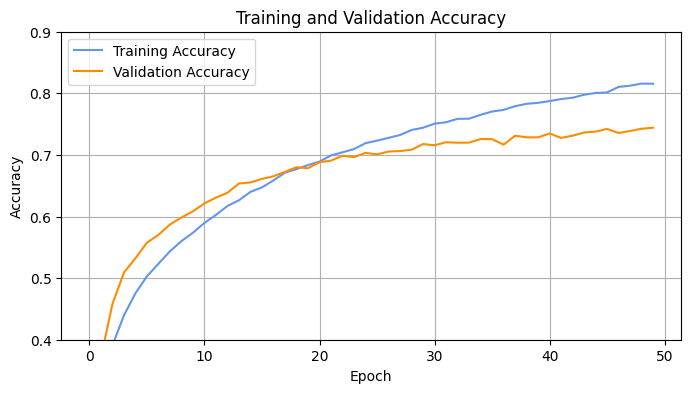

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

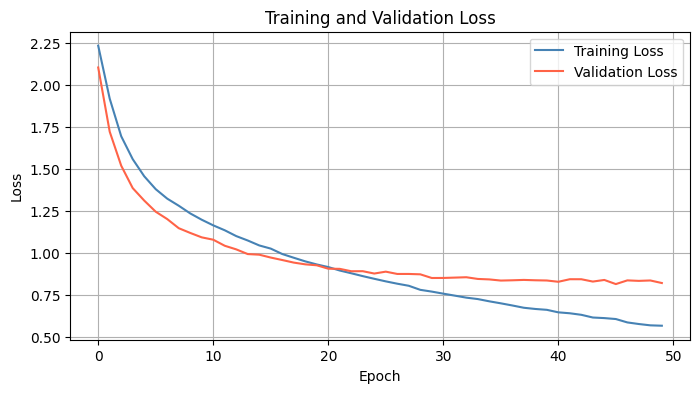

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

#### CRNN 30% Dropout and 5s Segmentation

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def build_crnn_model(input_shape, num_classes):
    model = Sequential()
    weight_decay = 1e-4  # Nilai regulasi L2

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay), input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(Dropout(0.3))
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer
    model.add(Dropout(0.3))

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(num_classes, activation='softmax'))  # Dense untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


##### Model Summary

In [ ]:
input_shape = X.shape[1:]  # Ambil shape: (time_steps, n_mfcc, 3)
print("Input shape untuk model:", input_shape)

num_classes = y_categorical.shape[1]

model = build_crnn_model(input_shape, num_classes)

# Tampilkan summary model
model.summary()

Input shape untuk model: (216, 13, 3)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_42 (Conv2D)              │ (None, 108, 7, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_42 (MaxPooling2D) │ (None, 54, 4, 32)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_42          │ (None, 54, 4, 32)      │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_43 (Conv2D)              │ (None, 27, 2, 32)      │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_43 (MaxPooling2D) │ (None, 14, 1, 32)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_43          │ (None, 14, 1, 32)      │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (None, 7, 1, 32)       │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_44 (MaxPooling2D) │ (None, 4, 1, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_44          │ (None, 4, 1, 32)       │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_14 (Reshape)            │ (None, 4, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_28 (LSTM)                  │ (None, 4, 128)         │        82,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_56 (Dropout)            │ (None, 4, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_29 (LSTM)                  │ (None, 128)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_57 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_14 (Flatten)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_58 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_59 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 241,738 (944.29 KB)

 Trainable params: 241,546 (943.54 KB)

 Non-trainable params: 192 (768.00 B)

##### K-Fold Cross Validation, 10 Fold


===== Fold 1/10 =====
Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step - accuracy: 0.1581 - loss: 2.2739 - val_accuracy: 0.3022 - val_loss: 2.0908
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.2831 - loss: 1.9957 - val_accuracy: 0.3239 - val_loss: 1.7983
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - accuracy: 0.3168 - loss: 1.8176 - val_accuracy: 0.4023 - val_loss: 1.6214
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - accuracy: 0.3718 - loss: 1.6946 - val_accuracy: 0.4908 - val_loss: 1.4951
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step - accuracy: 0.4042 - loss: 1.6160 - val_accuracy: 0.5159 - val_loss: 1.4045
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.4503 - loss: 1.5142 - val_accuracy: 0.5643 - val_loss: 1.2841
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step - accuracy: 0.4716 - loss: 1.4755 - val_accuracy: 0.5459 - val_loss: 1.2908
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.4940

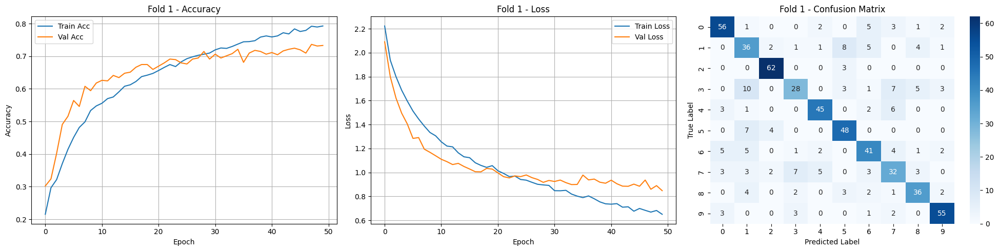

Fold 1 Final Accuracy: 0.7329
Fold 1 Precision: 0.7278
Fold 1 Recall: 0.7272
Fold 1 F1-Score: 0.7255
Akurasi Fold 1: (Train Acc: 0.7926, Val Acc: 0.7329, Gap: 0.0597)
📁 Model Fold 1 disimpan di: /content/drive/MyDrive/dataset/5seg_30drop_models/crnn_model_fold1.h5

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - accuracy: 0.1860 - loss: 2.2703 - val_accuracy: 0.2621 - val_loss: 2.0426
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - accuracy: 0.2810 - loss: 1.9815 - val_accuracy: 0.3606 - val_loss: 1.7326
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - accuracy: 0.3621 - loss: 1.7878 - val_accuracy: 0.4508 - val_loss: 1.5690
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step - accuracy: 0.4119 - loss: 1.6419 - val_accuracy: 0.5192 - val_loss: 1.4221
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step - accuracy: 0.4581 - loss: 1.5330 - val_accuracy: 0.5576 - val_loss: 1.3040
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - accuracy: 0.4940 - loss: 1.4269 - val_accuracy: 0.5643 - val_loss: 1.2476
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - accuracy: 0.5121 - loss: 1.3891 - val_accuracy: 0.5893 - val_loss: 1.1730
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.5435 - loss: 1.3084 - val

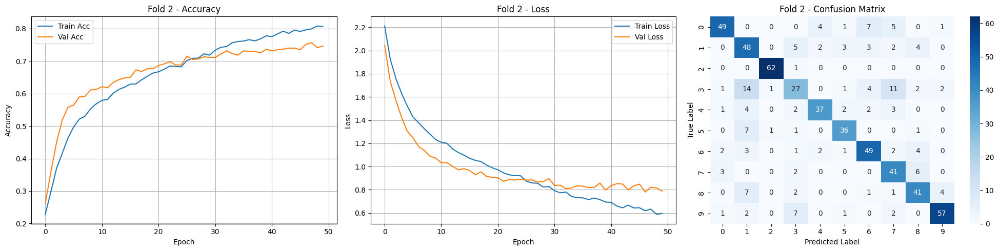

Fold 2 Final Accuracy: 0.7462
Fold 2 Precision: 0.7530
Fold 2 Recall: 0.7469
Fold 2 F1-Score: 0.7460
Akurasi Fold 2: (Train Acc: 0.8058, Val Acc: 0.7462, Gap: 0.0595)
📁 Model Fold 2 disimpan di: /content/drive/MyDrive/dataset/5seg_30drop_models/crnn_model_fold2.h5

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step - accuracy: 0.1328 - loss: 2.2918 - val_accuracy: 0.2922 - val_loss: 2.1266
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step - accuracy: 0.2702 - loss: 2.0486 - val_accuracy: 0.3422 - val_loss: 1.7835
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step - accuracy: 0.3279 - loss: 1.8208 - val_accuracy: 0.3957 - val_loss: 1.5929
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.3869 - loss: 1.6807 - val_accuracy: 0.4858 - val_loss: 1.4555
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - accuracy: 0.4266 - loss: 1.5806 - val_accuracy: 0.5242 - val_loss: 1.3498
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step - accuracy: 0.4649 - loss: 1.4913 - val_accuracy: 0.5609 - val_loss: 1.2964
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - accuracy: 0.5114 - loss: 1.3859 - val_accuracy: 0.5860 - val_loss: 1.2160
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - accuracy: 0.5237 - loss: 1.3408 - va

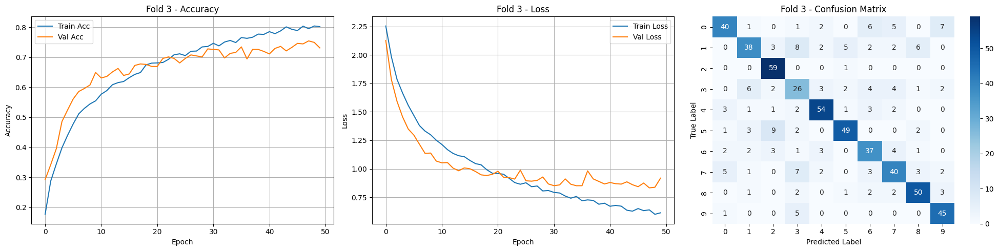

Fold 3 Final Accuracy: 0.7312
Fold 3 Precision: 0.7266
Fold 3 Recall: 0.7308
Fold 3 F1-Score: 0.7251
Akurasi Fold 3: (Train Acc: 0.8021, Val Acc: 0.7312, Gap: 0.0709)
📁 Model Fold 3 disimpan di: /content/drive/MyDrive/dataset/5seg_30drop_models/crnn_model_fold3.h5

===== Fold 4/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 17s 50ms/step - accuracy: 0.1668 - loss: 2.2763 - val_accuracy: 0.3022 - val_loss: 2.0344
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - accuracy: 0.2872 - loss: 1.9671 - val_accuracy: 0.3339 - val_loss: 1.7188
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step - accuracy: 0.3545 - loss: 1.7393 - val_accuracy: 0.4608 - val_loss: 1.5019
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - accuracy: 0.3970 - loss: 1.6258 - val_accuracy: 0.5342 - val_loss: 1.3547
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - accuracy: 0.4712 - loss: 1.5003 - val_accuracy: 0.5242 - val_loss: 1.2805
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - accuracy: 0.4770 - loss: 1.4281 - val_accuracy: 0.6060 - val_loss: 1.1603
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - accuracy: 0.5244 - loss: 1.3423 - val_accuracy: 0.6210 - val_loss: 1.1290
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - accuracy: 0.5373 - loss: 1.3033 - val_

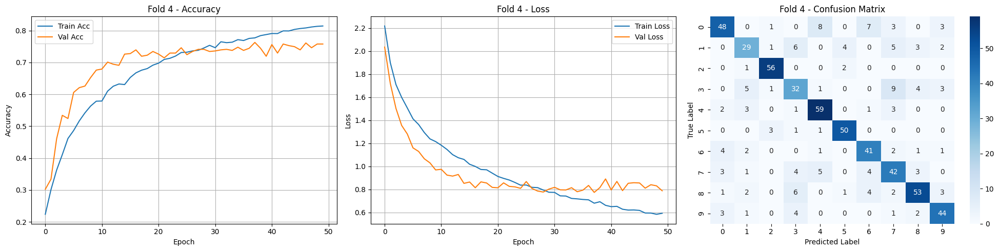

Fold 4 Final Accuracy: 0.7579
Fold 4 Precision: 0.7541
Fold 4 Recall: 0.7563
Fold 4 F1-Score: 0.7539
Akurasi Fold 4: (Train Acc: 0.8145, Val Acc: 0.7579, Gap: 0.0566)
📁 Model Fold 4 disimpan di: /content/drive/MyDrive/dataset/5seg_30drop_models/crnn_model_fold4.h5

===== Fold 5/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - accuracy: 0.1335 - loss: 2.2910 - val_accuracy: 0.2838 - val_loss: 2.2007
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - accuracy: 0.2567 - loss: 2.1069 - val_accuracy: 0.3005 - val_loss: 1.8860
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step - accuracy: 0.3023 - loss: 1.9160 - val_accuracy: 0.3322 - val_loss: 1.7331
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - accuracy: 0.3595 - loss: 1.7547 - val_accuracy: 0.3806 - val_loss: 1.5608
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step - accuracy: 0.4050 - loss: 1.6255 - val_accuracy: 0.4257 - val_loss: 1.4520
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step - accuracy: 0.4393 - loss: 1.5496 - val_accuracy: 0.5242 - val_loss: 1.3075
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - accuracy: 0.4596 - loss: 1.4692 - val_accuracy: 0.5459 - val_loss: 1.2438
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step - accuracy: 0.5159 - loss: 1.3709 - val

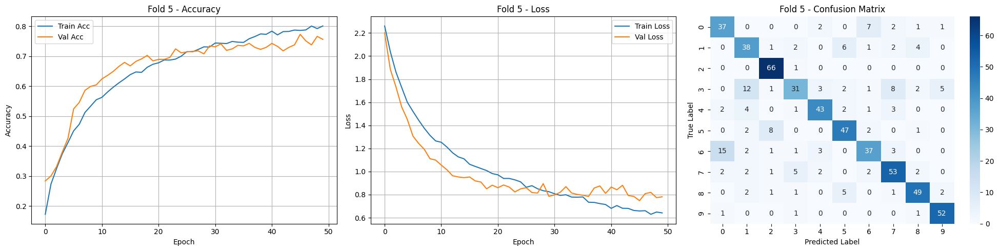

Fold 5 Final Accuracy: 0.7563
Fold 5 Precision: 0.7533
Fold 5 Recall: 0.7571
Fold 5 F1-Score: 0.7505
Akurasi Fold 5: (Train Acc: 0.8010, Val Acc: 0.7563, Gap: 0.0447)
📁 Model Fold 5 disimpan di: /content/drive/MyDrive/dataset/5seg_30drop_models/crnn_model_fold5.h5

===== Fold 6/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 19s 60ms/step - accuracy: 0.1480 - loss: 2.2795 - val_accuracy: 0.3194 - val_loss: 2.1095
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step - accuracy: 0.2890 - loss: 1.9960 - val_accuracy: 0.3311 - val_loss: 1.7774
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - accuracy: 0.3342 - loss: 1.8117 - val_accuracy: 0.3896 - val_loss: 1.6318
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - accuracy: 0.3847 - loss: 1.6734 - val_accuracy: 0.4599 - val_loss: 1.5117
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - accuracy: 0.4343 - loss: 1.5919 - val_accuracy: 0.4900 - val_loss: 1.4218
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step - accuracy: 0.4683 - loss: 1.4709 - val_accuracy: 0.5151 - val_loss: 1.3411
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step - accuracy: 0.4882 - loss: 1.4173 - val_accuracy: 0.5284 - val_loss: 1.2950
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.5267 - loss: 1.3726 - val_

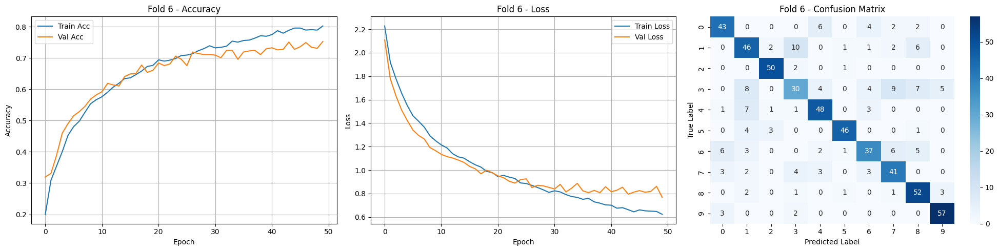

Fold 6 Final Accuracy: 0.7525
Fold 6 Precision: 0.7554
Fold 6 Recall: 0.7596
Fold 6 F1-Score: 0.7548
Akurasi Fold 6: (Train Acc: 0.8021, Val Acc: 0.7525, Gap: 0.0496)
📁 Model Fold 6 disimpan di: /content/drive/MyDrive/dataset/5seg_30drop_models/crnn_model_fold6.h5

===== Fold 7/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step - accuracy: 0.1521 - loss: 2.2892 - val_accuracy: 0.2609 - val_loss: 2.1331
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - accuracy: 0.2725 - loss: 2.0702 - val_accuracy: 0.3662 - val_loss: 1.7891
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step - accuracy: 0.3433 - loss: 1.8590 - val_accuracy: 0.4298 - val_loss: 1.6033
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - accuracy: 0.3995 - loss: 1.6991 - val_accuracy: 0.4900 - val_loss: 1.4344
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - accuracy: 0.4386 - loss: 1.5820 - val_accuracy: 0.5184 - val_loss: 1.3464
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step - accuracy: 0.4759 - loss: 1.4866 - val_accuracy: 0.5619 - val_loss: 1.2403
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - accuracy: 0.4969 - loss: 1.4273 - val_accuracy: 0.5719 - val_loss: 1.1955
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step - accuracy: 0.5120 - loss: 1.3721 - val

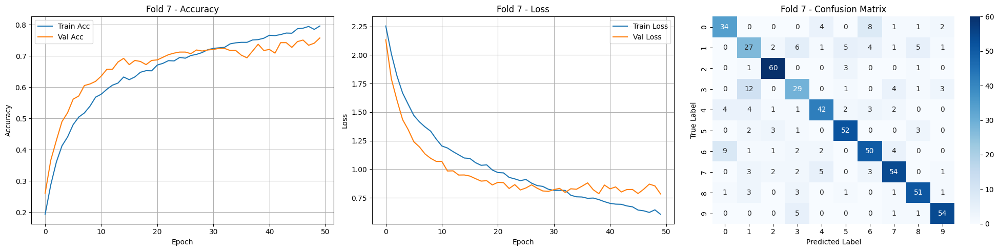

Fold 7 Final Accuracy: 0.7575
Fold 7 Precision: 0.7479
Fold 7 Recall: 0.7484
Fold 7 F1-Score: 0.7478
Akurasi Fold 7: (Train Acc: 0.7958, Val Acc: 0.7575, Gap: 0.0383)
📁 Model Fold 7 disimpan di: /content/drive/MyDrive/dataset/5seg_30drop_models/crnn_model_fold7.h5

===== Fold 8/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step - accuracy: 0.1722 - loss: 2.2783 - val_accuracy: 0.2709 - val_loss: 2.0875
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - accuracy: 0.2982 - loss: 1.9985 - val_accuracy: 0.3813 - val_loss: 1.7059
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.3927 - loss: 1.7479 - val_accuracy: 0.4247 - val_loss: 1.5464
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step - accuracy: 0.4113 - loss: 1.6352 - val_accuracy: 0.5184 - val_loss: 1.4074
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step - accuracy: 0.4509 - loss: 1.4962 - val_accuracy: 0.4983 - val_loss: 1.3767
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - accuracy: 0.4777 - loss: 1.4354 - val_accuracy: 0.5535 - val_loss: 1.2696
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - accuracy: 0.5113 - loss: 1.3477 - val_accuracy: 0.5853 - val_loss: 1.2203
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 20s 59ms/step - accuracy: 0.5283 - loss: 1.3259 - va

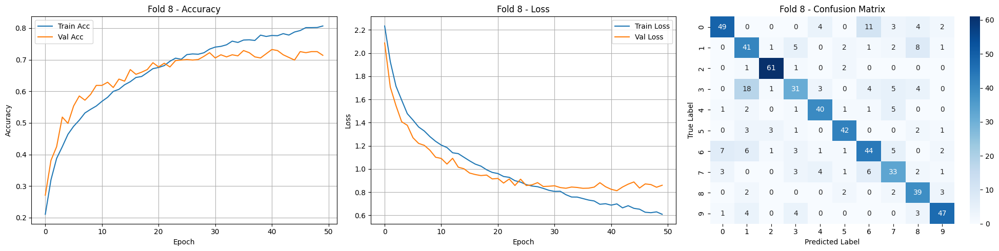

Fold 8 Final Accuracy: 0.7140
Fold 8 Precision: 0.7182
Fold 8 Recall: 0.7204
Fold 8 F1-Score: 0.7154
Akurasi Fold 8: (Train Acc: 0.8069, Val Acc: 0.7140, Gap: 0.0929)
📁 Model Fold 8 disimpan di: /content/drive/MyDrive/dataset/5seg_30drop_models/crnn_model_fold8.h5

===== Fold 9/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step - accuracy: 0.1698 - loss: 2.2810 - val_accuracy: 0.2508 - val_loss: 2.1022
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step - accuracy: 0.2821 - loss: 2.0109 - val_accuracy: 0.3261 - val_loss: 1.8047
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - accuracy: 0.3409 - loss: 1.8036 - val_accuracy: 0.3980 - val_loss: 1.6465
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - accuracy: 0.3990 - loss: 1.6583 - val_accuracy: 0.4465 - val_loss: 1.5132
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step - accuracy: 0.4518 - loss: 1.5415 - val_accuracy: 0.5184 - val_loss: 1.3797
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - accuracy: 0.4902 - loss: 1.4420 - val_accuracy: 0.5569 - val_loss: 1.2927
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - accuracy: 0.4924 - loss: 1.4091 - val_accuracy: 0.5702 - val_loss: 1.2500
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - accuracy: 0.5147 - loss: 1.3387 - va

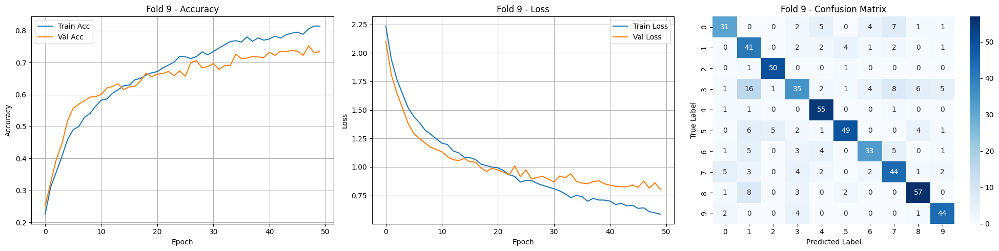

Fold 9 Final Accuracy: 0.7341
Fold 9 Precision: 0.7429
Fold 9 Recall: 0.7453
Fold 9 F1-Score: 0.7367
Akurasi Fold 9: (Train Acc: 0.8140, Val Acc: 0.7341, Gap: 0.0799)
📁 Model Fold 9 disimpan di: /content/drive/MyDrive/dataset/5seg_30drop_models/crnn_model_fold9.h5

===== Fold 10/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.1506 - loss: 2.2871 - val_accuracy: 0.3161 - val_loss: 2.1271
Epoch 2/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - accuracy: 0.2801 - loss: 2.0514 - val_accuracy: 0.3679 - val_loss: 1.7961
Epoch 3/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step - accuracy: 0.3377 - loss: 1.8238 - val_accuracy: 0.4348 - val_loss: 1.6082
Epoch 4/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step - accuracy: 0.3772 - loss: 1.6726 - val_accuracy: 0.4916 - val_loss: 1.4626
Epoch 5/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - accuracy: 0.4263 - loss: 1.5639 - val_accuracy: 0.5452 - val_loss: 1.3472
Epoch 6/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - accuracy: 0.4740 - loss: 1.4682 - val_accuracy: 0.5351 - val_loss: 1.3195
Epoch 7/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - accuracy: 0.5042 - loss: 1.3822 - val_accuracy: 0.5853 - val_loss: 1.2044
Epoch 8/50
169/169 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - accuracy: 0.5108 - loss: 1.3555 - 

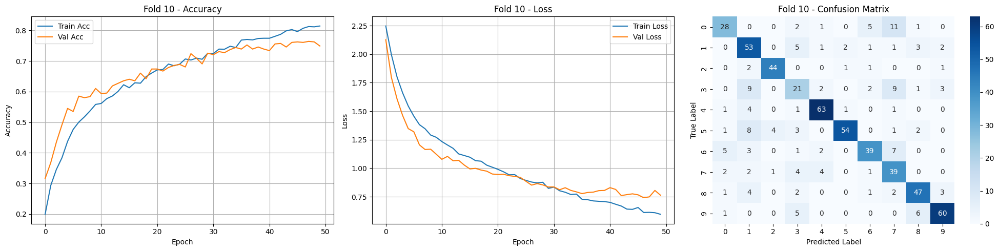

Fold 10 Final Accuracy: 0.7492
Fold 10 Precision: 0.7493
Fold 10 Recall: 0.7371
Fold 10 F1-Score: 0.7388
Akurasi Fold 10: (Train Acc: 0.8146, Val Acc: 0.7492, Gap: 0.0654)
📁 Model Fold 10 disimpan di: /content/drive/MyDrive/dataset/5seg_30drop_models/crnn_model_fold10.h5

🎉 Training selesai!


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []
confusion_matrices = []

# Path folder simpan seluruh model per fold
save_all_models_dir = "/content/drive/MyDrive/dataset/5seg_30drop_models"
os.makedirs(save_all_models_dir, exist_ok=True)

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)
    epochs = 50
    batch_size = 32

    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Akurasi terakhir
    train_acc_final = train_acc[-1]
    val_acc_final = val_acc[-1]
    acc_gap = abs(train_acc_final - val_acc_final)

    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    confusion_matrices.append(cm)

    # Plot Accuracy, Loss, Confusion Matrix side-by-side
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    axs[0].plot(train_acc, label='Train Acc')
    axs[0].plot(val_acc, label='Val Acc')
    axs[0].set_title(f'Fold {fold+1} - Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Accuracy')
    axs[0].legend()
    axs[0].grid(True)

    axs[1].plot(train_loss, label='Train Loss')
    axs[1].plot(val_loss, label='Val Loss')
    axs[1].set_title(f'Fold {fold+1} - Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].legend()
    axs[1].grid(True)

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axs[2])
    axs[2].set_title(f'Fold {fold+1} - Confusion Matrix')
    axs[2].set_xlabel('Predicted Label')
    axs[2].set_ylabel('True Label')

    plt.tight_layout()
    plt.show()

    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")
    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Tambahan: tampilkan ringkasan performa setiap fold
    print(f"Akurasi Fold {fold+1}: (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f}, Gap: {acc_gap:.4f})")

    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Simpan model untuk setiap fold
    fold_model_path = os.path.join(save_all_models_dir, f"crnn_model_fold{fold+1}.h5")
    model.save(fold_model_path)
    print(f"📁 Model Fold {fold+1} disimpan di: {fold_model_path}")

print("\n🎉 Training selesai!")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8049
Rata-rata Akurasi Validasi Terakhir: 0.7432
Gap Akurasi: 0.0617
✅ Model memiliki generalisasi yang **baik**.

===== Statistik Hasil K-Fold =====
Mean Val Accuracy: 0.7432
Std Dev Val Accuracy: 0.0138
Mean F1-Score: 0.7395
Std Dev F1-Score: 0.0129


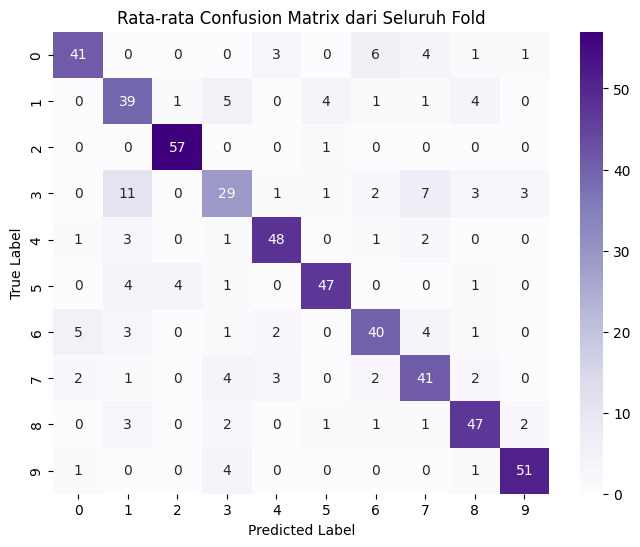

In [ ]:
# ====== Evaluasi Akhir ======
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")

# ====== Statistik Tambahan ======
print("\n===== Statistik Hasil K-Fold =====")
print(f"Mean Val Accuracy: {np.mean(fold_accuracies):.4f}")
print(f"Std Dev Val Accuracy: {np.std(fold_accuracies):.4f}")
print(f"Mean F1-Score: {np.mean(fold_f1_scores):.4f}")
print(f"Std Dev F1-Score: {np.std(fold_f1_scores):.4f}")

# ====== Rata-rata Confusion Matrix ======
mean_cm = np.mean(confusion_matrices, axis=0).astype(int)

plt.figure(figsize=(8, 6))
sns.heatmap(mean_cm, annot=True, fmt='d', cmap='Purples')
plt.title('Rata-rata Confusion Matrix dari Seluruh Fold')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

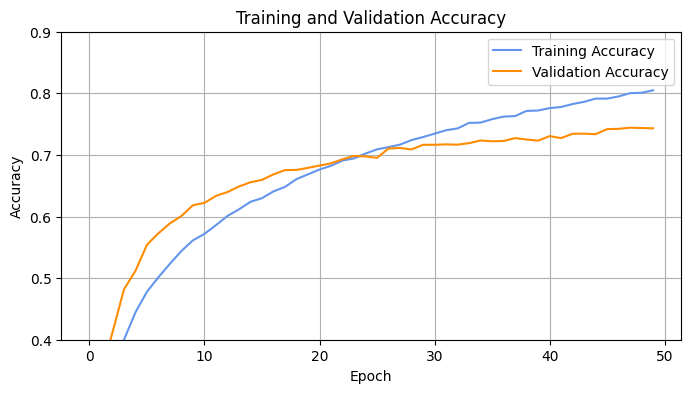

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

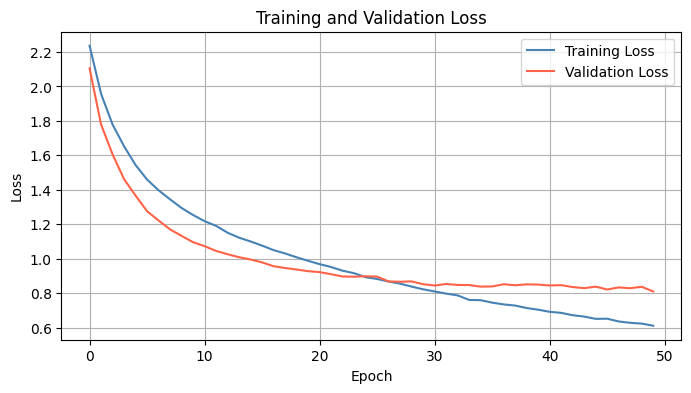

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

## Feaature Extraction with MFCC, delta-delta, and 10 Sec Segmentation

In [ ]:
import os
import librosa
import numpy as np
import pandas as pd
import json
from tqdm import tqdm

# Path ke folder dataset
general_path = '/content/drive/MyDrive/dataset/genres'
output_csv = '/content/drive/MyDrive/dataset/segmented_audio_10s_no-augmentation.csv'
output_json = '/content/drive/MyDrive/dataset/segmented_audio_10s_no-augmentation.json'
output_npy = '/content/drive/MyDrive/dataset/mfcc_dataset_10seg.npz'  # File npz untuk menyimpan semua data MFCC

# Parameter segmentasi dan ekstraksi fitur
segment_duration = 10  # Durasi segmentasi dalam detik
n_mfcc = 13  # Jumlah MFCC yang diekstrak
n_fft = 2048
hop_length = 512

# Menampung hasil segmentasi
X, y = [], []
data_segments = []
genre_to_label = {}

# Loop melalui setiap genre
genres = os.listdir(general_path)
for genre in genres:
    genre_dir = os.path.join(general_path, genre)
    if os.path.isdir(genre_dir):
        print(f"Memproses genre: {genre}")

        # Mapping genre ke angka
        if genre not in genre_to_label:
            genre_to_label[genre] = len(genre_to_label)

        # Loop melalui setiap file dalam genre
        for filename in tqdm(os.listdir(genre_dir)):
            if filename.endswith('.wav'):
                file_path = os.path.join(genre_dir, filename)

                try:
                    # Load audio file
                    data, sr = librosa.load(file_path, sr=None)

                    # Segmentasi audio
                    segment_length = int(segment_duration * sr)
                    num_segments = len(data) // segment_length

                    # Proses setiap segmen
                    for idx in range(num_segments):
                        start_sample = idx * segment_length
                        finish_sample = start_sample + segment_length
                        segment = data[start_sample:finish_sample]

                        if len(segment) == segment_length:
                            # Ekstraksi MFCC
                            mfcc = librosa.feature.mfcc(y=segment, sr=sr, n_mfcc=n_mfcc,
                                                        n_fft=n_fft, hop_length=hop_length)
                            delta = librosa.feature.delta(mfcc)
                            delta2 = librosa.feature.delta(mfcc, order=2)

                            # Gabungkan MFCC + delta + delta-delta sebagai 3 channel
                            mfcc_stack = np.stack([mfcc, delta, delta2], axis=0)  # Shape: (3, 13, time_steps)
                            mfcc_combined = mfcc_stack.transpose(2, 1, 0)  # Shape: (time_steps, 13, 3)

                            # Simpan ke array
                            X.append(mfcc_combined)
                            y.append(genre_to_label[genre])

                            # Simpan informasi segmen
                            segment_info = {
                                'genre': genre,
                                'filename': filename,
                                'segment_index': idx + 1,
                                'mfcc_shape': mfcc_combined.shape,  # (time_steps, 13, 3)
                                'genre_label': genre_to_label[genre]
                            }
                            data_segments.append(segment_info)

                except Exception as e:
                    print(f"Kesalahan saat memproses {file_path}: {e}")

# Konversi ke array numpy
X = np.array(X)  # Shape: (num_samples, time_steps, 13, 3)
y = np.array(y)

# Simpan dataset dalam satu file .npz
np.savez(output_npy, X=X, y=y)
print(f"Dataset MFCC disimpan dalam satu file: {output_npy}")

# Simpan hasil ke CSV
csv_data = pd.DataFrame(data_segments)
csv_data.to_csv(output_csv, index=False)
print(f"Hasil segmentasi disimpan ke: {output_csv}")

# Simpan hasil ke JSON
with open(output_json, 'w') as json_file:
    json.dump(data_segments, json_file, indent=4)
print(f"Hasil segmentasi disimpan ke: {output_json}")

Memproses genre: hiphop


100%|██████████| 100/100 [01:33<00:00,  1.07it/s]


Memproses genre: country


100%|██████████| 100/100 [00:25<00:00,  3.95it/s]


Memproses genre: classical


100%|██████████| 100/100 [00:24<00:00,  4.15it/s]


Memproses genre: rock


100%|██████████| 100/100 [00:26<00:00,  3.84it/s]


Memproses genre: pop


100%|██████████| 100/100 [00:21<00:00,  4.56it/s]


Memproses genre: jazz


100%|██████████| 99/99 [00:51<00:00,  1.94it/s]


Memproses genre: reggae


100%|██████████| 100/100 [00:15<00:00,  6.62it/s]


Memproses genre: disco


100%|██████████| 100/100 [00:15<00:00,  6.48it/s]


Memproses genre: blues


100%|██████████| 100/100 [00:15<00:00,  6.54it/s]


Memproses genre: metal


100%|██████████| 100/100 [00:14<00:00,  6.81it/s]


Memproses genre: mfcc_npy


100%|██████████| 23940/23940 [00:00<00:00, 1298062.67it/s]


Memproses genre: .ipynb_checkpoints


0it [00:00, ?it/s]


Dataset MFCC disimpan dalam satu file: /content/drive/MyDrive/dataset/mfcc_dataset_10seg.npz
Hasil segmentasi disimpan ke: /content/drive/MyDrive/dataset/segmented_audio_10s_no-augmentation.csv
Hasil segmentasi disimpan ke: /content/drive/MyDrive/dataset/segmented_audio_10s_no-augmentation.json


### Load Data

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report

# === LOAD DATA ===
npz_path = "/content/drive/MyDrive/dataset/mfcc_dataset_10seg.npz"

# Muat dataset dari file .npz
data = np.load(npz_path)
X = data["X"]  # Shape: (num_samples, time_steps, n_mfcc, 3)
y = data["y"]  # Shape: (num_samples,)

# One-hot encoding untuk label genre
num_classes = len(np.unique(y))  # Hitung jumlah kelas unik dalam y
y_categorical = to_categorical(y, num_classes)

print("Dataset berhasil dimuat!")
print(f"Shape X: {X.shape}, Shape y: {y_categorical.shape}")

Dataset berhasil dimuat!
Shape X: (2988, 431, 13, 3), Shape y: (2988, 10)


In [ ]:
import json
import numpy as np
from tensorflow.keras.utils import to_categorical

# Path ke file JSON yang menyimpan informasi segmentasi
json_path = "/content/drive/MyDrive/dataset/segmented_audio_10s_no-augmentation.json"

# Muat informasi segmentasi
with open(json_path, "r") as json_file:
    data_segments = json.load(json_file)

# Buat kembali genre_to_label dari data segmentasi
genre_to_label = {segment["genre"]: segment["genre_label"] for segment in data_segments}

# Tampilkan isi genre_to_label
print("Mapping Genre ke Label:")
for genre, label in genre_to_label.items():
    print(f"{genre}: {label}")

# === LOAD DATA ===
npz_path = "/content/drive/MyDrive/dataset/mfcc_dataset_10seg.npz"

# Muat dataset dari file .npz
data = np.load(npz_path)
X = data["X"]  # Shape: (num_samples, time_steps, n_mfcc, 1)
y = data["y"]  # Shape: (num_samples,)

# One-hot encoding untuk label genre
num_classes = len(np.unique(y))  # Hitung jumlah kelas unik dalam y
y_categorical = to_categorical(y, num_classes)

print("\nDataset berhasil dimuat!")
print(f"Shape X: {X.shape}, Shape y: {y_categorical.shape}")

Mapping Genre ke Label:
hiphop: 0
country: 1
classical: 2
rock: 3
pop: 4
jazz: 5
reggae: 6
disco: 7
blues: 8
metal: 9

Dataset berhasil dimuat!
Shape X: (2988, 431, 13, 3), Shape y: (2988, 10)


#### CRNN 25% Dropout and 10s Segmentation

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def build_crnn_model(input_shape, num_classes):
    model = Sequential()
    weight_decay = 1e-4  # Nilai regulasi L2

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay), input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(Dropout(0.25))
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer
    model.add(Dropout(0.25))

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(num_classes, activation='softmax'))  # Dense untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


##### Model Summary

In [ ]:
input_shape = X.shape[1:]  # Ambil shape: (time_steps, n_mfcc, 3)
print("Input shape untuk model:", input_shape)

num_classes = y_categorical.shape[1]

model = build_crnn_model(input_shape, num_classes)

# Tampilkan summary model
model.summary()

Input shape untuk model: (431, 13, 3)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 216, 7, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 108, 4, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 108, 4, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 54, 2, 32)      │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 27, 1, 32)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 27, 1, 32)      │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 14, 1, 32)      │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 7, 1, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 7, 1, 32)       │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 7, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 7, 128)         │        82,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 7, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 128)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 241,738 (944.29 KB)

 Trainable params: 241,546 (943.54 KB)

 Non-trainable params: 192 (768.00 B)

##### K-Fold Cross Validation, 10 Fold


===== Fold 1/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - accuracy: 0.1350 - loss: 2.2857 - val_accuracy: 0.1839 - val_loss: 2.2153
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 104ms/step - accuracy: 0.2522 - loss: 2.1244 - val_accuracy: 0.3211 - val_loss: 1.9759
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - accuracy: 0.3146 - loss: 1.9219 - val_accuracy: 0.4247 - val_loss: 1.7420
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - accuracy: 0.3759 - loss: 1.7644 - val_accuracy: 0.4247 - val_loss: 1.5675
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - accuracy: 0.4256 - loss: 1.5985 - val_accuracy: 0.4883 - val_loss: 1.4272
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.4570 - loss: 1.5018 - val_accuracy: 0.5351 - val_loss: 1.3379
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - accuracy: 0.4991 - loss: 1.4237 - val_accuracy: 0.5652 - val_loss: 1.2900
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - accuracy: 0.5055 - loss: 1.3891 - val_accuracy: 0.5585

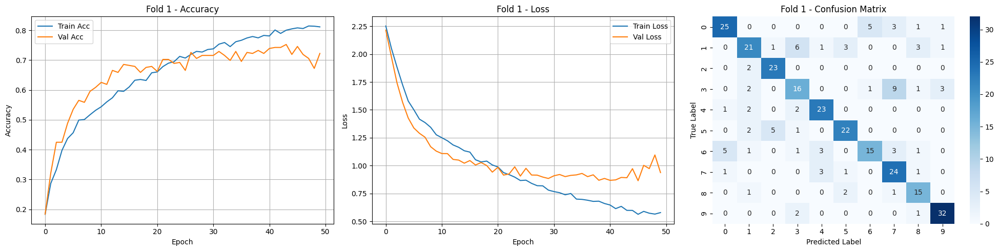

Fold 1 Final Accuracy: 0.7224
Fold 1 Precision: 0.7207
Fold 1 Recall: 0.7293
Fold 1 F1-Score: 0.7199
Akurasi Fold 1: (Train Acc: 0.8115, Val Acc: 0.7224, Gap: 0.0890)
📁 Model Fold 1 disimpan di: /content/drive/MyDrive/dataset/10seg_25drop_models/crnn_model_fold1.h5

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - accuracy: 0.1315 - loss: 2.2874 - val_accuracy: 0.2274 - val_loss: 2.2562
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - accuracy: 0.2815 - loss: 2.1510 - val_accuracy: 0.2876 - val_loss: 2.0467
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - accuracy: 0.3088 - loss: 1.9713 - val_accuracy: 0.3478 - val_loss: 1.8083
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - accuracy: 0.3652 - loss: 1.7990 - val_accuracy: 0.3913 - val_loss: 1.6491
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - accuracy: 0.4060 - loss: 1.6820 - val_accuracy: 0.4147 - val_loss: 1.5447
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - accuracy: 0.4376 - loss: 1.6133 - val_accuracy: 0.4548 - val_loss: 1.4311
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - accuracy: 0.4755 - loss: 1.4937 - val_accuracy: 0.4783 - val_loss: 1.3643
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - accuracy: 0.4844 - loss: 1.4621 - val_accuracy: 0.5251

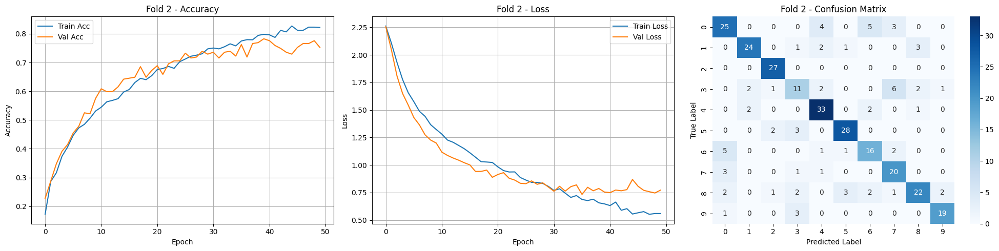

Fold 2 Final Accuracy: 0.7525
Fold 2 Precision: 0.7477
Fold 2 Recall: 0.7501
Fold 2 F1-Score: 0.7456
Akurasi Fold 2: (Train Acc: 0.8219, Val Acc: 0.7525, Gap: 0.0694)
📁 Model Fold 2 disimpan di: /content/drive/MyDrive/dataset/10seg_25drop_models/crnn_model_fold2.h5

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - accuracy: 0.1413 - loss: 2.2862 - val_accuracy: 0.3144 - val_loss: 2.2436
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.2987 - loss: 2.1161 - val_accuracy: 0.3779 - val_loss: 1.9209
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - accuracy: 0.3054 - loss: 1.9412 - val_accuracy: 0.4314 - val_loss: 1.6518
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - accuracy: 0.3962 - loss: 1.7143 - val_accuracy: 0.4950 - val_loss: 1.5005
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - accuracy: 0.4530 - loss: 1.5958 - val_accuracy: 0.5251 - val_loss: 1.3814
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 81ms/step - accuracy: 0.4715 - loss: 1.5212 - val_accuracy: 0.5284 - val_loss: 1.2840
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - accuracy: 0.4856 - loss: 1.4826 - val_accuracy: 0.5585 - val_loss: 1.2382
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - accuracy: 0.5201 - loss: 1.3999 - val_accuracy: 0.545

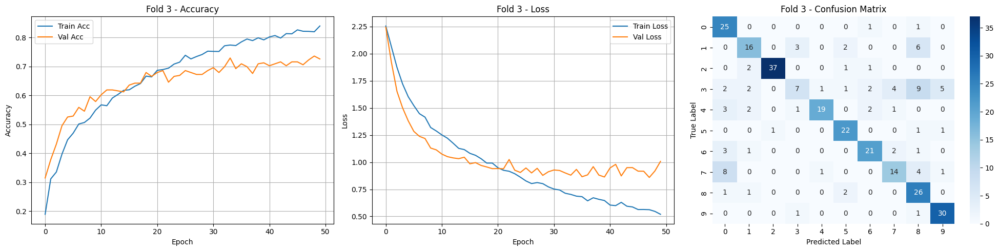

Fold 3 Final Accuracy: 0.7258
Fold 3 Precision: 0.7295
Fold 3 Recall: 0.7246
Fold 3 F1-Score: 0.7068
Akurasi Fold 3: (Train Acc: 0.8397, Val Acc: 0.7258, Gap: 0.1140)
📁 Model Fold 3 disimpan di: /content/drive/MyDrive/dataset/10seg_25drop_models/crnn_model_fold3.h5

===== Fold 4/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - accuracy: 0.1703 - loss: 2.2762 - val_accuracy: 0.3244 - val_loss: 2.1869
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - accuracy: 0.3227 - loss: 2.0908 - val_accuracy: 0.3244 - val_loss: 1.9402
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - accuracy: 0.3481 - loss: 1.8662 - val_accuracy: 0.4013 - val_loss: 1.7087
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step - accuracy: 0.4070 - loss: 1.7522 - val_accuracy: 0.4181 - val_loss: 1.6031
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - accuracy: 0.4433 - loss: 1.5876 - val_accuracy: 0.4515 - val_loss: 1.4909
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - accuracy: 0.4514 - loss: 1.4967 - val_accuracy: 0.5385 - val_loss: 1.3456
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step - accuracy: 0.4838 - loss: 1.4465 - val_accuracy: 0.5652 - val_loss: 1.2338
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - accuracy: 0.4987 - loss: 1.4052 - val_accuracy: 0.55

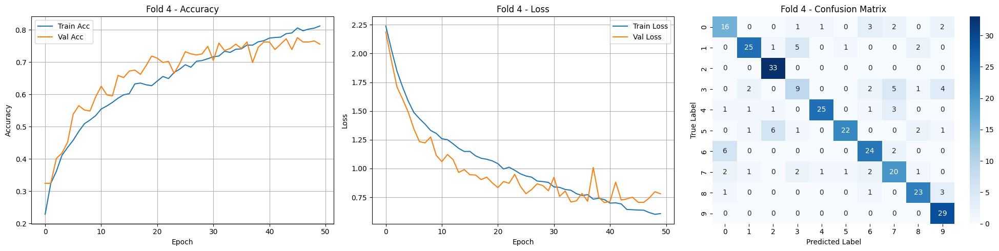

Fold 4 Final Accuracy: 0.7559
Fold 4 Precision: 0.7485
Fold 4 Recall: 0.7453
Fold 4 F1-Score: 0.7403
Akurasi Fold 4: (Train Acc: 0.8122, Val Acc: 0.7559, Gap: 0.0563)
📁 Model Fold 4 disimpan di: /content/drive/MyDrive/dataset/10seg_25drop_models/crnn_model_fold4.h5

===== Fold 5/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 20s 139ms/step - accuracy: 0.1186 - loss: 2.3031 - val_accuracy: 0.1204 - val_loss: 2.2807
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 109ms/step - accuracy: 0.2943 - loss: 2.1877 - val_accuracy: 0.3378 - val_loss: 2.0712
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - accuracy: 0.3343 - loss: 1.9778 - val_accuracy: 0.4013 - val_loss: 1.7664
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - accuracy: 0.4082 - loss: 1.7470 - val_accuracy: 0.4281 - val_loss: 1.5912
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - accuracy: 0.4461 - loss: 1.6104 - val_accuracy: 0.4816 - val_loss: 1.4454
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - accuracy: 0.4870 - loss: 1.5024 - val_accuracy: 0.5485 - val_loss: 1.3198
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - accuracy: 0.5073 - loss: 1.3873 - val_accuracy: 0.5485 - val_loss: 1.2347
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - accuracy: 0.5576 - loss: 1.3109 - val_accuracy: 0.

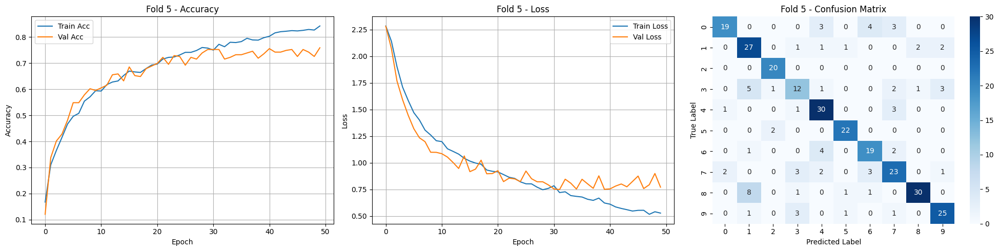

Fold 5 Final Accuracy: 0.7592
Fold 5 Precision: 0.7655
Fold 5 Recall: 0.7648
Fold 5 F1-Score: 0.7606
Akurasi Fold 5: (Train Acc: 0.8427, Val Acc: 0.7592, Gap: 0.0835)
📁 Model Fold 5 disimpan di: /content/drive/MyDrive/dataset/10seg_25drop_models/crnn_model_fold5.h5

===== Fold 6/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - accuracy: 0.1037 - loss: 2.2936 - val_accuracy: 0.1672 - val_loss: 2.2639
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - accuracy: 0.2560 - loss: 2.1955 - val_accuracy: 0.4080 - val_loss: 2.0629
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - accuracy: 0.3597 - loss: 1.9735 - val_accuracy: 0.4214 - val_loss: 1.7482
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - accuracy: 0.3924 - loss: 1.7693 - val_accuracy: 0.4983 - val_loss: 1.5755
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - accuracy: 0.4264 - loss: 1.6375 - val_accuracy: 0.4816 - val_loss: 1.4929
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - accuracy: 0.4425 - loss: 1.5458 - val_accuracy: 0.5084 - val_loss: 1.3759
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - accuracy: 0.4924 - loss: 1.4421 - val_accuracy: 0.5318 - val_loss: 1.3112
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - accuracy: 0.5058 - loss: 1.4077 - val_accuracy: 0.

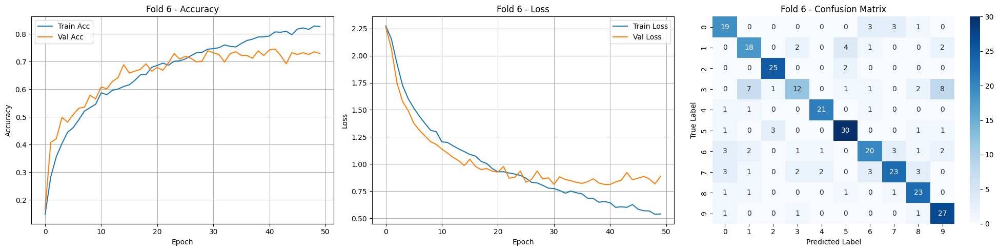

Fold 6 Final Accuracy: 0.7291
Fold 6 Precision: 0.7298
Fold 6 Recall: 0.7386
Fold 6 F1-Score: 0.7264
Akurasi Fold 6: (Train Acc: 0.8274, Val Acc: 0.7291, Gap: 0.0983)
📁 Model Fold 6 disimpan di: /content/drive/MyDrive/dataset/10seg_25drop_models/crnn_model_fold6.h5

===== Fold 7/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - accuracy: 0.1577 - loss: 2.2879 - val_accuracy: 0.2040 - val_loss: 2.2433
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - accuracy: 0.3107 - loss: 2.1436 - val_accuracy: 0.3712 - val_loss: 1.9634
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - accuracy: 0.3390 - loss: 1.8860 - val_accuracy: 0.4147 - val_loss: 1.7214
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - accuracy: 0.4009 - loss: 1.7124 - val_accuracy: 0.4615 - val_loss: 1.5738
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.4215 - loss: 1.5834 - val_accuracy: 0.5251 - val_loss: 1.4562
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - accuracy: 0.4744 - loss: 1.4809 - val_accuracy: 0.5050 - val_loss: 1.4125
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step - accuracy: 0.5019 - loss: 1.3955 - val_accuracy: 0.5552 - val_loss: 1.2972
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - accuracy: 0.5204 - loss: 1.3299 - val_accuracy: 0.55

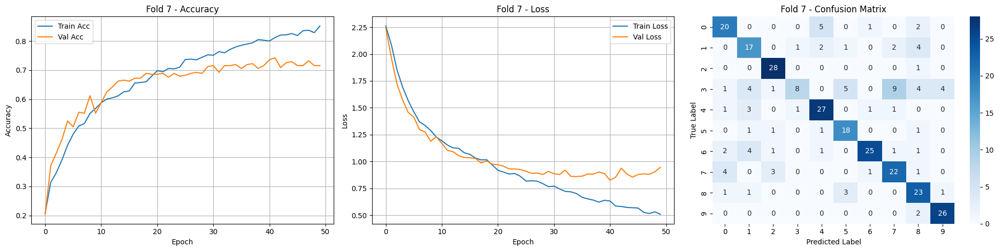

Fold 7 Final Accuracy: 0.7157
Fold 7 Precision: 0.7246
Fold 7 Recall: 0.7290
Fold 7 F1-Score: 0.7059
Akurasi Fold 7: (Train Acc: 0.8520, Val Acc: 0.7157, Gap: 0.1363)
📁 Model Fold 7 disimpan di: /content/drive/MyDrive/dataset/10seg_25drop_models/crnn_model_fold7.h5

===== Fold 8/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - accuracy: 0.1499 - loss: 2.2875 - val_accuracy: 0.2241 - val_loss: 2.2271
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - accuracy: 0.2891 - loss: 2.1171 - val_accuracy: 0.3278 - val_loss: 2.0349
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - accuracy: 0.3419 - loss: 1.9301 - val_accuracy: 0.3411 - val_loss: 1.8581
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - accuracy: 0.3728 - loss: 1.7921 - val_accuracy: 0.3980 - val_loss: 1.7177
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - accuracy: 0.4064 - loss: 1.6831 - val_accuracy: 0.4615 - val_loss: 1.5866
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - accuracy: 0.4548 - loss: 1.5555 - val_accuracy: 0.4716 - val_loss: 1.5436
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - accuracy: 0.4570 - loss: 1.4872 - val_accuracy: 0.5318 - val_loss: 1.4337
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - accuracy: 0.5102 - loss: 1.3969 - val_accurac

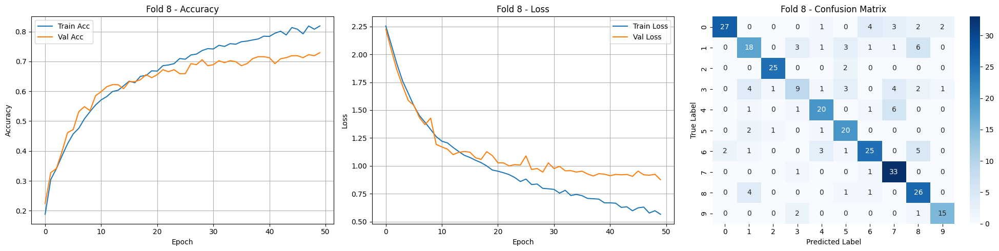

Fold 8 Final Accuracy: 0.7291
Fold 8 Precision: 0.7339
Fold 8 Recall: 0.7311
Fold 8 F1-Score: 0.7241
Akurasi Fold 8: (Train Acc: 0.8185, Val Acc: 0.7291, Gap: 0.0894)
📁 Model Fold 8 disimpan di: /content/drive/MyDrive/dataset/10seg_25drop_models/crnn_model_fold8.h5

===== Fold 9/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - accuracy: 0.1629 - loss: 2.2791 - val_accuracy: 0.1040 - val_loss: 2.2423
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - accuracy: 0.2892 - loss: 2.1157 - val_accuracy: 0.3188 - val_loss: 1.9544
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 108ms/step - accuracy: 0.3346 - loss: 1.9228 - val_accuracy: 0.3792 - val_loss: 1.7698
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - accuracy: 0.4005 - loss: 1.7617 - val_accuracy: 0.4362 - val_loss: 1.6166
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 12s 108ms/step - accuracy: 0.4028 - loss: 1.7117 - val_accuracy: 0.4530 - val_loss: 1.5462
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - accuracy: 0.4310 - loss: 1.5774 - val_accuracy: 0.5000 - val_loss: 1.4771
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - accuracy: 0.4704 - loss: 1.5297 - val_accuracy: 0.5369 - val_loss: 1.3442
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - accuracy: 0.4921 - loss: 1.4407 - val_accuracy: 

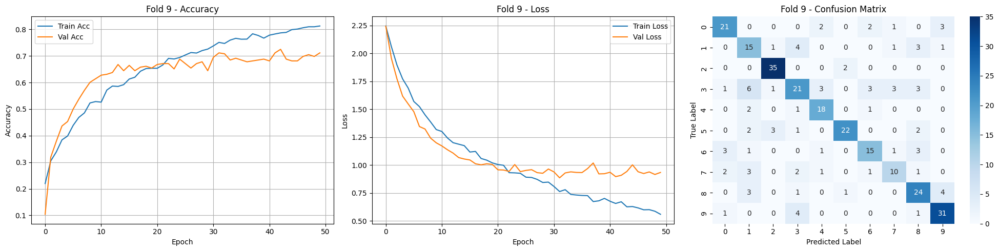

Fold 9 Final Accuracy: 0.7114
Fold 9 Precision: 0.7062
Fold 9 Recall: 0.7024
Fold 9 F1-Score: 0.7007
Akurasi Fold 9: (Train Acc: 0.8126, Val Acc: 0.7114, Gap: 0.1012)
📁 Model Fold 9 disimpan di: /content/drive/MyDrive/dataset/10seg_25drop_models/crnn_model_fold9.h5

===== Fold 10/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 23s 104ms/step - accuracy: 0.1457 - loss: 2.2865 - val_accuracy: 0.2483 - val_loss: 2.2450
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - accuracy: 0.2872 - loss: 2.1425 - val_accuracy: 0.3523 - val_loss: 1.9831
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - accuracy: 0.3053 - loss: 1.9467 - val_accuracy: 0.3926 - val_loss: 1.7190
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - accuracy: 0.3505 - loss: 1.8000 - val_accuracy: 0.4564 - val_loss: 1.5779
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - accuracy: 0.4233 - loss: 1.6596 - val_accuracy: 0.5101 - val_loss: 1.4081
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 121ms/step - accuracy: 0.4416 - loss: 1.6084 - val_accuracy: 0.5436 - val_loss: 1.2964
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - accuracy: 0.4753 - loss: 1.4953 - val_accuracy: 0.6007 - val_loss: 1.2233
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - accuracy: 0.4969 - loss: 1.4230 - val_accuracy

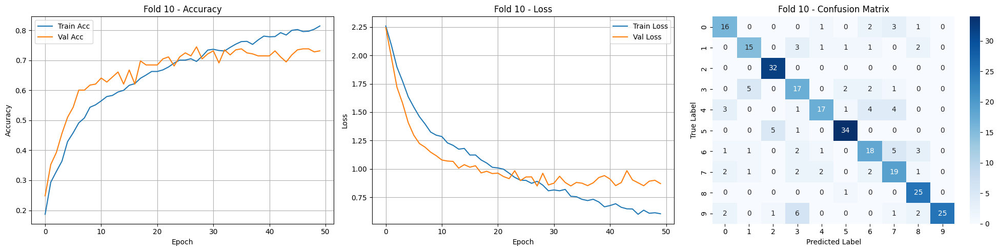

Fold 10 Final Accuracy: 0.7315
Fold 10 Precision: 0.7298
Fold 10 Recall: 0.7267
Fold 10 F1-Score: 0.7205
Akurasi Fold 10: (Train Acc: 0.8145, Val Acc: 0.7315, Gap: 0.0830)
📁 Model Fold 10 disimpan di: /content/drive/MyDrive/dataset/10seg_25drop_models/crnn_model_fold10.h5

🎉 Training selesai!


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []
confusion_matrices = []

# Path folder simpan seluruh model per fold
save_all_models_dir = "/content/drive/MyDrive/dataset/10seg_25drop_models"
os.makedirs(save_all_models_dir, exist_ok=True)

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)
    epochs = 50
    batch_size = 32

    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Akurasi terakhir
    train_acc_final = train_acc[-1]
    val_acc_final = val_acc[-1]
    acc_gap = abs(train_acc_final - val_acc_final)

    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    confusion_matrices.append(cm)

    # Plot Accuracy, Loss, Confusion Matrix side-by-side
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    axs[0].plot(train_acc, label='Train Acc')
    axs[0].plot(val_acc, label='Val Acc')
    axs[0].set_title(f'Fold {fold+1} - Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Accuracy')
    axs[0].legend()
    axs[0].grid(True)

    axs[1].plot(train_loss, label='Train Loss')
    axs[1].plot(val_loss, label='Val Loss')
    axs[1].set_title(f'Fold {fold+1} - Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].legend()
    axs[1].grid(True)

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axs[2])
    axs[2].set_title(f'Fold {fold+1} - Confusion Matrix')
    axs[2].set_xlabel('Predicted Label')
    axs[2].set_ylabel('True Label')

    plt.tight_layout()
    plt.show()

    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")
    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Tambahan: tampilkan ringkasan performa setiap fold
    print(f"Akurasi Fold {fold+1}: (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f}, Gap: {acc_gap:.4f})")

    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Simpan model untuk setiap fold
    fold_model_path = os.path.join(save_all_models_dir, f"crnn_model_fold{fold+1}.h5")
    model.save(fold_model_path)
    print(f"📁 Model Fold {fold+1} disimpan di: {fold_model_path}")

print("\n🎉 Training selesai!")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8253
Rata-rata Akurasi Validasi Terakhir: 0.7333
Gap Akurasi: 0.0920
✅ Model memiliki generalisasi yang **baik**.

===== Statistik Hasil K-Fold =====
Mean Val Accuracy: 0.7333
Std Dev Val Accuracy: 0.0160
Mean F1-Score: 0.7251
Std Dev F1-Score: 0.0180


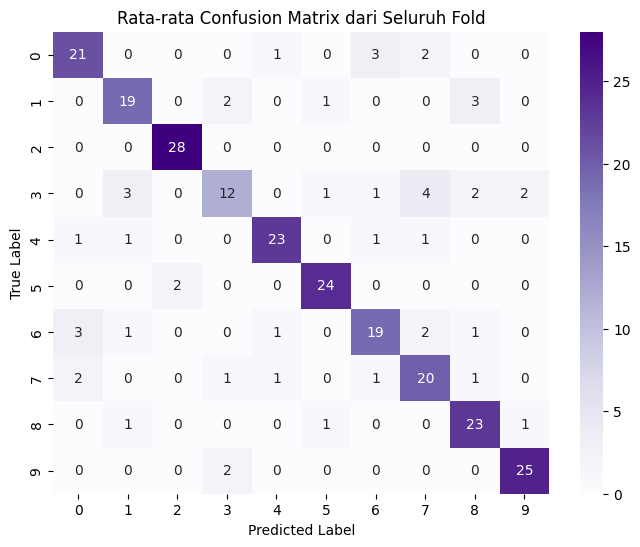

In [ ]:
# ====== Evaluasi Akhir ======
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")

# ====== Statistik Tambahan ======
print("\n===== Statistik Hasil K-Fold =====")
print(f"Mean Val Accuracy: {np.mean(fold_accuracies):.4f}")
print(f"Std Dev Val Accuracy: {np.std(fold_accuracies):.4f}")
print(f"Mean F1-Score: {np.mean(fold_f1_scores):.4f}")
print(f"Std Dev F1-Score: {np.std(fold_f1_scores):.4f}")

# ====== Rata-rata Confusion Matrix ======
mean_cm = np.mean(confusion_matrices, axis=0).astype(int)

plt.figure(figsize=(8, 6))
sns.heatmap(mean_cm, annot=True, fmt='d', cmap='Purples')
plt.title('Rata-rata Confusion Matrix dari Seluruh Fold')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

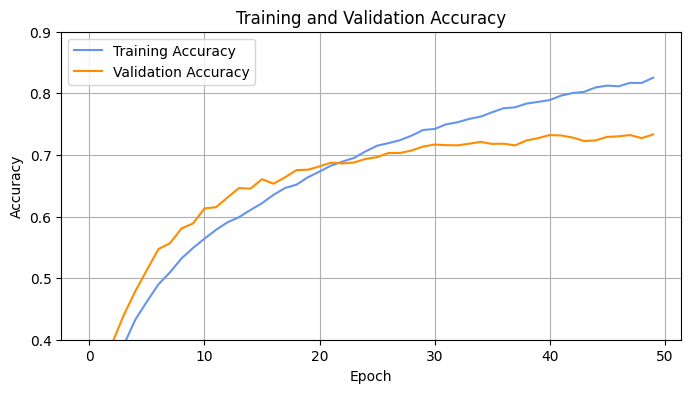

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

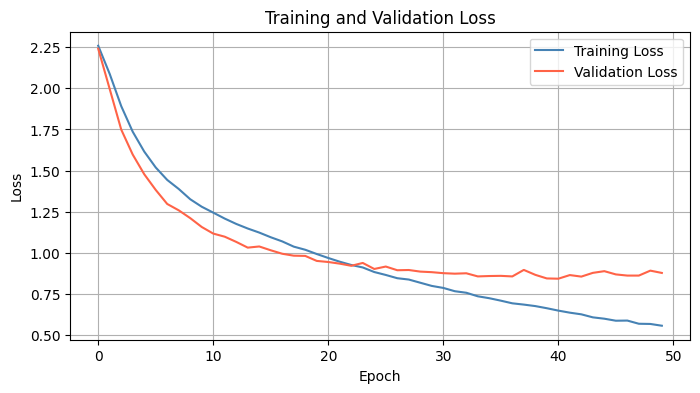

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

#### CRNN 30% Dropout and 10s Segmentation

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Reshape, LSTM, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def build_crnn_model(input_shape, num_classes):
    model = Sequential()
    weight_decay = 1e-4  # Nilai regulasi L2

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay), input_shape=input_shape))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 2
    model.add(Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Convolutional Layer 3
    model.add(Conv2D(32, (2, 2), strides=(2,2), activation='relu', padding='same',
                     kernel_regularizer=l2(weight_decay)))
    model.add(MaxPooling2D((2, 2), strides=(2,2), padding='same'))
    model.add(BatchNormalization())

    # Reshape layer: CNN output → LSTM input
    model.add(Reshape((model.output_shape[1], -1)))  # (time_steps, features)

    # LSTM Layers (128 units)
    model.add(LSTM(128, return_sequences=True))  # Mengirimkan output per timestep ke LSTM berikutnya
    model.add(Dropout(0.3))
    model.add(LSTM(128))  # Tanpa return_sequences, output terakhir langsung masuk ke Flatten layer
    model.add(Dropout(0.3))

    # Flatten Layer: Mengubah output LSTM menjadi 1D sebelum masuk ke Dense
    model.add(Flatten())

    # Dense Layers
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(num_classes, activation='softmax'))  # Dense untuk klasifikasi 10 genre

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])

    return model

print("Fungsi model siap digunakan!")

Fungsi model siap digunakan!


##### Model Summary

In [ ]:
input_shape = X.shape[1:]  # Ambil shape: (time_steps, n_mfcc, 3)
print("Input shape untuk model:", input_shape)

num_classes = y_categorical.shape[1]

model = build_crnn_model(input_shape, num_classes)

# Tampilkan summary model
model.summary()

Input shape untuk model: (431, 13, 3)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 216, 7, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 108, 4, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 108, 4, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 54, 2, 32)      │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 27, 1, 32)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 27, 1, 32)      │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 14, 1, 32)      │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 7, 1, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 7, 1, 32)       │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 7, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 7, 128)         │        82,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 7, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 128)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 241,738 (944.29 KB)

 Trainable params: 241,546 (943.54 KB)

 Non-trainable params: 192 (768.00 B)

##### K-Fold Cross Validation, 10 Fold


===== Fold 1/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - accuracy: 0.1435 - loss: 2.2952 - val_accuracy: 0.2609 - val_loss: 2.2621
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 12s 137ms/step - accuracy: 0.2743 - loss: 2.1984 - val_accuracy: 0.3344 - val_loss: 2.0891
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 21s 138ms/step - accuracy: 0.3127 - loss: 2.0248 - val_accuracy: 0.3478 - val_loss: 1.8537
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 12s 143ms/step - accuracy: 0.3302 - loss: 1.8801 - val_accuracy: 0.3779 - val_loss: 1.7443
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - accuracy: 0.3861 - loss: 1.7680 - val_accuracy: 0.4348 - val_loss: 1.5749
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step - accuracy: 0.3989 - loss: 1.6725 - val_accuracy: 0.5151 - val_loss: 1.4786
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.4306 - loss: 1.5972 - val_accuracy: 0.4849 - val_loss: 1.4234
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - accuracy: 0.4626 - loss: 1.5408 - val_accuracy:

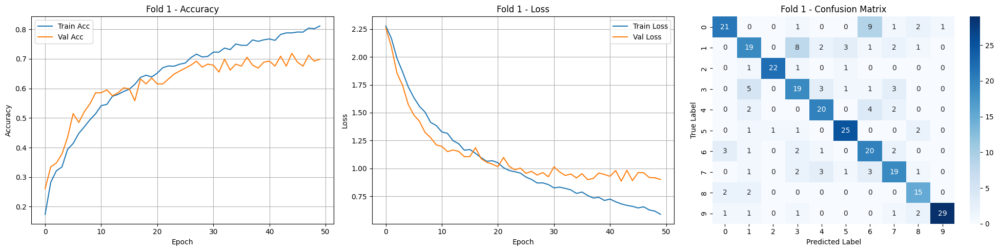

Fold 1 Final Accuracy: 0.6990
Fold 1 Precision: 0.7128
Fold 1 Recall: 0.7090
Fold 1 F1-Score: 0.7070
Akurasi Fold 1: (Train Acc: 0.8115, Val Acc: 0.6990, Gap: 0.1125)
📁 Model Fold 1 disimpan di: /content/drive/MyDrive/dataset/10seg_30drop_models/crnn_model_fold1.h5

===== Fold 2/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - accuracy: 0.1352 - loss: 2.2921 - val_accuracy: 0.2542 - val_loss: 2.2022
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - accuracy: 0.2823 - loss: 2.1308 - val_accuracy: 0.2977 - val_loss: 1.8910
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - accuracy: 0.3058 - loss: 1.9240 - val_accuracy: 0.3378 - val_loss: 1.7613
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - accuracy: 0.3383 - loss: 1.8188 - val_accuracy: 0.3579 - val_loss: 1.6690
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 6s 76ms/step - accuracy: 0.3741 - loss: 1.7263 - val_accuracy: 0.4147 - val_loss: 1.5786
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - accuracy: 0.4271 - loss: 1.6179 - val_accuracy: 0.4783 - val_loss: 1.4969
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - accuracy: 0.4595 - loss: 1.5615 - val_accuracy: 0.5351 - val_loss: 1.4241
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.4736 - loss: 1.4976 - val_accuracy: 0.5719 

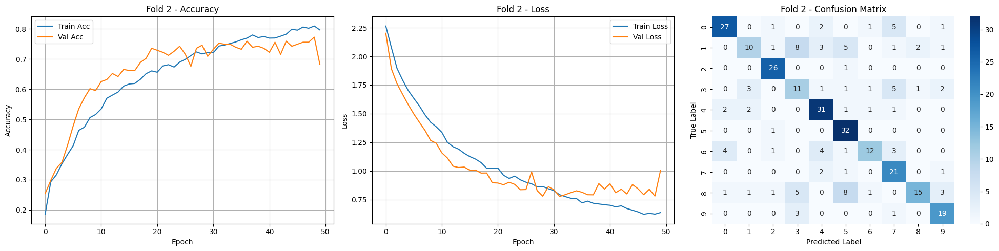

Fold 2 Final Accuracy: 0.6823
Fold 2 Precision: 0.6881
Fold 2 Recall: 0.6815
Fold 2 F1-Score: 0.6631
Akurasi Fold 2: (Train Acc: 0.7966, Val Acc: 0.6823, Gap: 0.1143)
📁 Model Fold 2 disimpan di: /content/drive/MyDrive/dataset/10seg_30drop_models/crnn_model_fold2.h5

===== Fold 3/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - accuracy: 0.1549 - loss: 2.2906 - val_accuracy: 0.2040 - val_loss: 2.2656
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 77ms/step - accuracy: 0.2620 - loss: 2.1728 - val_accuracy: 0.3645 - val_loss: 2.0418
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - accuracy: 0.3066 - loss: 2.0032 - val_accuracy: 0.4080 - val_loss: 1.8066
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - accuracy: 0.3348 - loss: 1.8701 - val_accuracy: 0.4114 - val_loss: 1.6394
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - accuracy: 0.4066 - loss: 1.7562 - val_accuracy: 0.4749 - val_loss: 1.5419
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - accuracy: 0.4179 - loss: 1.6670 - val_accuracy: 0.4749 - val_loss: 1.4467
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.4491 - loss: 1.6045 - val_accuracy: 0.5117 - val_loss: 1.3497
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - accuracy: 0.4672 - loss: 1.5190 - val_accuracy: 0.5385 

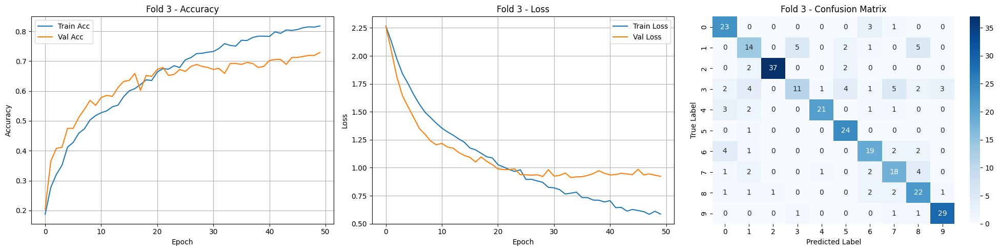

Fold 3 Final Accuracy: 0.7291
Fold 3 Precision: 0.7224
Fold 3 Recall: 0.7277
Fold 3 F1-Score: 0.7161
Akurasi Fold 3: (Train Acc: 0.8178, Val Acc: 0.7291, Gap: 0.0887)
📁 Model Fold 3 disimpan di: /content/drive/MyDrive/dataset/10seg_30drop_models/crnn_model_fold3.h5

===== Fold 4/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 18s 112ms/step - accuracy: 0.1355 - loss: 2.2940 - val_accuracy: 0.1706 - val_loss: 2.2522
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - accuracy: 0.2526 - loss: 2.1621 - val_accuracy: 0.2742 - val_loss: 1.9892
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - accuracy: 0.2863 - loss: 1.9638 - val_accuracy: 0.3980 - val_loss: 1.7530
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - accuracy: 0.3462 - loss: 1.8199 - val_accuracy: 0.4749 - val_loss: 1.5818
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.3953 - loss: 1.6692 - val_accuracy: 0.5084 - val_loss: 1.4509
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - accuracy: 0.4223 - loss: 1.5910 - val_accuracy: 0.5351 - val_loss: 1.3454
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - accuracy: 0.4674 - loss: 1.5052 - val_accuracy: 0.5686 - val_loss: 1.2833
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - accuracy: 0.4751 - loss: 1.4624 - val_accuracy: 0.58

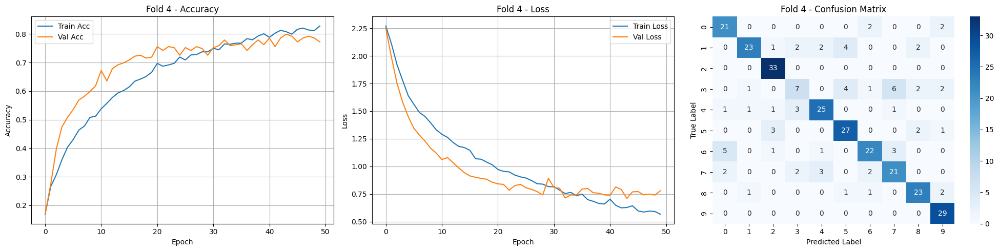

Fold 4 Final Accuracy: 0.7726
Fold 4 Precision: 0.7573
Fold 4 Recall: 0.7629
Fold 4 F1-Score: 0.7537
Akurasi Fold 4: (Train Acc: 0.8282, Val Acc: 0.7726, Gap: 0.0556)
📁 Model Fold 4 disimpan di: /content/drive/MyDrive/dataset/10seg_30drop_models/crnn_model_fold4.h5

===== Fold 5/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - accuracy: 0.1055 - loss: 2.3034 - val_accuracy: 0.0870 - val_loss: 2.2917
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - accuracy: 0.2176 - loss: 2.1968 - val_accuracy: 0.2876 - val_loss: 2.0715
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - accuracy: 0.3155 - loss: 2.0020 - val_accuracy: 0.3612 - val_loss: 1.7996
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - accuracy: 0.3639 - loss: 1.8360 - val_accuracy: 0.3880 - val_loss: 1.6328
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - accuracy: 0.3925 - loss: 1.6946 - val_accuracy: 0.4482 - val_loss: 1.5406
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - accuracy: 0.4192 - loss: 1.6086 - val_accuracy: 0.4950 - val_loss: 1.4223
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - accuracy: 0.4465 - loss: 1.5591 - val_accuracy: 0.5385 - val_loss: 1.3306
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - accuracy: 0.4623 - loss: 1.4879 - val_accuracy: 0.5

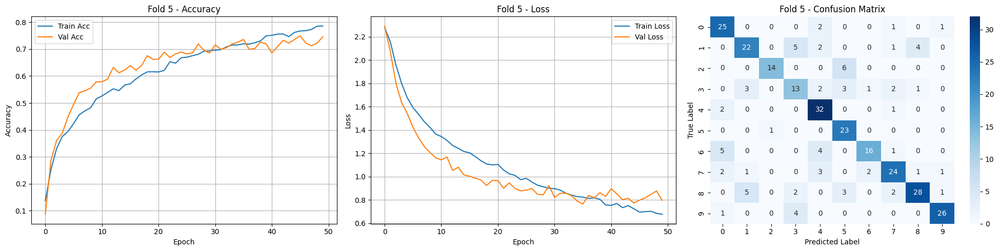

Fold 5 Final Accuracy: 0.7458
Fold 5 Precision: 0.7579
Fold 5 Recall: 0.7445
Fold 5 F1-Score: 0.7420
Akurasi Fold 5: (Train Acc: 0.7858, Val Acc: 0.7458, Gap: 0.0400)
📁 Model Fold 5 disimpan di: /content/drive/MyDrive/dataset/10seg_30drop_models/crnn_model_fold5.h5

===== Fold 6/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - accuracy: 0.1263 - loss: 2.3012 - val_accuracy: 0.2040 - val_loss: 2.2703
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - accuracy: 0.2750 - loss: 2.1819 - val_accuracy: 0.2977 - val_loss: 2.0750
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - accuracy: 0.2886 - loss: 2.0074 - val_accuracy: 0.3244 - val_loss: 1.8742
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - accuracy: 0.3196 - loss: 1.8757 - val_accuracy: 0.3478 - val_loss: 1.7329
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - accuracy: 0.3797 - loss: 1.7486 - val_accuracy: 0.3980 - val_loss: 1.6058
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step - accuracy: 0.4487 - loss: 1.6126 - val_accuracy: 0.4916 - val_loss: 1.4596
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - accuracy: 0.4773 - loss: 1.4957 - val_accuracy: 0.5452 - val_loss: 1.3555
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - accuracy: 0.4943 - loss: 1.4300 - val_accuracy: 0.5

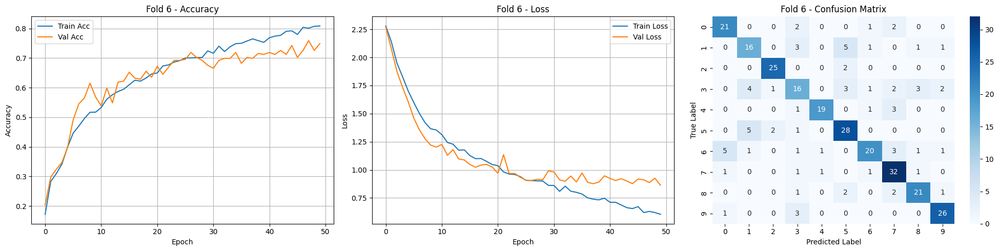

Fold 6 Final Accuracy: 0.7492
Fold 6 Precision: 0.7558
Fold 6 Recall: 0.7511
Fold 6 F1-Score: 0.7507
Akurasi Fold 6: (Train Acc: 0.8085, Val Acc: 0.7492, Gap: 0.0593)
📁 Model Fold 6 disimpan di: /content/drive/MyDrive/dataset/10seg_30drop_models/crnn_model_fold6.h5

===== Fold 7/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - accuracy: 0.1510 - loss: 2.2882 - val_accuracy: 0.3679 - val_loss: 2.2642
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - accuracy: 0.2768 - loss: 2.2014 - val_accuracy: 0.3512 - val_loss: 2.0536
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 87ms/step - accuracy: 0.3368 - loss: 1.9838 - val_accuracy: 0.3846 - val_loss: 1.8303
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - accuracy: 0.3780 - loss: 1.8325 - val_accuracy: 0.4281 - val_loss: 1.6833
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 12s 108ms/step - accuracy: 0.4459 - loss: 1.6795 - val_accuracy: 0.4482 - val_loss: 1.5871
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.4624 - loss: 1.5990 - val_accuracy: 0.4783 - val_loss: 1.4936
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - accuracy: 0.4571 - loss: 1.5712 - val_accuracy: 0.4682 - val_loss: 1.4661
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - accuracy: 0.5140 - loss: 1.4348 - val_accuracy: 

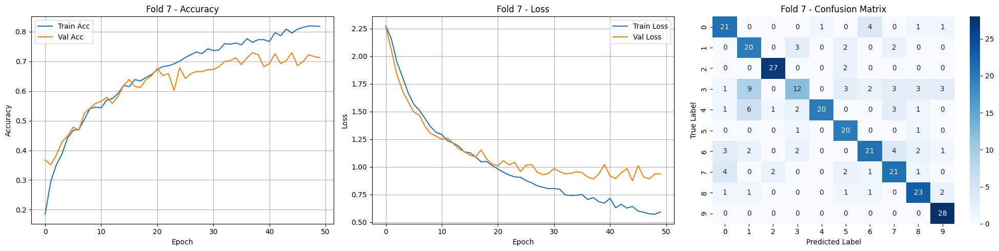

Fold 7 Final Accuracy: 0.7124
Fold 7 Precision: 0.7202
Fold 7 Recall: 0.7323
Fold 7 F1-Score: 0.7123
Akurasi Fold 7: (Train Acc: 0.8178, Val Acc: 0.7124, Gap: 0.1054)
📁 Model Fold 7 disimpan di: /content/drive/MyDrive/dataset/10seg_30drop_models/crnn_model_fold7.h5

===== Fold 8/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 19s 140ms/step - accuracy: 0.1593 - loss: 2.2865 - val_accuracy: 0.1405 - val_loss: 2.2369
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step - accuracy: 0.2498 - loss: 2.1273 - val_accuracy: 0.3445 - val_loss: 2.0819
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - accuracy: 0.2918 - loss: 2.0097 - val_accuracy: 0.3712 - val_loss: 1.9485
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - accuracy: 0.3305 - loss: 1.8848 - val_accuracy: 0.4247 - val_loss: 1.7760
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - accuracy: 0.3610 - loss: 1.7992 - val_accuracy: 0.4548 - val_loss: 1.6347
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - accuracy: 0.3954 - loss: 1.7040 - val_accuracy: 0.5117 - val_loss: 1.5354
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step - accuracy: 0.4621 - loss: 1.5488 - val_accuracy: 0.5151 - val_loss: 1.4623
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - accuracy: 0.4690 - loss: 1.5142 - val_accuracy:

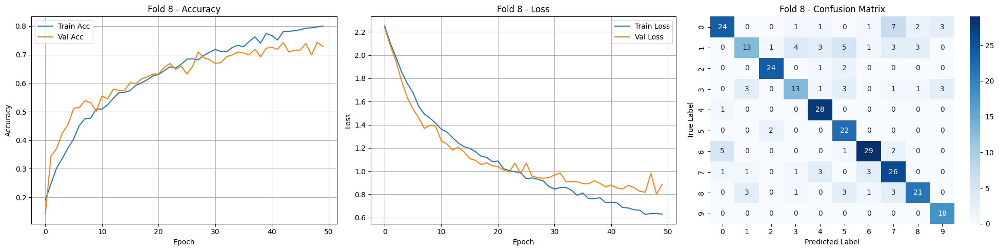

Fold 8 Final Accuracy: 0.7291
Fold 8 Precision: 0.7306
Fold 8 Recall: 0.7483
Fold 8 F1-Score: 0.7275
Akurasi Fold 8: (Train Acc: 0.8003, Val Acc: 0.7291, Gap: 0.0712)
📁 Model Fold 8 disimpan di: /content/drive/MyDrive/dataset/10seg_30drop_models/crnn_model_fold8.h5

===== Fold 9/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step - accuracy: 0.1264 - loss: 2.2921 - val_accuracy: 0.2114 - val_loss: 2.2048
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - accuracy: 0.2603 - loss: 2.1358 - val_accuracy: 0.3792 - val_loss: 1.9261
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step - accuracy: 0.3362 - loss: 1.9278 - val_accuracy: 0.4128 - val_loss: 1.7245
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - accuracy: 0.3518 - loss: 1.8371 - val_accuracy: 0.4698 - val_loss: 1.5696
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - accuracy: 0.4058 - loss: 1.7038 - val_accuracy: 0.5034 - val_loss: 1.4792
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step - accuracy: 0.4167 - loss: 1.6317 - val_accuracy: 0.5403 - val_loss: 1.4068
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - accuracy: 0.4524 - loss: 1.5725 - val_accuracy: 0.5470 - val_loss: 1.3720
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - accuracy: 0.4749 - loss: 1.4956 - val_accuracy: 0

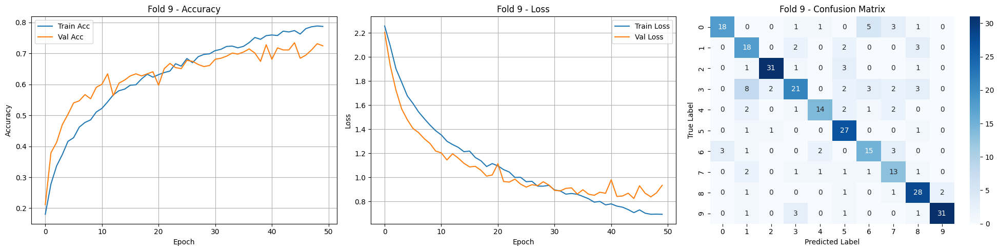

Fold 9 Final Accuracy: 0.7248
Fold 9 Precision: 0.7252
Fold 9 Recall: 0.7188
Fold 9 F1-Score: 0.7134
Akurasi Fold 9: (Train Acc: 0.7874, Val Acc: 0.7248, Gap: 0.0625)
📁 Model Fold 9 disimpan di: /content/drive/MyDrive/dataset/10seg_30drop_models/crnn_model_fold9.h5

===== Fold 10/10 =====


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 19s 118ms/step - accuracy: 0.1272 - loss: 2.2815 - val_accuracy: 0.1208 - val_loss: 2.2104
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - accuracy: 0.1988 - loss: 2.1367 - val_accuracy: 0.2718 - val_loss: 2.0586
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step - accuracy: 0.2708 - loss: 2.0298 - val_accuracy: 0.3893 - val_loss: 1.8785
Epoch 4/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 106ms/step - accuracy: 0.2943 - loss: 1.9300 - val_accuracy: 0.4329 - val_loss: 1.7320
Epoch 5/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - accuracy: 0.3600 - loss: 1.8050 - val_accuracy: 0.4463 - val_loss: 1.5803
Epoch 6/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - accuracy: 0.3693 - loss: 1.7288 - val_accuracy: 0.4799 - val_loss: 1.4651
Epoch 7/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - accuracy: 0.4171 - loss: 1.6195 - val_accuracy: 0.5537 - val_loss: 1.3634
Epoch 8/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - accuracy: 0.4359 - loss: 1.5363 - val_accuracy: 0.

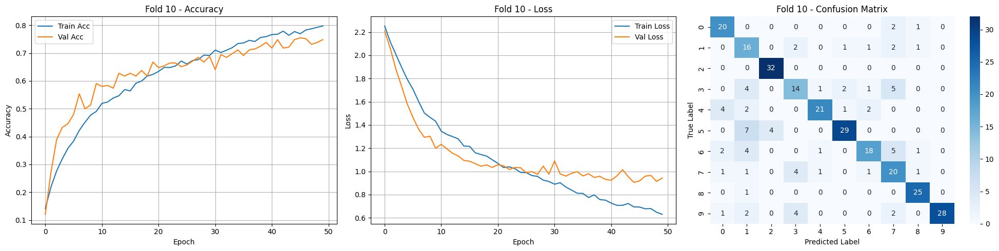

Fold 10 Final Accuracy: 0.7483
Fold 10 Precision: 0.7573
Fold 10 Recall: 0.7497
Fold 10 F1-Score: 0.7433
Akurasi Fold 10: (Train Acc: 0.7974, Val Acc: 0.7483, Gap: 0.0491)
📁 Model Fold 10 disimpan di: /content/drive/MyDrive/dataset/10seg_30drop_models/crnn_model_fold10.h5

🎉 Training selesai!


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model

kf = KFold(n_splits=10, shuffle=True, random_state=42)

fold_accuracies = []
fold_precisions = []
fold_recalls = []
fold_f1_scores = []
fold_train_accs = []
fold_val_accs = []
fold_train_losses = []
fold_val_losses = []
confusion_matrices = []

# Path folder simpan seluruh model per fold
save_all_models_dir = "/content/drive/MyDrive/dataset/10seg_30drop_models"
os.makedirs(save_all_models_dir, exist_ok=True)

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    print(f"\n===== Fold {fold+1}/10 =====")

    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_categorical[train_idx], y_categorical[val_idx]

    model = build_crnn_model(input_shape=(X_train.shape[1:]), num_classes=num_classes)
    epochs = 50
    batch_size = 32

    history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                        epochs=epochs, batch_size=batch_size, verbose=1)

    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    fold_train_losses.append(train_loss)
    fold_val_losses.append(val_loss)
    fold_train_accs.append(train_acc)
    fold_val_accs.append(val_acc)

    # Akurasi terakhir
    train_acc_final = train_acc[-1]
    val_acc_final = val_acc[-1]
    acc_gap = abs(train_acc_final - val_acc_final)

    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(y_val, axis=1)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    confusion_matrices.append(cm)

    # Plot Accuracy, Loss, Confusion Matrix side-by-side
    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    axs[0].plot(train_acc, label='Train Acc')
    axs[0].plot(val_acc, label='Val Acc')
    axs[0].set_title(f'Fold {fold+1} - Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Accuracy')
    axs[0].legend()
    axs[0].grid(True)

    axs[1].plot(train_loss, label='Train Loss')
    axs[1].plot(val_loss, label='Val Loss')
    axs[1].set_title(f'Fold {fold+1} - Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].legend()
    axs[1].grid(True)

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axs[2])
    axs[2].set_title(f'Fold {fold+1} - Confusion Matrix')
    axs[2].set_xlabel('Predicted Label')
    axs[2].set_ylabel('True Label')

    plt.tight_layout()
    plt.show()

    report = classification_report(y_true_classes, y_pred_classes, output_dict=True, zero_division=0)
    precision = np.mean([report[str(i)]['precision'] for i in range(num_classes)])
    recall = np.mean([report[str(i)]['recall'] for i in range(num_classes)])
    f1_score = np.mean([report[str(i)]['f1-score'] for i in range(num_classes)])

    print(f"Fold {fold+1} Final Accuracy: {val_acc_final:.4f}")
    print(f"Fold {fold+1} Precision: {precision:.4f}")
    print(f"Fold {fold+1} Recall: {recall:.4f}")
    print(f"Fold {fold+1} F1-Score: {f1_score:.4f}")

    # Tambahan: tampilkan ringkasan performa setiap fold
    print(f"Akurasi Fold {fold+1}: (Train Acc: {train_acc_final:.4f}, Val Acc: {val_acc_final:.4f}, Gap: {acc_gap:.4f})")

    fold_accuracies.append(val_acc_final)
    fold_precisions.append(precision)
    fold_recalls.append(recall)
    fold_f1_scores.append(f1_score)

    # Simpan model untuk setiap fold
    fold_model_path = os.path.join(save_all_models_dir, f"crnn_model_fold{fold+1}.h5")
    model.save(fold_model_path)
    print(f"📁 Model Fold {fold+1} disimpan di: {fold_model_path}")

print("\n🎉 Training selesai!")


===== Evaluasi Generalisasi Model =====
Rata-rata Akurasi Training Terakhir: 0.8051
Rata-rata Akurasi Validasi Terakhir: 0.7293
Gap Akurasi: 0.0759
✅ Model memiliki generalisasi yang **baik**.

===== Statistik Hasil K-Fold =====
Mean Val Accuracy: 0.7293
Std Dev Val Accuracy: 0.0252
Mean F1-Score: 0.7229
Std Dev F1-Score: 0.0257


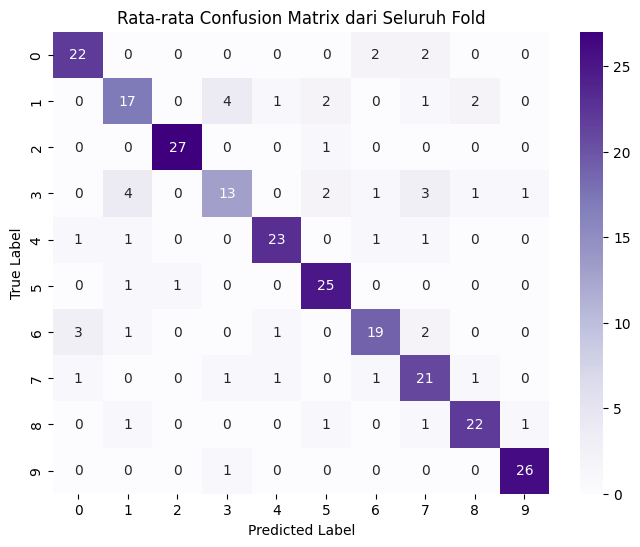

In [ ]:
# ====== Evaluasi Akhir ======
mean_train_final_acc = np.mean([train_acc[-1] for train_acc in fold_train_accs])
mean_val_final_acc = np.mean([val_acc[-1] for val_acc in fold_val_accs])
gap = mean_train_final_acc - mean_val_final_acc

print("\n===== Evaluasi Generalisasi Model =====")
print(f"Rata-rata Akurasi Training Terakhir: {mean_train_final_acc:.4f}")
print(f"Rata-rata Akurasi Validasi Terakhir: {mean_val_final_acc:.4f}")
print(f"Gap Akurasi: {gap:.4f}")

if gap > 0.15:
    print("⚠️ Model cenderung mengalami **OVERFITTING**.")
elif mean_train_final_acc < 0.7 and mean_val_final_acc < 0.7:
    print("⚠️ Model cenderung mengalami **UNDERFITTING**.")
else:
    print("✅ Model memiliki generalisasi yang **baik**.")

# ====== Statistik Tambahan ======
print("\n===== Statistik Hasil K-Fold =====")
print(f"Mean Val Accuracy: {np.mean(fold_accuracies):.4f}")
print(f"Std Dev Val Accuracy: {np.std(fold_accuracies):.4f}")
print(f"Mean F1-Score: {np.mean(fold_f1_scores):.4f}")
print(f"Std Dev F1-Score: {np.std(fold_f1_scores):.4f}")

# ====== Rata-rata Confusion Matrix ======
mean_cm = np.mean(confusion_matrices, axis=0).astype(int)

plt.figure(figsize=(8, 6))
sns.heatmap(mean_cm, annot=True, fmt='d', cmap='Purples')
plt.title('Rata-rata Confusion Matrix dari Seluruh Fold')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

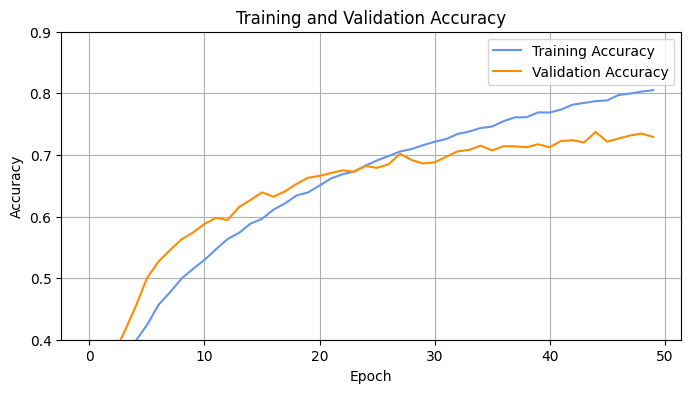

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Hitung rata-rata accuracy per epoch
avg_train_acc = np.mean(fold_train_accs, axis=0)
avg_val_acc = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_acc, label='Training Accuracy', color='cornflowerblue')
plt.plot(avg_val_acc, label='Validation Accuracy', color='darkorange')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.ylim(0.4, 0.9)
plt.show()

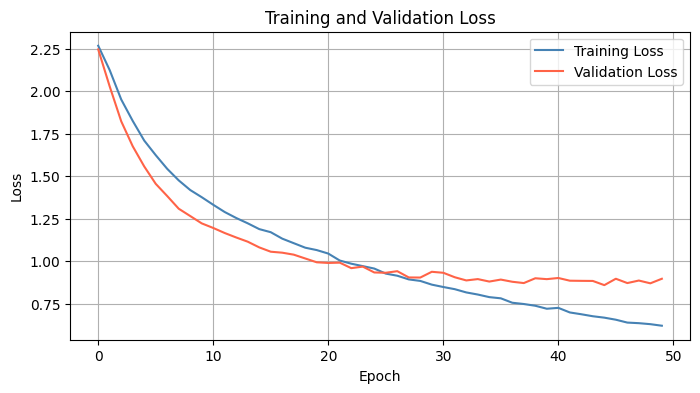

In [ ]:
avg_train_loss = np.mean(fold_train_losses, axis=0)
avg_val_loss = np.mean(fold_val_losses, axis=0)

plt.figure(figsize=(8, 4))
plt.plot(avg_train_loss, label='Training Loss', color='steelblue')
plt.plot(avg_val_loss, label='Validation Loss', color='tomato')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

## Testing Best Model

### Data dari pelatihan

✅ Model berhasil dimuat.
🔍 Memulai proses ekstraksi fitur dari folder testing...
✅ Total segment yang diproses: 299
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step

=== 📊 Evaluation Metrics ===
Accuracy : 0.9431
Precision: 0.9453
Recall   : 0.9433
F1-Score : 0.9420

=== 📝 Classification Report ===
              precision    recall  f1-score   support

      hiphop       0.91      0.97      0.94        30
     country       0.88      1.00      0.94        29
   classical       1.00      1.00      1.00        30
        rock       0.92      0.80      0.86        30
         pop       1.00      0.80      0.89        30
        jazz       0.97      0.93      0.95        30
      reggae       1.00      1.00      1.00        30
       disco       0.91      0.97      0.94        30
       blues       0.94      1.00      0.97        30
       metal       0.94      0.97      0.95        30

    accuracy                           0.94       299
   macro avg       0.95      0.94      0.94       299
weigh

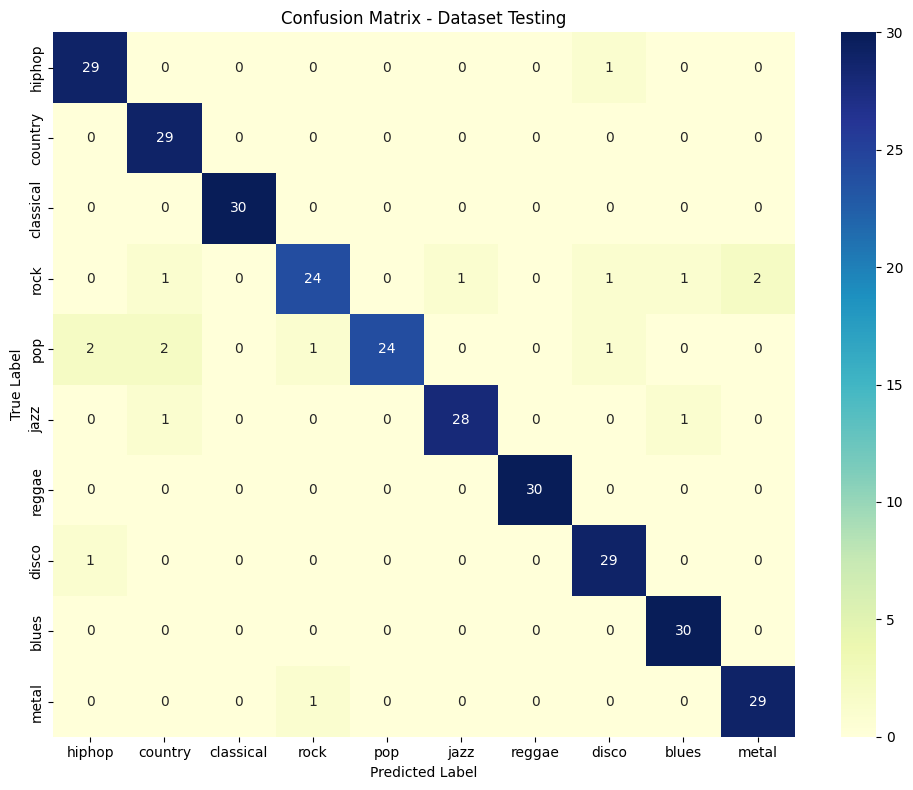

In [7]:
import os
import json
import numpy as np
import librosa
import matplotlib.pyplot as plt
import seaborn as sns

from tensorflow.keras.models import load_model
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

from multiprocessing import Pool

# === Fungsi Preprocessing Langsung di Notebook ===
def process_segment(args):
    segment, sr, n_mfcc, n_fft, hop_length = args
    mfcc = librosa.feature.mfcc(y=segment, sr=sr, n_mfcc=n_mfcc, n_fft=n_fft, hop_length=hop_length)
    delta = librosa.feature.delta(mfcc)
    delta2 = librosa.feature.delta(mfcc, order=2)
    mfcc_stack = np.stack([mfcc, delta, delta2], axis=0)
    return mfcc_stack.transpose(2, 1, 0)

def extract_features_segments(file_path, segment_duration=5, n_mfcc=13, n_fft=2048, hop_length=512):
    try:
        data, sr = librosa.load(file_path, sr=22050)
        segment_length = int(segment_duration * sr)

        segments = []
        for start in range(0, len(data), segment_length):
            end = start + segment_length
            if end > len(data):
                break
            segments.append(data[start:end])

        # Multiprocessing untuk efisiensi
        args_list = [(seg, sr, n_mfcc, n_fft, hop_length) for seg in segments]
        with Pool() as pool:
            features_list = pool.map(process_segment, args_list)

        return np.array(features_list)
    except Exception as e:
        print(f"[ERROR] Feature extraction failed: {e}")
        return None

# === Konfigurasi path ===
MODEL_PATH = "/content/drive/MyDrive/dataset/augmented_5seg_30drop_models/crnn_model_fold4.h5"
TEST_DIR = "/content/drive/MyDrive/dataset/testing/pelatihan"
GENRE_MAPPING_JSON = "/content/drive/MyDrive/dataset/segmented_audio_5s.json"

# === Parameter ekstraksi fitur ===
FIXED_TIME_STEPS = 216

# === Load mapping genre ===
with open(GENRE_MAPPING_JSON, "r") as f:
    train_data = json.load(f)

genre_to_label = {item['genre']: item['genre_label'] for item in train_data}
label_to_genre = {v: k for k, v in genre_to_label.items()}
NUM_CLASSES = len(label_to_genre)

# === Load model ===
model = load_model(MODEL_PATH)
print("✅ Model berhasil dimuat.")

# === Ekstraksi fitur dari folder testing ===
X_test, y_test = [], []

print("🔍 Memulai proses ekstraksi fitur dari folder testing...")

for genre in sorted(os.listdir(TEST_DIR)):
    genre_path = os.path.join(TEST_DIR, genre)

    if not os.path.isdir(genre_path) or genre not in genre_to_label:
        print(f"⚠️ Genre '{genre}' tidak dikenali atau bukan folder. Dilewati.")
        continue

    for filename in os.listdir(genre_path):
        if not filename.endswith(".wav"):
            continue

        file_path = os.path.join(genre_path, filename)

        try:
            segments = extract_features_segments(file_path)
            if segments is None or len(segments) == 0:
                print(f"⚠️ File {filename} tidak memiliki segment valid.")
                continue

            for segment in segments:
                # Sesuaikan dimensi time steps
                time_steps = segment.shape[0]
                if time_steps < FIXED_TIME_STEPS:
                    pad_width = FIXED_TIME_STEPS - time_steps
                    segment = np.pad(segment, ((0, pad_width), (0, 0), (0, 0)), mode='constant')
                elif time_steps > FIXED_TIME_STEPS:
                    segment = segment[:FIXED_TIME_STEPS, :, :]

                X_test.append(segment)
                y_test.append(genre_to_label[genre])

        except Exception as e:
            print(f"❌ Gagal memproses {filename}: {e}")

X_test = np.array(X_test)
y_test = np.array(y_test)

print(f"✅ Total segment yang diproses: {X_test.shape[0]}")

# === One-hot encode label ===
y_test_cat = to_categorical(y_test, num_classes=NUM_CLASSES)

# === Prediksi dengan model ===
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test_cat, axis=1)

# === Evaluasi ===
acc = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average="macro", zero_division=0)
recall = recall_score(y_true, y_pred, average="macro", zero_division=0)
f1 = f1_score(y_true, y_pred, average="macro", zero_division=0)

print("\n=== 📊 Evaluation Metrics ===")
print(f"Accuracy : {acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1-Score : {f1:.4f}")

# === Classification report ===
label_names = [label_to_genre[i] for i in range(NUM_CLASSES)]
print("\n=== 📝 Classification Report ===")
print(classification_report(y_true, y_pred, target_names=label_names, zero_division=0))

# === Confusion matrix ===
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='YlGnBu',
            xticklabels=label_names, yticklabels=label_names)
plt.title("Confusion Matrix - Dataset Testing")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()

### Data Musik tahun 80-90an

✅ Model berhasil dimuat.
🔍 Memulai proses ekstraksi fitur dari folder testing...
✅ Total segment yang diproses: 300
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step

=== 📊 Evaluation Metrics ===
Accuracy : 0.7633
Precision: 0.7759
Recall   : 0.7633
F1-Score : 0.7625

=== 📝 Classification Report ===
              precision    recall  f1-score   support

      hiphop       0.67      0.80      0.73        30
     country       0.88      0.93      0.90        30
   classical       0.97      0.97      0.97        30
        rock       0.66      0.70      0.68        30
         pop       0.67      0.73      0.70        30
        jazz       0.79      0.63      0.70        30
      reggae       0.68      0.87      0.76        30
       disco       0.69      0.73      0.71        30
       blues       0.81      0.57      0.67        30
       metal       0.95      0.70      0.81        30

    accuracy                           0.76       300
   macro avg       0.78      0.76      0.76       300
weigh

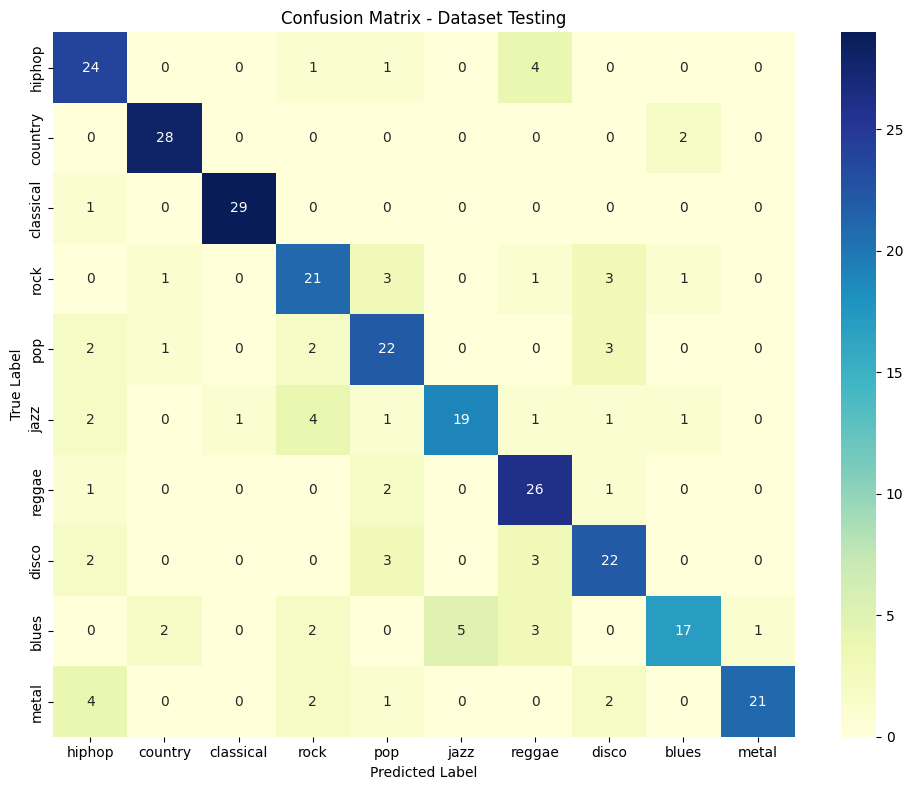

In [6]:
import os
import json
import numpy as np
import librosa
import matplotlib.pyplot as plt
import seaborn as sns

from tensorflow.keras.models import load_model
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

from multiprocessing import Pool

# === Fungsi Preprocessing Langsung di Notebook ===
def process_segment(args):
    segment, sr, n_mfcc, n_fft, hop_length = args
    mfcc = librosa.feature.mfcc(y=segment, sr=sr, n_mfcc=n_mfcc, n_fft=n_fft, hop_length=hop_length)
    delta = librosa.feature.delta(mfcc)
    delta2 = librosa.feature.delta(mfcc, order=2)
    mfcc_stack = np.stack([mfcc, delta, delta2], axis=0)
    return mfcc_stack.transpose(2, 1, 0)

def extract_features_segments(file_path, segment_duration=5, n_mfcc=13, n_fft=2048, hop_length=512):
    try:
        data, sr = librosa.load(file_path, sr=22050)
        segment_length = int(segment_duration * sr)

        segments = []
        for start in range(0, len(data), segment_length):
            end = start + segment_length
            if end > len(data):
                break
            segments.append(data[start:end])

        # Multiprocessing untuk efisiensi
        args_list = [(seg, sr, n_mfcc, n_fft, hop_length) for seg in segments]
        with Pool() as pool:
            features_list = pool.map(process_segment, args_list)

        return np.array(features_list)
    except Exception as e:
        print(f"[ERROR] Feature extraction failed: {e}")
        return None

# === Konfigurasi path ===
MODEL_PATH = "/content/drive/MyDrive/dataset/augmented_5seg_30drop_models/crnn_model_fold4.h5"
TEST_DIR = "/content/drive/MyDrive/dataset/testing/80-90an"
GENRE_MAPPING_JSON = "/content/drive/MyDrive/dataset/segmented_audio_5s.json"

# === Parameter ekstraksi fitur ===
FIXED_TIME_STEPS = 216

# === Load mapping genre ===
with open(GENRE_MAPPING_JSON, "r") as f:
    train_data = json.load(f)

genre_to_label = {item['genre']: item['genre_label'] for item in train_data}
label_to_genre = {v: k for k, v in genre_to_label.items()}
NUM_CLASSES = len(label_to_genre)

# === Load model ===
model = load_model(MODEL_PATH)
print("✅ Model berhasil dimuat.")

# === Ekstraksi fitur dari folder testing ===
X_test, y_test = [], []

print("🔍 Memulai proses ekstraksi fitur dari folder testing...")

for genre in sorted(os.listdir(TEST_DIR)):
    genre_path = os.path.join(TEST_DIR, genre)

    if not os.path.isdir(genre_path) or genre not in genre_to_label:
        print(f"⚠️ Genre '{genre}' tidak dikenali atau bukan folder. Dilewati.")
        continue

    for filename in os.listdir(genre_path):
        if not filename.endswith(".wav"):
            continue

        file_path = os.path.join(genre_path, filename)

        try:
            segments = extract_features_segments(file_path)
            if segments is None or len(segments) == 0:
                print(f"⚠️ File {filename} tidak memiliki segment valid.")
                continue

            for segment in segments:
                # Sesuaikan dimensi time steps
                time_steps = segment.shape[0]
                if time_steps < FIXED_TIME_STEPS:
                    pad_width = FIXED_TIME_STEPS - time_steps
                    segment = np.pad(segment, ((0, pad_width), (0, 0), (0, 0)), mode='constant')
                elif time_steps > FIXED_TIME_STEPS:
                    segment = segment[:FIXED_TIME_STEPS, :, :]

                X_test.append(segment)
                y_test.append(genre_to_label[genre])

        except Exception as e:
            print(f"❌ Gagal memproses {filename}: {e}")

X_test = np.array(X_test)
y_test = np.array(y_test)

print(f"✅ Total segment yang diproses: {X_test.shape[0]}")

# === One-hot encode label ===
y_test_cat = to_categorical(y_test, num_classes=NUM_CLASSES)

# === Prediksi dengan model ===
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test_cat, axis=1)

# === Evaluasi ===
acc = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average="macro", zero_division=0)
recall = recall_score(y_true, y_pred, average="macro", zero_division=0)
f1 = f1_score(y_true, y_pred, average="macro", zero_division=0)

print("\n=== 📊 Evaluation Metrics ===")
print(f"Accuracy : {acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1-Score : {f1:.4f}")

# === Classification report ===
label_names = [label_to_genre[i] for i in range(NUM_CLASSES)]
print("\n=== 📝 Classification Report ===")
print(classification_report(y_true, y_pred, target_names=label_names, zero_division=0))

# === Confusion matrix ===
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='YlGnBu',
            xticklabels=label_names, yticklabels=label_names)
plt.title("Confusion Matrix - Dataset Testing")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()

### Data Musik tahun 2000-10an